In [288]:
import pandas
from pandas import read_excel, date_range, DatetimeIndex, DataFrame, to_numeric, concat, to_datetime
from pandas.plotting import lag_plot, autocorrelation_plot
from pandas.tseries.offsets import DateOffset

import numpy
from numpy import logical_not

import statistics
import dateutil.relativedelta

import fbprophet
from fbprophet import Prophet
# from prophet import Prophet

import calendar
from calendar import monthrange

from datetime import datetime, timedelta
from matplotlib import pyplot

from sklearn.metrics import mean_absolute_error, mean_squared_error

from math import sqrt

In [289]:
# cambiamos el valor de estos 4 parametros para que nos muestre dataframes sin truncarlos
pandas.set_option('display.max_rows', 12)
pandas.set_option('display.max_columns', None)
pandas.set_option('display.width', None)
pandas.set_option('display.max_colwidth', None)

In [290]:
# Load data using read_excel
transacciones_df = read_excel('20210513 mmelero (249236).xlsx', sheet_name='Hoja1')
transacciones_df

,Fecha transacción,Importe,ID Categoría,Nombre categoría,Nivel categoría,iD categoría padre,Nombre categoría padre,Proveedor,Marca,Sector,Financiero,Transferencia,Unnamed: 12,Unnamed: 13,ID,BALANCE,BALANCE_DATE
0,2020-07-24,-1.20,84.0,parking_84,2.0,5.0,vehiculos_5,NaN,NaN,NaN,False,False,NaN,NaN,249236.0,1478.98,2020-07-26
1,2020-07-23,-4.50,117.0,regalos_celebraciones_117,2.0,8.0,gastos_personales_8,NaN,NaN,NaN,False,False,NaN,NaN,NaN,NaN,NaT
2,2020-07-23,-13.53,70.0,supermercados_70,2.0,4.0,alimentacion_4,SPAR,SPAR,Supermercados,False,False,NaN,NaN,NaN,NaN,NaT
3,2020-07-22,-51.40,222.0,adsl_222,3.0,521.0,Comunicaciones y TV,Jazz Telecom,Jazztel,Compañías telecomunicaciones,False,False,NaN,NaN,NaN,NaN,NaT
4,2020-07-22,-11.00,70.0,supermercados_70,2.0,4.0,alimentacion_4,Mercadona,Mercadona,Supermercados,False,False,NaN,NaN,NaN,NaN,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1482,2016-09-05,1533.02,18.0,retribucion_liquida_18,3.0,576.0,Nómina,NaN,NaN,NaN,False,False,NaN,NaN,NaN,NaN,NaT
1483,2016-09-05,-617.47,126.0,liquidacion_tarjeta_126,3.0,478.0,tarjetas_credito_478,NaN,NaN,NaN,True,True,NaN,NaN,NaN,NaN,NaT
1484,2016-09-05,-138.08,125.0,cuotas_125,3.0,127.0,otros_pasivos_127,NaN,NaN,NaN,True,False,NaN,NaN,NaN,NaN,NaT
1485,2016-09-01,-32.22,90.0,seguro_salud_90,2.0,6.0,salud_6,Sanitas S.A. de Seguros,Sanitas,Seguros de salud,True,False,NaN,NaN,NaN,NaN,NaT


In [291]:
# nos quedamos con categoría desde 'Fecha transacción' hasta 'Nombre Categoría'
transacciones_df=transacciones_df.iloc[:, 0:4]
transacciones_df

,Fecha transacción,Importe,ID Categoría,Nombre categoría
0,2020-07-24,-1.20,84.0,parking_84
1,2020-07-23,-4.50,117.0,regalos_celebraciones_117
2,2020-07-23,-13.53,70.0,supermercados_70
3,2020-07-22,-51.40,222.0,adsl_222
4,2020-07-22,-11.00,70.0,supermercados_70
...,...,...,...,...
1482,2016-09-05,1533.02,18.0,retribucion_liquida_18
1483,2016-09-05,-617.47,126.0,liquidacion_tarjeta_126
1484,2016-09-05,-138.08,125.0,cuotas_125
1485,2016-09-01,-32.22,90.0,seguro_salud_90


In [292]:
# nos quedamos con las transacciones de la categoria 'liquidacion_tarjeta_126'
transacciones_126_df = transacciones_df[transacciones_df['ID Categoría'] == 126.0]
del transacciones_df
transacciones_126_df

,Fecha transacción,Importe,ID Categoría,Nombre categoría
34,2020-07-06,-150.65,126.0,liquidacion_tarjeta_126
80,2020-06-02,-283.81,126.0,liquidacion_tarjeta_126
84,2020-06-01,-114.54,126.0,liquidacion_tarjeta_126
126,2020-05-06,-101.16,126.0,liquidacion_tarjeta_126
132,2020-05-04,-534.31,126.0,liquidacion_tarjeta_126
...,...,...,...,...
1329,2017-01-02,-777.19,126.0,liquidacion_tarjeta_126
1375,2016-12-07,-274.73,126.0,liquidacion_tarjeta_126
1430,2016-11-02,-595.11,126.0,liquidacion_tarjeta_126
1470,2016-10-04,-644.29,126.0,liquidacion_tarjeta_126


In [293]:
# quitamos las columnas de 'ID Categoría' y 'Nombre Categoría' que ya no nos aportan nada
transacciones_126_df = transacciones_126_df.drop(columns=['ID Categoría', 'Nombre categoría'], inplace=False)
transacciones_126_df

,Fecha transacción,Importe
34,2020-07-06,-150.65
80,2020-06-02,-283.81
84,2020-06-01,-114.54
126,2020-05-06,-101.16
132,2020-05-04,-534.31
...,...,...
1329,2017-01-02,-777.19
1375,2016-12-07,-274.73
1430,2016-11-02,-595.11
1470,2016-10-04,-644.29


In [294]:
# renombramos columnas
transacciones_126_df = transacciones_126_df.rename(columns={'Fecha transacción': 'FECHA', 'Importe': 'IMPORTE'},
                                                   inplace=False)
transacciones_126_df

,FECHA,IMPORTE
34,2020-07-06,-150.65
80,2020-06-02,-283.81
84,2020-06-01,-114.54
126,2020-05-06,-101.16
132,2020-05-04,-534.31
...,...,...
1329,2017-01-02,-777.19
1375,2016-12-07,-274.73
1430,2016-11-02,-595.11
1470,2016-10-04,-644.29


In [295]:
# ordenamos las fechas por orden ascendente
transacciones_126_df = transacciones_126_df.sort_values(by=['FECHA'], ascending=True, inplace=False, ignore_index=True)
transacciones_126_df

,FECHA,IMPORTE
0,2016-09-05,-617.47
1,2016-10-04,-644.29
2,2016-11-02,-595.11
3,2016-12-07,-274.73
4,2017-01-02,-777.19
...,...,...
38,2020-05-04,-534.31
39,2020-05-06,-101.16
40,2020-06-01,-114.54
41,2020-06-02,-283.81


In [296]:
# vamos a agrupar los valores y sumarlos por fecha para agrupar cargos distintos realizados el mismo dia
transacciones_126_df = transacciones_126_df.groupby(['FECHA']).sum()
transacciones_126_df

,IMPORTE
FECHA,
2016-09-05,-617.47
2016-10-04,-644.29
2016-11-02,-595.11
2016-12-07,-274.73
2017-01-02,-777.19
...,...
2020-05-04,-534.31
2020-05-06,-101.16
2020-06-01,-114.54


In [297]:
# para que los datos sean más fáciles de interpretar vamos a hacerlos todos positivos multiplicándolos por '-1'
transacciones_126_df['IMPORTE'] = -transacciones_126_df['IMPORTE']
transacciones_126_df

,IMPORTE
FECHA,
2016-09-05,617.47
2016-10-04,644.29
2016-11-02,595.11
2016-12-07,274.73
2017-01-02,777.19
...,...
2020-05-04,534.31
2020-05-06,101.16
2020-06-01,114.54


In [298]:
# A continuacion vamos a hacer el estudio de la serie temporal

In [299]:
# Time Series Data Visualization with Python
# https://machinelearningmastery.com/time-series-data-visualization-with-python/

In [300]:
# 1. Time Series Line Plot

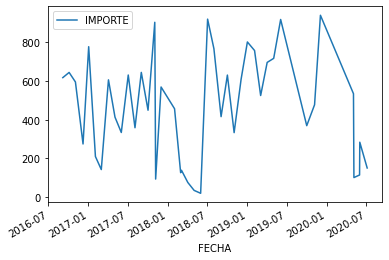

In [301]:
transacciones_126_df.plot()
pyplot.show()

In [302]:
"""
nos sale una serie temporal muy irregular y probablemente sea muy dificil de estimar su siguiente valor
"""

'\nnos sale una serie temporal muy irregular y probablemente sea muy dificil de estimar su siguiente valor\n'

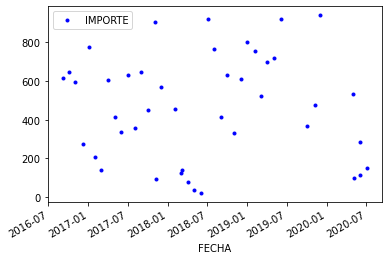

In [303]:
transacciones_126_df.plot(style='b.')
pyplot.show()

In [304]:
# 2. Time Series Histogram and Density Plots

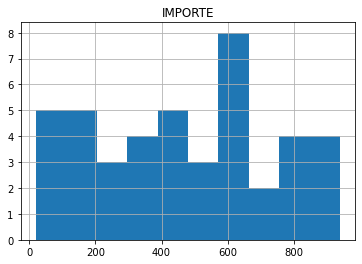

In [305]:
transacciones_126_df.hist()
pyplot.show()

In [306]:
"""
Vemos que es una distribucion relativamente uniforme:
mean = 469.21 eur
std = 271.59 eur

q1 = 242.36 eur
q2 = 477.22 eur
stat_mode = 617.47 eur
q3 = 644.39 eur

min = 19.9 eur ==> la distribución no tiene observaciones negativas
max = 939.62 eur
"""

'\nVemos que es una distribucion relativamente uniforme:\nmean = 469.21 eur\nstd = 271.59 eur\n\nq1 = 242.36 eur\nq2 = 477.22 eur\nstat_mode = 617.47 eur\nq3 = 644.39 eur\n\nmin = 19.9 eur ==> la distribución no tiene observaciones negativas\nmax = 939.62 eur\n'

In [307]:
transacciones_126_df.describe()

,IMPORTE
count,43.000000
mean,469.219767
std,271.598336
min,19.900000
25%,242.360000
50%,477.220000
75%,644.390000
max,939.620000


In [308]:
# calculamos la moda
stat_mode = statistics.mode(transacciones_126_df['IMPORTE'])
stat_mode

617.47

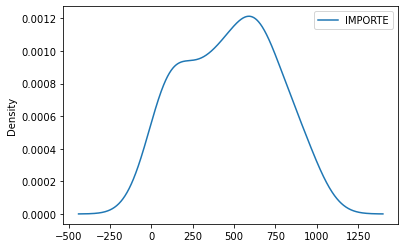

In [309]:
transacciones_126_df.plot(kind='kde')
pyplot.show()

In [310]:
"""
El diagrama de densidad nos confirma las conclusiones del histograma
"""

'\nEl diagrama de densidad nos confirma las conclusiones del histograma\n'

In [311]:
# 3. Time Series Box and Whisker Plots by Interval

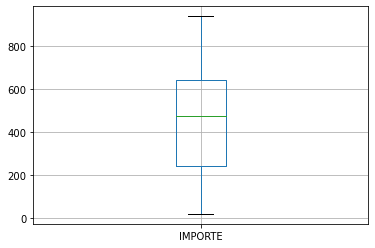

In [312]:
transacciones_126_df.boxplot()
pyplot.show()

In [313]:
"""
Vemos que el boxplot no muestra outliers.

q1 - 1.5*iqr = 242.36 - 1.5*(644.39 - 242.36) = -360.68 eur
q3 + 1.5*iqr = 644.39 + 1.5*(644.39 - 242.36) = 1247.35 eur
"""

'\nVemos que el boxplot no muestra outliers.\n\nq1 - 1.5*iqr = 242.36 - 1.5*(644.39 - 242.36) = -360.68 eur\nq3 + 1.5*iqr = 644.39 + 1.5*(644.39 - 242.36) = 1247.35 eur\n'

In [314]:
# 4. Time Series Heat Maps

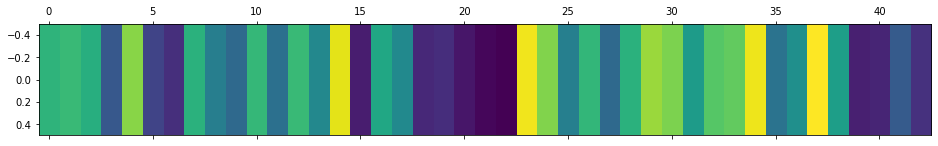

In [315]:
pyplot.matshow(transacciones_126_df.T, interpolation=None, aspect='auto')
pyplot.show()

In [316]:
"""
El mapa de color nos confirma la gran variabilidad en los valores que toma la distribución que ya vimos en el gráfico de la
serie temporal.
"""

'\nEl mapa de color nos confirma la gran variabilidad en los valores que toma la distribución que ya vimos en el gráfico de la\nserie temporal.\n'

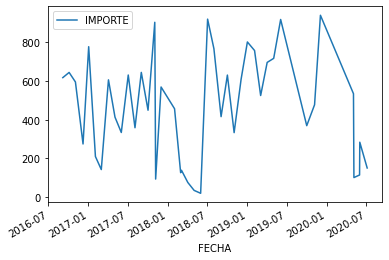

In [317]:
transacciones_126_df.plot()
pyplot.show()

In [318]:
# 5. Time Series Lag Scatter Plots

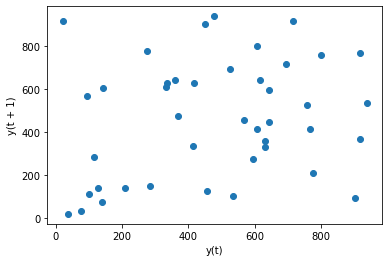

In [319]:
lag_plot(transacciones_126_df)
pyplot.show()

In [320]:
"""
Hay mucha dispersion en los datos del scatter plot con lo que no parece que formen una diagonal lo cual indica que no
hay una gran correlacion entre y(t+1) e y(t)
"""

'\nHay mucha dispersion en los datos del scatter plot con lo que no parece que formen una diagonal lo cual indica que no\nhay una gran correlacion entre y(t+1) e y(t)\n'

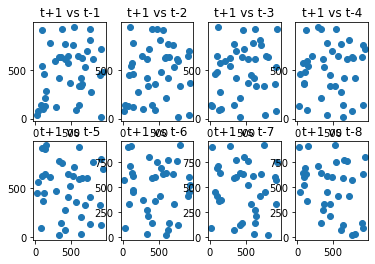

In [321]:
values = DataFrame(transacciones_126_df.values)
lags = 8
columns = [values]
for i in range(1,(lags + 1)):
	columns.append(values.shift(i))
dataframe = concat(columns, axis=1)
columns = ['t+1']
for i in range(1,(lags + 1)):
	columns.append('t-' + str(i))
dataframe.columns = columns
pyplot.figure(1)
for i in range(1,(lags + 1)):
	ax = pyplot.subplot(240 + i)
	ax.set_title('t+1 vs t-' + str(i))
	pyplot.scatter(x=dataframe['t+1'].values, y=dataframe['t-'+str(i)].values)
pyplot.show()

In [322]:
"""
Como antes, hay mucha dispersion en los datos del scatter plot de y(t+1) con lo que no parece que formen una diagonal lo cual
indica que no hay una gran correlacion entre y(t+1) y sus 8 primeros lags anteriores
"""

'\nComo antes, hay mucha dispersion en los datos del scatter plot de y(t+1) con lo que no parece que formen una diagonal lo cual\nindica que no hay una gran correlacion entre y(t+1) y sus 8 primeros lags anteriores\n'

t+1 vs t-1


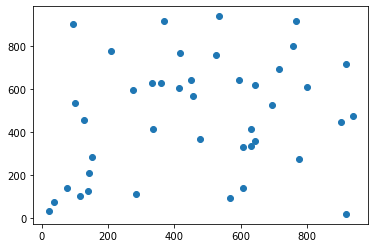

t+1 vs t-2


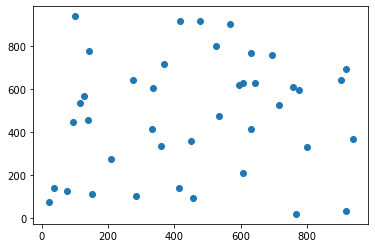

t+1 vs t-3


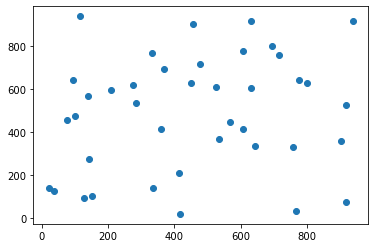

t+1 vs t-4


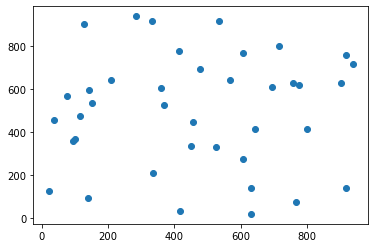

t+1 vs t-5


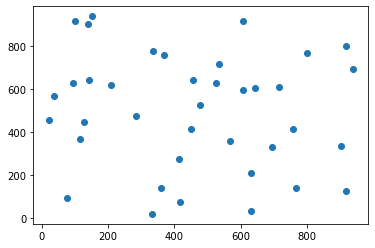

t+1 vs t-6


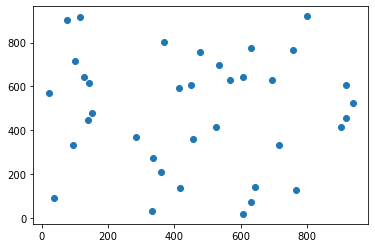

t+1 vs t-7


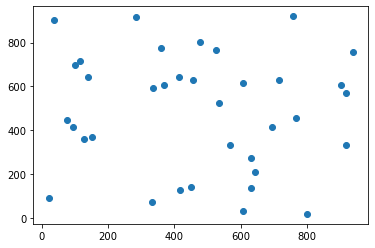

t+1 vs t-8


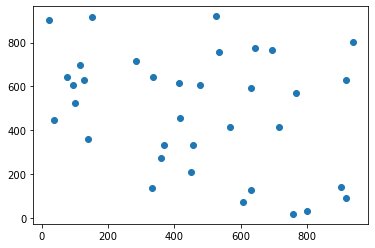

t+1 vs t-9


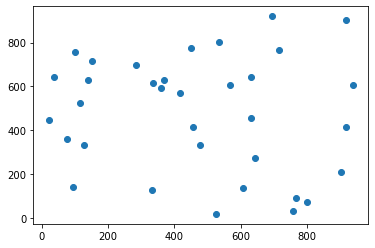

t+1 vs t-10


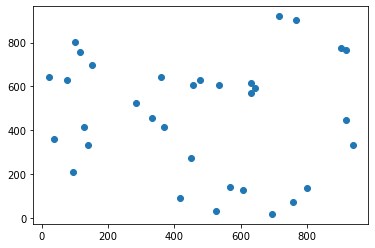

t+1 vs t-11


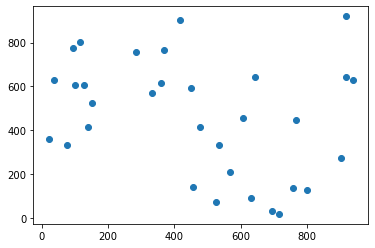

t+1 vs t-12


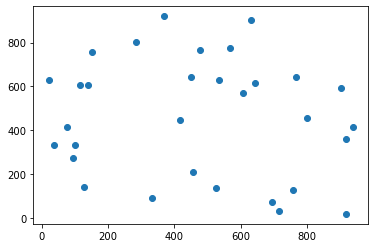

t+1 vs t-13


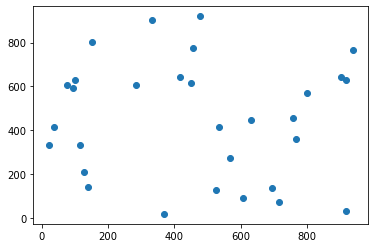

t+1 vs t-14


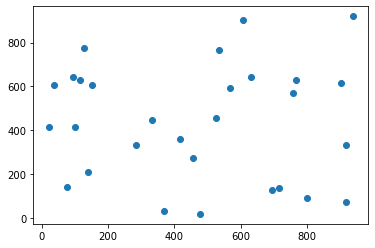

t+1 vs t-15


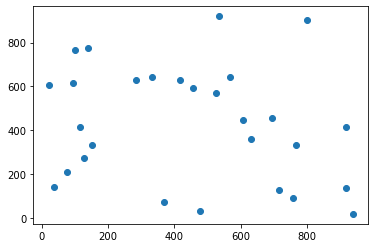

t+1 vs t-16


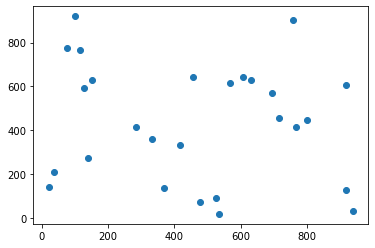

t+1 vs t-17


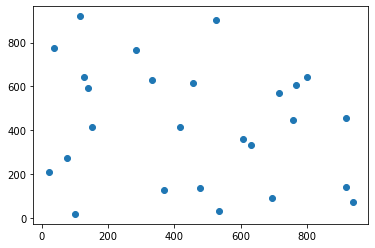

t+1 vs t-18


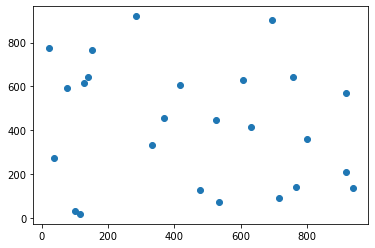

t+1 vs t-19


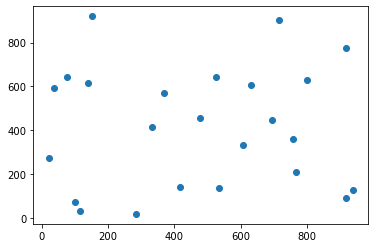

t+1 vs t-20


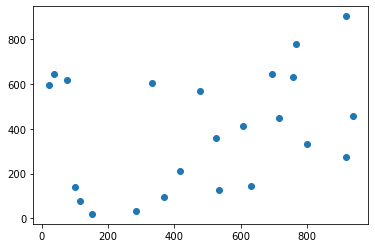

t+1 vs t-21


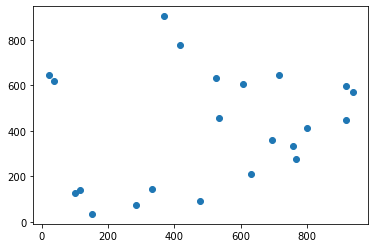

t+1 vs t-22


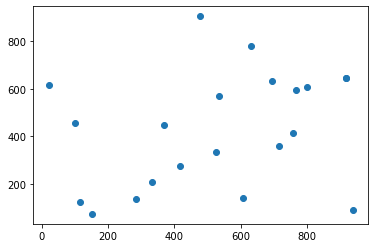

t+1 vs t-23


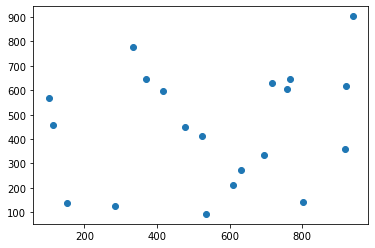

t+1 vs t-24


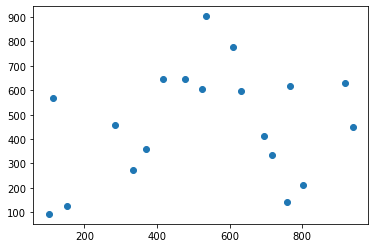

t+1 vs t-25


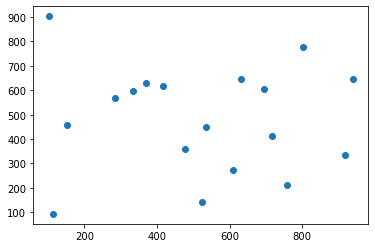

t+1 vs t-26


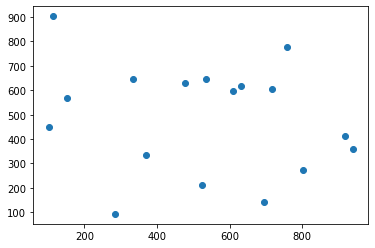

t+1 vs t-27


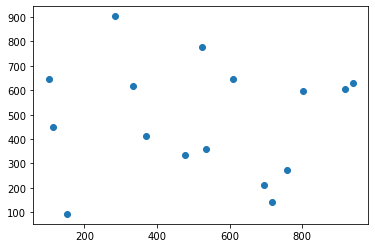

t+1 vs t-28


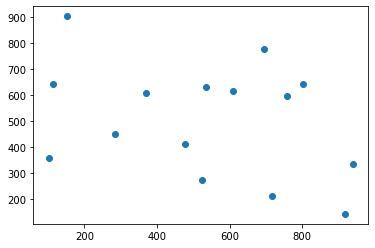

t+1 vs t-29


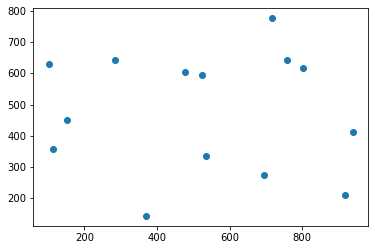

t+1 vs t-30


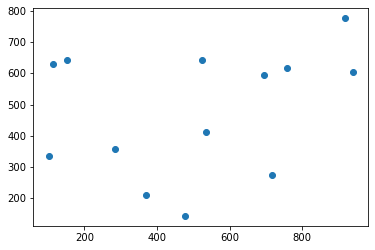

t+1 vs t-31


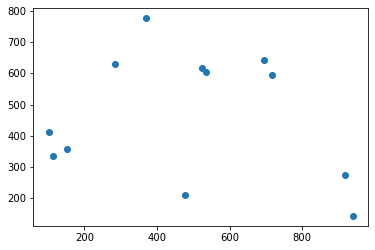

t+1 vs t-32


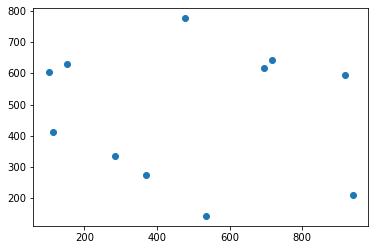

t+1 vs t-33


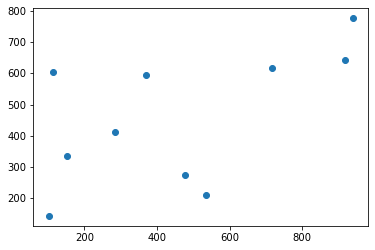

t+1 vs t-34


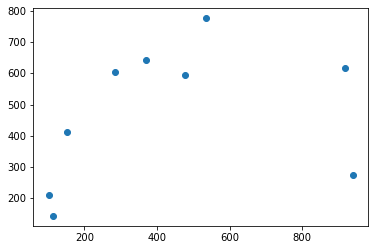

t+1 vs t-35


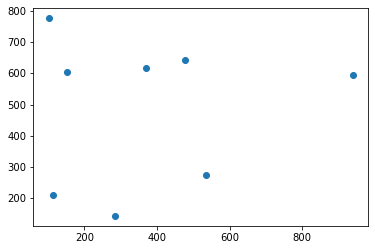

t+1 vs t-36


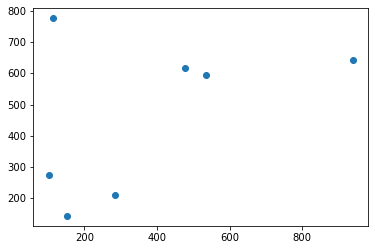

t+1 vs t-37


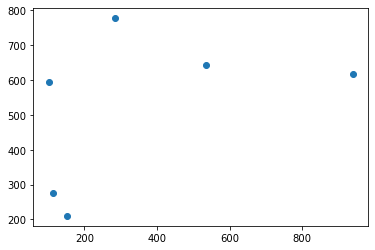

t+1 vs t-38


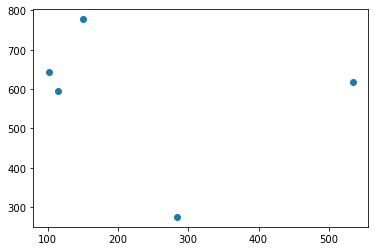

t+1 vs t-39


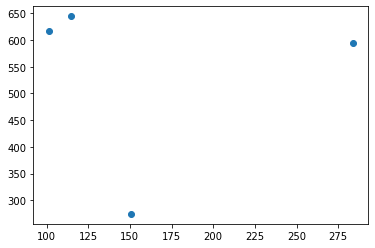

t+1 vs t-40


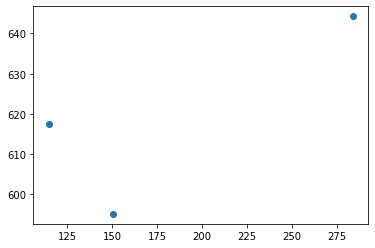

t+1 vs t-41


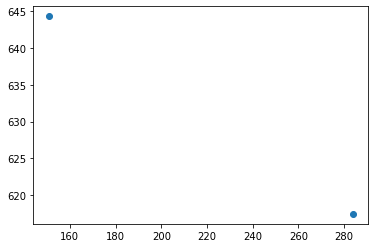

t+1 vs t-42


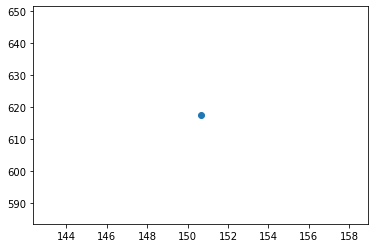

t+1 vs t-43


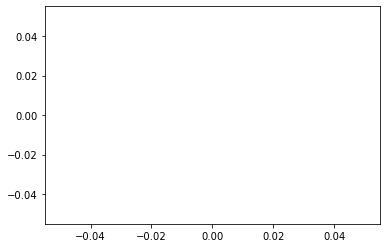

In [323]:
values = DataFrame(transacciones_126_df.values)
lags = transacciones_126_df.size
columns = [values]
for i in range(1,(lags + 1)):
	columns.append(values.shift(i))
dataframe = concat(columns, axis=1)
columns = ['t+1']
for i in range(1,(lags + 1)):
	columns.append('t-' + str(i))
dataframe.columns = columns
for i in range(1,(lags + 1)):
	print('t+1 vs t-' + str(i))
	pyplot.scatter(x=dataframe['t+1'].values, y=dataframe['t-'+str(i)].values)
	pyplot.show()

In [324]:
"""
Al igual que con sus 8 primeros lags anteriores, no podemos encontrar correlacion significativa entre y(t+1) y ninguno de sus
41 lags anteriores.
"""

'\nAl igual que con sus 8 primeros lags anteriores, no podemos encontrar correlacion significativa entre y(t+1) y ninguno de sus\n41 lags anteriores.\n'

In [325]:
# 6. Time Series Autocorrelation Plots

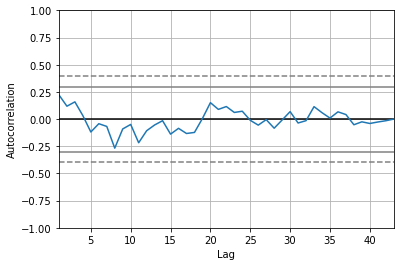

In [326]:
autocorrelation_plot(transacciones_126_df)
pyplot.show()

In [327]:
"""
El grafico de autocorrelacion nos confirma los hallazgos anteriores.
No hay correlación significativa entre y(t+1) y ninguno de sus lags anteriores.

CONCLUSION: esta serie temporal no es modelable tal y como está planteada.
"""

'\nEl grafico de autocorrelacion nos confirma los hallazgos anteriores.\nNo hay correlación significativa entre y(t+1) y ninguno de sus lags anteriores.\n\nCONCLUSION: esta serie temporal no es modelable tal y como está planteada.\n'

In [328]:
# Al igual que hicimos en el caso de la serie temporal del seguro medico, vamos a rellenar las missing dates con el 
# ultimo valor válido y comprobar si esa serie temporal es modelable y predecible

In [329]:
# Load data using read_excel
transacciones_df = read_excel('20210513 mmelero (249236).xlsx', sheet_name='Hoja1')
transacciones_df

,Fecha transacción,Importe,ID Categoría,Nombre categoría,Nivel categoría,iD categoría padre,Nombre categoría padre,Proveedor,Marca,Sector,Financiero,Transferencia,Unnamed: 12,Unnamed: 13,ID,BALANCE,BALANCE_DATE
0,2020-07-24,-1.20,84.0,parking_84,2.0,5.0,vehiculos_5,NaN,NaN,NaN,False,False,NaN,NaN,249236.0,1478.98,2020-07-26
1,2020-07-23,-4.50,117.0,regalos_celebraciones_117,2.0,8.0,gastos_personales_8,NaN,NaN,NaN,False,False,NaN,NaN,NaN,NaN,NaT
2,2020-07-23,-13.53,70.0,supermercados_70,2.0,4.0,alimentacion_4,SPAR,SPAR,Supermercados,False,False,NaN,NaN,NaN,NaN,NaT
3,2020-07-22,-51.40,222.0,adsl_222,3.0,521.0,Comunicaciones y TV,Jazz Telecom,Jazztel,Compañías telecomunicaciones,False,False,NaN,NaN,NaN,NaN,NaT
4,2020-07-22,-11.00,70.0,supermercados_70,2.0,4.0,alimentacion_4,Mercadona,Mercadona,Supermercados,False,False,NaN,NaN,NaN,NaN,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1482,2016-09-05,1533.02,18.0,retribucion_liquida_18,3.0,576.0,Nómina,NaN,NaN,NaN,False,False,NaN,NaN,NaN,NaN,NaT
1483,2016-09-05,-617.47,126.0,liquidacion_tarjeta_126,3.0,478.0,tarjetas_credito_478,NaN,NaN,NaN,True,True,NaN,NaN,NaN,NaN,NaT
1484,2016-09-05,-138.08,125.0,cuotas_125,3.0,127.0,otros_pasivos_127,NaN,NaN,NaN,True,False,NaN,NaN,NaN,NaN,NaT
1485,2016-09-01,-32.22,90.0,seguro_salud_90,2.0,6.0,salud_6,Sanitas S.A. de Seguros,Sanitas,Seguros de salud,True,False,NaN,NaN,NaN,NaN,NaT


In [330]:
# nos quedamos con categoria desde 'Fecha transacción' hasta 'Nombre Categoría'
transacciones_df = transacciones_df.iloc[:,0:4]
transacciones_df

,Fecha transacción,Importe,ID Categoría,Nombre categoría
0,2020-07-24,-1.20,84.0,parking_84
1,2020-07-23,-4.50,117.0,regalos_celebraciones_117
2,2020-07-23,-13.53,70.0,supermercados_70
3,2020-07-22,-51.40,222.0,adsl_222
4,2020-07-22,-11.00,70.0,supermercados_70
...,...,...,...,...
1482,2016-09-05,1533.02,18.0,retribucion_liquida_18
1483,2016-09-05,-617.47,126.0,liquidacion_tarjeta_126
1484,2016-09-05,-138.08,125.0,cuotas_125
1485,2016-09-01,-32.22,90.0,seguro_salud_90


In [331]:
# nos quedamos con las transacciones de la categoria 'liquidacion_tarjeta_126'
transacciones_126_df = transacciones_df[transacciones_df['ID Categoría'] == 126.0]
del(transacciones_df)
transacciones_126_df

,Fecha transacción,Importe,ID Categoría,Nombre categoría
34,2020-07-06,-150.65,126.0,liquidacion_tarjeta_126
80,2020-06-02,-283.81,126.0,liquidacion_tarjeta_126
84,2020-06-01,-114.54,126.0,liquidacion_tarjeta_126
126,2020-05-06,-101.16,126.0,liquidacion_tarjeta_126
132,2020-05-04,-534.31,126.0,liquidacion_tarjeta_126
...,...,...,...,...
1329,2017-01-02,-777.19,126.0,liquidacion_tarjeta_126
1375,2016-12-07,-274.73,126.0,liquidacion_tarjeta_126
1430,2016-11-02,-595.11,126.0,liquidacion_tarjeta_126
1470,2016-10-04,-644.29,126.0,liquidacion_tarjeta_126


In [332]:
# quitamos las columnas de 'ID Categoría' y 'Nombre Categoría' que ya no nos aportan nada
transacciones_126_df = transacciones_126_df.drop(columns=['ID Categoría', 'Nombre categoría'], inplace=False)
transacciones_126_df

,Fecha transacción,Importe
34,2020-07-06,-150.65
80,2020-06-02,-283.81
84,2020-06-01,-114.54
126,2020-05-06,-101.16
132,2020-05-04,-534.31
...,...,...
1329,2017-01-02,-777.19
1375,2016-12-07,-274.73
1430,2016-11-02,-595.11
1470,2016-10-04,-644.29


In [333]:
# renombramos columnas
transacciones_126_df = transacciones_126_df.rename(columns={'Fecha transacción': 'FECHA', 'Importe': 'IMPORTE'}, inplace=False)
transacciones_126_df

,FECHA,IMPORTE
34,2020-07-06,-150.65
80,2020-06-02,-283.81
84,2020-06-01,-114.54
126,2020-05-06,-101.16
132,2020-05-04,-534.31
...,...,...
1329,2017-01-02,-777.19
1375,2016-12-07,-274.73
1430,2016-11-02,-595.11
1470,2016-10-04,-644.29


In [334]:
# ordenamos las fechas por orden ascendente
transacciones_126_df = transacciones_126_df.sort_values(by=['FECHA'], ascending=True, inplace=False, ignore_index=True)
transacciones_126_df

,FECHA,IMPORTE
0,2016-09-05,-617.47
1,2016-10-04,-644.29
2,2016-11-02,-595.11
3,2016-12-07,-274.73
4,2017-01-02,-777.19
...,...,...
38,2020-05-04,-534.31
39,2020-05-06,-101.16
40,2020-06-01,-114.54
41,2020-06-02,-283.81


In [335]:
# vamos a agrupar los valores y sumarlos por fecha para agrupar cargos distintos realizados el mismo dia
transacciones_126_df = transacciones_126_df.groupby(['FECHA']).sum()
transacciones_126_df

,IMPORTE
FECHA,
2016-09-05,-617.47
2016-10-04,-644.29
2016-11-02,-595.11
2016-12-07,-274.73
2017-01-02,-777.19
...,...
2020-05-04,-534.31
2020-05-06,-101.16
2020-06-01,-114.54


In [336]:
# para que los datos sean más fáciles de interpretar vamos a hacerlos todos positivos multiplicandolos por '-1'
transacciones_126_df['IMPORTE'] = -transacciones_126_df['IMPORTE']
transacciones_126_df

,IMPORTE
FECHA,
2016-09-05,617.47
2016-10-04,644.29
2016-11-02,595.11
2016-12-07,274.73
2017-01-02,777.19
...,...
2020-05-04,534.31
2020-05-06,101.16
2020-06-01,114.54


In [337]:
# HACEMOS EL DATAFRAME DEL DIA DE PAGO DE LA TARJETA

In [338]:
transacciones_126_df_dia = transacciones_126_df.copy()
transacciones_126_df_dia

,IMPORTE
FECHA,
2016-09-05,617.47
2016-10-04,644.29
2016-11-02,595.11
2016-12-07,274.73
2017-01-02,777.19
...,...
2020-05-04,534.31
2020-05-06,101.16
2020-06-01,114.54


In [339]:
# hacemos una columna con la fecha a partir del índice
transacciones_126_df_dia['FECHA'] = transacciones_126_df_dia.index
transacciones_126_df_dia

,IMPORTE,FECHA
FECHA,,
2016-09-05,617.47,2016-09-05
2016-10-04,644.29,2016-10-04
2016-11-02,595.11,2016-11-02
2016-12-07,274.73,2016-12-07
2017-01-02,777.19,2017-01-02
...,...,...
2020-05-04,534.31,2020-05-04
2020-05-06,101.16,2020-05-06
2020-06-01,114.54,2020-06-01


In [340]:
# hacemos una columna con el dia a partir de la columna de la fecha
transacciones_126_df_dia['DIA'] = transacciones_126_df_dia['FECHA'].dt.day
transacciones_126_df_dia

,IMPORTE,FECHA,DIA
FECHA,,,
2016-09-05,617.47,2016-09-05,5
2016-10-04,644.29,2016-10-04,4
2016-11-02,595.11,2016-11-02,2
2016-12-07,274.73,2016-12-07,7
2017-01-02,777.19,2017-01-02,2
...,...,...,...
2020-05-04,534.31,2020-05-04,4
2020-05-06,101.16,2020-05-06,6
2020-06-01,114.54,2020-06-01,1


In [341]:
# !!! este calculo no ira en produccion
transacciones_126_df_dia['DIA'].describe()

count    43.000000
mean      2.976744
std       1.697174
min       1.000000
25%       2.000000
50%       3.000000
75%       4.000000
max       7.000000
Name: DIA, dtype: float64

In [342]:
# calculamos la moda - tomaremos la moda como el dia de cobro mas habitual
stat_mode_dist = statistics.mode(transacciones_126_df_dia['DIA'])
stat_mode_dist

2

In [343]:
"""
Vemos que el 75% de las transacciones ocurren entre el dia 1 y 4 de cada mes; como máximo el dia 7 y como minimo el 1.
mean = 2.97
std = 1.69
iqr_dist = 2

También vemos que esta distribucion no va a tener outliers puesto que max y min estan dentro del intervalo definido por los dos
siguientes calculos:
q3 + 1.5*iqr = 4 + 1.5*2 = 7
q1 - 1.5*iqr = 2 - 1.5*2 = -1
"""

'\nVemos que el 75% de las transacciones ocurren entre el dia 1 y 4 de cada mes; como máximo el dia 7 y como minimo el 1.\nmean = 2.97\nstd = 1.69\niqr_dist = 2\n\nTambién vemos que esta distribucion no va a tener outliers puesto que max y min estan dentro del intervalo definido por los dos\nsiguientes calculos:\nq3 + 1.5*iqr = 4 + 1.5*2 = 7\nq1 - 1.5*iqr = 2 - 1.5*2 = -1\n'

In [344]:
# extraemos el 1er cuartil
quartil1_dist = int(transacciones_126_df_dia.describe().loc['25%']['DIA'])
quartil1_dist

2

In [345]:
# extraemos el 3er cuartil
quartil3_dist = int(transacciones_126_df_dia.describe().loc['75%']['DIA'])
quartil3_dist

4

In [346]:
# calculamos el rango intercuartílico
iqr_dist = quartil3_dist - quartil1_dist
iqr_dist

2

In [347]:
# calculo de iqr: si NO pasan recibo a FIN DE MES
if stat_mode_dist < 28:    
    iqr = iqr_dist
# calculo de iqr: si SÍ pasan recibo a FIN DE MES
else:
    # si quartil3_dist - quartil1_dist es mayor a 4 dias
    if iqr_dist > 4:
        iqr = 4
    else:
        iqr = iqr_dist
iqr

2

In [348]:
# pedimos al usuario la fecha (en producción tomamos la fecha del sistema)
year = input('year: ')
month = input('month: ')
day = input('day: ')

year: 2019
month: 12
day: 31


In [187]:
# pasamos la fecha a string
current_date_str = year + '-' + month + '-' + day
current_date_str

'2019-12-31'

In [188]:
# pasamos la fecha al formato datetime
current_date_obj = datetime.strptime(current_date_str, '%Y-%m-%d')
current_date_obj

datetime.datetime(2019, 12, 31, 0, 0)

In [189]:
# pasamos iqr a formato datetime
iqr_obj = timedelta(days=iqr)
iqr_obj

datetime.timedelta(days=2)

In [191]:
# sumamos 1 mes a current_date_obj ya que vamos a calcular fecha e importe del recibo al mes siguiente al que se lo 
# pedimos 
target_date_obj = current_date_obj + DateOffset(months=1)
target_date_obj

Timestamp('2020-01-31 00:00:00')

In [192]:
# calculamos quartil3_obj en función de current_date_obj, quartil3_dist y si pasan el recibo a FIN de MES o NO
# si SÍ pasan recibo a FIN de MES
if stat_mode_dist >= 28:
    # quartil3_obj sera el ultimo dia del mes de target_date_obj
    quartil3 = calendar.monthrange(target_date_obj.year, target_date_obj.month)[1]
    quartil3_str = str(target_date_obj.year) + '-' + str(target_date_obj.month) + '-' + str(quartil3)
# si NO pasan recibo a FIN de MES    
else:
    quartil3_str = str(target_date_obj.year) + '-' + str(target_date_obj.month) + '-' + str(quartil3_dist)

quartil3_str

'2020-1-4'

In [193]:
q3_obj = datetime.strptime(quartil3_str, '%Y-%m-%d')
q3_obj

datetime.datetime(2020, 1, 4, 0, 0)

In [194]:
q1_obj = q3_obj - iqr_obj
q1_obj

datetime.datetime(2020, 1, 2, 0, 0)

In [286]:
# para que el pycharm no de problemas
stat_mode_str = ''

In [195]:
# calculamos la moda con año, mes y dia
if (quartil3_dist - stat_mode_dist) >= 0:
    # print('la moda esta en el mismo mes y año q quartil3_dist')
    stat_mode_str = str(q3_obj.year) + '-' + str(q3_obj.month) + '-' + str(stat_mode_dist)
elif (stat_mode_dist - quartil1_dist) >= 0:
    # print('la moda esta en el mismo mes y año q quartil1_dist')
    stat_mode_str = str(q1_obj.year) + '-' + str(q1_obj.month) + '-' + str(stat_mode_dist)
else:
    print('hay un fallo con el calculo de la moda')
print(stat_mode_str)

2020-1-2


In [196]:
# pasamos la moda a formato obj
stat_mode_obj = datetime.strptime(stat_mode_str, '%Y-%m-%d')
stat_mode_obj

datetime.datetime(2020, 1, 2, 0, 0)

In [197]:
limInfRecibo_obj = stat_mode_obj - dateutil.relativedelta.relativedelta(months=3)
limInfRecibo_obj

datetime.datetime(2019, 10, 2, 0, 0)

In [198]:
num_recibos = 0

# barro desde 3 meses antes que la moda hasta el dia antes de la moda
for d in range(int((stat_mode_obj - limInfRecibo_obj).days)):
    # ESTA LINEA NO SE EJECUTA EN PRODUCCIÓN
    fecha_str = str((limInfRecibo_obj + timedelta(days=d)).year) + \
                '-' + str((limInfRecibo_obj + timedelta(days=d)).month) + \
                '-' + str((limInfRecibo_obj + timedelta(days=d)).day)
    # ESTA LINEA NO SE EJECUTA EN PRODUCCIÓN
    print(fecha_str)
    if (limInfRecibo_obj + timedelta(days=d)) in transacciones_126_df_dia.index:
        # ESTA LINEA NO SE EJECUTA EN PRODUCCIÓN
        print(fecha_str + ": se pasa un recibo")
        num_recibos += 1       

print('num_recibos: ' + str(num_recibos))

2019-10-2
2019-10-2: se pasa un recibo
2019-10-3
2019-10-4
2019-10-5
2019-10-6
2019-10-7
2019-10-8
2019-10-9
2019-10-10
2019-10-11
2019-10-12
2019-10-13
2019-10-14
2019-10-15
2019-10-16
2019-10-17
2019-10-18
2019-10-19
2019-10-20
2019-10-21
2019-10-22
2019-10-23
2019-10-24
2019-10-25
2019-10-26
2019-10-27
2019-10-28
2019-10-29
2019-10-30
2019-10-31
2019-11-1
2019-11-2
2019-11-3
2019-11-4
2019-11-5
2019-11-6
2019-11-7
2019-11-7: se pasa un recibo
2019-11-8
2019-11-9
2019-11-10
2019-11-11
2019-11-12
2019-11-13
2019-11-14
2019-11-15
2019-11-16
2019-11-17
2019-11-18
2019-11-19
2019-11-20
2019-11-21
2019-11-22
2019-11-23
2019-11-24
2019-11-25
2019-11-26
2019-11-27
2019-11-28
2019-11-29
2019-11-30
2019-12-1
2019-12-2
2019-12-3
2019-12-4
2019-12-4: se pasa un recibo
2019-12-5
2019-12-6
2019-12-7
2019-12-8
2019-12-9
2019-12-10
2019-12-11
2019-12-12
2019-12-13
2019-12-14
2019-12-15
2019-12-16
2019-12-17
2019-12-18
2019-12-19
2019-12-20
2019-12-21
2019-12-22
2019-12-23
2019-12-24
2019-12-25
2019

In [199]:
# HACEMOS EL DATAFRAME DE LA SERIE TEMPORAL DEL IMPORTE DE LOS RECIBOS Y ESTIMAMOS VALOR PARA EL MES SIGUIENTE A LA
# FECHA EN LA QUE NOS PIDEN LA ESTIMACIÓN

In [200]:
current_date_str

'2019-12-31'

In [201]:
transacciones_126_df

,IMPORTE
FECHA,
2016-09-05,617.47
2016-10-04,644.29
2016-11-02,595.11
2016-12-07,274.73
2017-01-02,777.19
...,...
2020-05-04,534.31
2020-05-06,101.16
2020-06-01,114.54


In [202]:
transacciones_126_importe_df = transacciones_126_df.copy()
transacciones_126_importe_df

,IMPORTE
FECHA,
2016-09-05,617.47
2016-10-04,644.29
2016-11-02,595.11
2016-12-07,274.73
2017-01-02,777.19
...,...
2020-05-04,534.31
2020-05-06,101.16
2020-06-01,114.54


In [203]:
transacciones_126_importe_df['FECHA'] = transacciones_126_importe_df.index
transacciones_126_importe_df

,IMPORTE,FECHA
FECHA,,
2016-09-05,617.47,2016-09-05
2016-10-04,644.29,2016-10-04
2016-11-02,595.11,2016-11-02
2016-12-07,274.73,2016-12-07
2017-01-02,777.19,2017-01-02
...,...,...
2020-05-04,534.31,2020-05-04
2020-05-06,101.16,2020-05-06
2020-06-01,114.54,2020-06-01


In [204]:
idx = date_range(start=transacciones_126_importe_df.FECHA.min(), end=transacciones_126_importe_df.FECHA.max())
idx

DatetimeIndex(['2016-09-05', '2016-09-06', '2016-09-07', '2016-09-08',
               '2016-09-09', '2016-09-10', '2016-09-11', '2016-09-12',
               '2016-09-13', '2016-09-14',
               ...
               '2020-06-27', '2020-06-28', '2020-06-29', '2020-06-30',
               '2020-07-01', '2020-07-02', '2020-07-03', '2020-07-04',
               '2020-07-05', '2020-07-06'],
              dtype='datetime64[ns]', length=1401, freq='D')

In [205]:
transacciones_126_importe_df.index = DatetimeIndex(transacciones_126_importe_df.index)
transacciones_126_importe_df

,IMPORTE,FECHA
FECHA,,
2016-09-05,617.47,2016-09-05
2016-10-04,644.29,2016-10-04
2016-11-02,595.11,2016-11-02
2016-12-07,274.73,2016-12-07
2017-01-02,777.19,2017-01-02
...,...,...
2020-05-04,534.31,2020-05-04
2020-05-06,101.16,2020-05-06
2020-06-01,114.54,2020-06-01


In [206]:
transacciones_126_importe_df = transacciones_126_importe_df.reindex(idx, fill_value='NaN')
transacciones_126_importe_df

,IMPORTE,FECHA
2016-09-05,617.47,2016-09-05
2016-09-06,NaN,NaT
2016-09-07,NaN,NaT
2016-09-08,NaN,NaT
2016-09-09,NaN,NaT
...,...,...
2020-07-02,NaN,NaT
2020-07-03,NaN,NaT
2020-07-04,NaN,NaT
2020-07-05,NaN,NaT


In [207]:
transacciones_126_importe_df.drop(columns='FECHA', inplace=True)
transacciones_126_importe_df

,IMPORTE
2016-09-05,617.47
2016-09-06,NaN
2016-09-07,NaN
2016-09-08,NaN
2016-09-09,NaN
...,...
2020-07-02,NaN
2020-07-03,NaN
2020-07-04,NaN
2020-07-05,NaN


In [208]:
# esta linea no ira en producción
transacciones_126_importe_df.dtypes

IMPORTE    object
dtype: object

In [209]:
transacciones_126_importe_ser = transacciones_126_importe_df.T.squeeze()
transacciones_126_importe_ser

2016-09-05    617.47
2016-09-06       NaN
2016-09-07       NaN
2016-09-08       NaN
2016-09-09       NaN
               ...  
2020-07-02       NaN
2020-07-03       NaN
2020-07-04       NaN
2020-07-05       NaN
2020-07-06    150.65
Freq: D, Name: IMPORTE, Length: 1401, dtype: object

In [210]:
transacciones_126_importe_ser = to_numeric(transacciones_126_importe_ser, errors='coerce')
transacciones_126_importe_ser

2016-09-05    617.47
2016-09-06       NaN
2016-09-07       NaN
2016-09-08       NaN
2016-09-09       NaN
               ...  
2020-07-02       NaN
2020-07-03       NaN
2020-07-04       NaN
2020-07-05       NaN
2020-07-06    150.65
Freq: D, Name: IMPORTE, Length: 1401, dtype: float64

In [211]:
transacciones_126_importe_df = DataFrame(transacciones_126_importe_ser)
del transacciones_126_importe_ser
transacciones_126_importe_df

,IMPORTE
2016-09-05,617.47
2016-09-06,NaN
2016-09-07,NaN
2016-09-08,NaN
2016-09-09,NaN
...,...
2020-07-02,NaN
2020-07-03,NaN
2020-07-04,NaN
2020-07-05,NaN


In [212]:
# esta linea no ira en producción
transacciones_126_importe_df.dtypes

IMPORTE    float64
dtype: object

In [213]:
# rellenamos los NaN con el ultimo valor numérico anterior
transacciones_126_importe_df['IMPORTE'].fillna(method='ffill', inplace=True)
transacciones_126_importe_df

,IMPORTE
2016-09-05,617.47
2016-09-06,617.47
2016-09-07,617.47
2016-09-08,617.47
2016-09-09,617.47
...,...
2020-07-02,283.81
2020-07-03,283.81
2020-07-04,283.81
2020-07-05,283.81


In [214]:
# antes de hacer una prediccion con prophet vamos a comprobar si este serie 'transacciones_126_importe_df' es modelizable

In [215]:
# Time Series Data Visualization with Python
# https://machinelearningmastery.com/time-series-data-visualization-with-python/

In [216]:
# 1. Time Series Line Plot

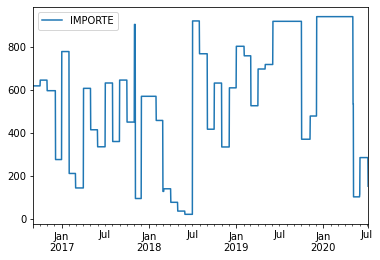

In [217]:
transacciones_126_importe_df.plot()
pyplot.show()

In [218]:
"""
tiene muchas altibajos repentinos con lo que probablemente esta serie sea dificil de modelizar
"""

'\ntiene muchas altibajos repentinos con lo que probablemente esta serie sea dificil de modelizar\n'

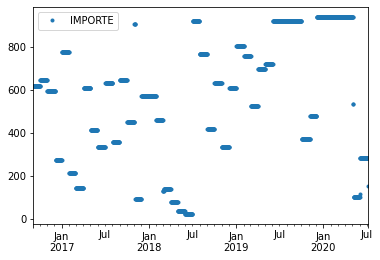

In [219]:
transacciones_126_importe_df.plot(style='.')
pyplot.show()

In [220]:
# 2. Time Series Histogram and Density Plots

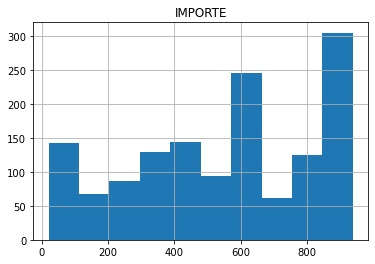

In [221]:
transacciones_126_importe_df.hist()
pyplot.show()

In [222]:
"""
es una distribucion de datos muy uniforme que no se podra modelizar fácilmente
"""

'\nes una distribucion de datos muy uniforme que no se podra modelizar fácilmente\n'

In [223]:
transacciones_126_importe_df.describe()

,IMPORTE
count,1401.000000
mean,555.362705
std,284.052734
min,19.900000
25%,334.080000
50%,606.020000
75%,777.190000
max,939.620000


In [224]:
# calculamos la moda
stat_mode = statistics.mode(transacciones_126_importe_df['IMPORTE'])
stat_mode

939.62

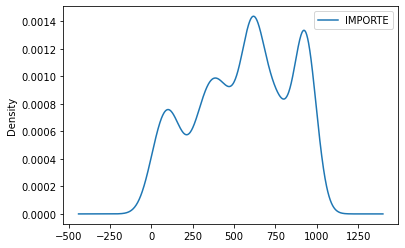

In [225]:
transacciones_126_importe_df.plot(kind='kde')
pyplot.show()

In [226]:
# 3. Time Series Box and Whisker Plots by Interval

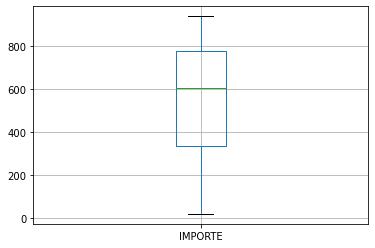

In [227]:
transacciones_126_importe_df.boxplot()
pyplot.show()

In [228]:
"""
esta distribucion esta tan uniformemente distribuida entre 20 y 940 eur que en el boxplot no se muestran outliers
"""

'\nesta distribucion esta tan uniformemente distribuida entre 20 y 940 eur que en el boxplot no se muestran outliers\n'

In [229]:
# 4. Time Series Heat Maps

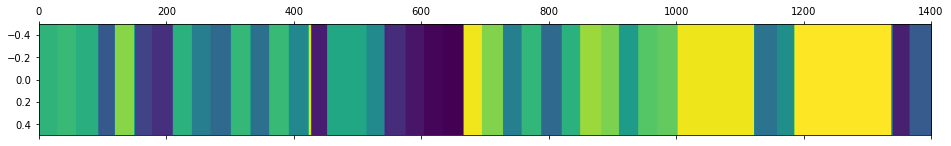

In [230]:
pyplot.matshow(transacciones_126_importe_df.T, interpolation=None, aspect='auto')
pyplot.show()

In [231]:
"""
el mapa de color reproduce fielmente las grandes oscilaciones de la representacion de las observaciones en funcion del tiempo.
serie temporal dificil de modelizar.
"""

'\nel mapa de color reproduce fielmente las grandes oscilaciones de la representacion de las observaciones en funcion del tiempo.\nserie temporal dificil de modelizar.\n'

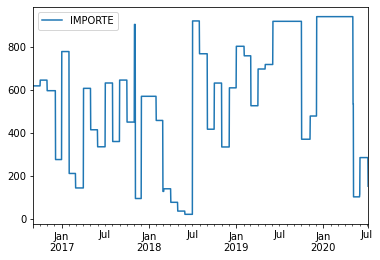

In [232]:
transacciones_126_importe_df.plot()
pyplot.show()

In [233]:
# 5. Time Series Lag Scatter Plots

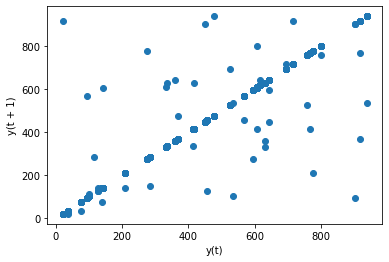

In [234]:
lag_plot(transacciones_126_importe_df)
pyplot.show()

In [235]:
"""
sorprendentemente, aunque con puntos fuera de la diagonal que pueden meter ruido a la correlacion; se aprecia una diagonal y,
por tanto, una correlación muy clara ente y(t+1) e y(t)
"""

'\nsorprendentemente, aunque con puntos fuera de la diagonal que pueden meter ruido a la correlacion; se aprecia una diagonal y,\npor tanto, una correlación muy clara ente y(t+1) e y(t)\n'

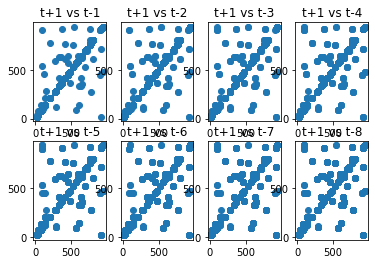

In [236]:
values = DataFrame(transacciones_126_importe_df.values)
lags = 8
columns = [values]
for i in range(1,(lags + 1)):
	columns.append(values.shift(i))
dataframe = concat(columns, axis=1)
columns = ['t+1']
for i in range(1,(lags + 1)):
	columns.append('t-' + str(i))
dataframe.columns = columns
pyplot.figure(1)
for i in range(1,(lags + 1)):
	ax = pyplot.subplot(240 + i)
	ax.set_title('t+1 vs t-' + str(i))
	pyplot.scatter(x=dataframe['t+1'].values, y=dataframe['t-'+str(i)].values)
pyplot.show()

In [237]:
"""
se aprecia el mismo grado de buena correlacion entre y(t+1) y sus 8 primeros lags.
es posible que esta serie temporal sea modelizable.
"""

'\nse aprecia el mismo grado de buena correlacion entre y(t+1) y sus 8 primeros lags.\nes posible que esta serie temporal sea modelizable.\n'

t+1 vs t-1


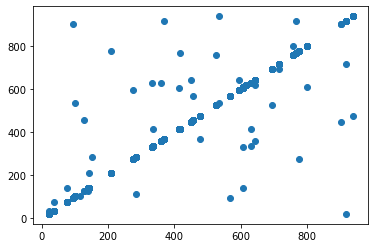

t+1 vs t-2


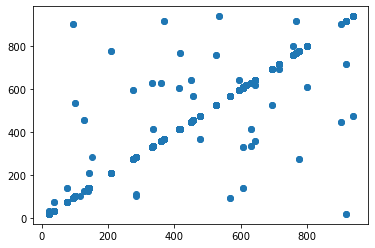

t+1 vs t-3


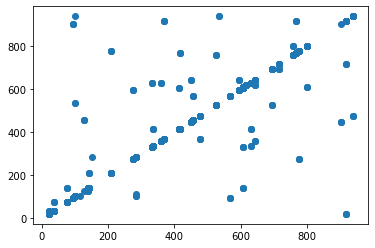

t+1 vs t-4


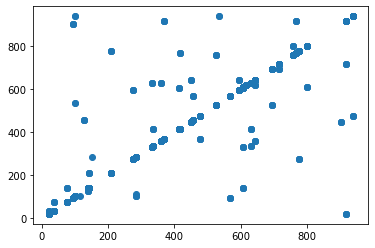

t+1 vs t-5


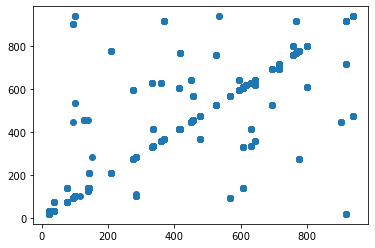

t+1 vs t-6


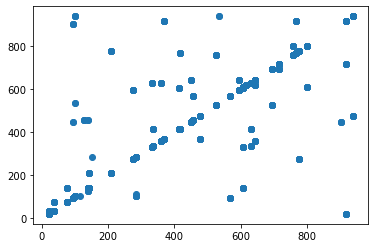

t+1 vs t-7


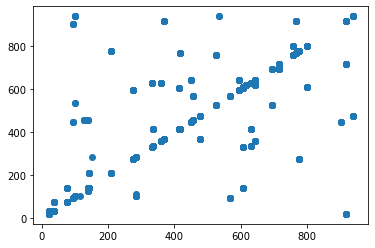

t+1 vs t-8


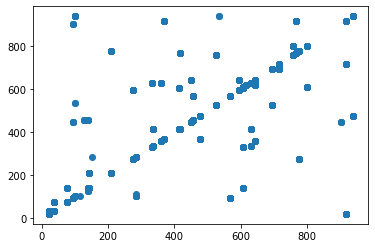

t+1 vs t-9


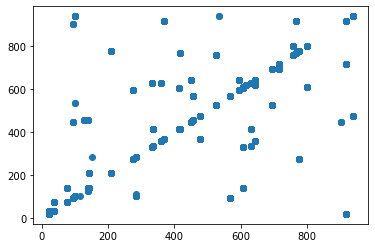

t+1 vs t-10


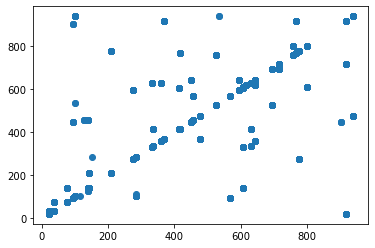

t+1 vs t-11


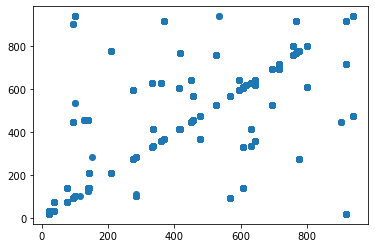

t+1 vs t-12


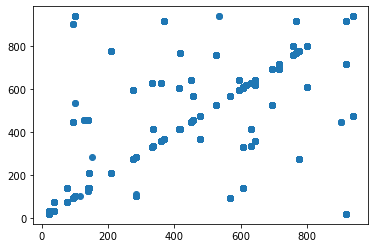

t+1 vs t-13


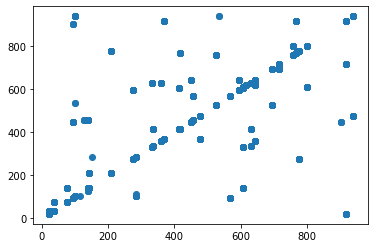

t+1 vs t-14


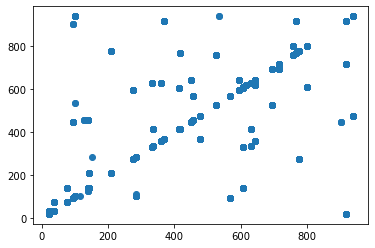

t+1 vs t-15


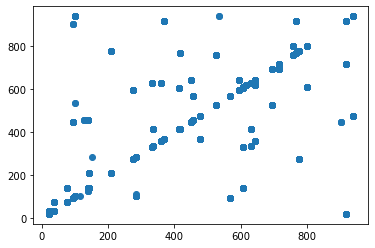

t+1 vs t-16


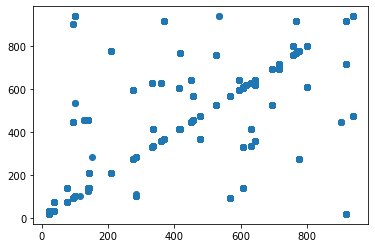

t+1 vs t-17


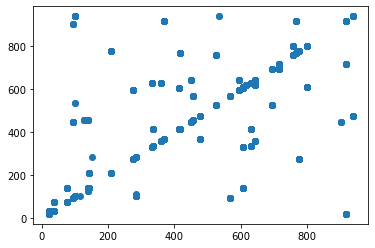

t+1 vs t-18


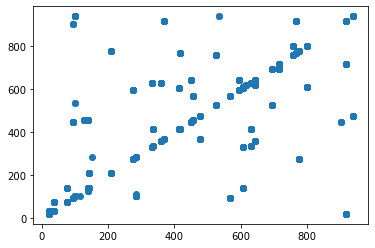

t+1 vs t-19


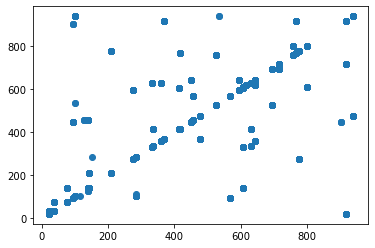

t+1 vs t-20


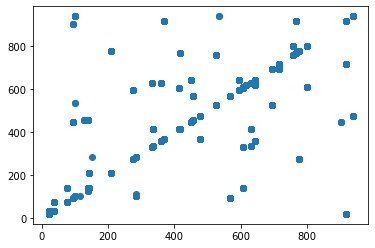

t+1 vs t-21


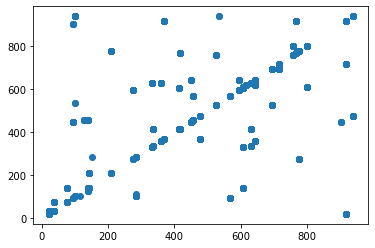

t+1 vs t-22


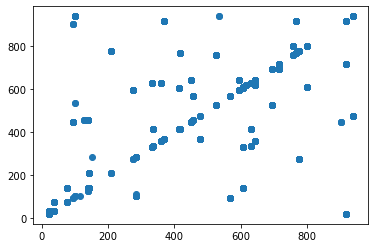

t+1 vs t-23


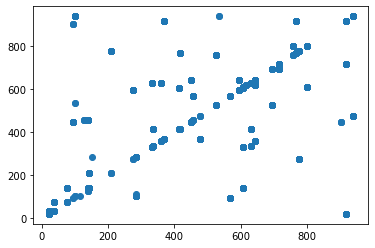

t+1 vs t-24


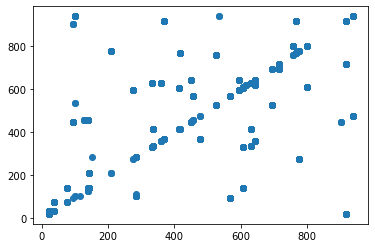

t+1 vs t-25


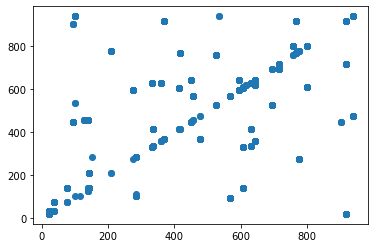

t+1 vs t-26


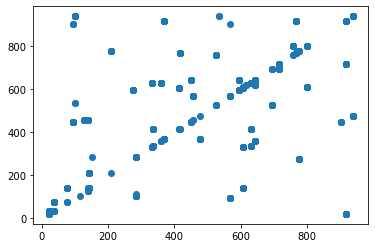

t+1 vs t-27


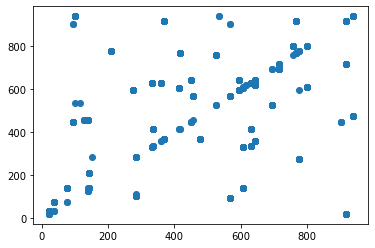

t+1 vs t-28


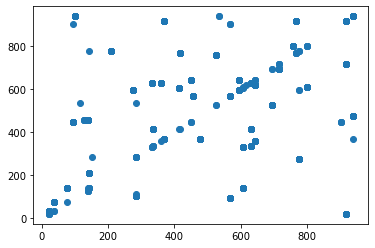

t+1 vs t-29


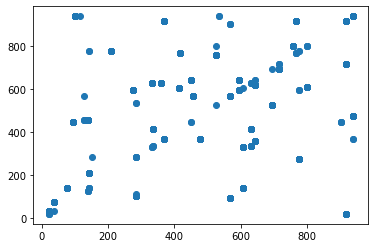

t+1 vs t-30


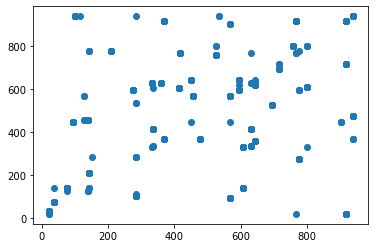

t+1 vs t-31


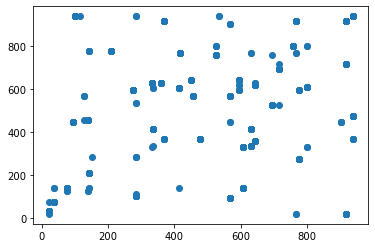

t+1 vs t-32


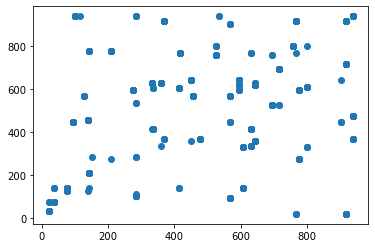

t+1 vs t-33


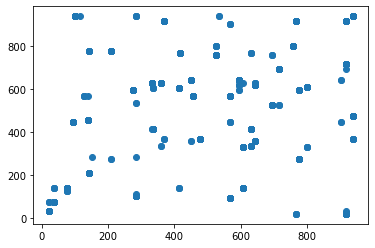

t+1 vs t-34


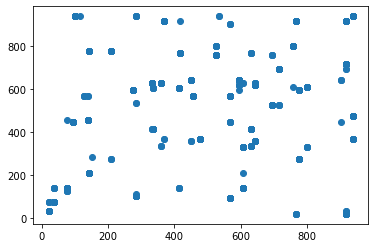

t+1 vs t-35


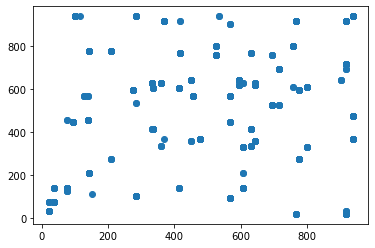

t+1 vs t-36


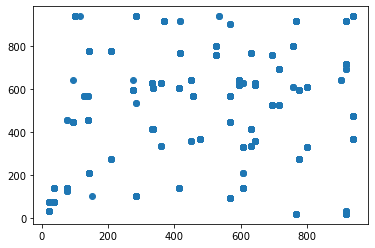

t+1 vs t-37


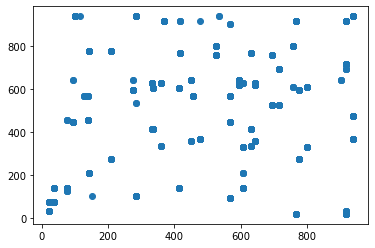

t+1 vs t-38


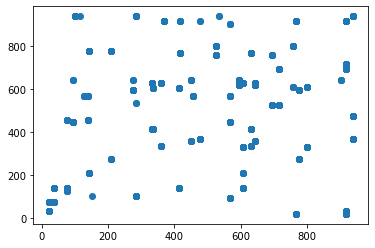

t+1 vs t-39


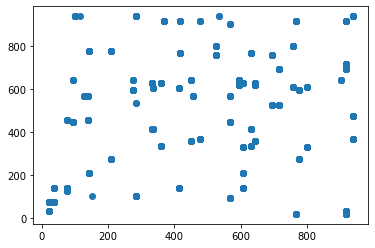

t+1 vs t-40


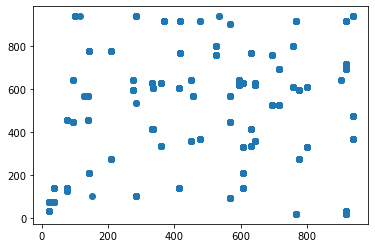

t+1 vs t-41


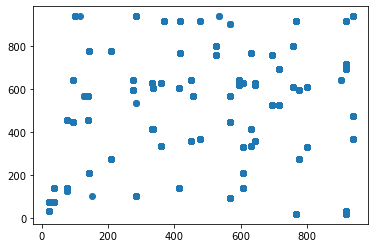

t+1 vs t-42


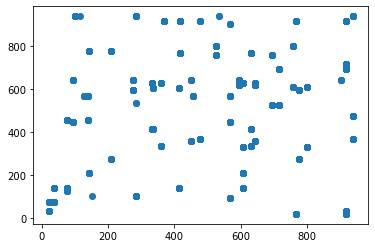

t+1 vs t-43


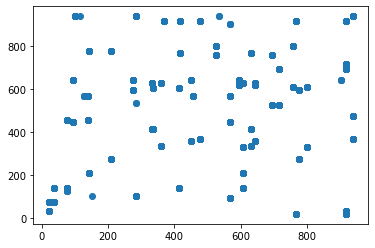

t+1 vs t-44


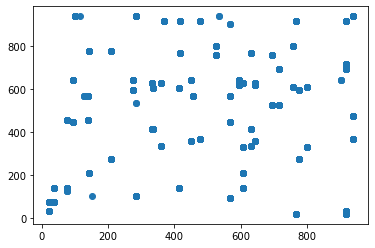

t+1 vs t-45


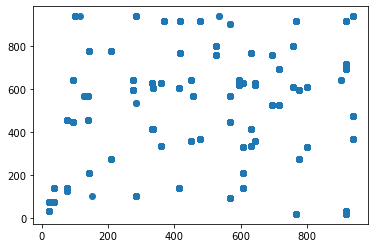

t+1 vs t-46


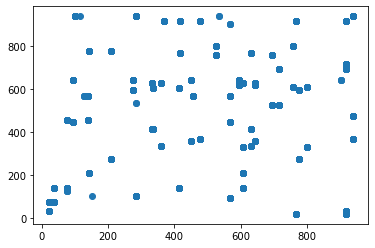

t+1 vs t-47


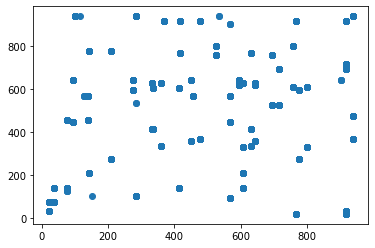

t+1 vs t-48


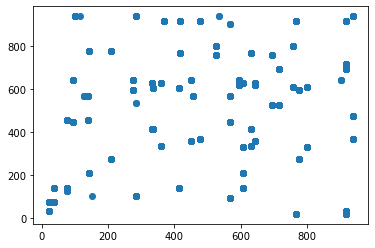

t+1 vs t-49


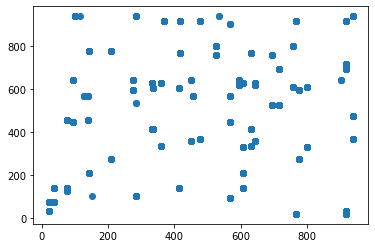

t+1 vs t-50


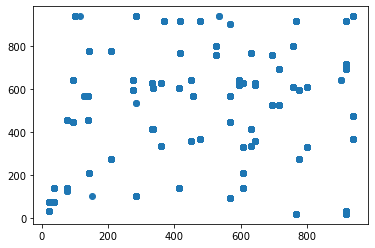

t+1 vs t-51


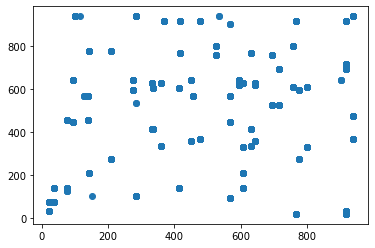

t+1 vs t-52


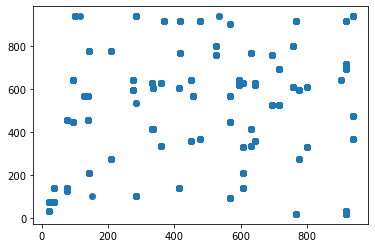

t+1 vs t-53


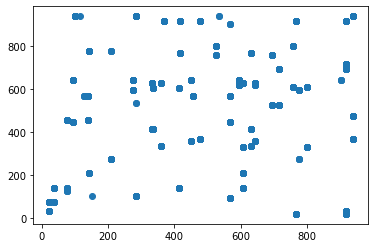

t+1 vs t-54


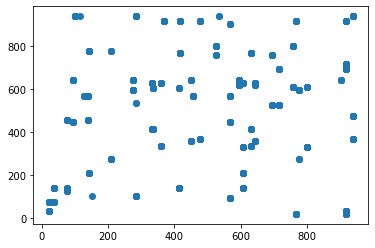

t+1 vs t-55


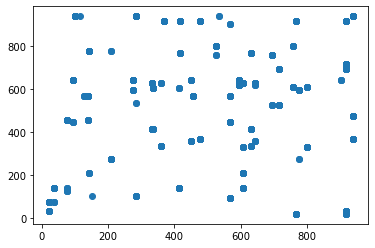

t+1 vs t-56


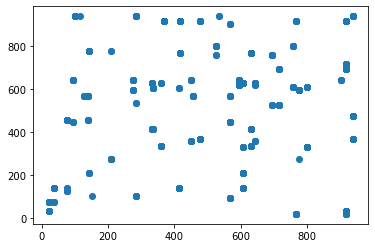

t+1 vs t-57


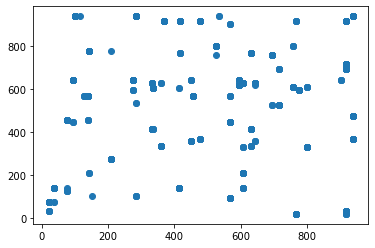

t+1 vs t-58


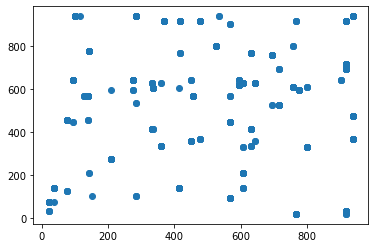

t+1 vs t-59


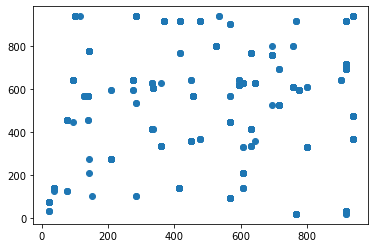

t+1 vs t-60


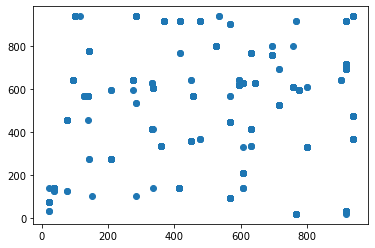

t+1 vs t-61


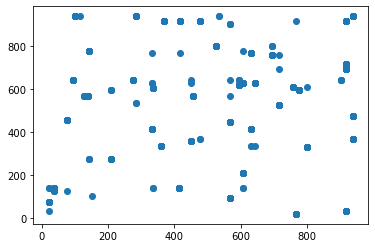

t+1 vs t-62


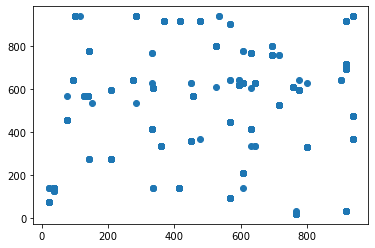

t+1 vs t-63


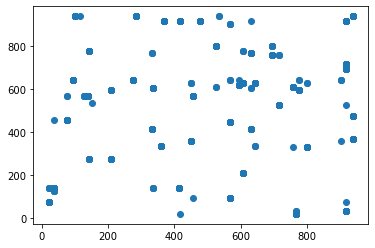

t+1 vs t-64


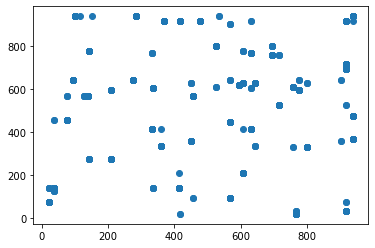

t+1 vs t-65


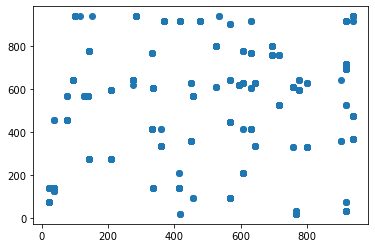

t+1 vs t-66


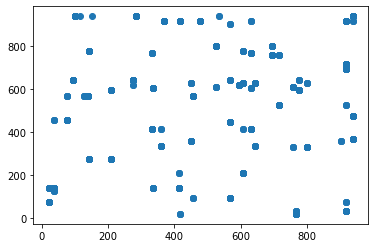

t+1 vs t-67


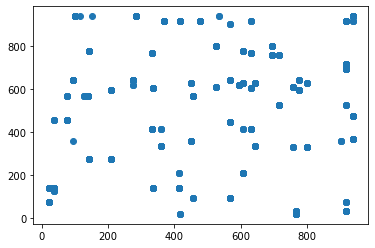

t+1 vs t-68


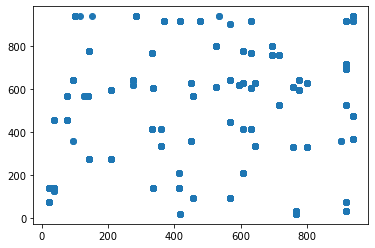

t+1 vs t-69


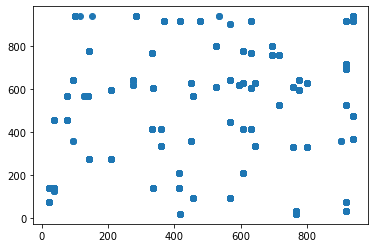

t+1 vs t-70


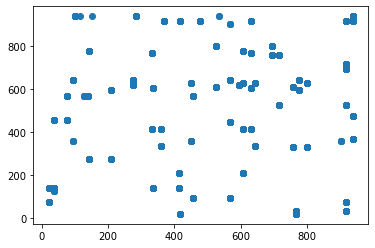

t+1 vs t-71


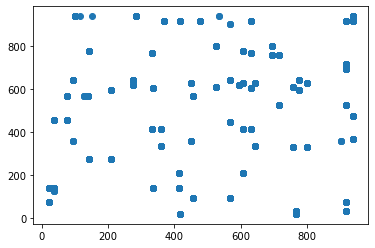

t+1 vs t-72


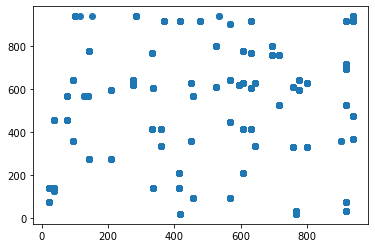

t+1 vs t-73


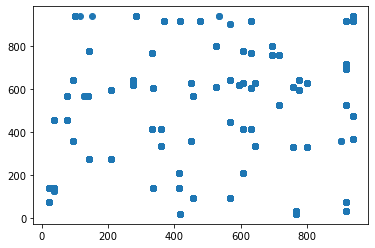

t+1 vs t-74


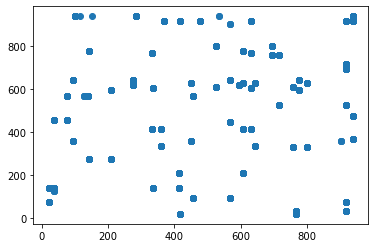

t+1 vs t-75


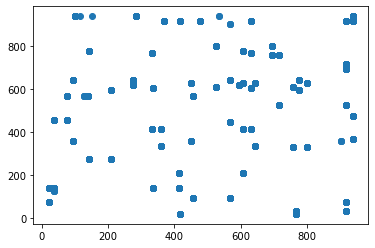

t+1 vs t-76


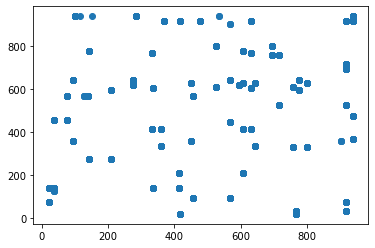

t+1 vs t-77


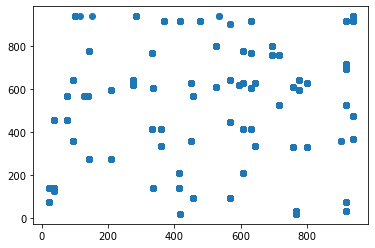

t+1 vs t-78


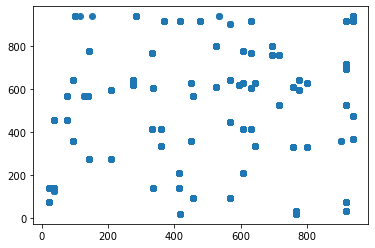

t+1 vs t-79


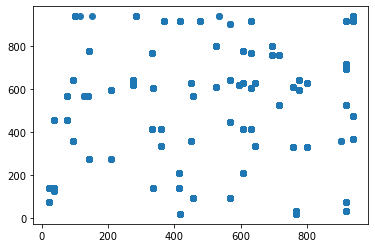

t+1 vs t-80


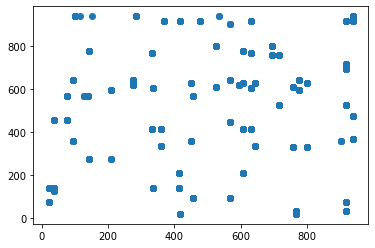

t+1 vs t-81


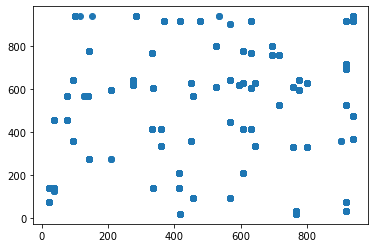

t+1 vs t-82


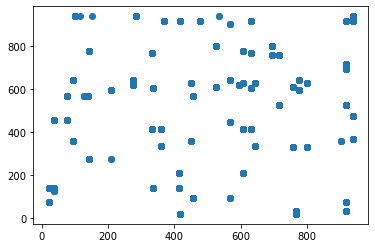

t+1 vs t-83


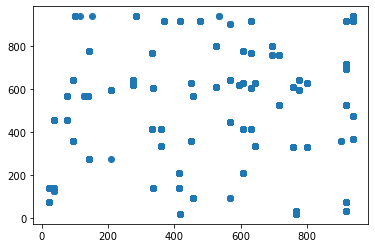

t+1 vs t-84


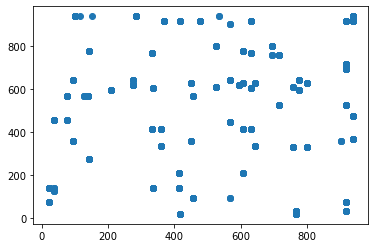

t+1 vs t-85


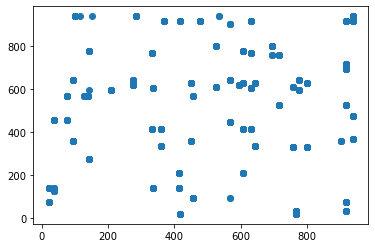

t+1 vs t-86


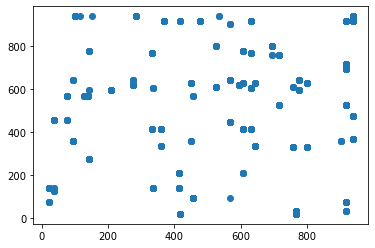

t+1 vs t-87


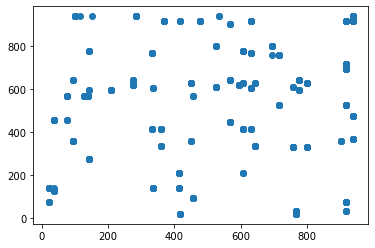

t+1 vs t-88


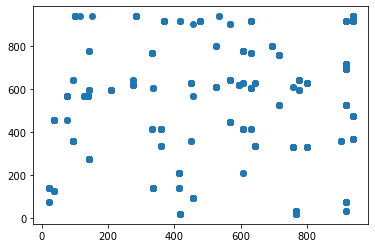

t+1 vs t-89


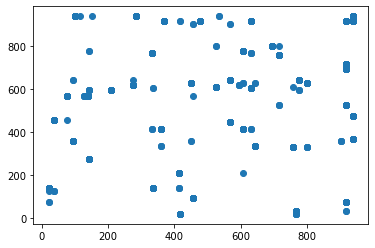

t+1 vs t-90


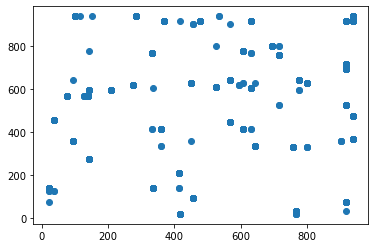

t+1 vs t-91


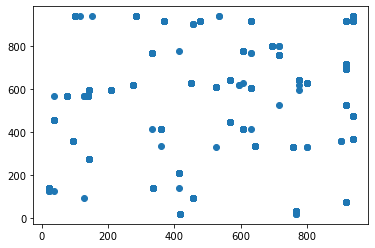

t+1 vs t-92


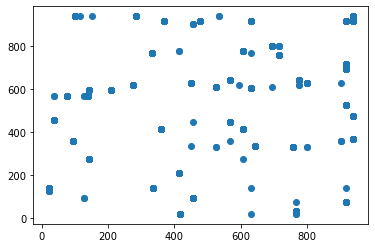

t+1 vs t-93


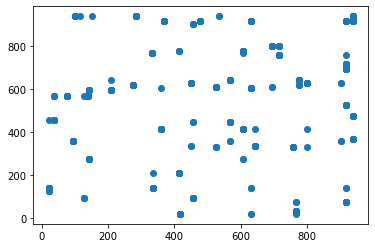

t+1 vs t-94


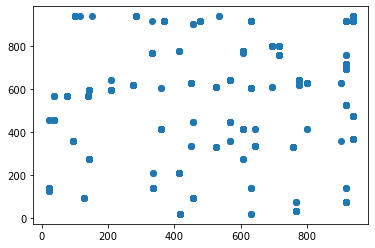

t+1 vs t-95


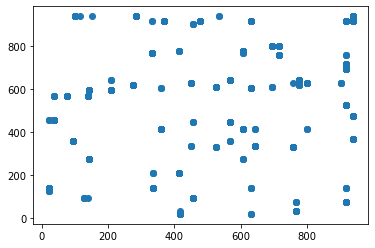

t+1 vs t-96


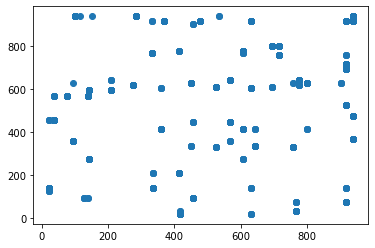

t+1 vs t-97


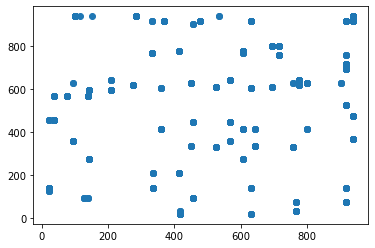

t+1 vs t-98


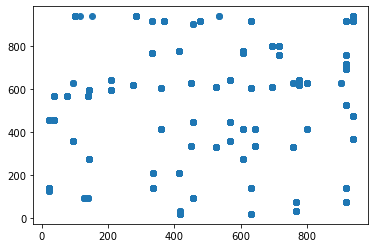

t+1 vs t-99


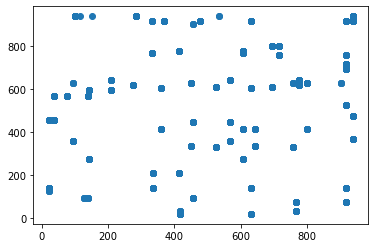

t+1 vs t-100


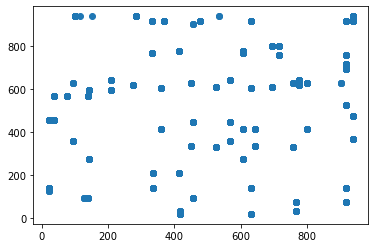

t+1 vs t-101


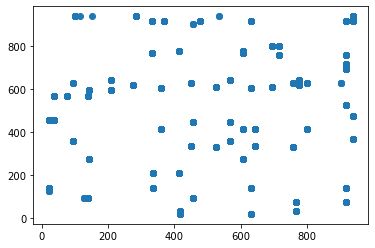

t+1 vs t-102


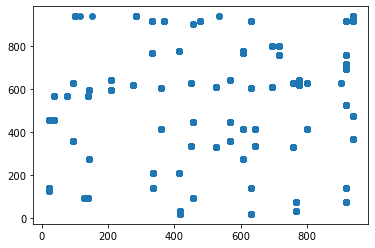

t+1 vs t-103


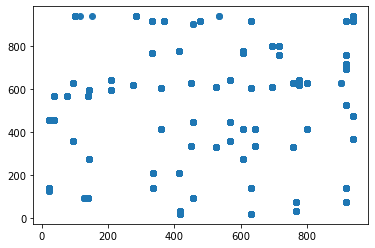

t+1 vs t-104


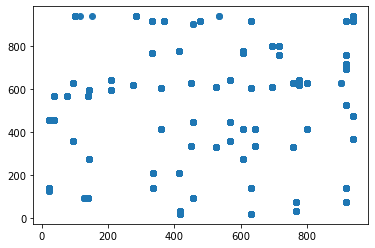

t+1 vs t-105


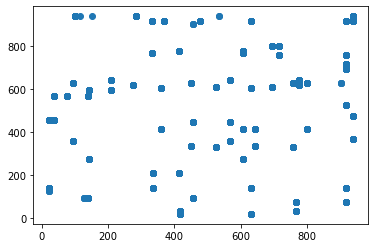

t+1 vs t-106


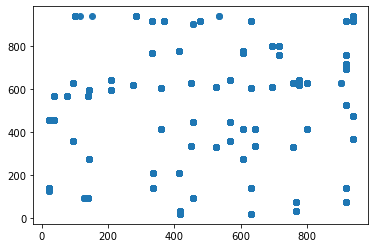

t+1 vs t-107


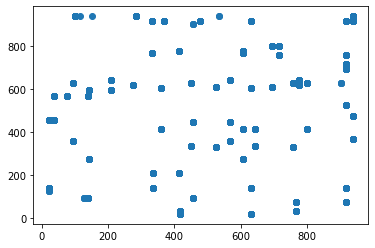

t+1 vs t-108


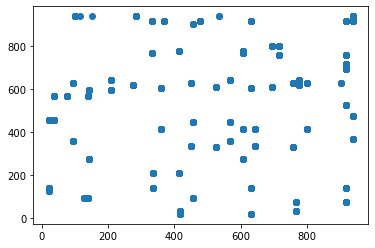

t+1 vs t-109


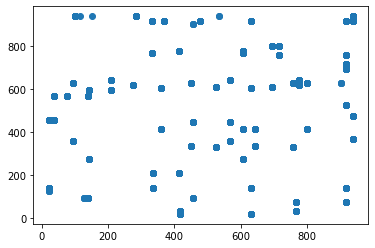

t+1 vs t-110


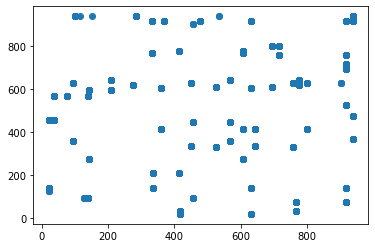

t+1 vs t-111


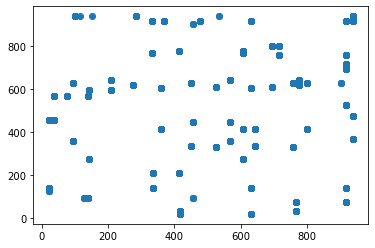

t+1 vs t-112


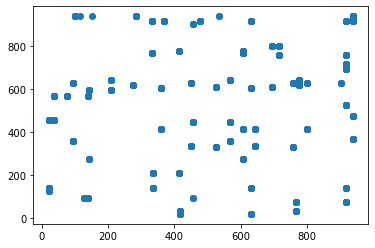

t+1 vs t-113


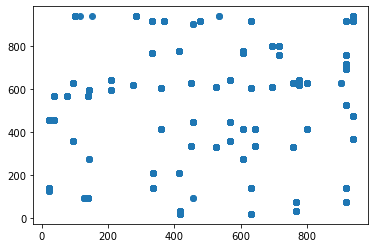

t+1 vs t-114


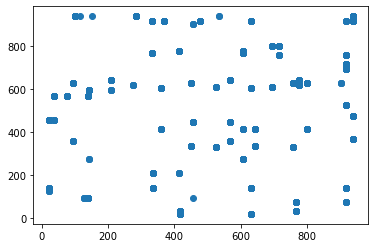

t+1 vs t-115


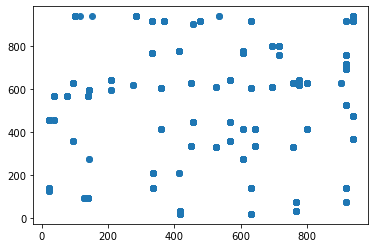

t+1 vs t-116


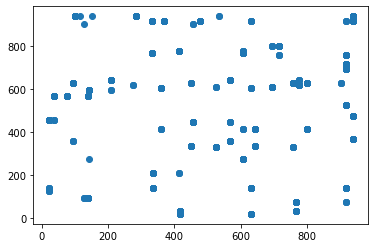

t+1 vs t-117


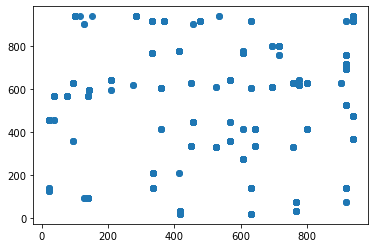

t+1 vs t-118


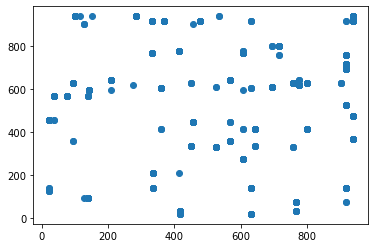

t+1 vs t-119


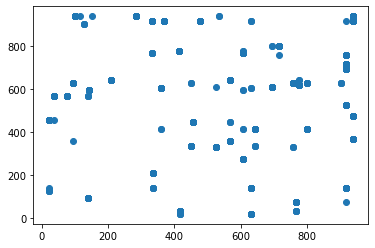

t+1 vs t-120


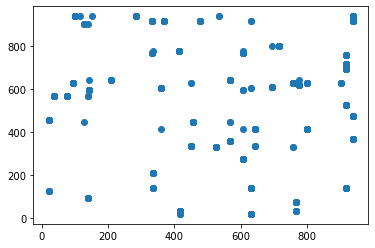

t+1 vs t-121


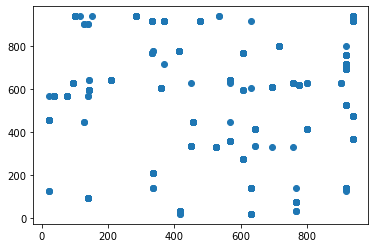

t+1 vs t-122


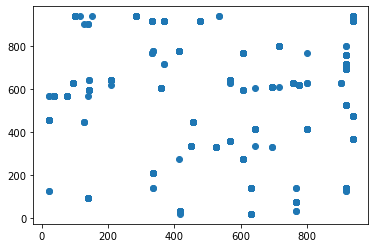

t+1 vs t-123


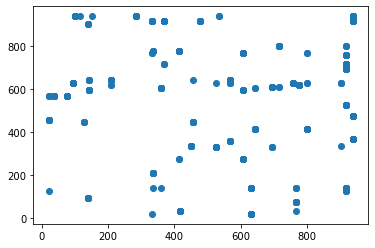

t+1 vs t-124


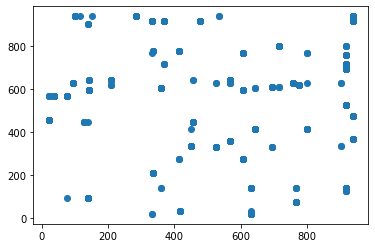

t+1 vs t-125


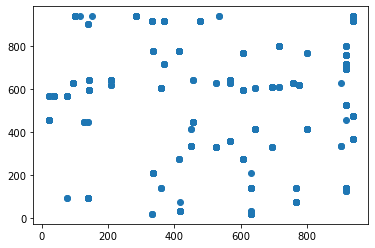

t+1 vs t-126


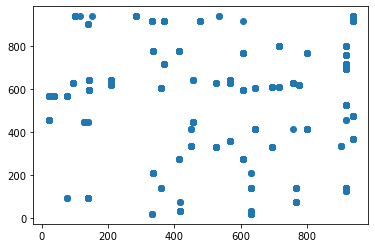

t+1 vs t-127


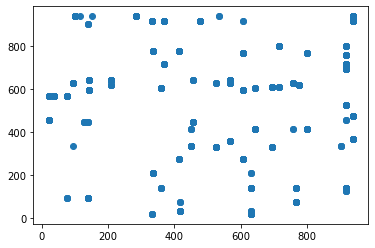

t+1 vs t-128


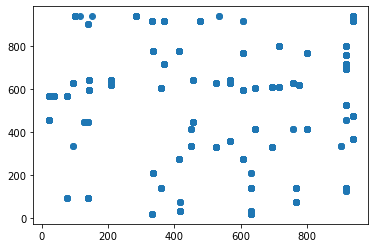

t+1 vs t-129


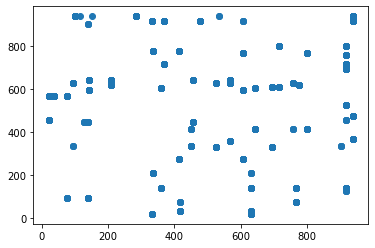

t+1 vs t-130


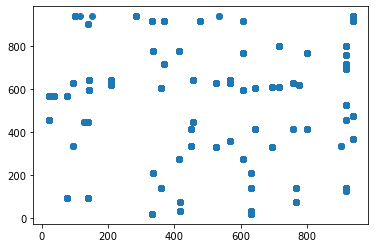

t+1 vs t-131


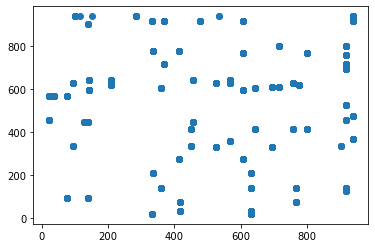

t+1 vs t-132


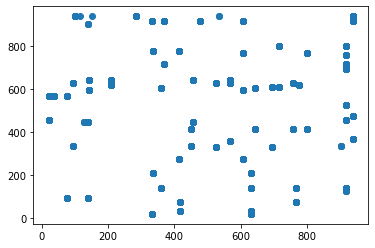

t+1 vs t-133


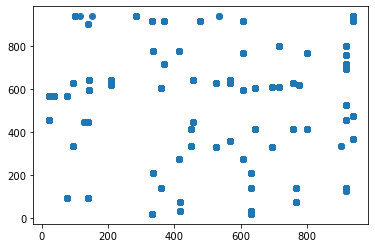

t+1 vs t-134


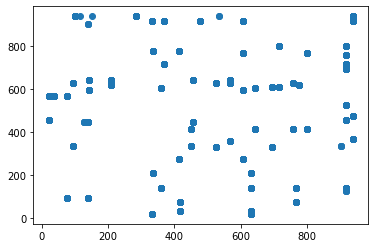

t+1 vs t-135


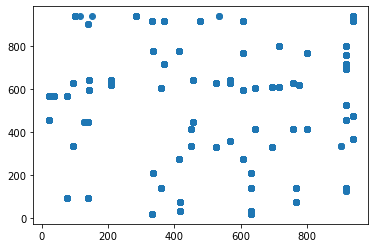

t+1 vs t-136


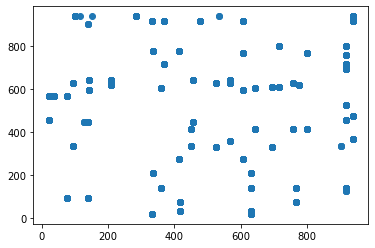

t+1 vs t-137


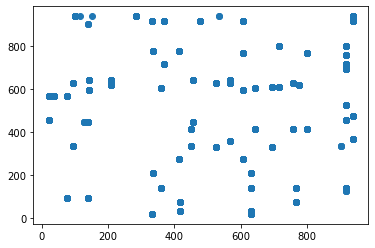

t+1 vs t-138


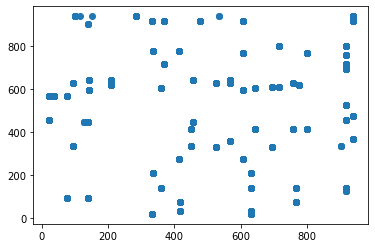

t+1 vs t-139


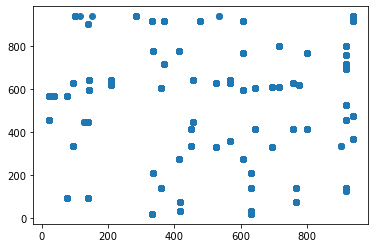

t+1 vs t-140


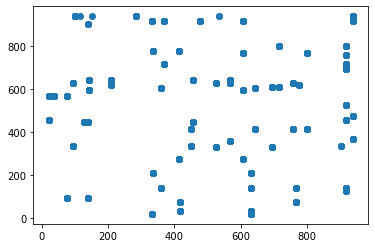

t+1 vs t-141


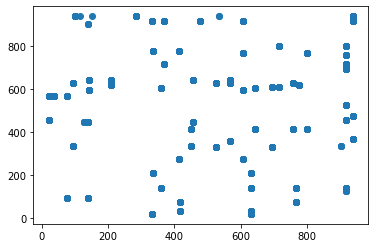

t+1 vs t-142


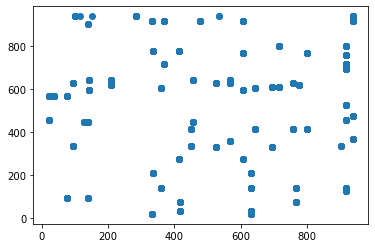

t+1 vs t-143


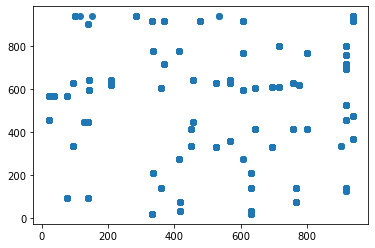

t+1 vs t-144


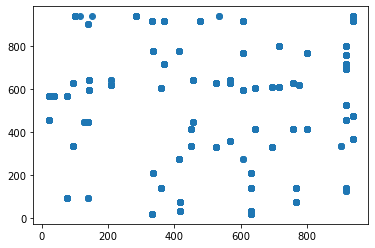

t+1 vs t-145


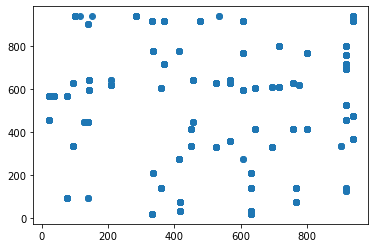

t+1 vs t-146


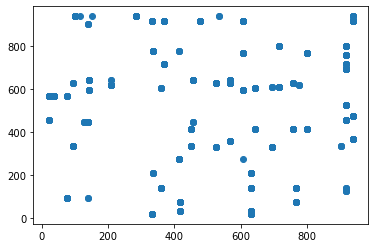

t+1 vs t-147


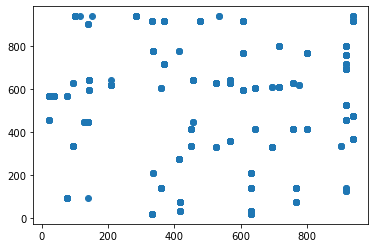

t+1 vs t-148


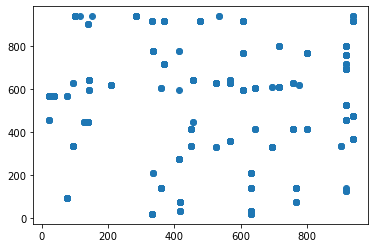

t+1 vs t-149


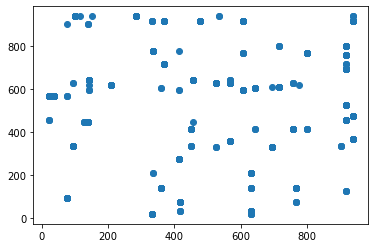

t+1 vs t-150


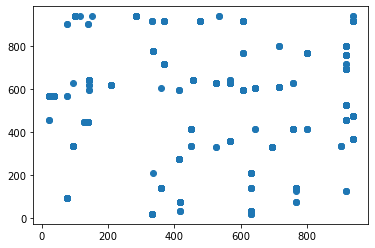

t+1 vs t-151


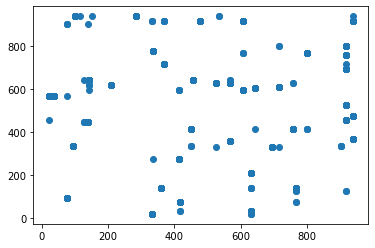

t+1 vs t-152


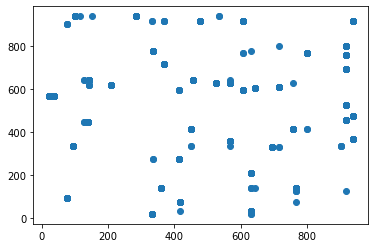

t+1 vs t-153


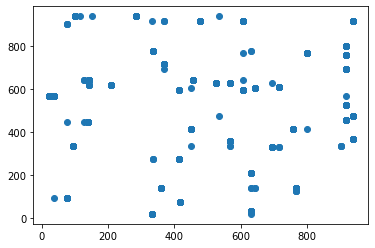

t+1 vs t-154


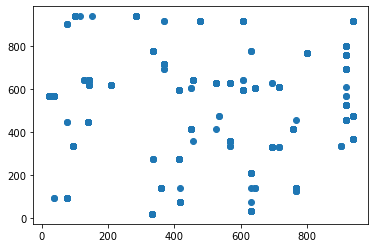

t+1 vs t-155


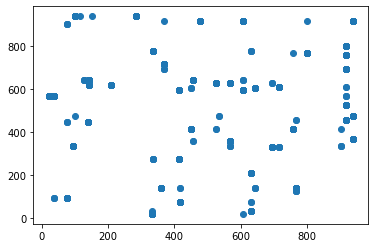

t+1 vs t-156


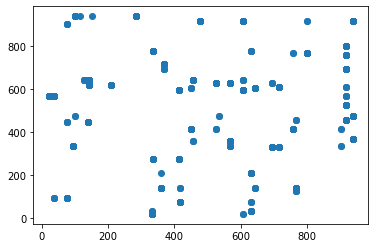

t+1 vs t-157


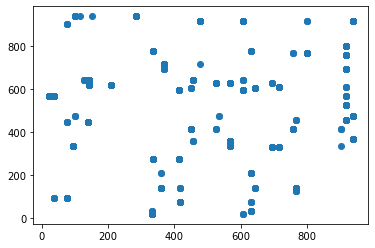

t+1 vs t-158


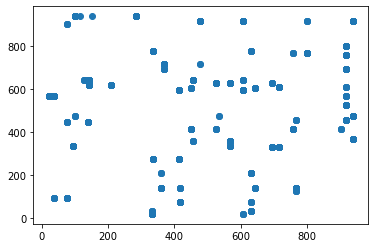

t+1 vs t-159


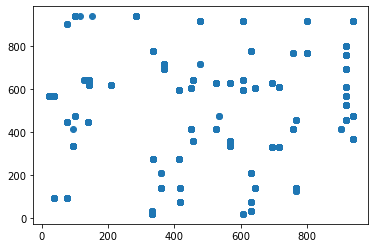

t+1 vs t-160


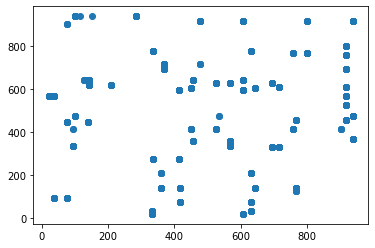

t+1 vs t-161


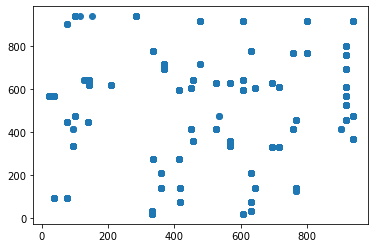

t+1 vs t-162


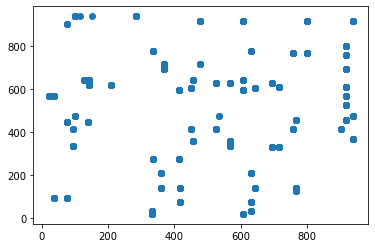

t+1 vs t-163


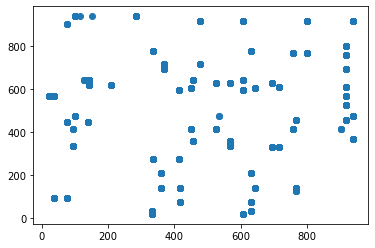

t+1 vs t-164


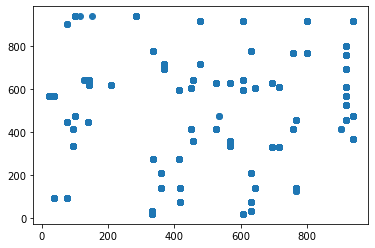

t+1 vs t-165


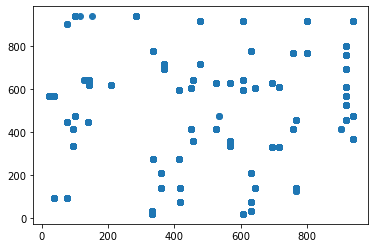

t+1 vs t-166


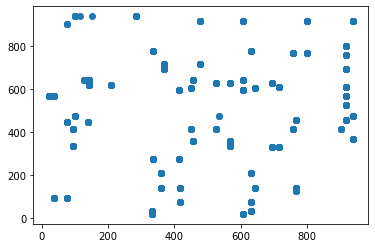

t+1 vs t-167


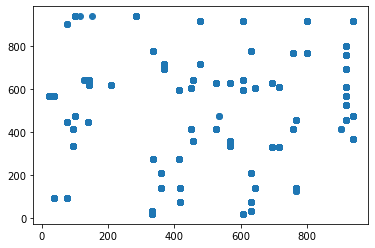

t+1 vs t-168


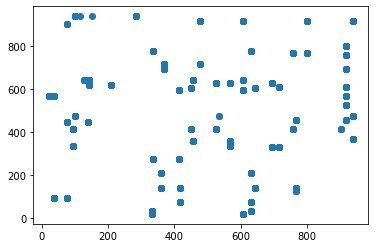

t+1 vs t-169


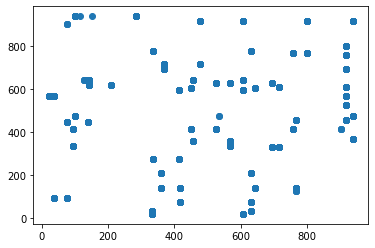

t+1 vs t-170


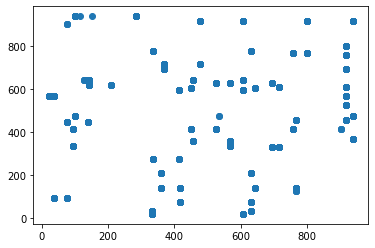

t+1 vs t-171


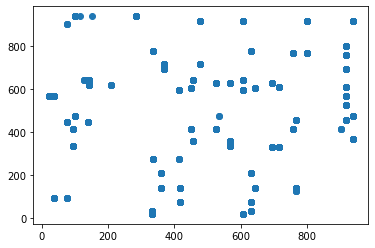

t+1 vs t-172


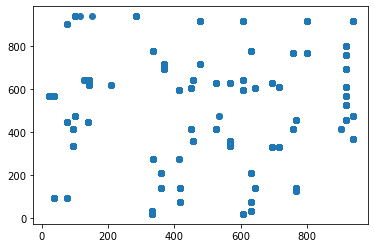

t+1 vs t-173


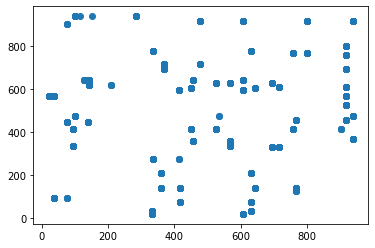

t+1 vs t-174


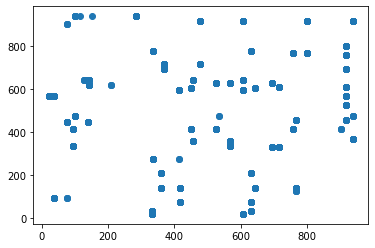

t+1 vs t-175


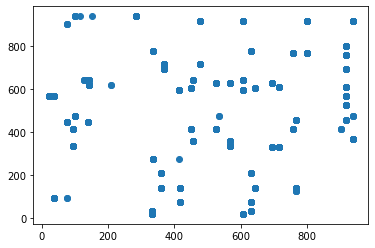

t+1 vs t-176


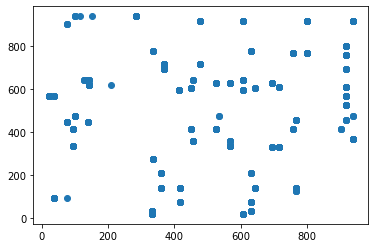

t+1 vs t-177


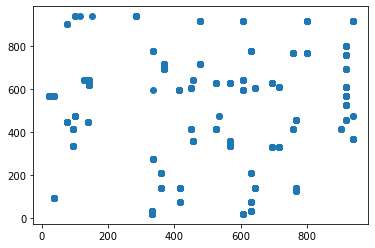

t+1 vs t-178


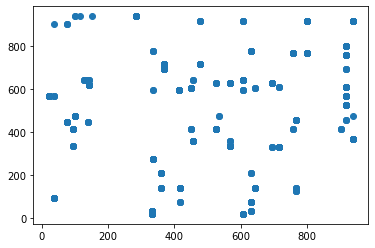

t+1 vs t-179


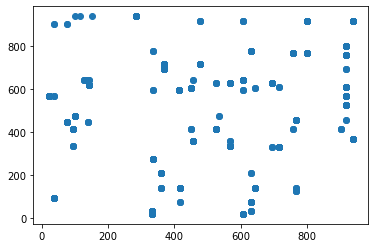

t+1 vs t-180


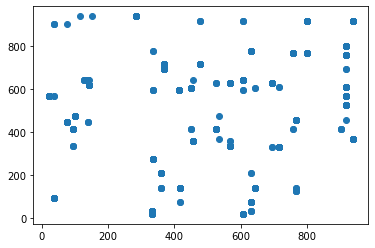

t+1 vs t-181


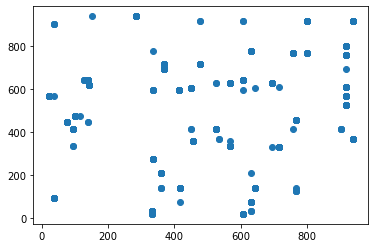

t+1 vs t-182


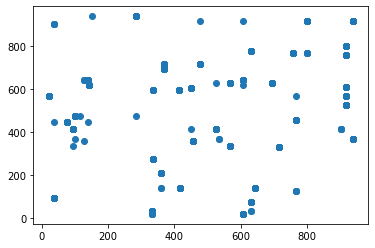

t+1 vs t-183


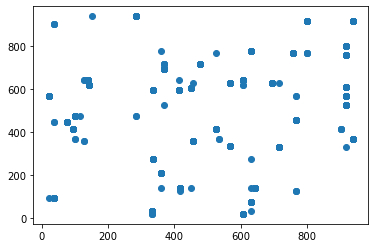

t+1 vs t-184


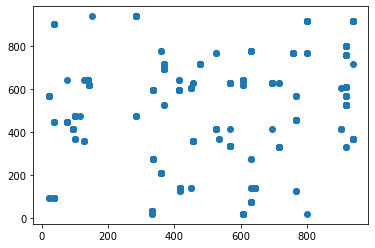

t+1 vs t-185


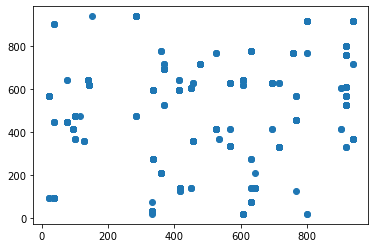

t+1 vs t-186


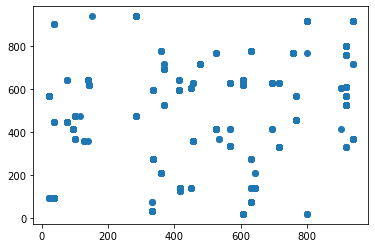

t+1 vs t-187


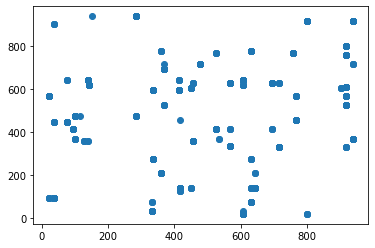

t+1 vs t-188


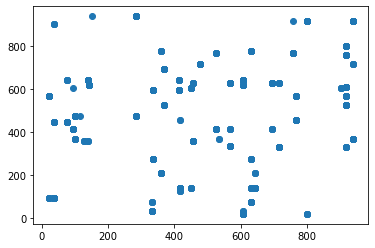

t+1 vs t-189


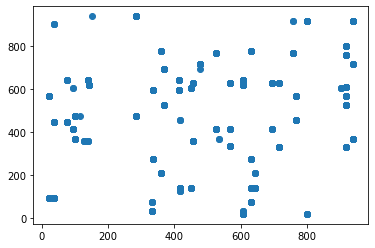

t+1 vs t-190


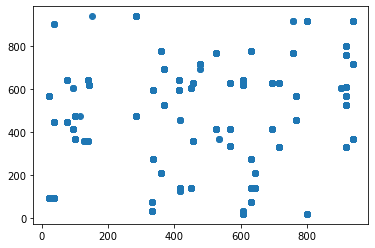

t+1 vs t-191


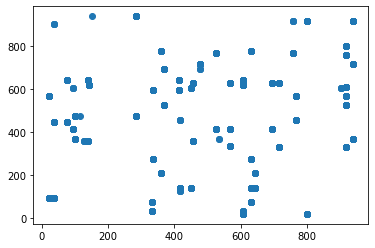

t+1 vs t-192


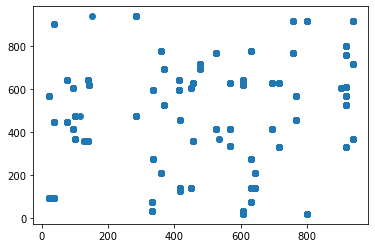

t+1 vs t-193


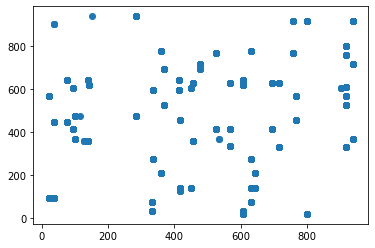

t+1 vs t-194


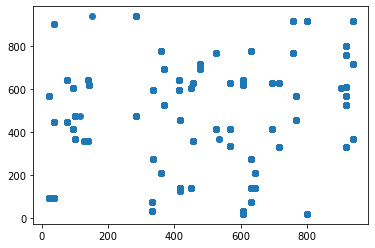

t+1 vs t-195


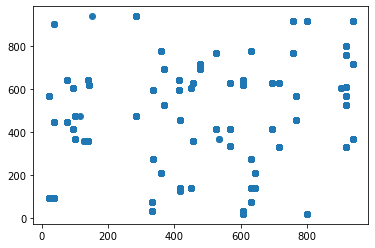

t+1 vs t-196


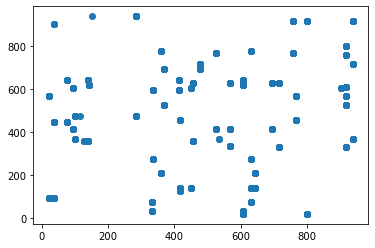

t+1 vs t-197


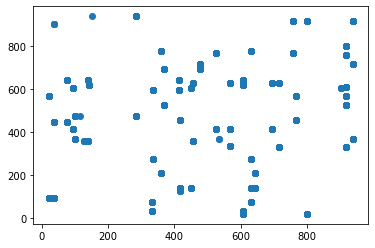

t+1 vs t-198


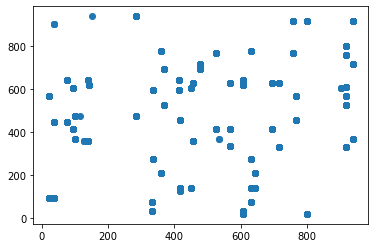

t+1 vs t-199


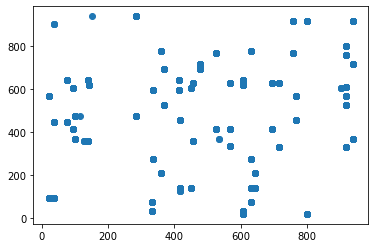

t+1 vs t-200


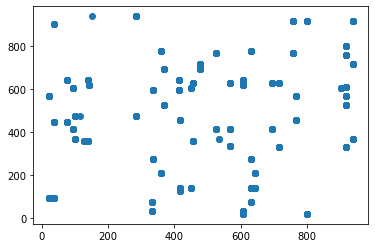

t+1 vs t-201


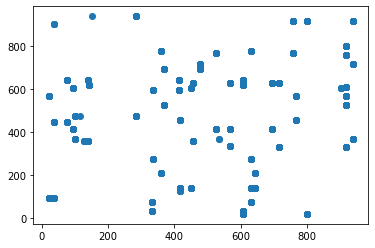

t+1 vs t-202


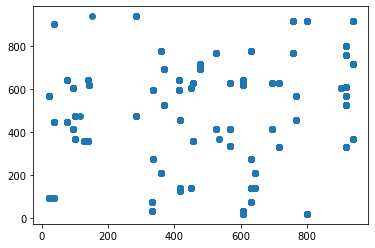

t+1 vs t-203


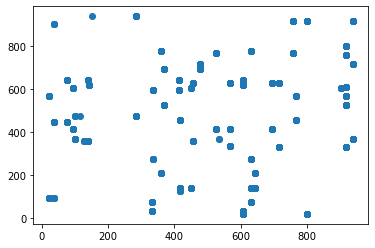

t+1 vs t-204


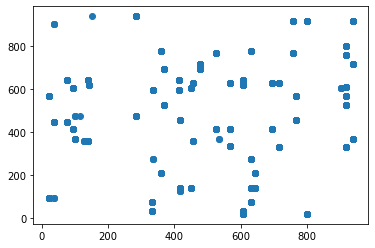

t+1 vs t-205


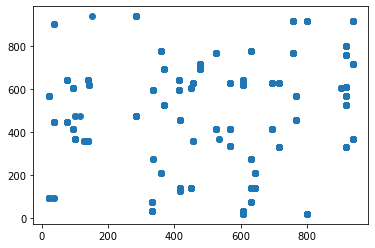

t+1 vs t-206


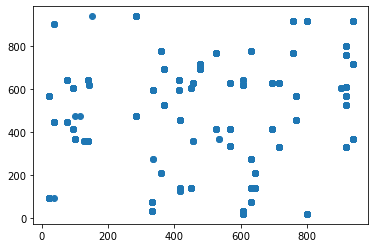

t+1 vs t-207


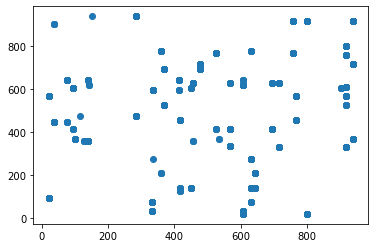

t+1 vs t-208


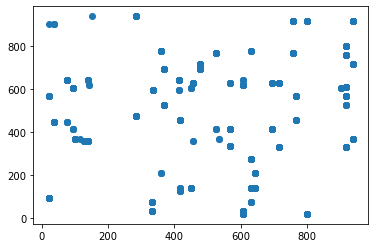

t+1 vs t-209


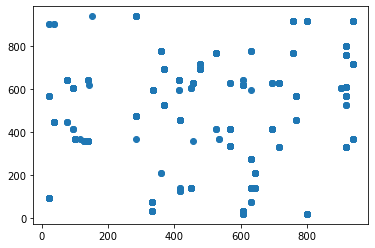

t+1 vs t-210


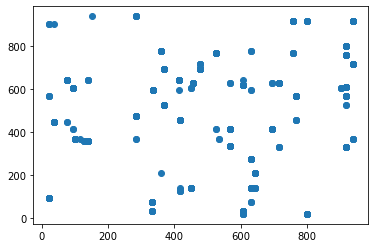

t+1 vs t-211


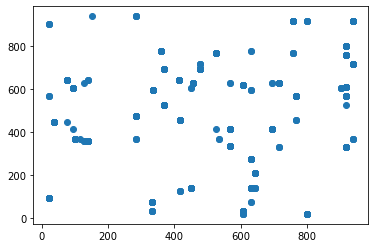

t+1 vs t-212


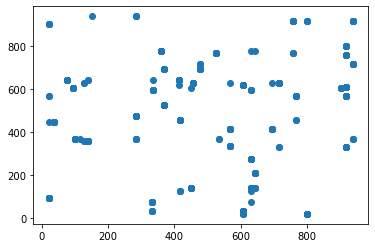

t+1 vs t-213


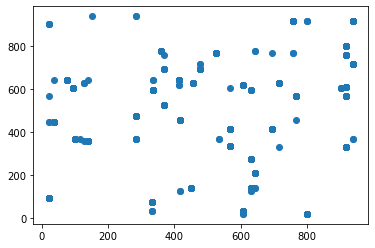

t+1 vs t-214


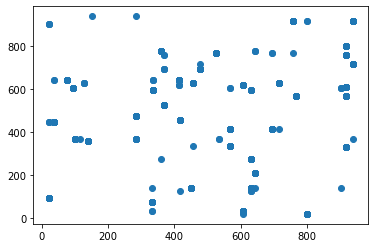

t+1 vs t-215


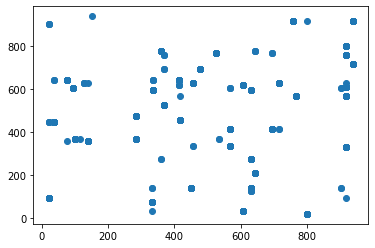

t+1 vs t-216


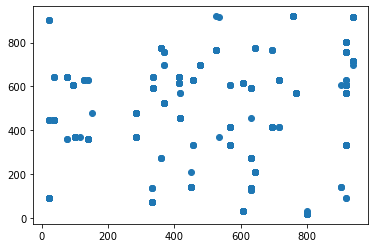

t+1 vs t-217


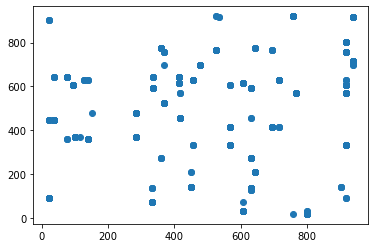

t+1 vs t-218


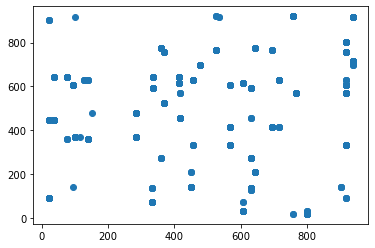

t+1 vs t-219


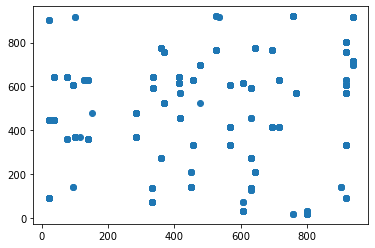

t+1 vs t-220


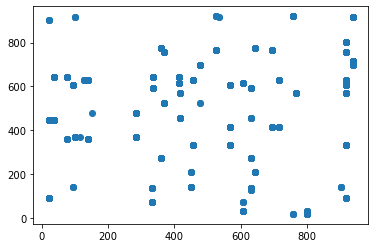

t+1 vs t-221


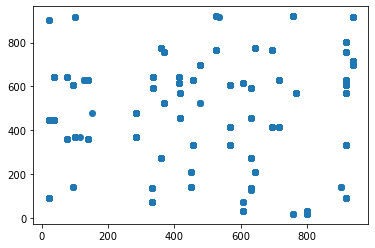

t+1 vs t-222


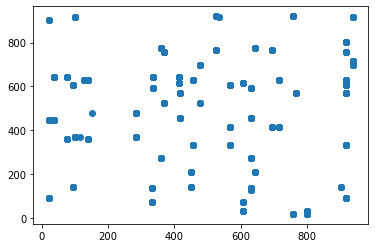

t+1 vs t-223


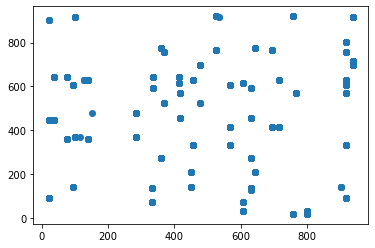

t+1 vs t-224


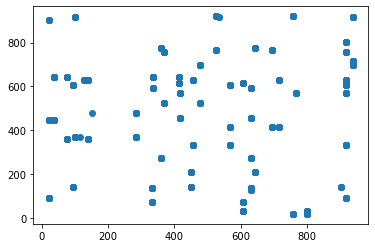

t+1 vs t-225


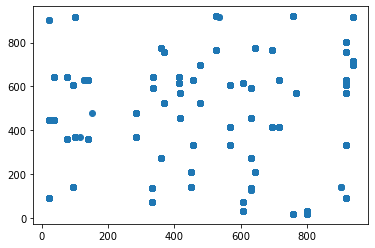

t+1 vs t-226


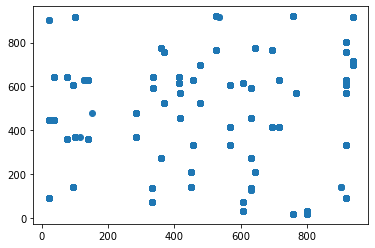

t+1 vs t-227


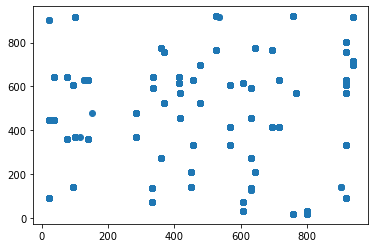

t+1 vs t-228


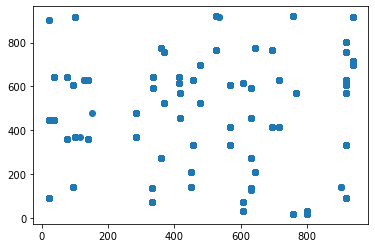

t+1 vs t-229


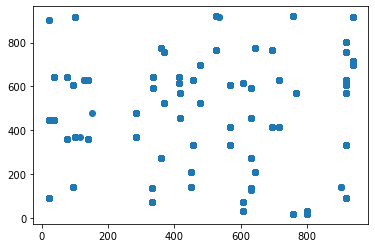

t+1 vs t-230


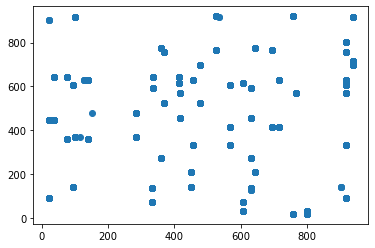

t+1 vs t-231


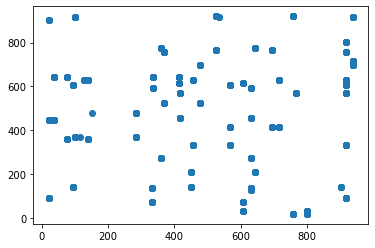

t+1 vs t-232


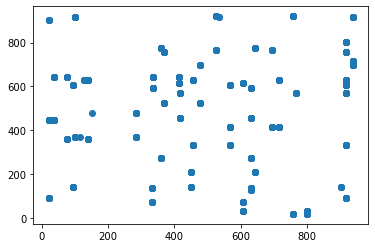

t+1 vs t-233


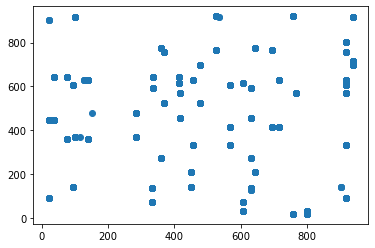

t+1 vs t-234


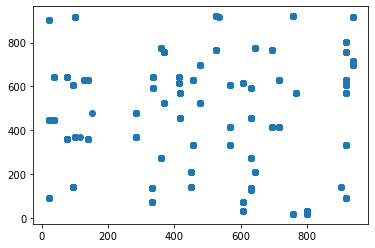

t+1 vs t-235


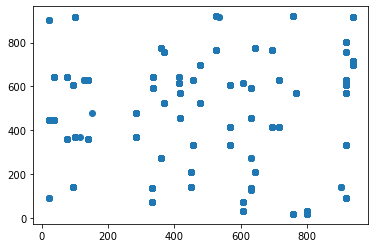

t+1 vs t-236


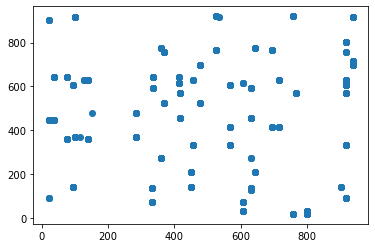

t+1 vs t-237


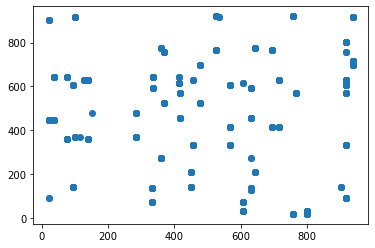

t+1 vs t-238


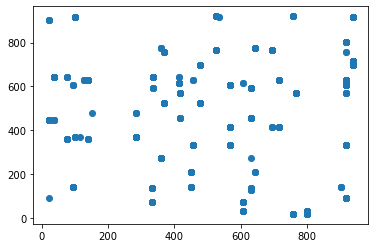

t+1 vs t-239


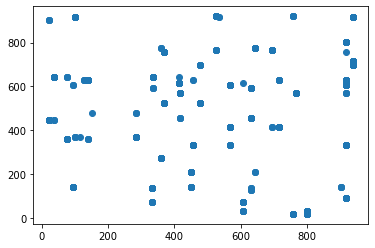

t+1 vs t-240


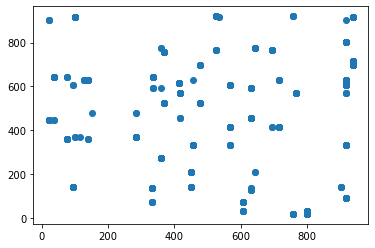

t+1 vs t-241


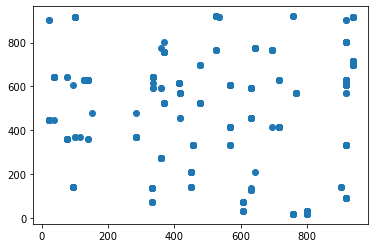

t+1 vs t-242


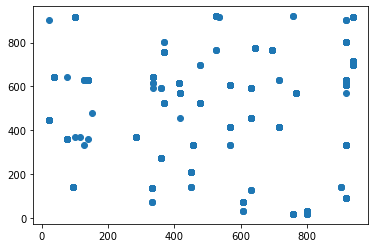

t+1 vs t-243


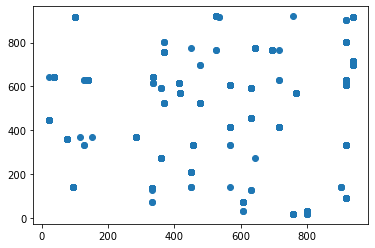

t+1 vs t-244


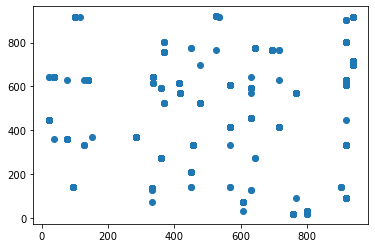

t+1 vs t-245


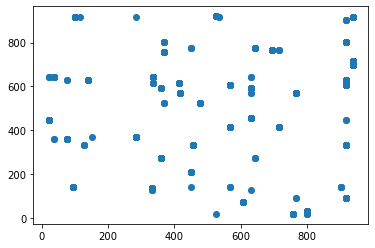

t+1 vs t-246


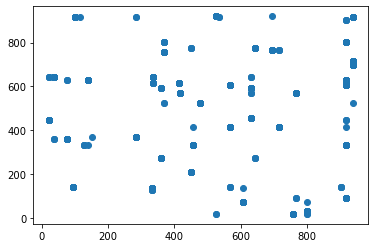

t+1 vs t-247


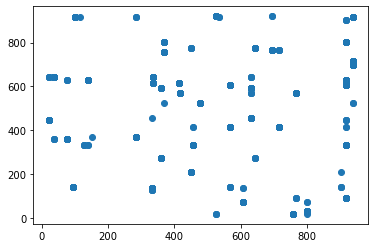

t+1 vs t-248


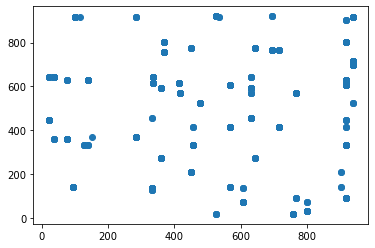

t+1 vs t-249


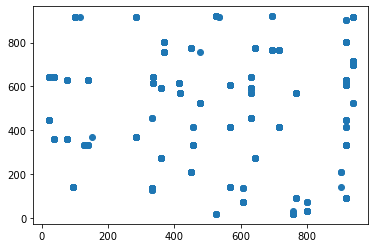

t+1 vs t-250


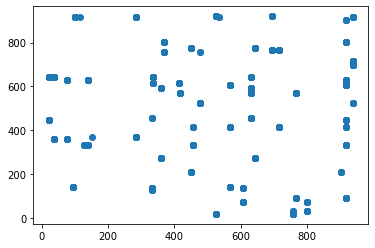

t+1 vs t-251


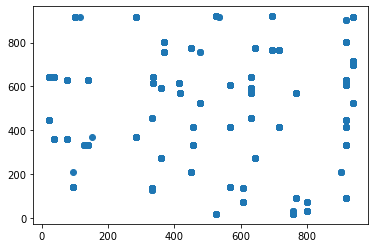

t+1 vs t-252


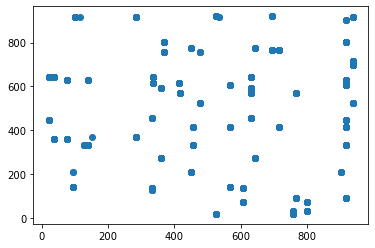

t+1 vs t-253


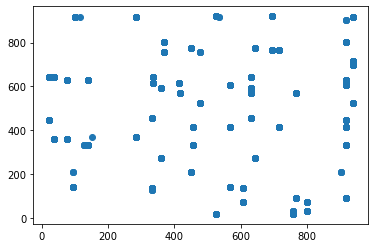

t+1 vs t-254


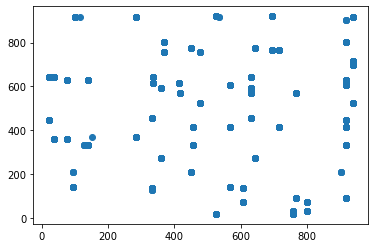

t+1 vs t-255


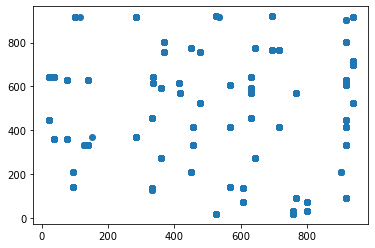

t+1 vs t-256


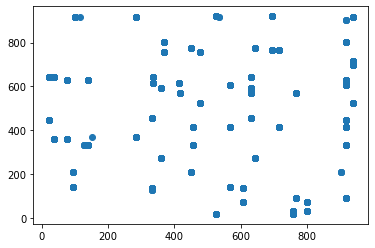

t+1 vs t-257


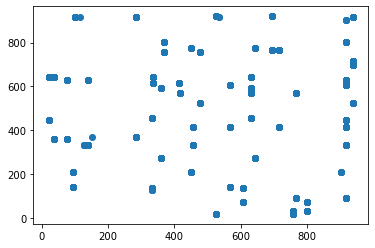

t+1 vs t-258


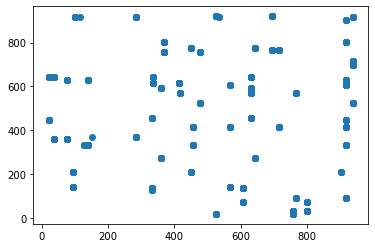

t+1 vs t-259


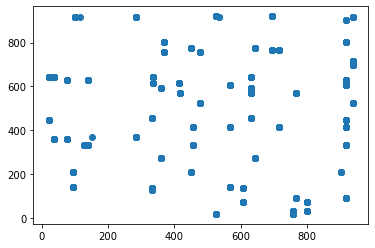

t+1 vs t-260


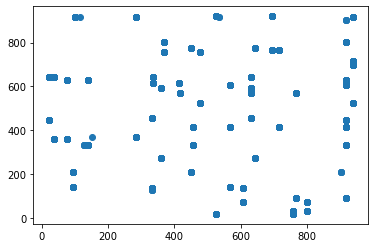

t+1 vs t-261


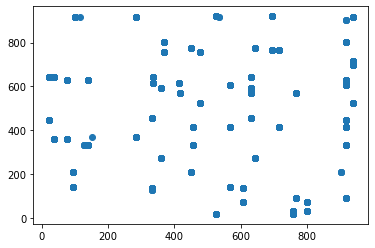

t+1 vs t-262


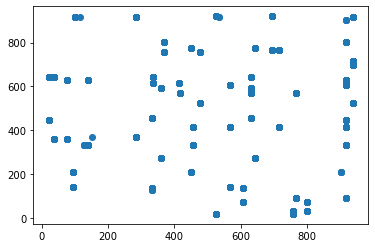

t+1 vs t-263


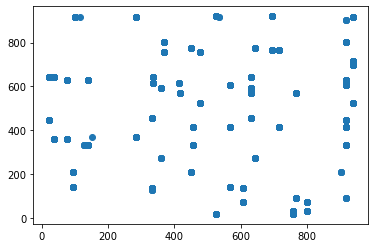

t+1 vs t-264


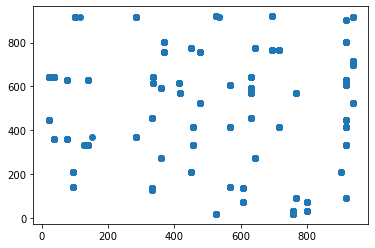

t+1 vs t-265


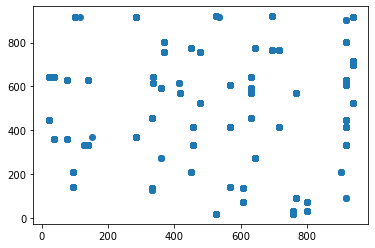

t+1 vs t-266


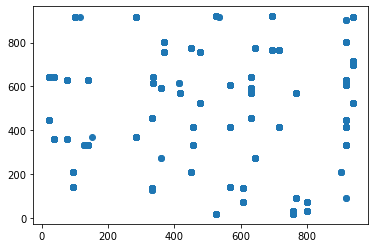

t+1 vs t-267


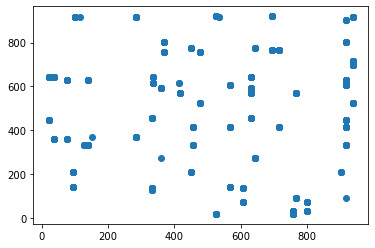

t+1 vs t-268


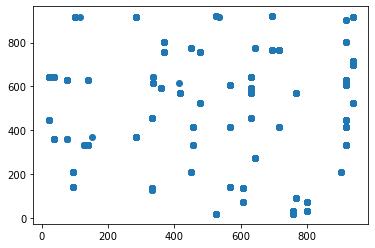

t+1 vs t-269


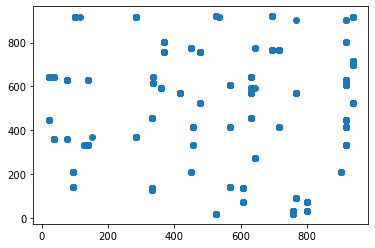

t+1 vs t-270


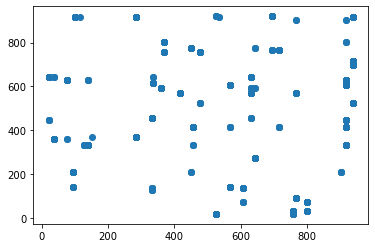

t+1 vs t-271


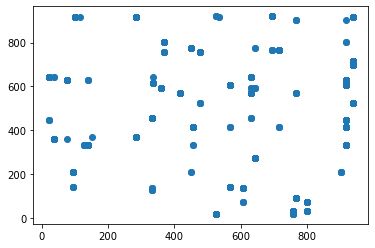

t+1 vs t-272


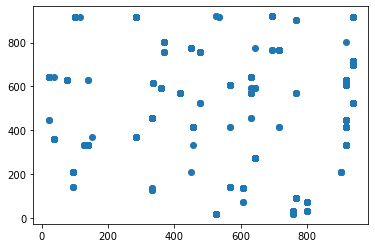

t+1 vs t-273


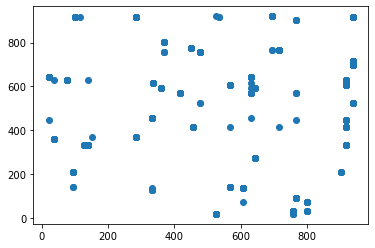

t+1 vs t-274


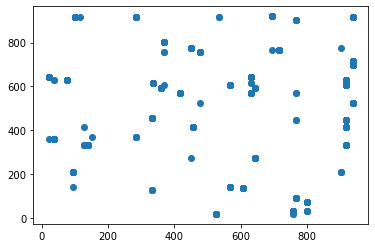

t+1 vs t-275


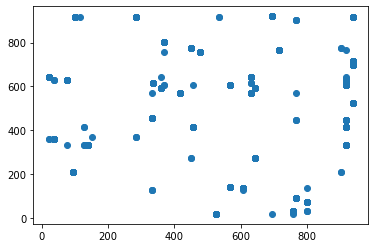

t+1 vs t-276


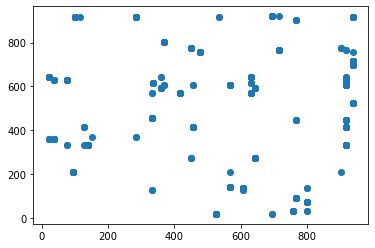

t+1 vs t-277


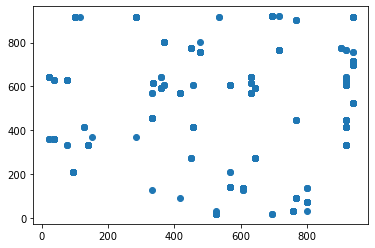

t+1 vs t-278


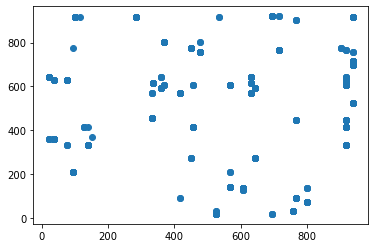

t+1 vs t-279


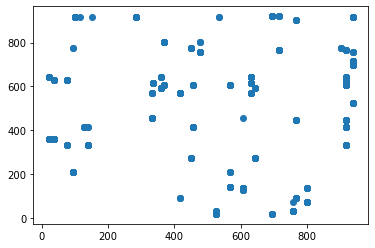

t+1 vs t-280


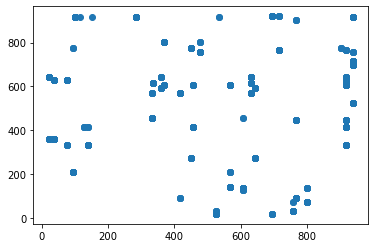

t+1 vs t-281


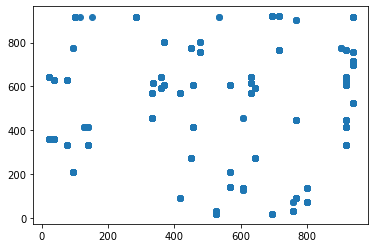

t+1 vs t-282


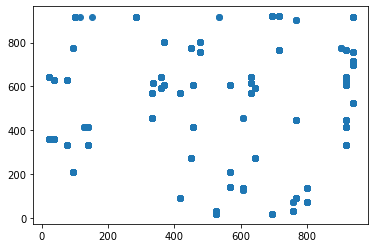

t+1 vs t-283


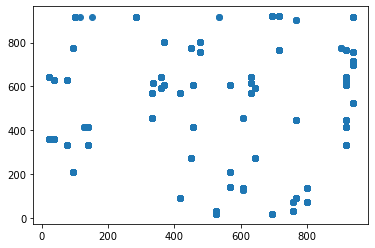

t+1 vs t-284


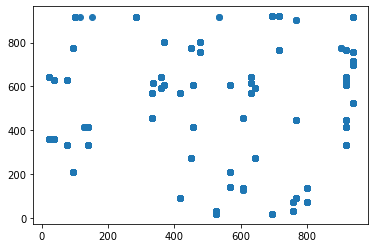

t+1 vs t-285


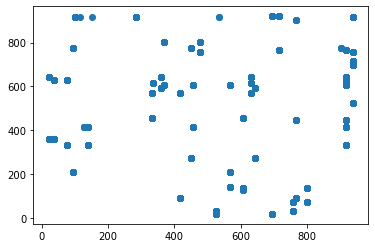

t+1 vs t-286


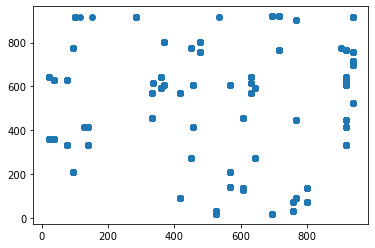

t+1 vs t-287


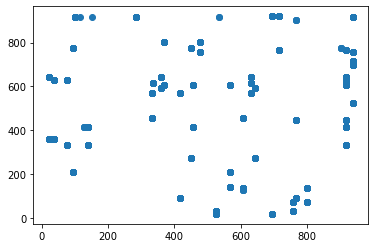

t+1 vs t-288


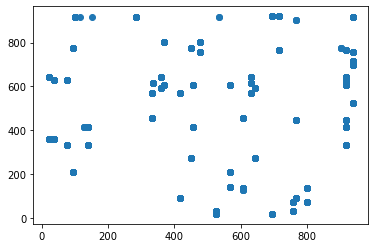

t+1 vs t-289


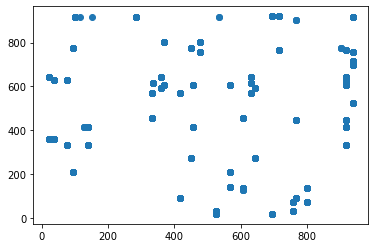

t+1 vs t-290


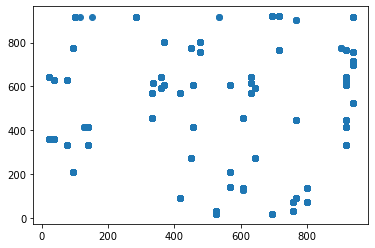

t+1 vs t-291


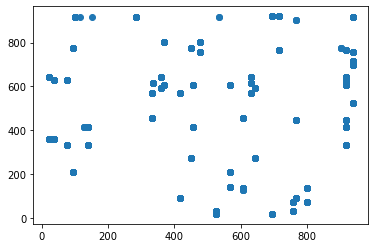

t+1 vs t-292


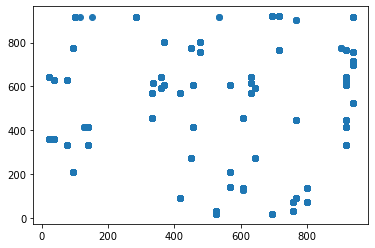

t+1 vs t-293


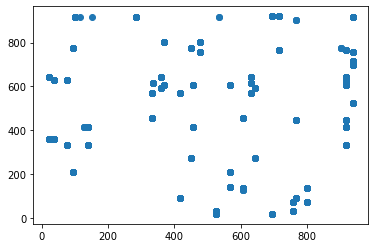

t+1 vs t-294


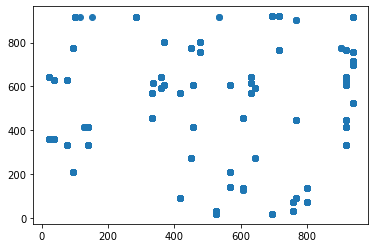

t+1 vs t-295


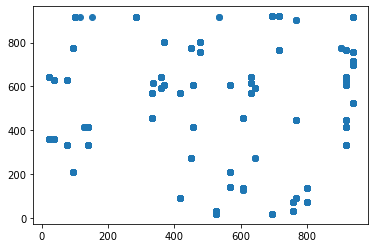

t+1 vs t-296


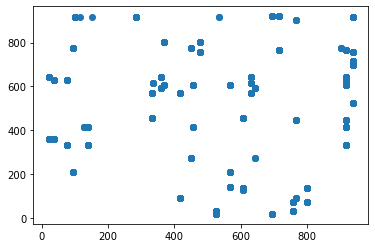

t+1 vs t-297


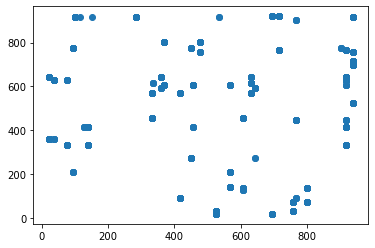

t+1 vs t-298


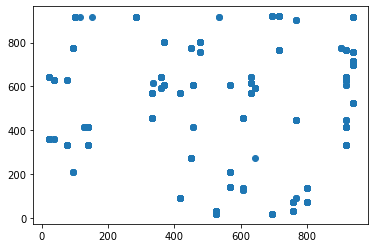

t+1 vs t-299


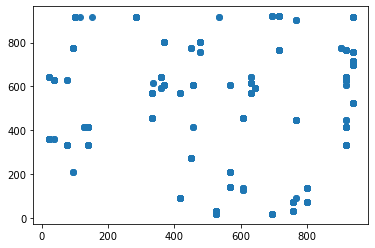

t+1 vs t-300


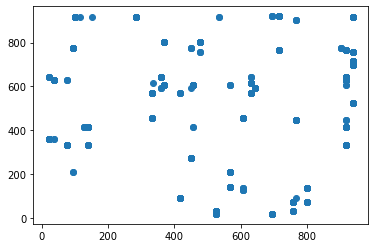

t+1 vs t-301


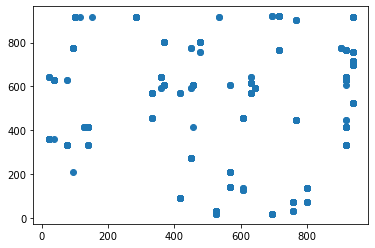

t+1 vs t-302


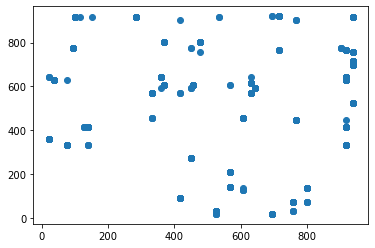

t+1 vs t-303


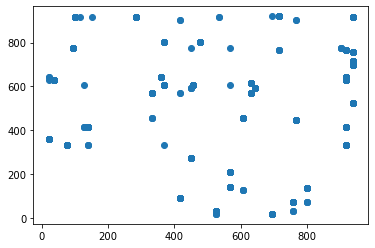

t+1 vs t-304


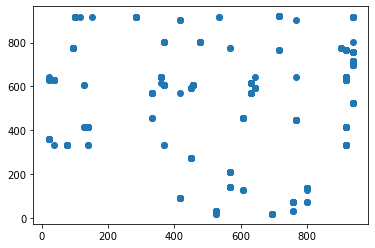

t+1 vs t-305


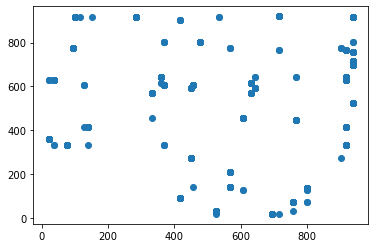

t+1 vs t-306


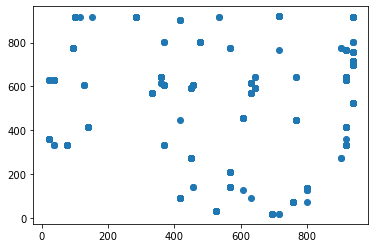

t+1 vs t-307


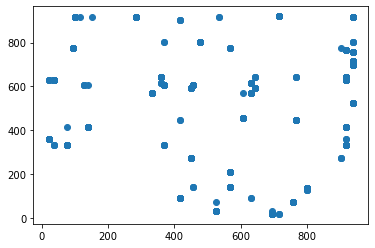

t+1 vs t-308


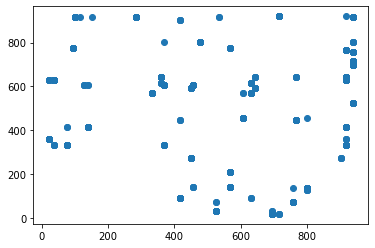

t+1 vs t-309


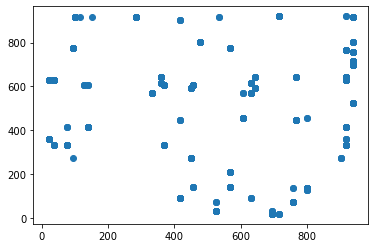

t+1 vs t-310


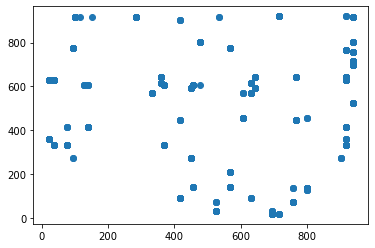

t+1 vs t-311


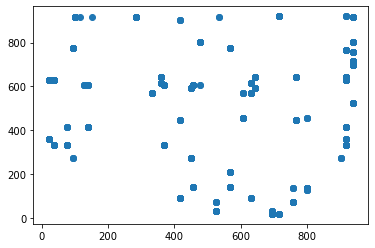

t+1 vs t-312


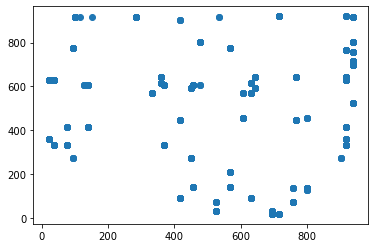

t+1 vs t-313


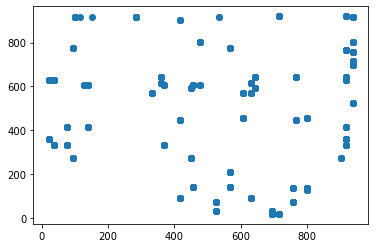

t+1 vs t-314


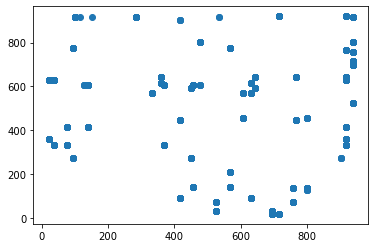

t+1 vs t-315


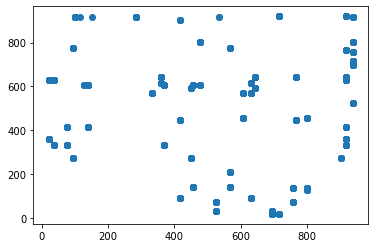

t+1 vs t-316


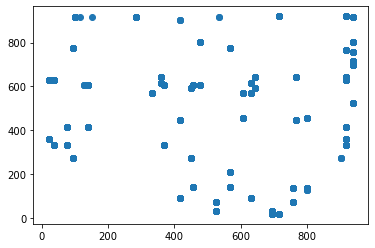

t+1 vs t-317


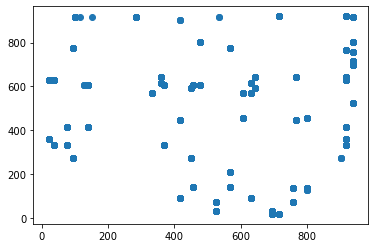

t+1 vs t-318


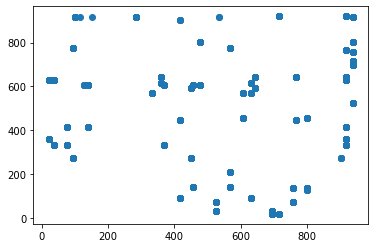

t+1 vs t-319


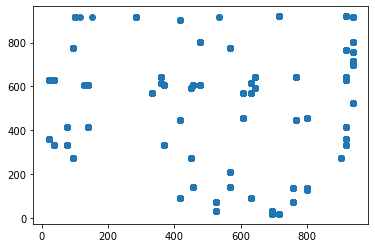

t+1 vs t-320


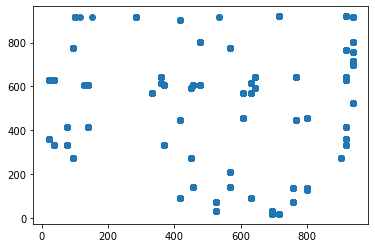

t+1 vs t-321


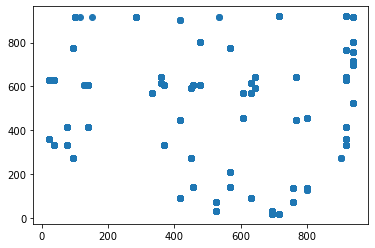

t+1 vs t-322


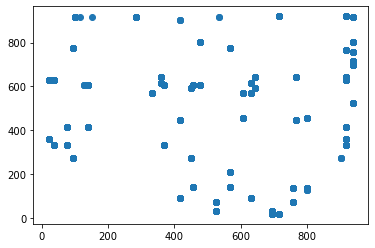

t+1 vs t-323


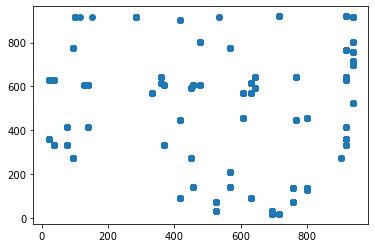

t+1 vs t-324


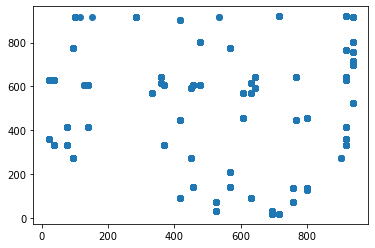

t+1 vs t-325


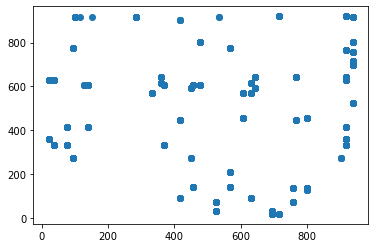

t+1 vs t-326


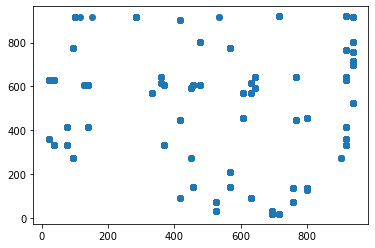

t+1 vs t-327


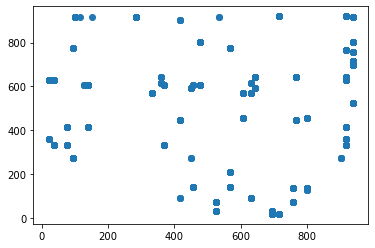

t+1 vs t-328


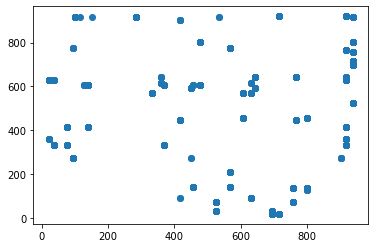

t+1 vs t-329


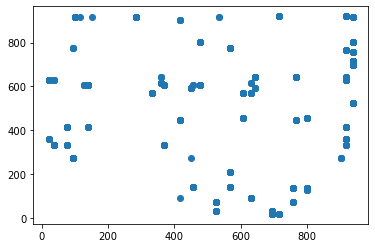

t+1 vs t-330


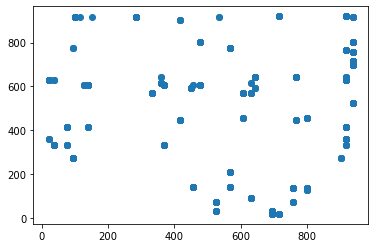

t+1 vs t-331


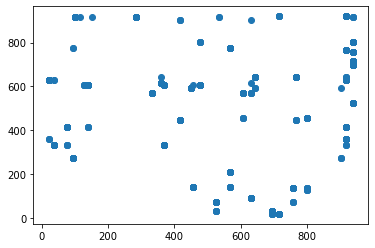

t+1 vs t-332


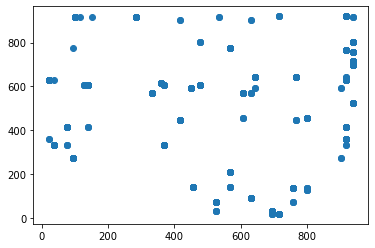

t+1 vs t-333


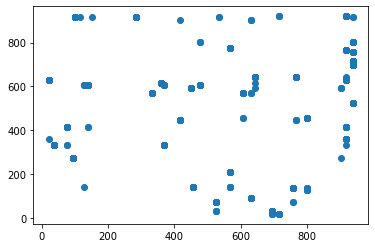

t+1 vs t-334


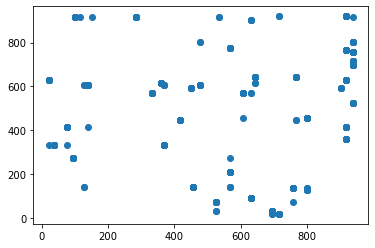

t+1 vs t-335


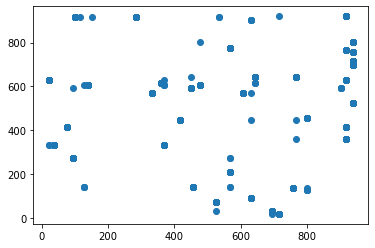

t+1 vs t-336


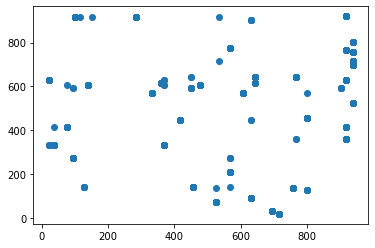

t+1 vs t-337


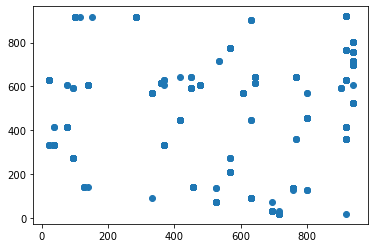

t+1 vs t-338


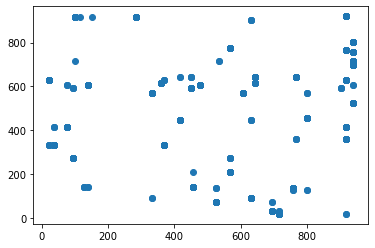

t+1 vs t-339


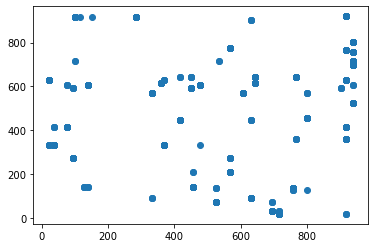

t+1 vs t-340


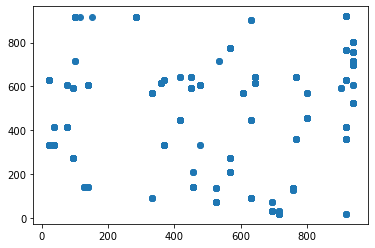

t+1 vs t-341


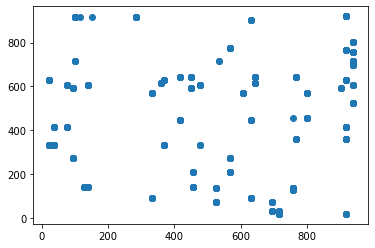

t+1 vs t-342


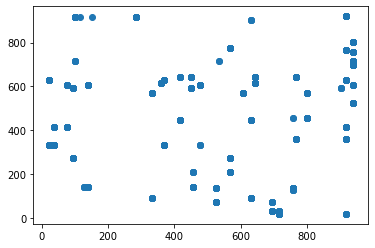

t+1 vs t-343


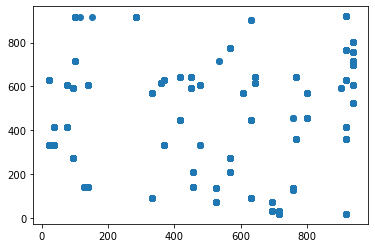

t+1 vs t-344


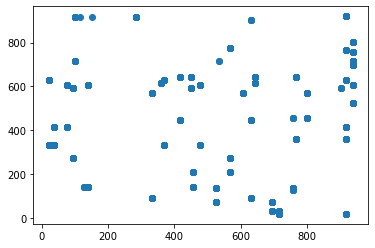

t+1 vs t-345


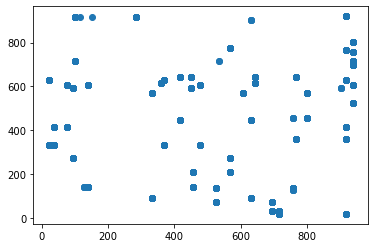

t+1 vs t-346


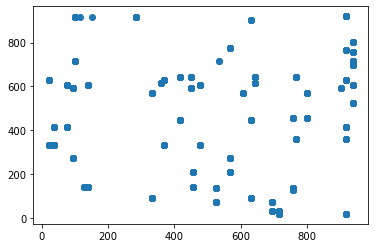

t+1 vs t-347


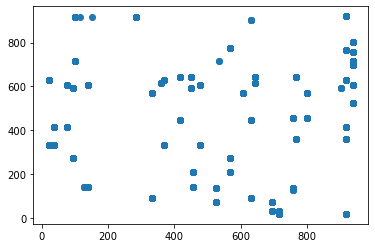

t+1 vs t-348


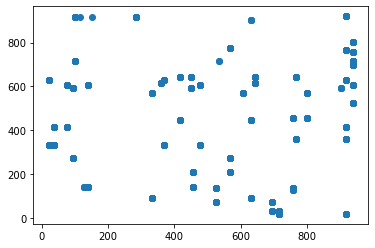

t+1 vs t-349


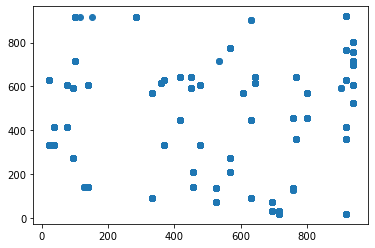

t+1 vs t-350


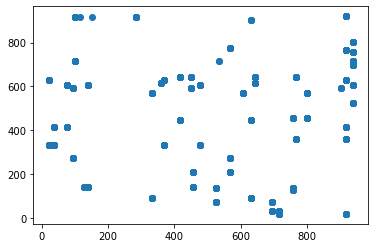

t+1 vs t-351


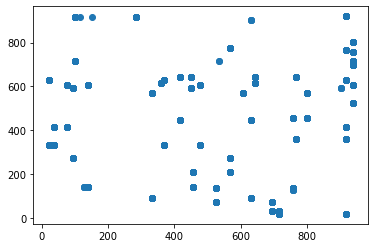

t+1 vs t-352


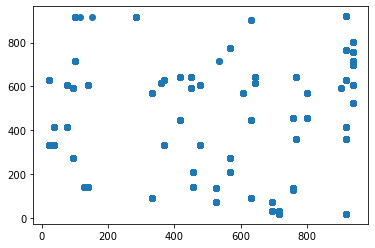

t+1 vs t-353


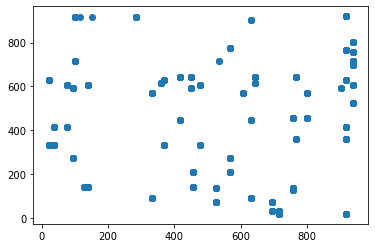

t+1 vs t-354


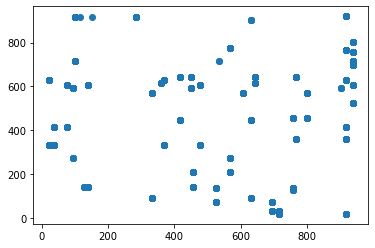

t+1 vs t-355


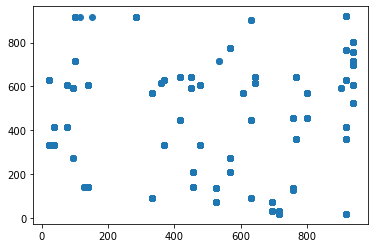

t+1 vs t-356


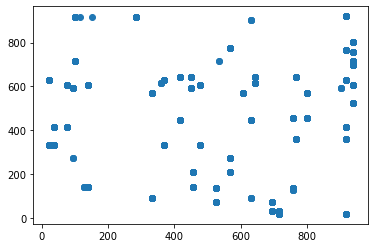

t+1 vs t-357


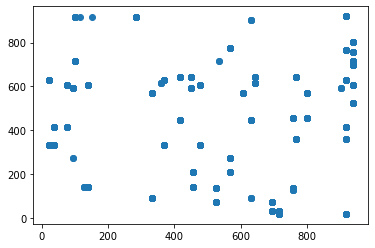

t+1 vs t-358


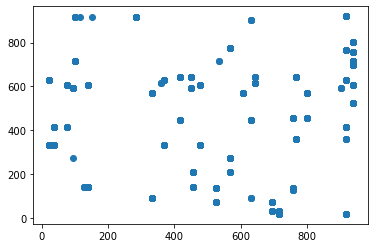

t+1 vs t-359


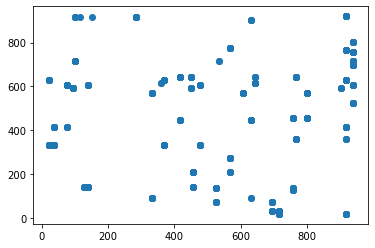

t+1 vs t-360


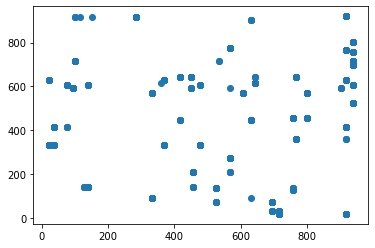

t+1 vs t-361


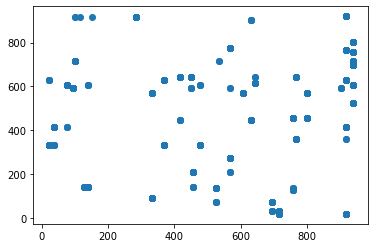

t+1 vs t-362


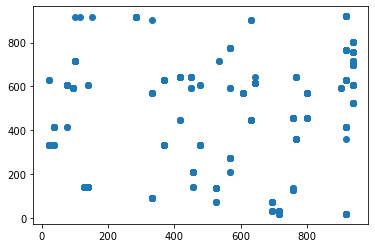

t+1 vs t-363


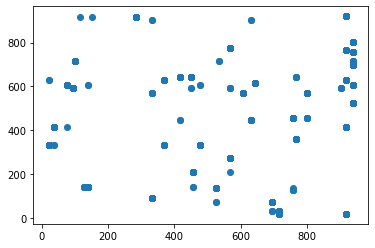

t+1 vs t-364


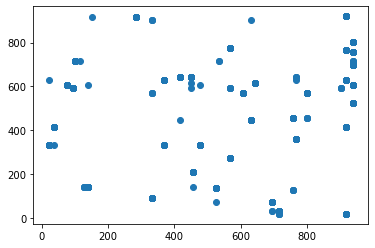

t+1 vs t-365


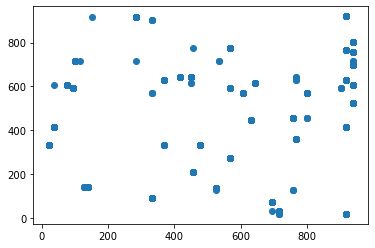

t+1 vs t-366


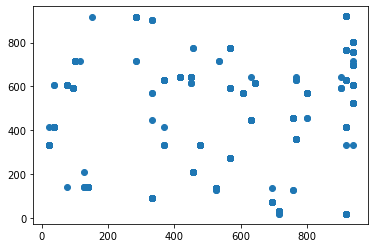

t+1 vs t-367


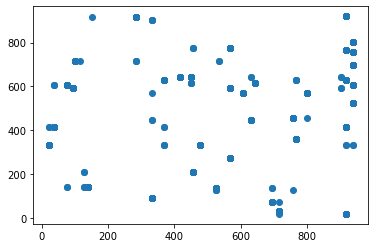

t+1 vs t-368


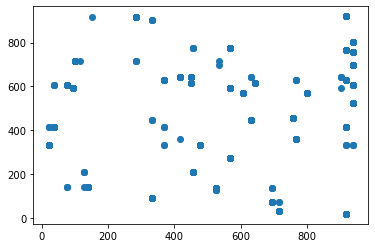

t+1 vs t-369


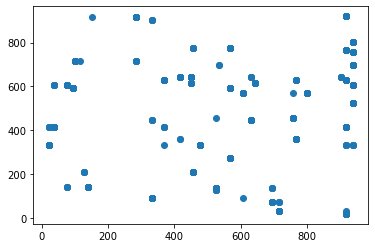

t+1 vs t-370


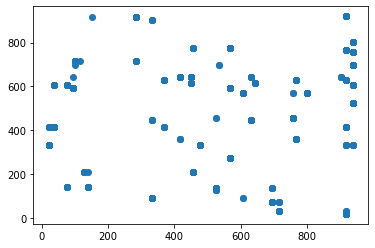

t+1 vs t-371


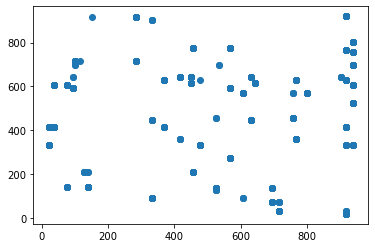

t+1 vs t-372


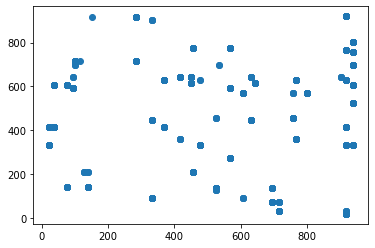

t+1 vs t-373


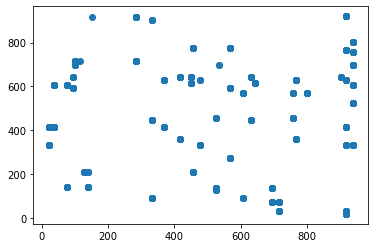

t+1 vs t-374


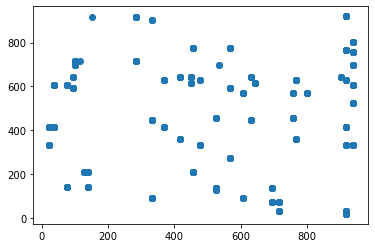

t+1 vs t-375


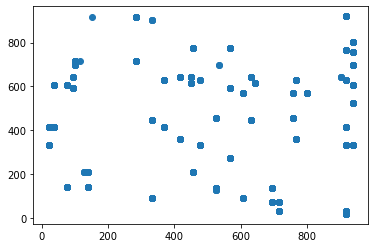

t+1 vs t-376


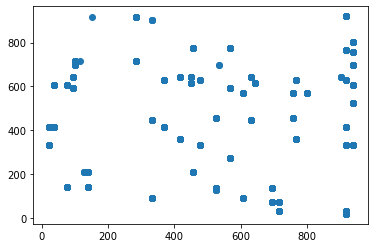

t+1 vs t-377


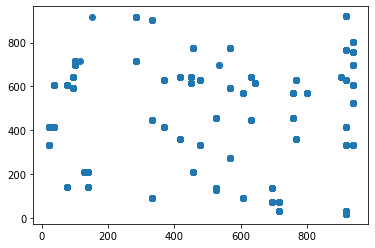

t+1 vs t-378


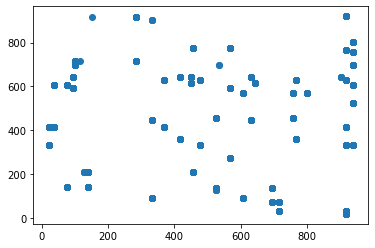

t+1 vs t-379


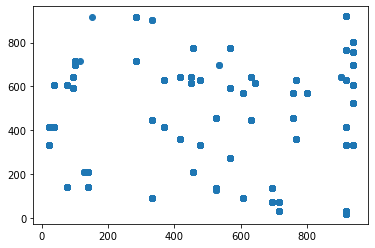

t+1 vs t-380


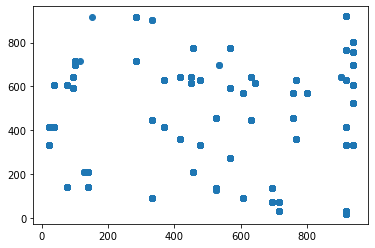

t+1 vs t-381


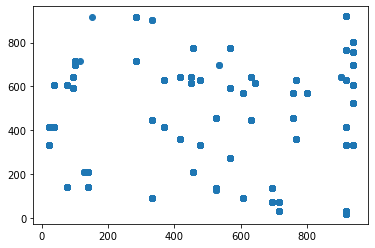

t+1 vs t-382


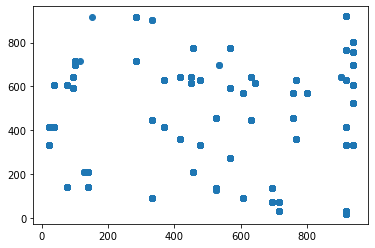

t+1 vs t-383


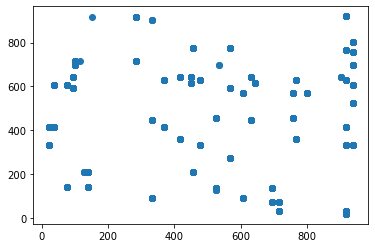

t+1 vs t-384


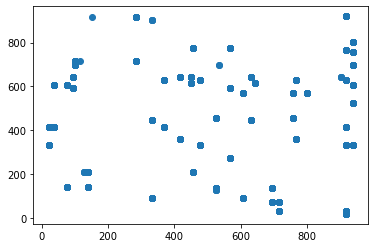

t+1 vs t-385


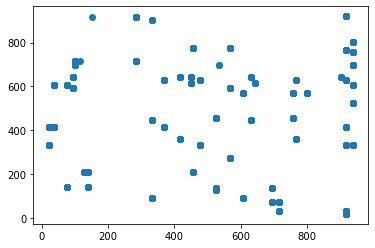

t+1 vs t-386


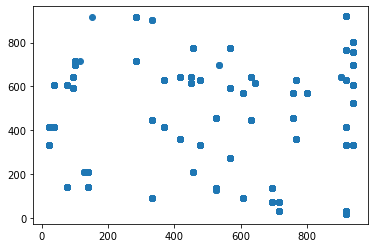

t+1 vs t-387


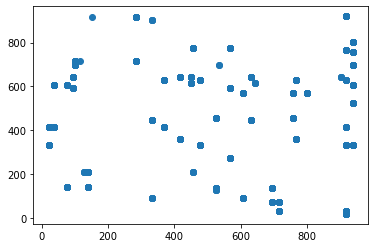

t+1 vs t-388


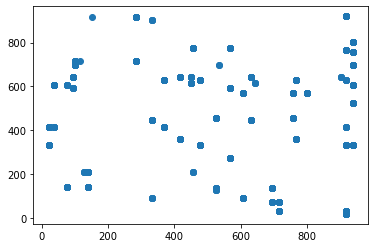

t+1 vs t-389


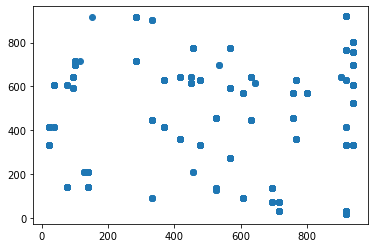

t+1 vs t-390


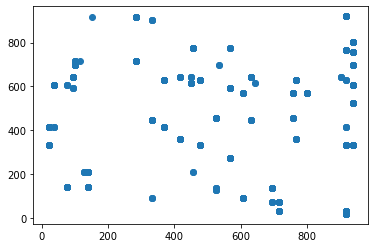

t+1 vs t-391


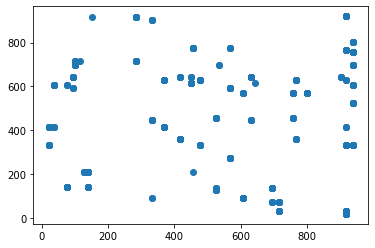

t+1 vs t-392


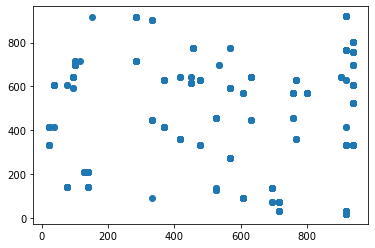

t+1 vs t-393


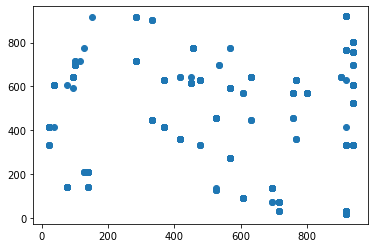

t+1 vs t-394


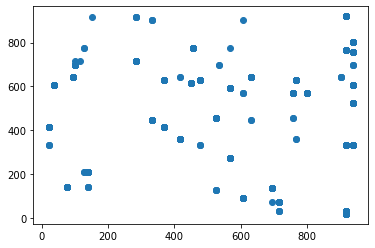

t+1 vs t-395


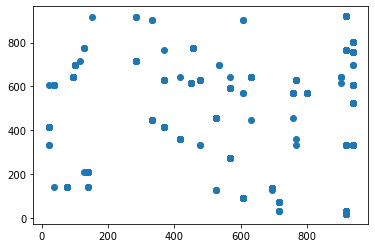

t+1 vs t-396


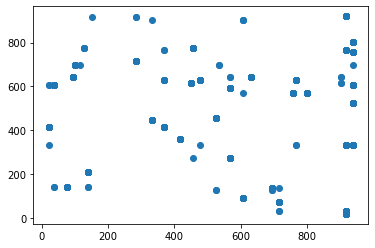

t+1 vs t-397


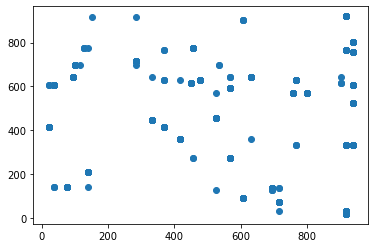

t+1 vs t-398


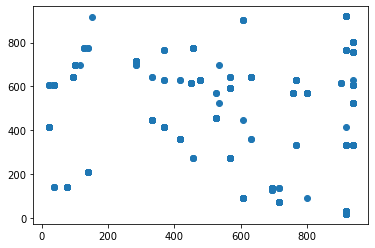

t+1 vs t-399


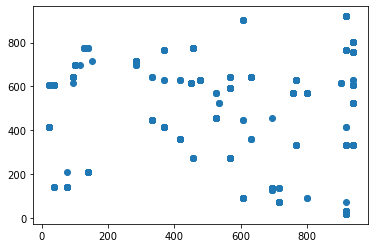

t+1 vs t-400


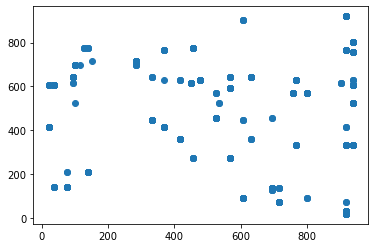

t+1 vs t-401


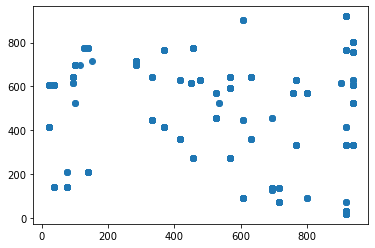

t+1 vs t-402


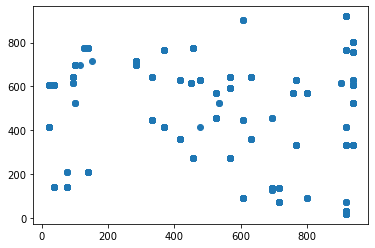

t+1 vs t-403


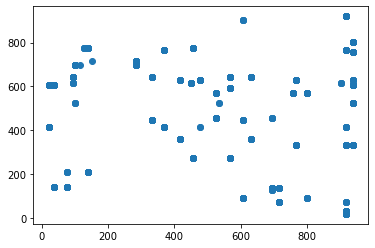

t+1 vs t-404


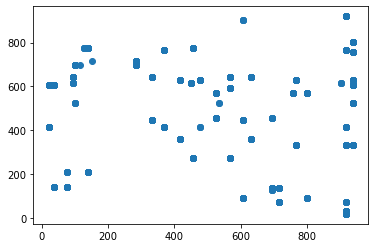

t+1 vs t-405


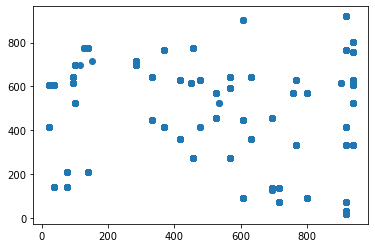

t+1 vs t-406


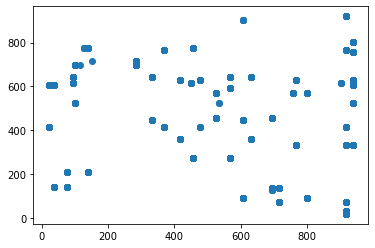

t+1 vs t-407


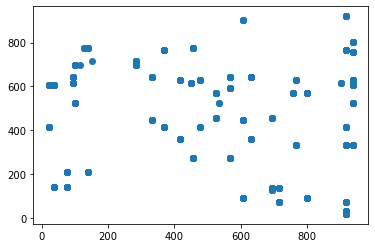

t+1 vs t-408


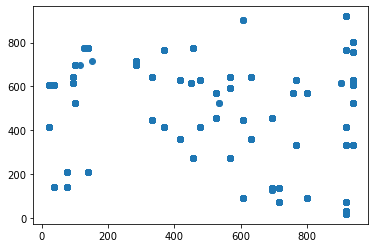

t+1 vs t-409


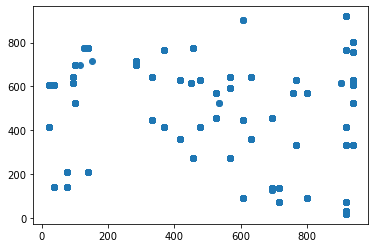

t+1 vs t-410


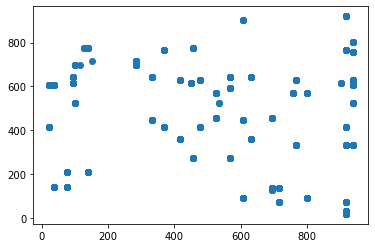

t+1 vs t-411


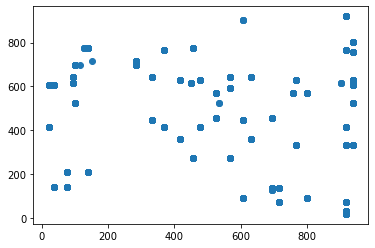

t+1 vs t-412


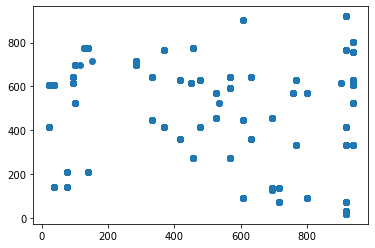

t+1 vs t-413


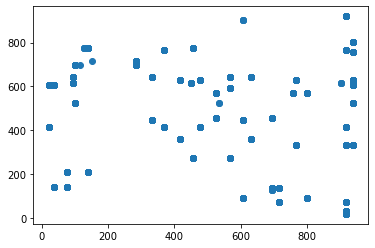

t+1 vs t-414


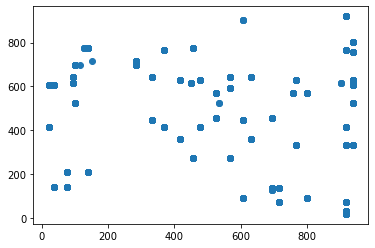

t+1 vs t-415


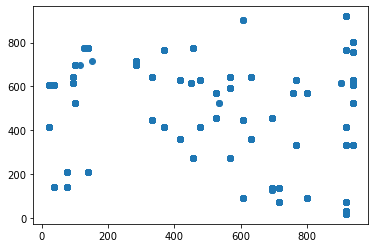

t+1 vs t-416


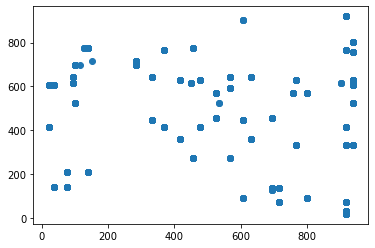

t+1 vs t-417


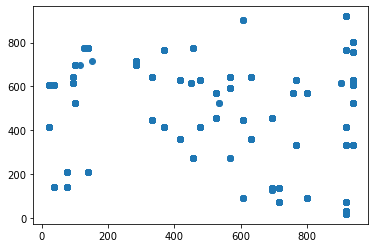

t+1 vs t-418


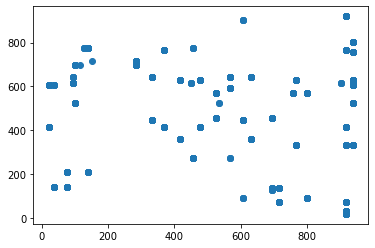

t+1 vs t-419


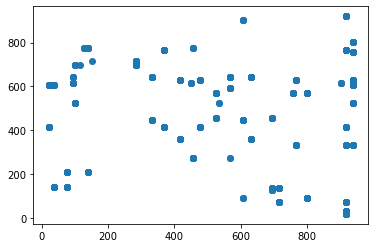

t+1 vs t-420


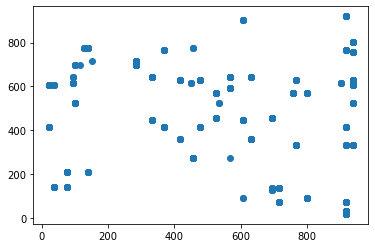

t+1 vs t-421


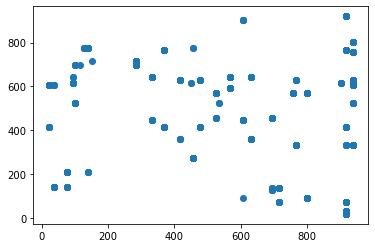

t+1 vs t-422


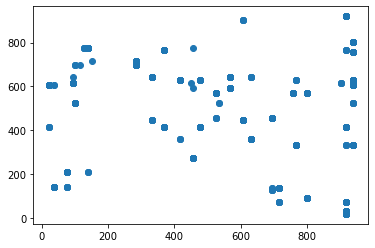

t+1 vs t-423


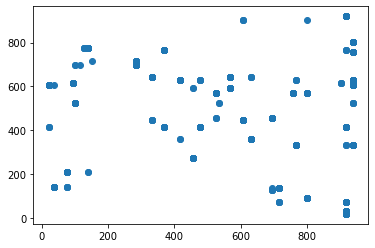

t+1 vs t-424


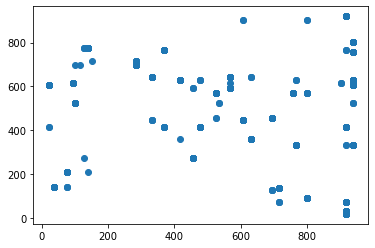

t+1 vs t-425


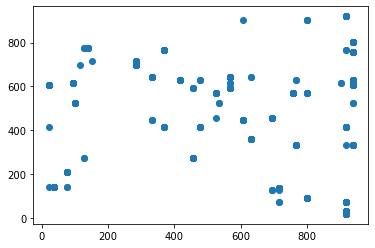

t+1 vs t-426


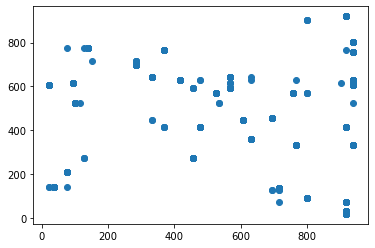

t+1 vs t-427


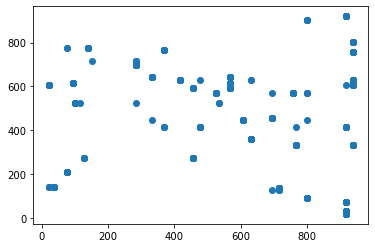

t+1 vs t-428


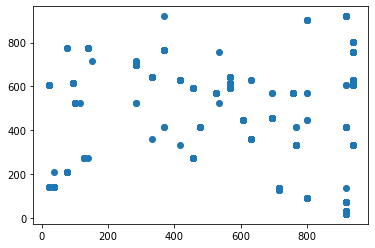

t+1 vs t-429


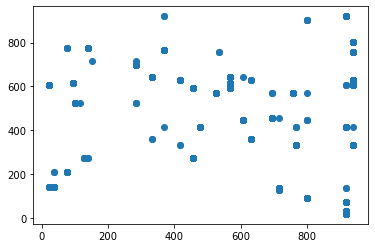

t+1 vs t-430


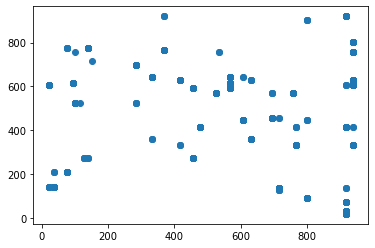

t+1 vs t-431


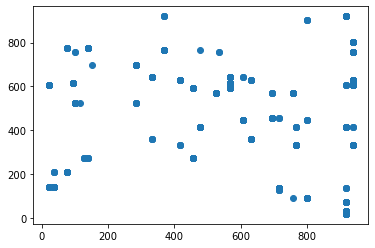

t+1 vs t-432


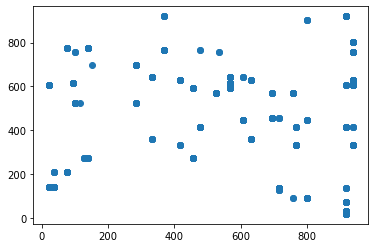

t+1 vs t-433


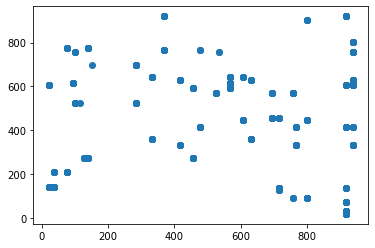

t+1 vs t-434


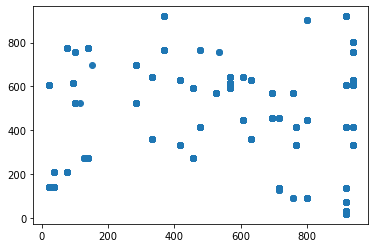

t+1 vs t-435


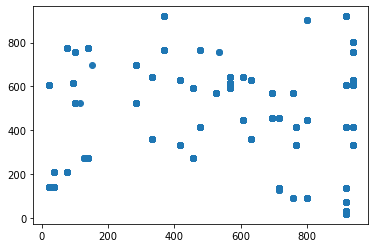

t+1 vs t-436


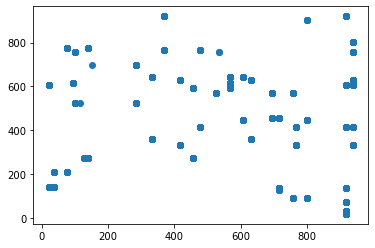

t+1 vs t-437


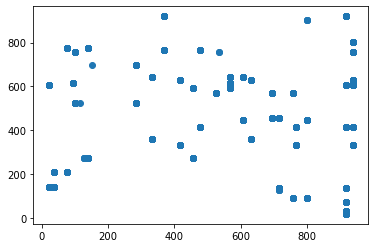

t+1 vs t-438


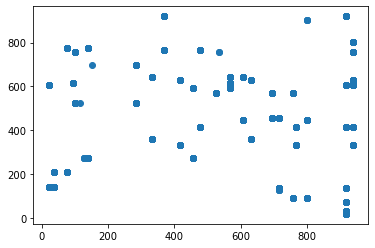

t+1 vs t-439


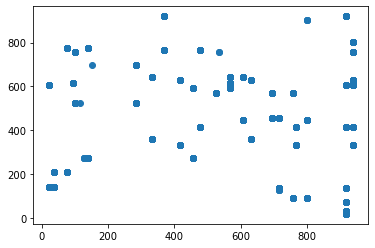

t+1 vs t-440


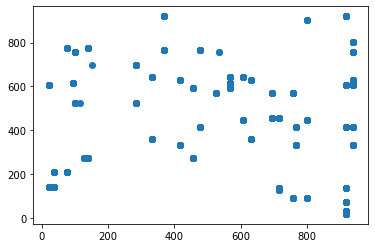

t+1 vs t-441


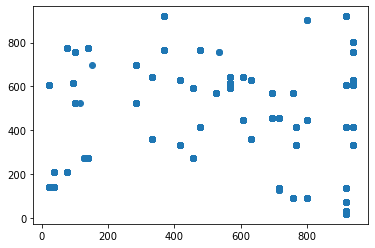

t+1 vs t-442


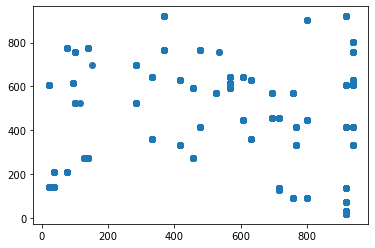

t+1 vs t-443


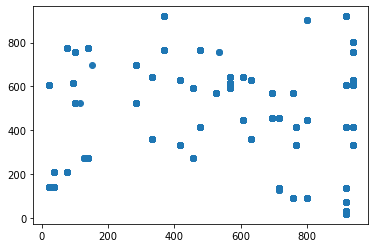

t+1 vs t-444


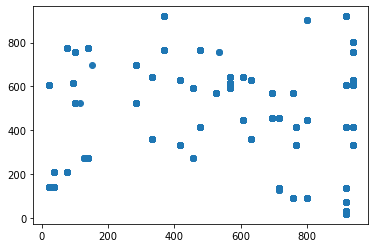

t+1 vs t-445


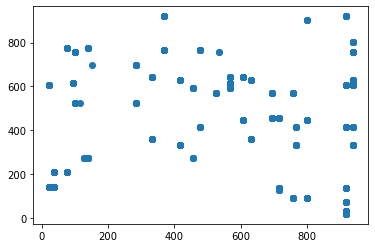

t+1 vs t-446


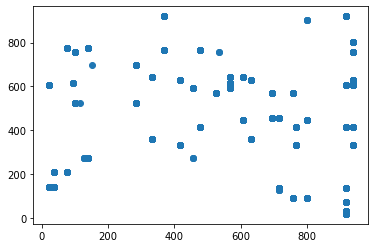

t+1 vs t-447


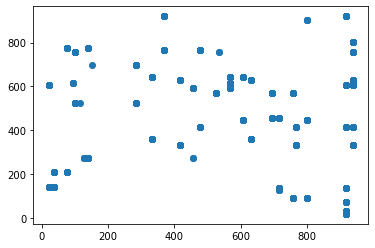

t+1 vs t-448


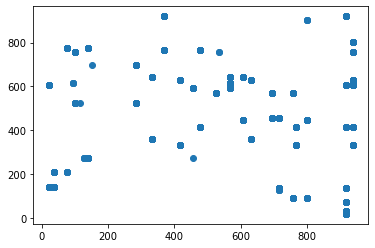

t+1 vs t-449


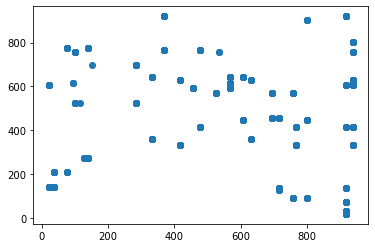

t+1 vs t-450


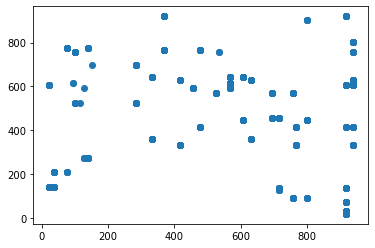

t+1 vs t-451


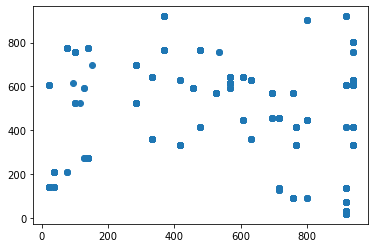

t+1 vs t-452


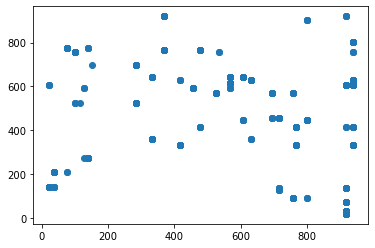

t+1 vs t-453


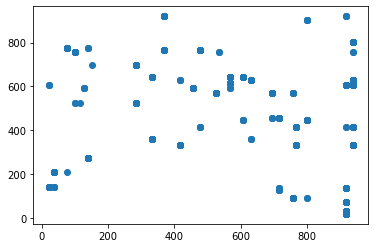

t+1 vs t-454


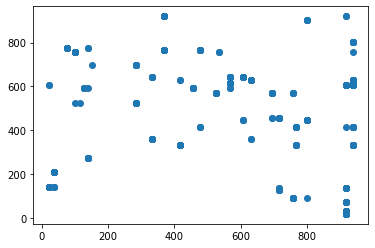

t+1 vs t-455


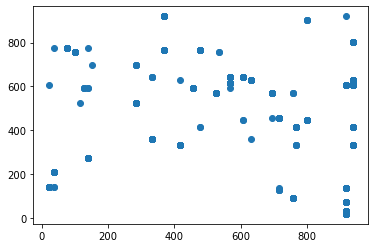

t+1 vs t-456


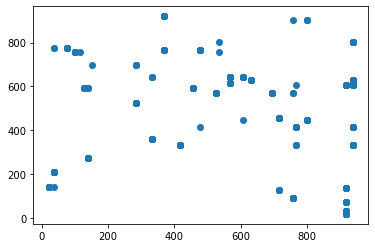

t+1 vs t-457


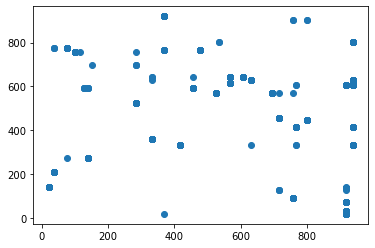

t+1 vs t-458


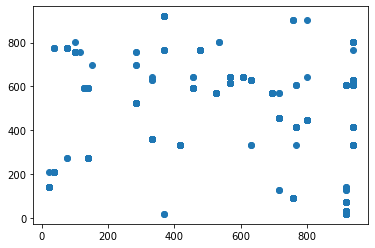

t+1 vs t-459


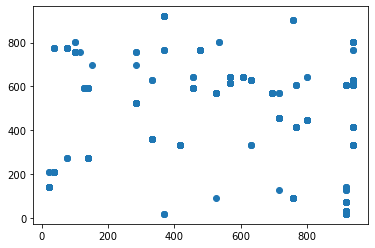

t+1 vs t-460


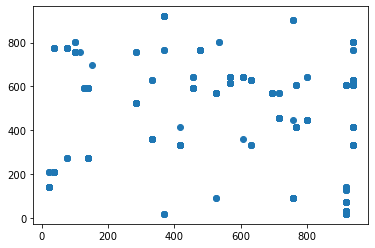

t+1 vs t-461


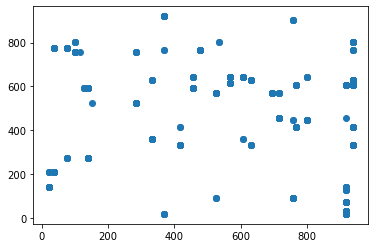

t+1 vs t-462


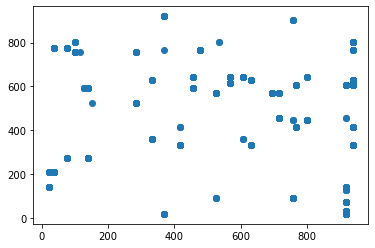

t+1 vs t-463


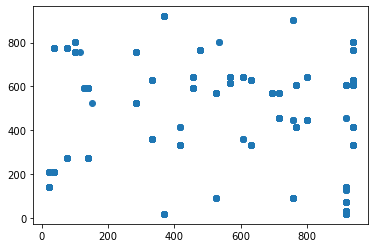

t+1 vs t-464


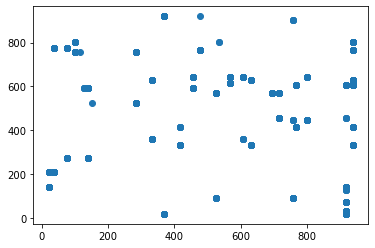

t+1 vs t-465


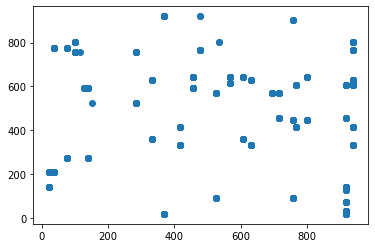

t+1 vs t-466


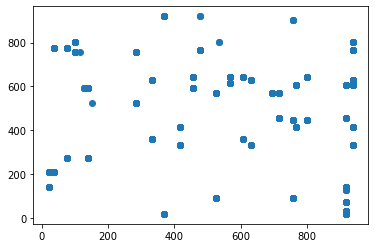

t+1 vs t-467


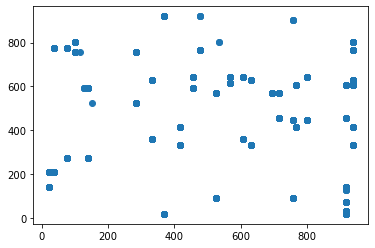

t+1 vs t-468


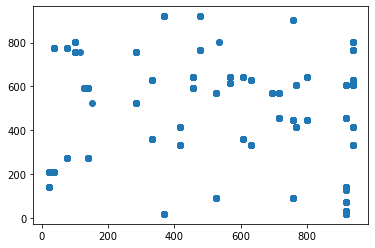

t+1 vs t-469


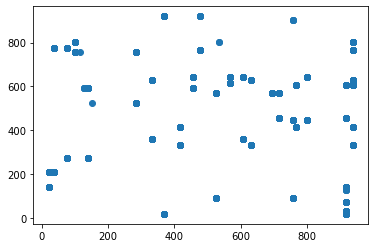

t+1 vs t-470


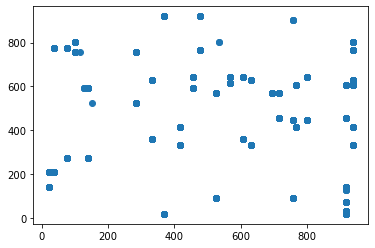

t+1 vs t-471


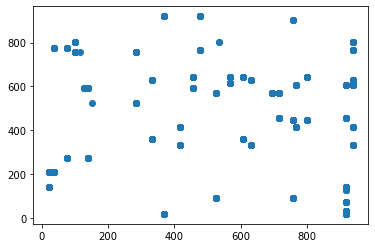

t+1 vs t-472


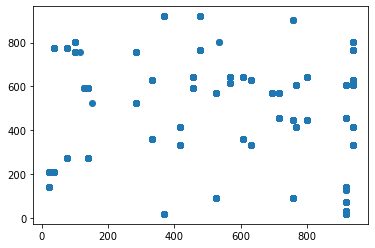

t+1 vs t-473


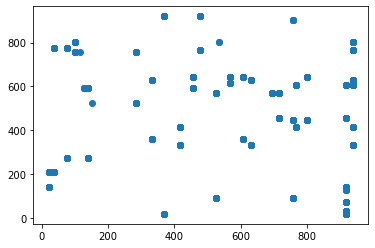

t+1 vs t-474


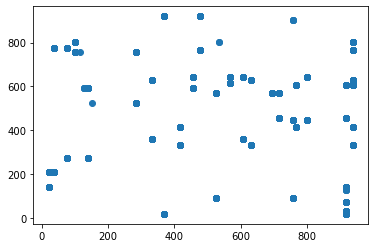

t+1 vs t-475


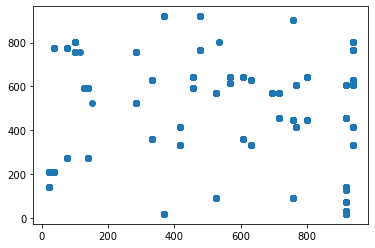

t+1 vs t-476


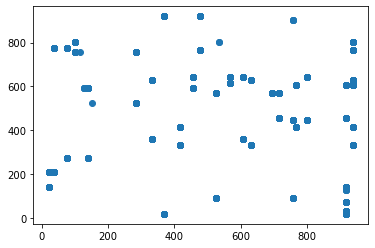

t+1 vs t-477


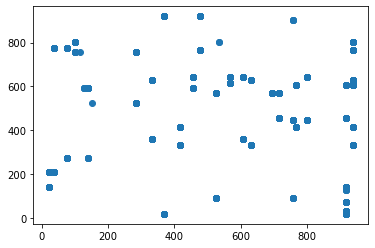

t+1 vs t-478


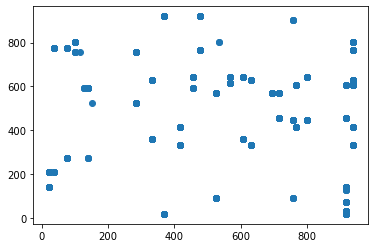

t+1 vs t-479


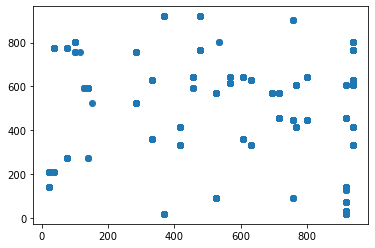

t+1 vs t-480


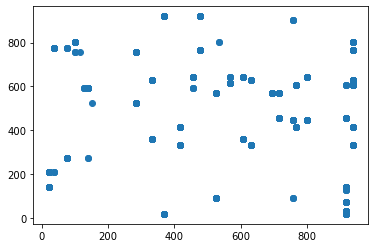

t+1 vs t-481


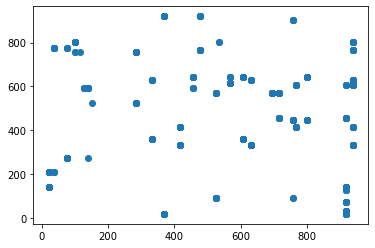

t+1 vs t-482


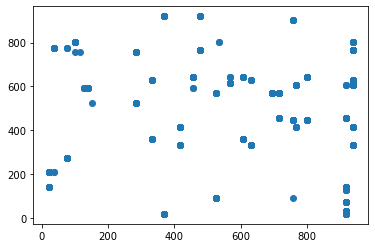

t+1 vs t-483


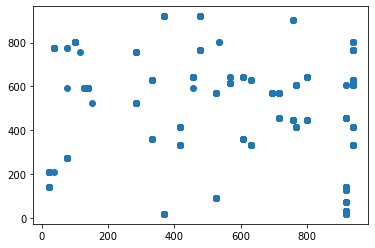

t+1 vs t-484


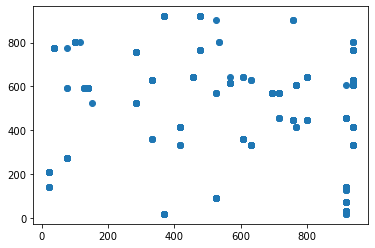

t+1 vs t-485


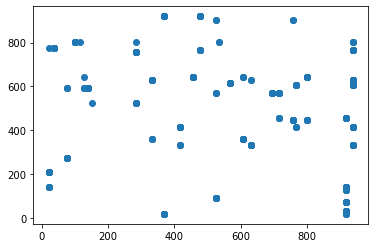

t+1 vs t-486


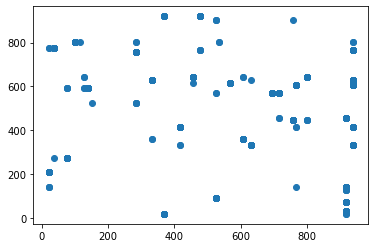

t+1 vs t-487


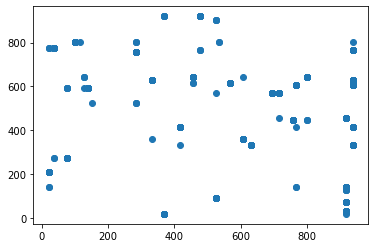

t+1 vs t-488


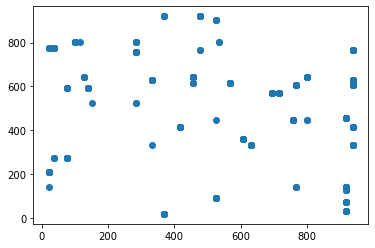

t+1 vs t-489


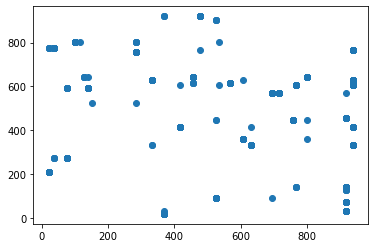

t+1 vs t-490


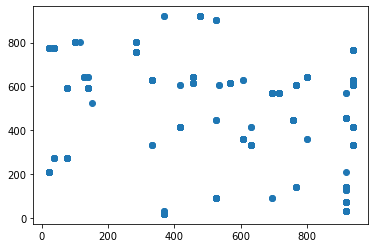

t+1 vs t-491


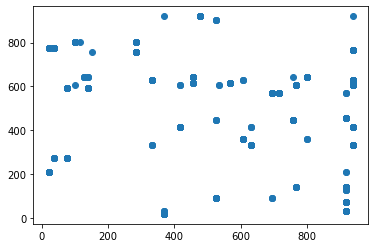

t+1 vs t-492


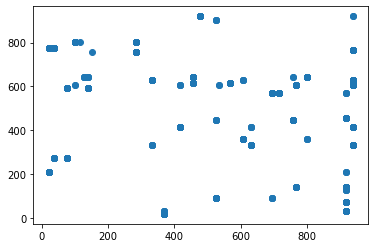

t+1 vs t-493


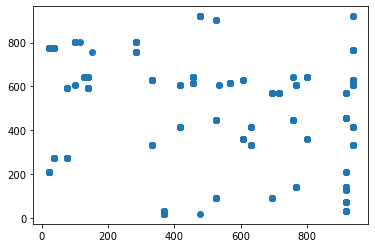

t+1 vs t-494


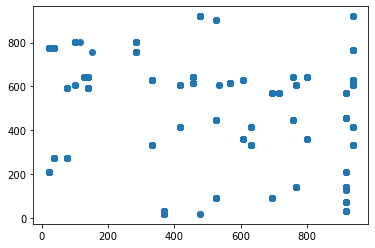

t+1 vs t-495


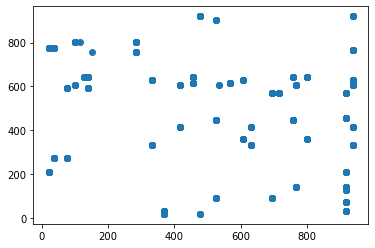

t+1 vs t-496


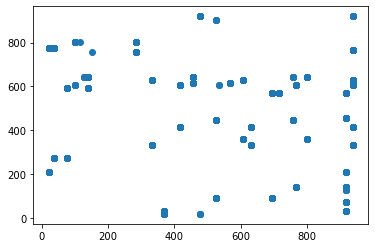

t+1 vs t-497


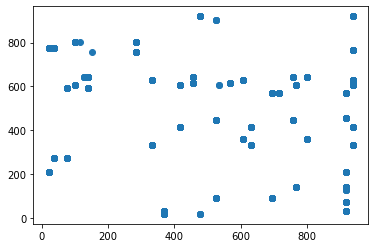

t+1 vs t-498


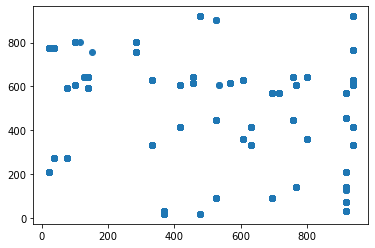

t+1 vs t-499


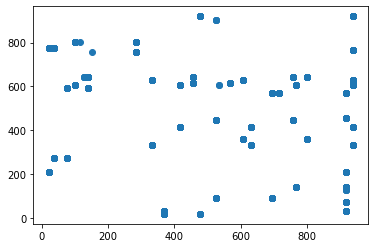

t+1 vs t-500


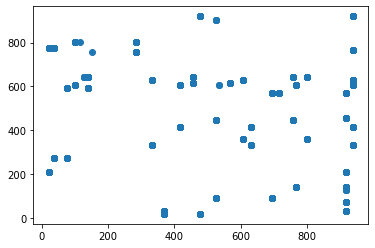

t+1 vs t-501


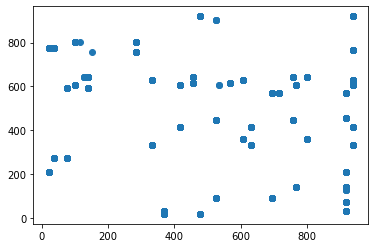

t+1 vs t-502


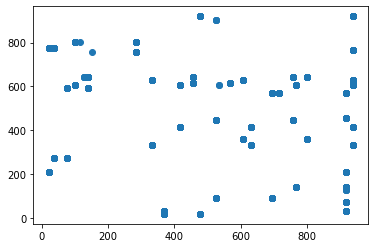

t+1 vs t-503


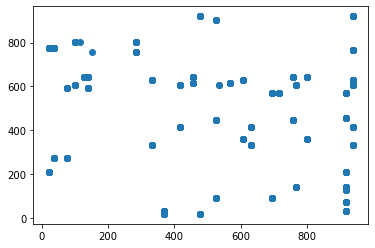

t+1 vs t-504


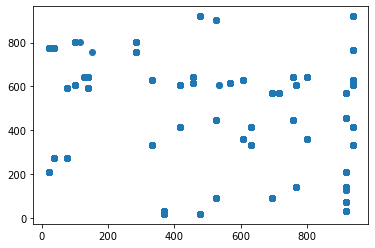

t+1 vs t-505


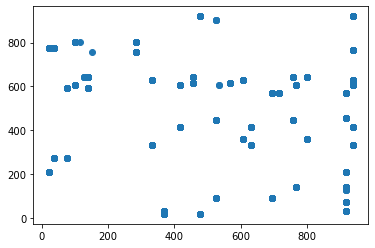

t+1 vs t-506


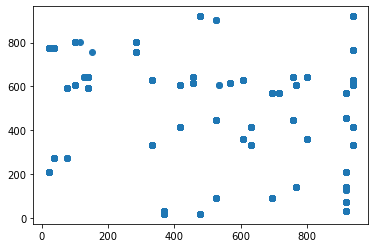

t+1 vs t-507


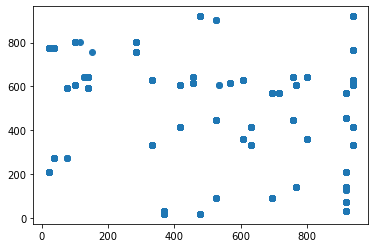

t+1 vs t-508


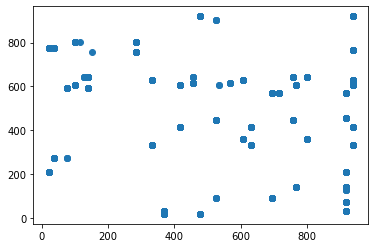

t+1 vs t-509


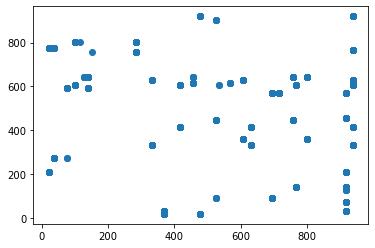

t+1 vs t-510


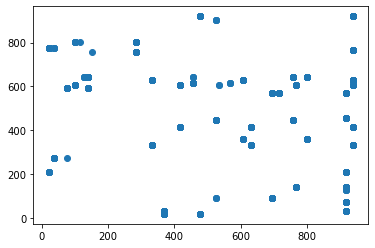

t+1 vs t-511


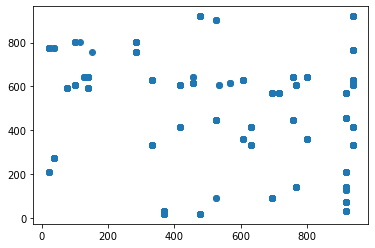

t+1 vs t-512


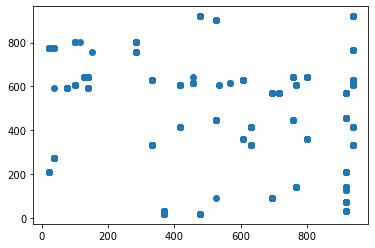

t+1 vs t-513


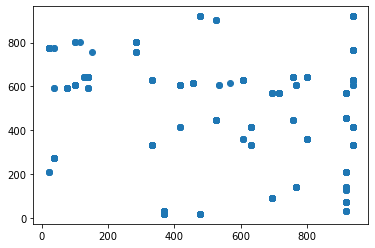

t+1 vs t-514


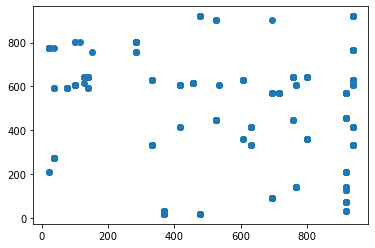

t+1 vs t-515


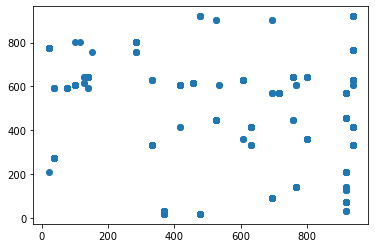

t+1 vs t-516


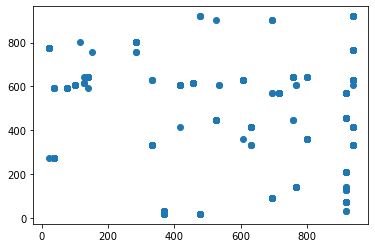

t+1 vs t-517


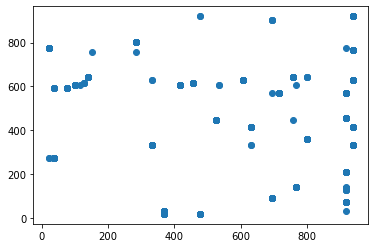

t+1 vs t-518


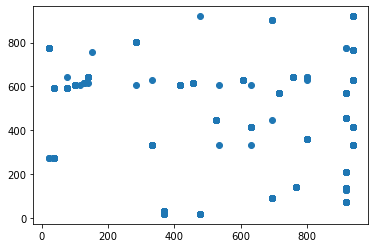

t+1 vs t-519


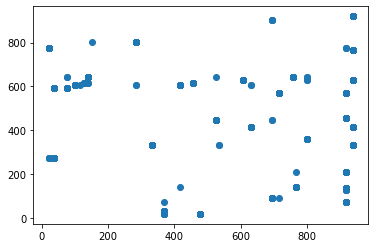

t+1 vs t-520


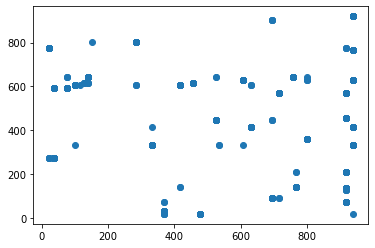

t+1 vs t-521


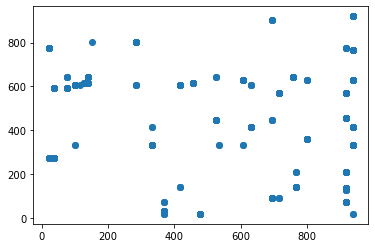

t+1 vs t-522


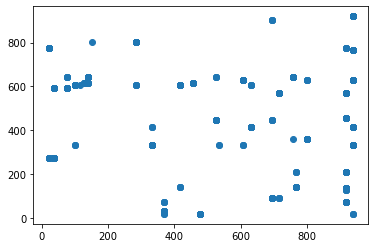

t+1 vs t-523


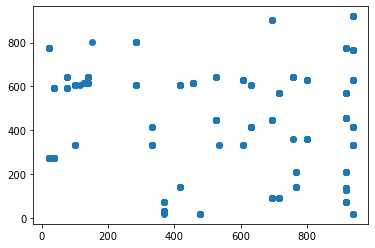

t+1 vs t-524


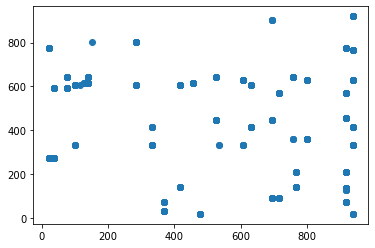

t+1 vs t-525


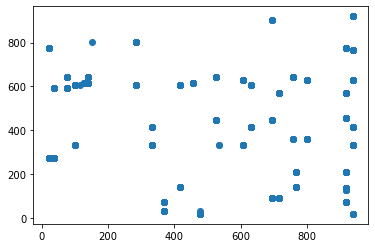

t+1 vs t-526


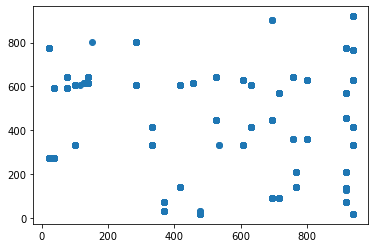

t+1 vs t-527


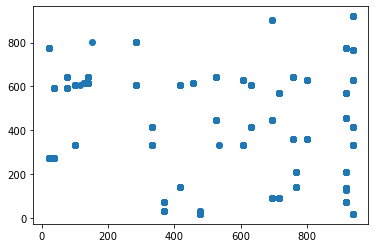

t+1 vs t-528


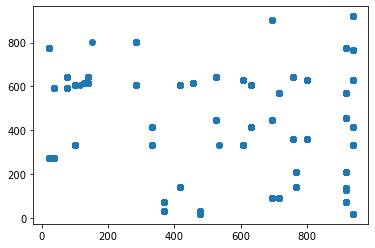

t+1 vs t-529


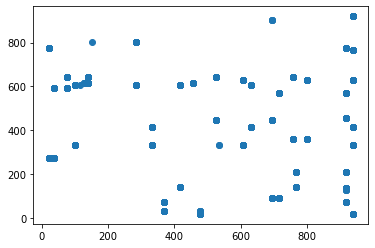

t+1 vs t-530


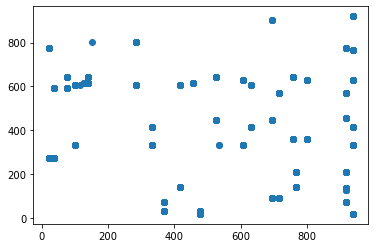

t+1 vs t-531


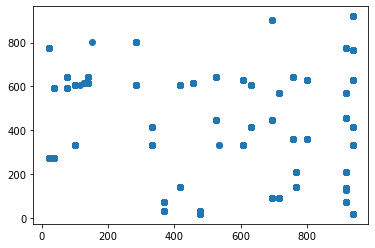

t+1 vs t-532


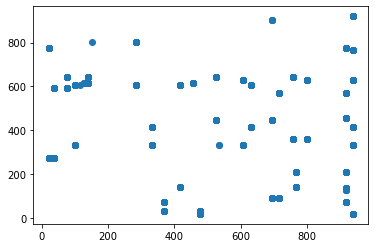

t+1 vs t-533


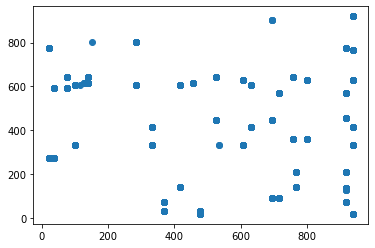

t+1 vs t-534


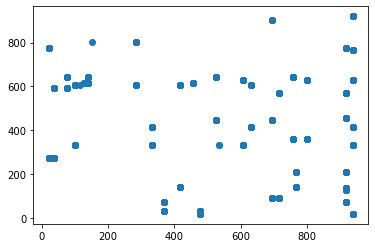

t+1 vs t-535


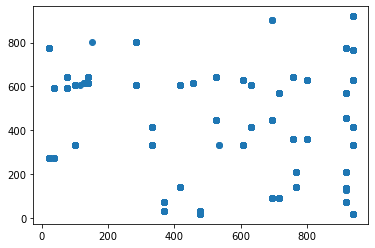

t+1 vs t-536


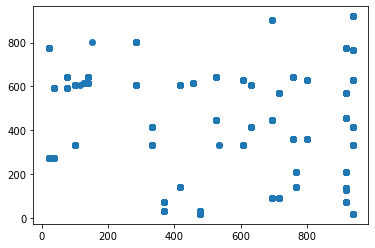

t+1 vs t-537


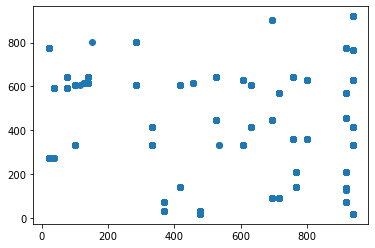

t+1 vs t-538


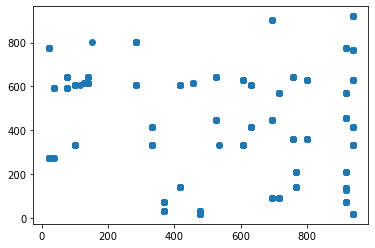

t+1 vs t-539


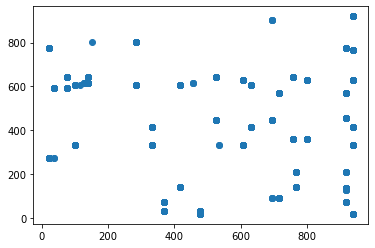

t+1 vs t-540


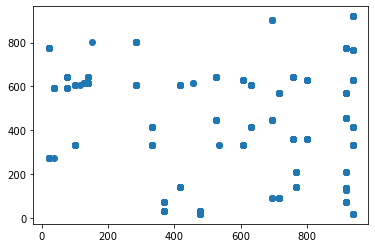

t+1 vs t-541


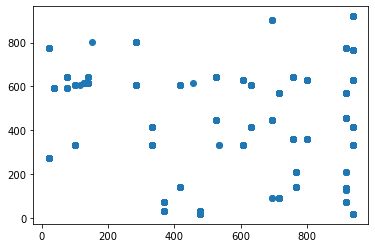

t+1 vs t-542


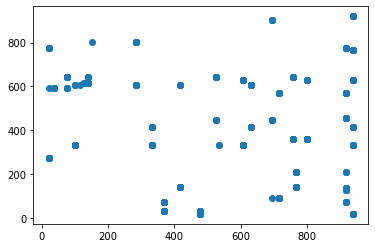

t+1 vs t-543


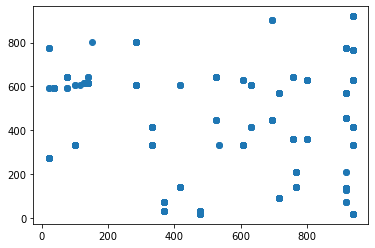

t+1 vs t-544


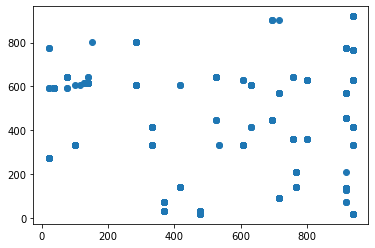

t+1 vs t-545


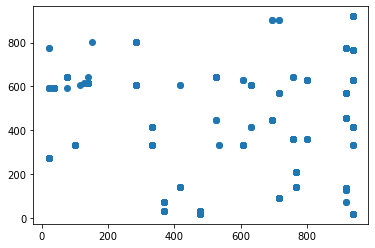

t+1 vs t-546


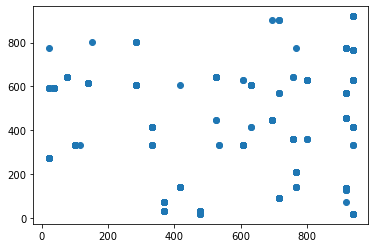

t+1 vs t-547


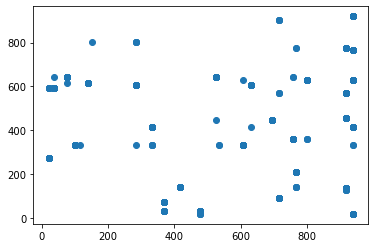

t+1 vs t-548


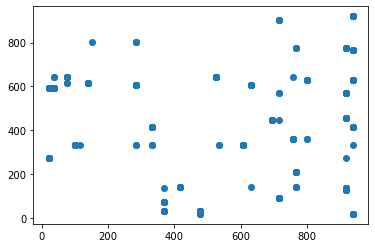

t+1 vs t-549


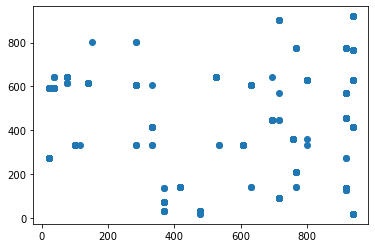

t+1 vs t-550


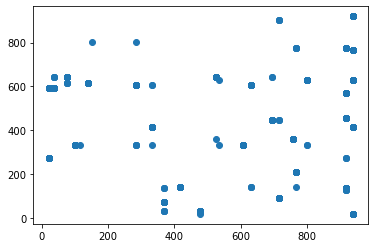

t+1 vs t-551


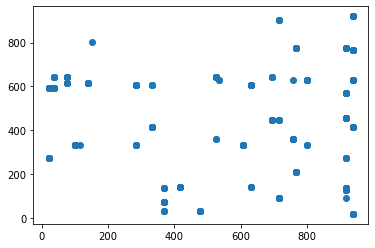

t+1 vs t-552


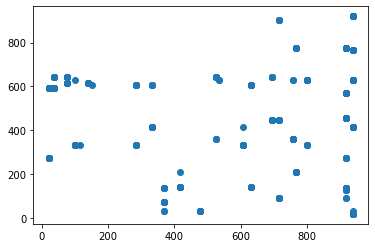

t+1 vs t-553


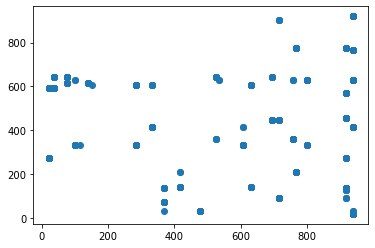

t+1 vs t-554


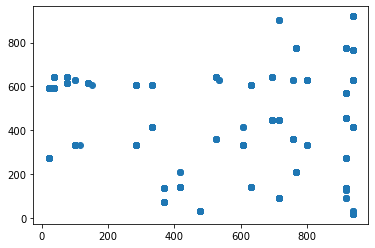

t+1 vs t-555


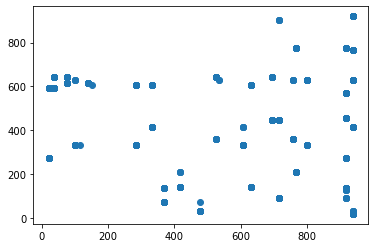

t+1 vs t-556


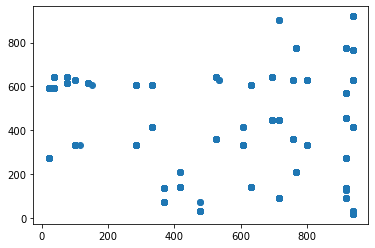

t+1 vs t-557


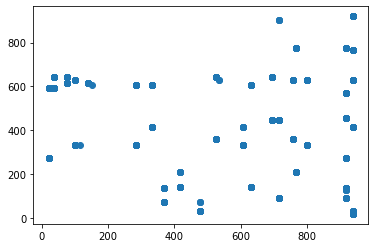

t+1 vs t-558


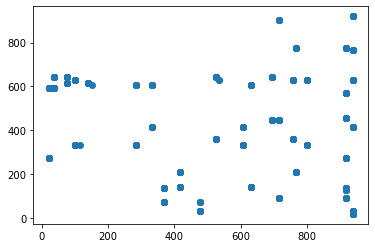

t+1 vs t-559


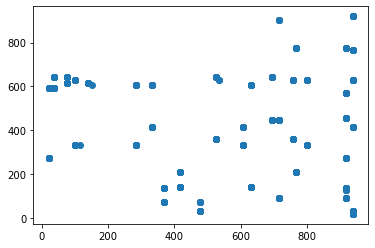

t+1 vs t-560


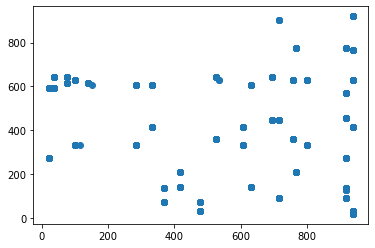

t+1 vs t-561


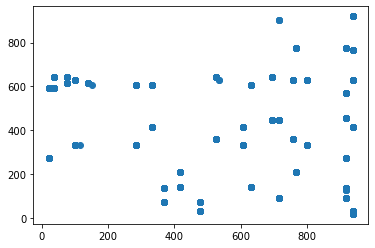

t+1 vs t-562


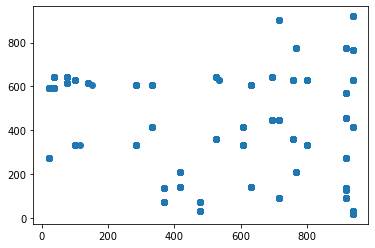

t+1 vs t-563


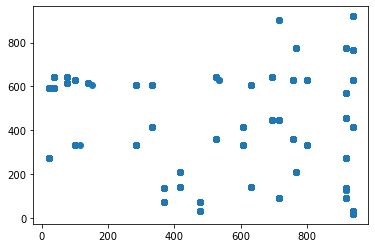

t+1 vs t-564


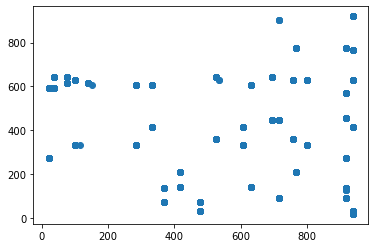

t+1 vs t-565


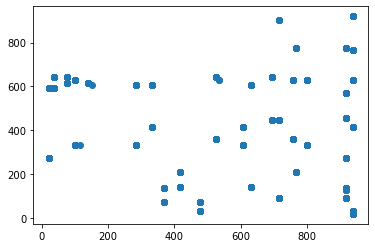

t+1 vs t-566


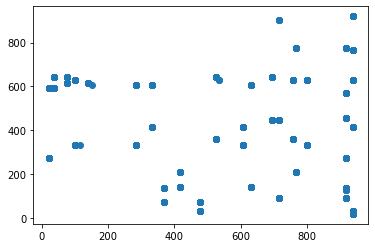

t+1 vs t-567


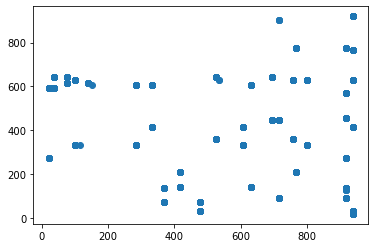

t+1 vs t-568


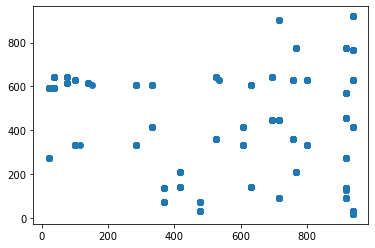

t+1 vs t-569


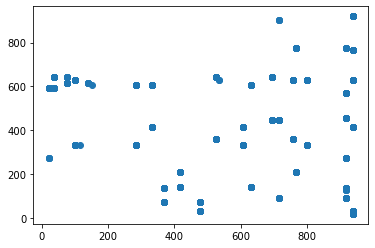

t+1 vs t-570


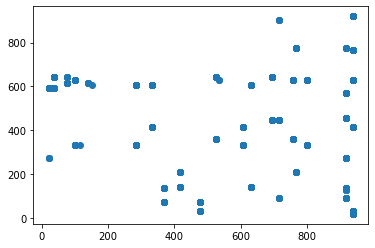

t+1 vs t-571


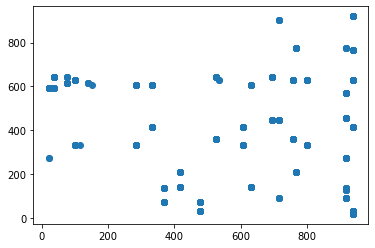

t+1 vs t-572


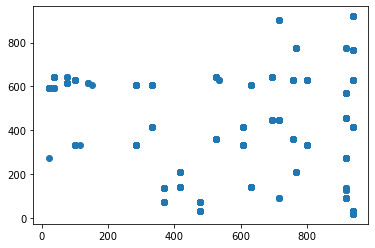

t+1 vs t-573


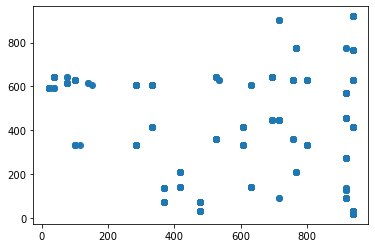

t+1 vs t-574


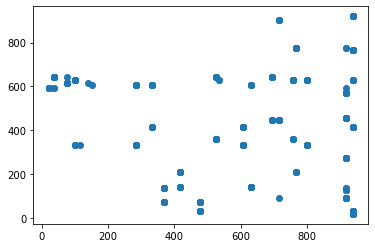

t+1 vs t-575


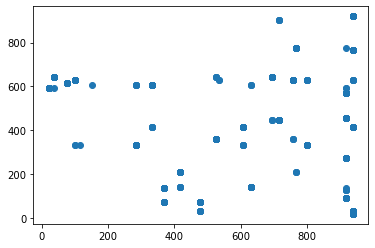

t+1 vs t-576


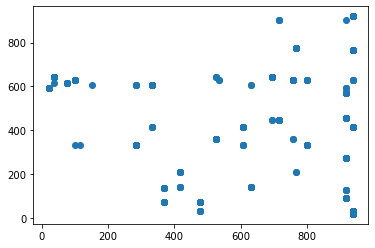

t+1 vs t-577


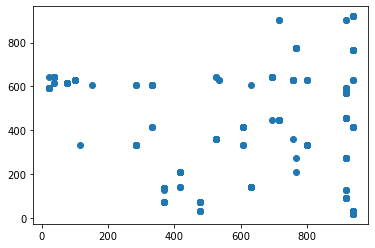

t+1 vs t-578


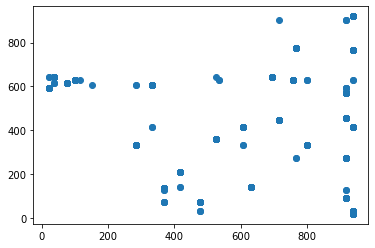

t+1 vs t-579


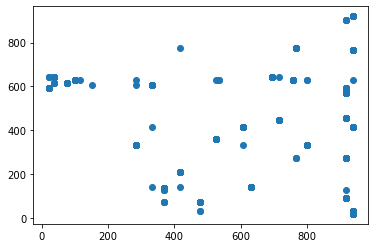

t+1 vs t-580


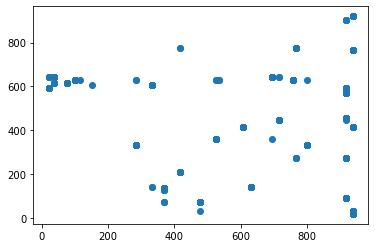

t+1 vs t-581


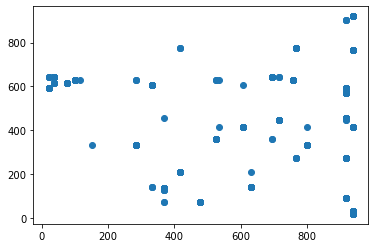

t+1 vs t-582


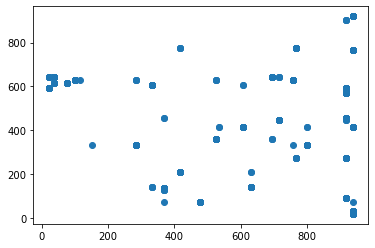

t+1 vs t-583


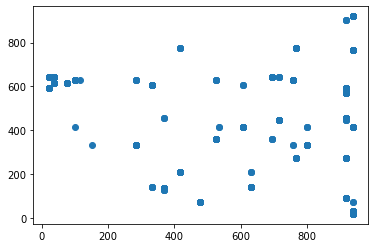

t+1 vs t-584


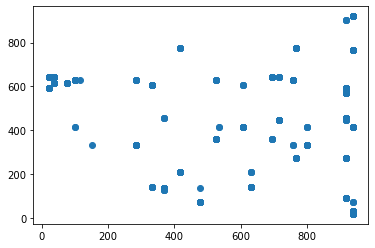

t+1 vs t-585


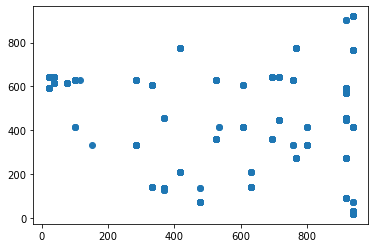

t+1 vs t-586


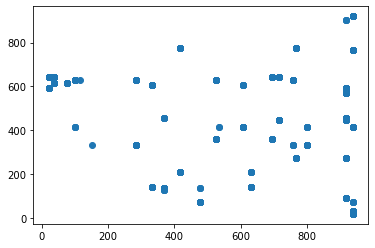

t+1 vs t-587


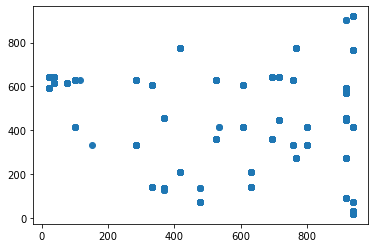

t+1 vs t-588


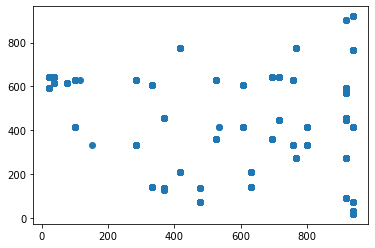

t+1 vs t-589


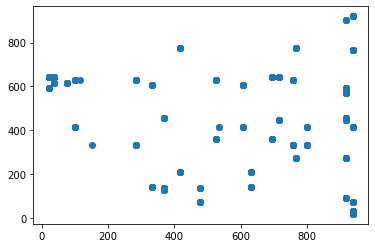

t+1 vs t-590


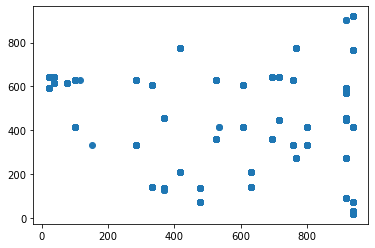

t+1 vs t-591


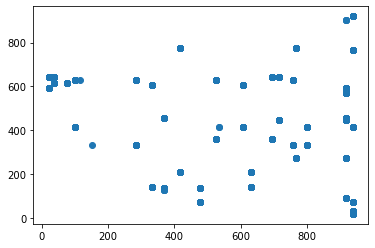

t+1 vs t-592


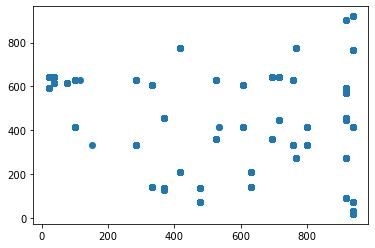

t+1 vs t-593


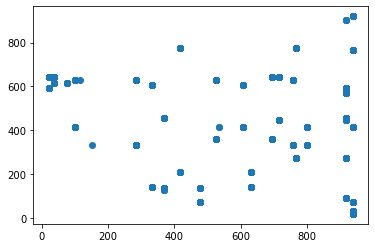

t+1 vs t-594


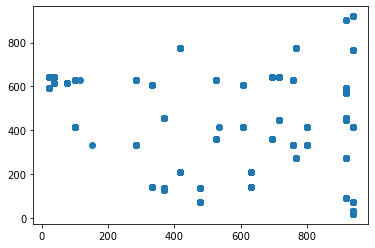

t+1 vs t-595


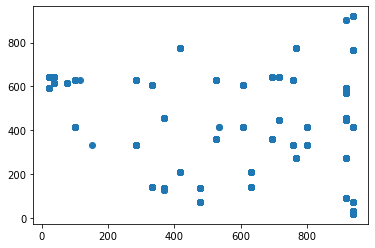

t+1 vs t-596


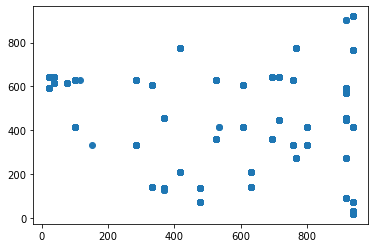

t+1 vs t-597


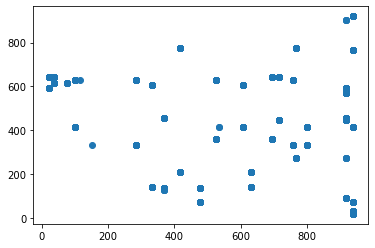

t+1 vs t-598


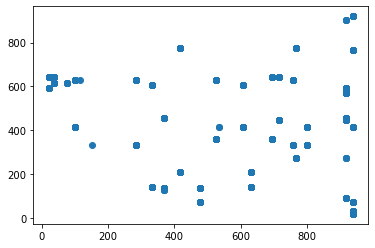

t+1 vs t-599


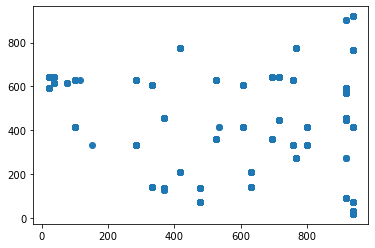

t+1 vs t-600


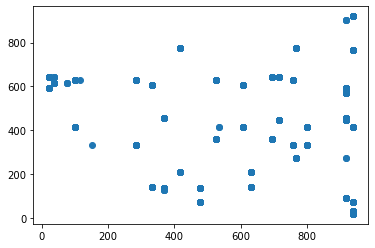

t+1 vs t-601


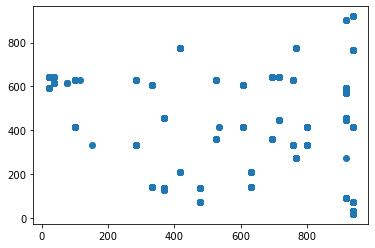

t+1 vs t-602


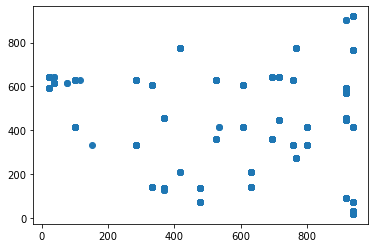

t+1 vs t-603


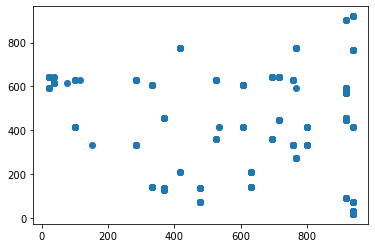

t+1 vs t-604


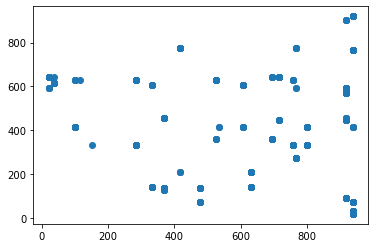

t+1 vs t-605


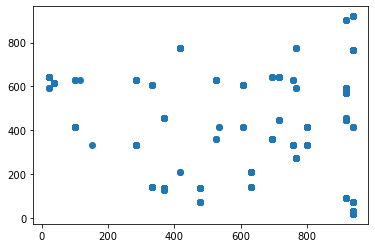

t+1 vs t-606


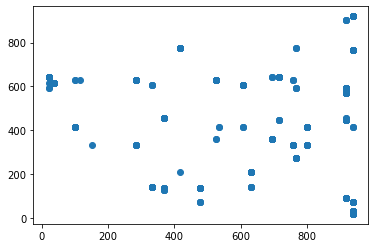

t+1 vs t-607


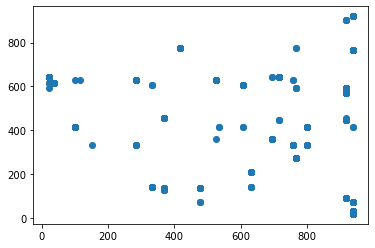

t+1 vs t-608


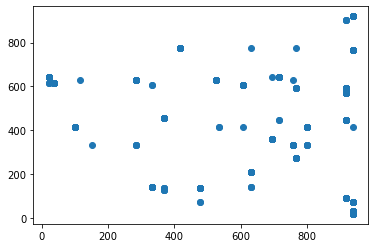

t+1 vs t-609


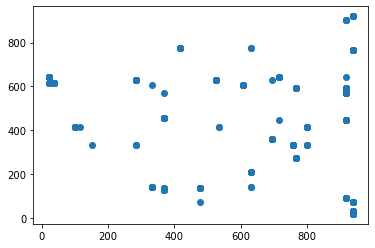

t+1 vs t-610


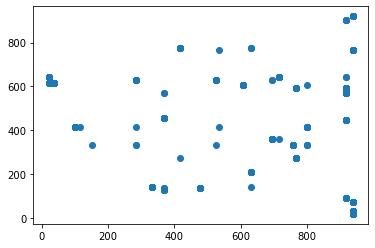

t+1 vs t-611


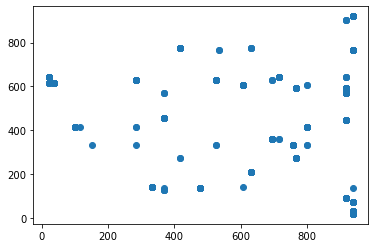

t+1 vs t-612


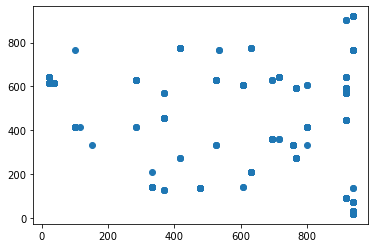

t+1 vs t-613


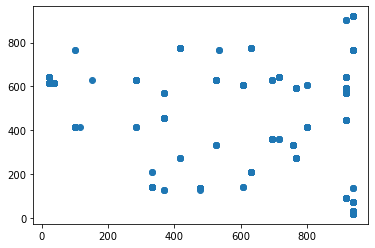

t+1 vs t-614


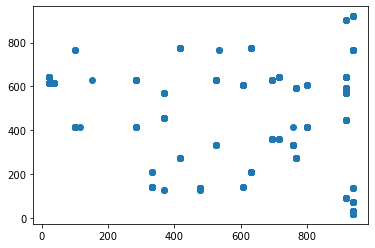

t+1 vs t-615


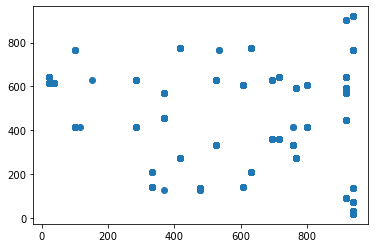

t+1 vs t-616


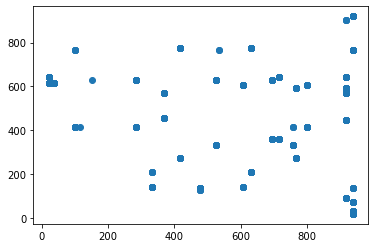

t+1 vs t-617


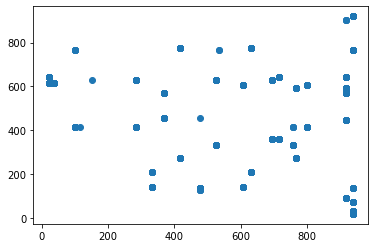

t+1 vs t-618


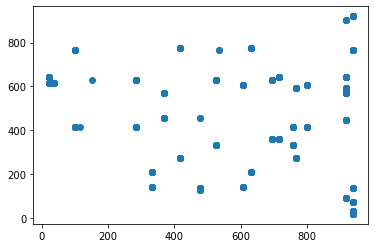

t+1 vs t-619


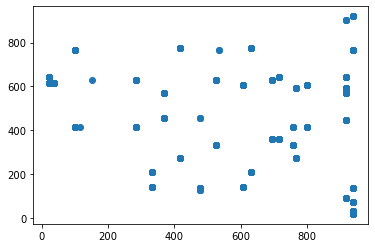

t+1 vs t-620


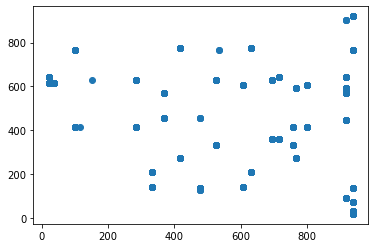

t+1 vs t-621


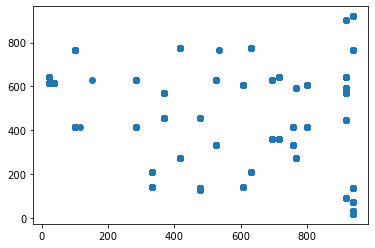

t+1 vs t-622


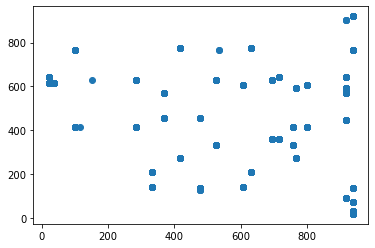

t+1 vs t-623


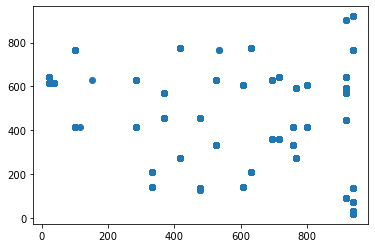

t+1 vs t-624


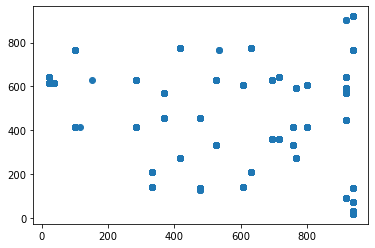

t+1 vs t-625


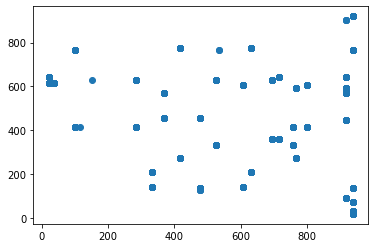

t+1 vs t-626


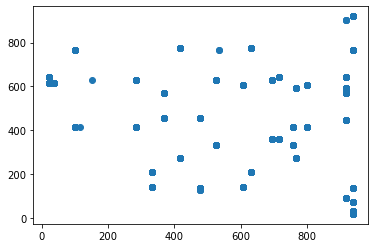

t+1 vs t-627


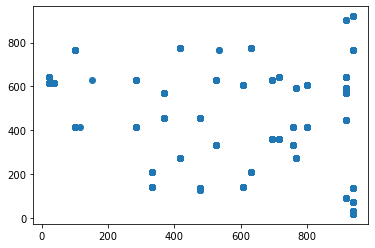

t+1 vs t-628


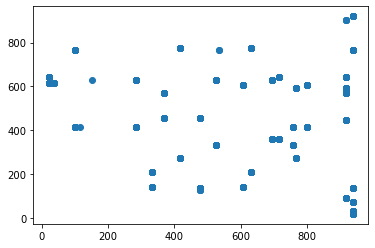

t+1 vs t-629


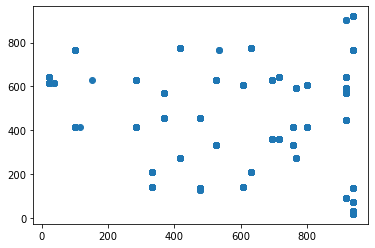

t+1 vs t-630


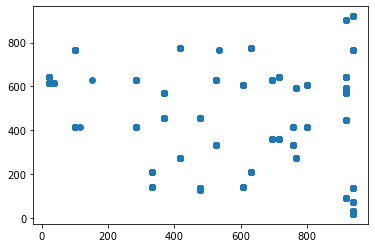

t+1 vs t-631


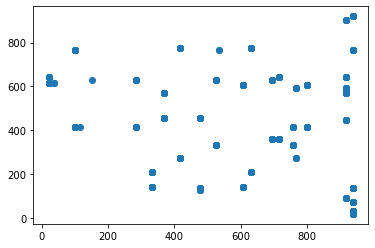

t+1 vs t-632


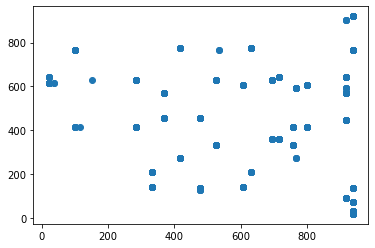

t+1 vs t-633


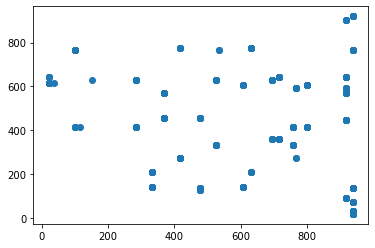

t+1 vs t-634


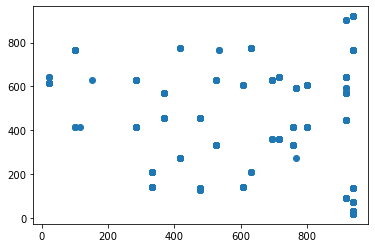

t+1 vs t-635


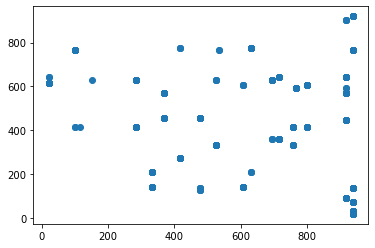

t+1 vs t-636


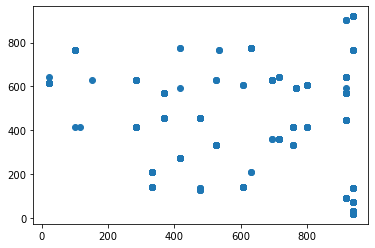

t+1 vs t-637


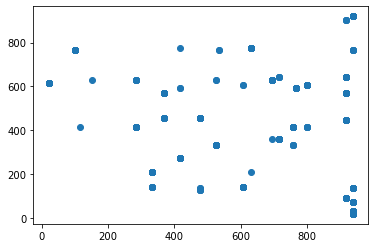

t+1 vs t-638


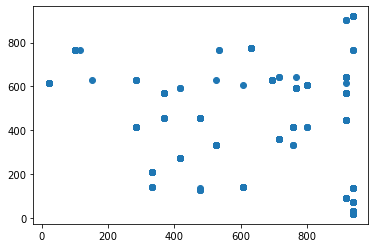

t+1 vs t-639


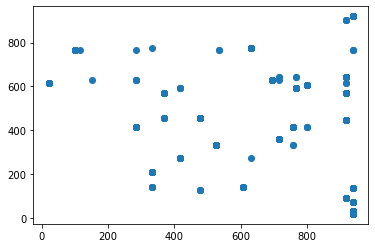

t+1 vs t-640


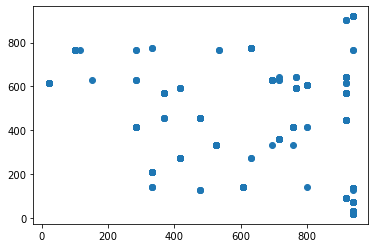

t+1 vs t-641


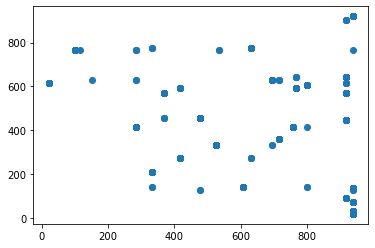

t+1 vs t-642


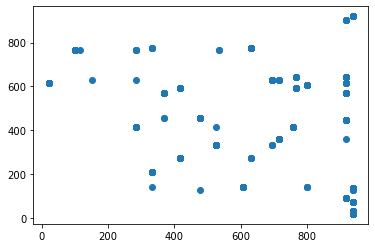

t+1 vs t-643


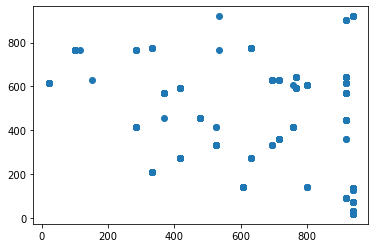

t+1 vs t-644


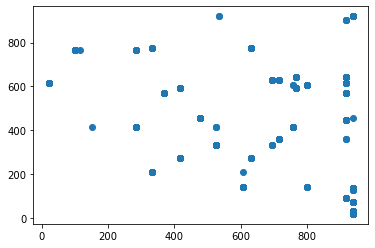

t+1 vs t-645


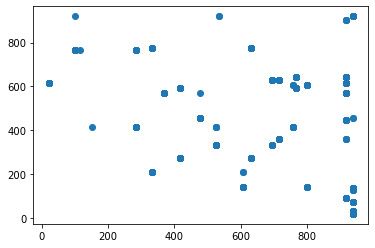

t+1 vs t-646


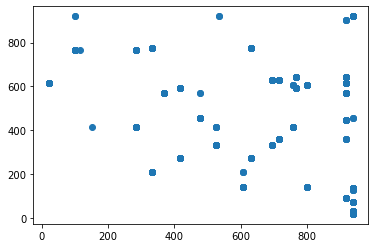

t+1 vs t-647


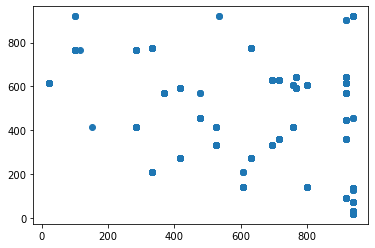

t+1 vs t-648


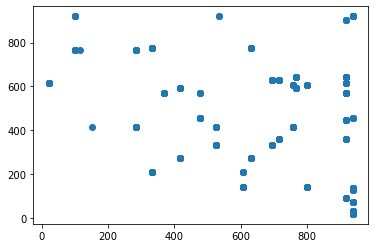

t+1 vs t-649


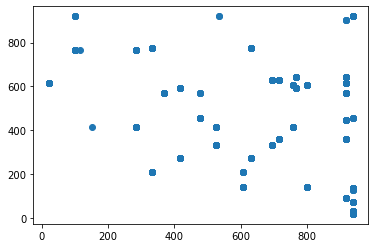

t+1 vs t-650


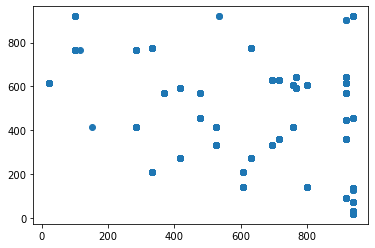

t+1 vs t-651


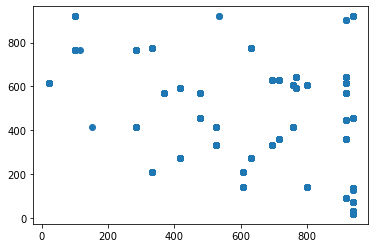

t+1 vs t-652


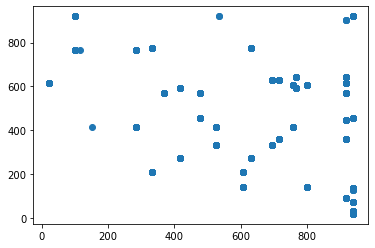

t+1 vs t-653


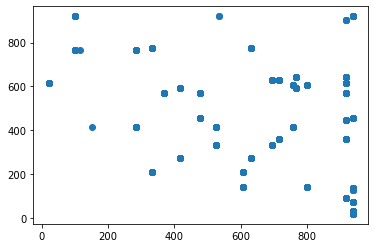

t+1 vs t-654


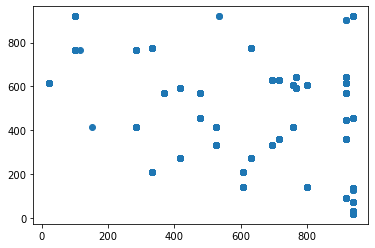

t+1 vs t-655


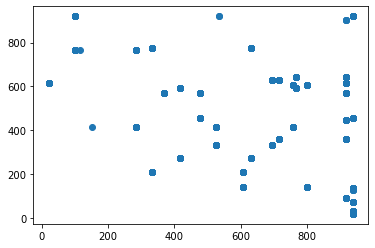

t+1 vs t-656


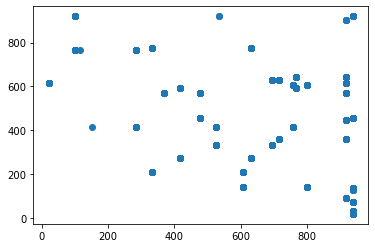

t+1 vs t-657


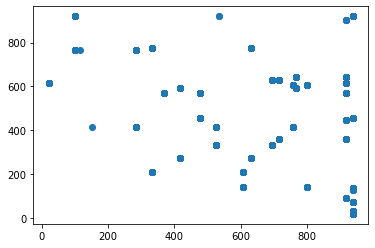

t+1 vs t-658


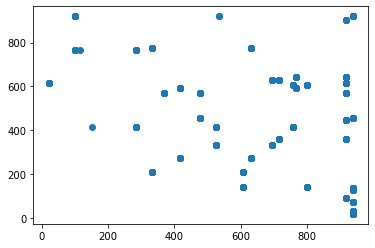

t+1 vs t-659


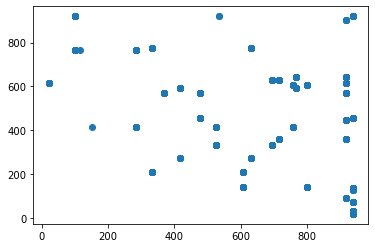

t+1 vs t-660


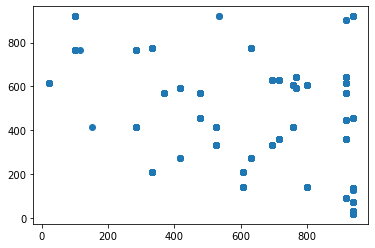

t+1 vs t-661


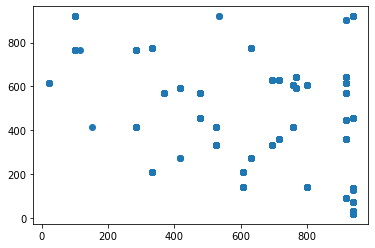

t+1 vs t-662


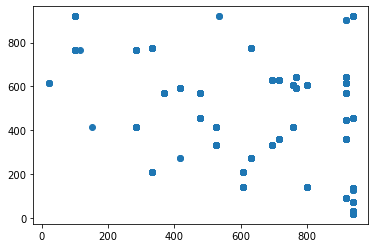

t+1 vs t-663


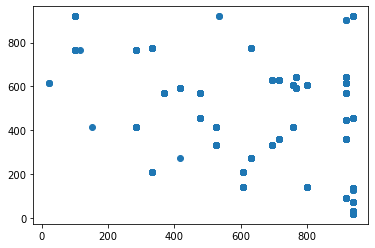

t+1 vs t-664


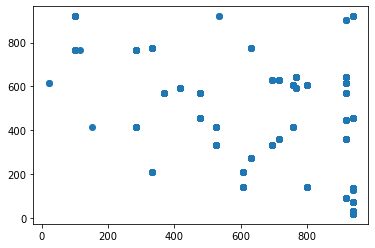

t+1 vs t-665


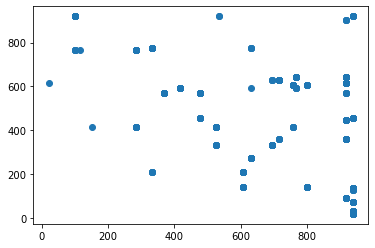

t+1 vs t-666


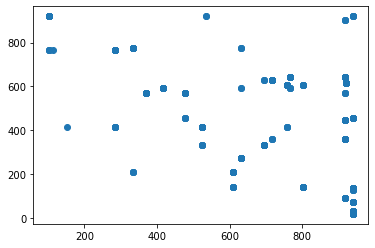

t+1 vs t-667


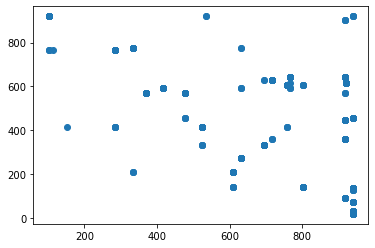

t+1 vs t-668


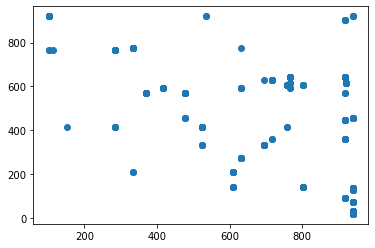

t+1 vs t-669


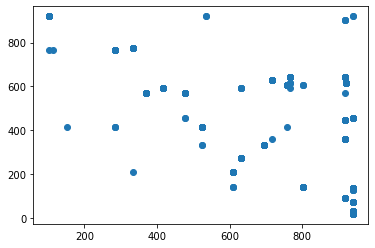

t+1 vs t-670


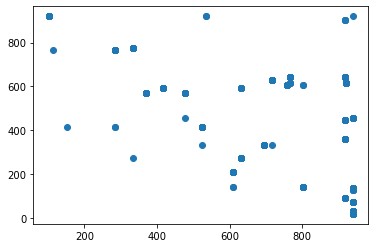

t+1 vs t-671


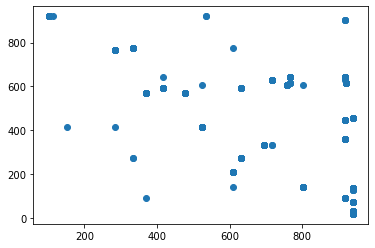

t+1 vs t-672


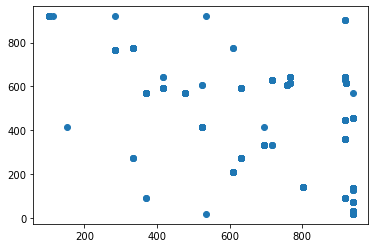

t+1 vs t-673


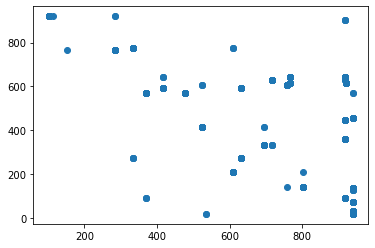

t+1 vs t-674


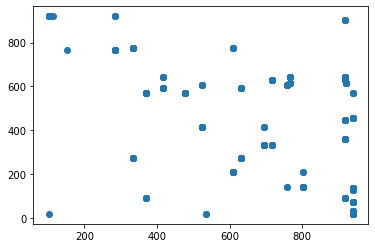

t+1 vs t-675


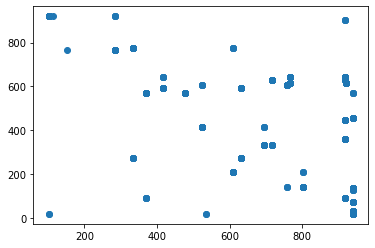

t+1 vs t-676


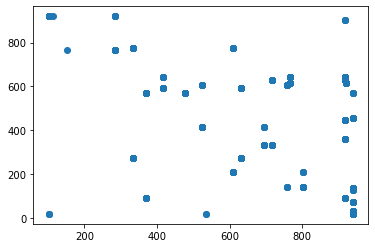

t+1 vs t-677


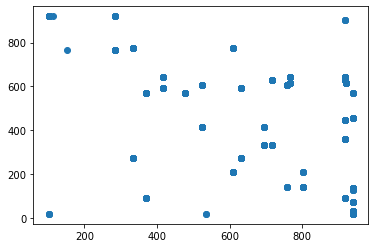

t+1 vs t-678


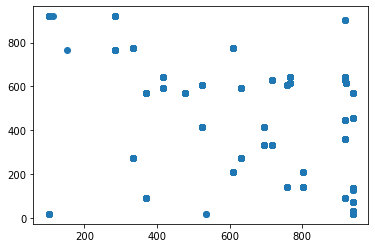

t+1 vs t-679


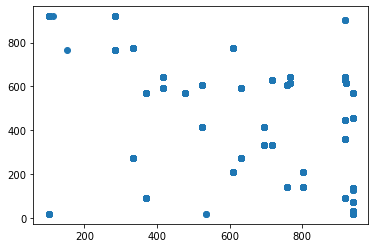

t+1 vs t-680


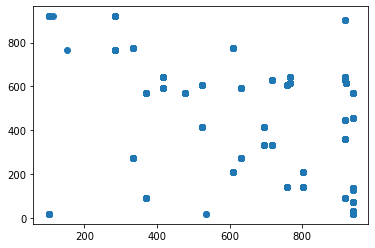

t+1 vs t-681


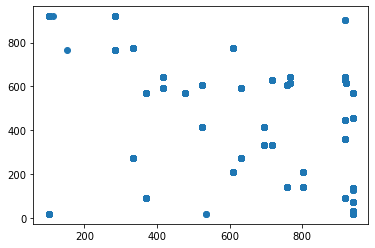

t+1 vs t-682


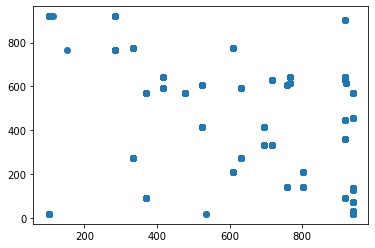

t+1 vs t-683


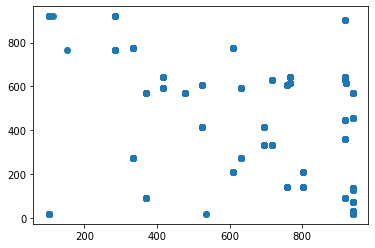

t+1 vs t-684


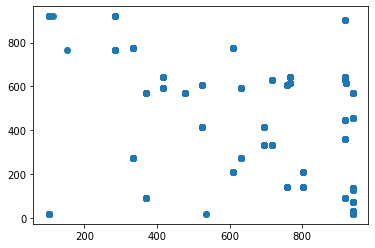

t+1 vs t-685


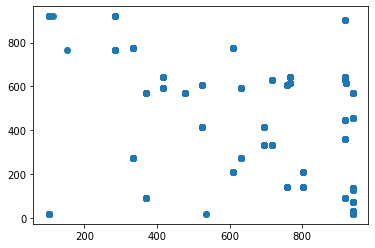

t+1 vs t-686


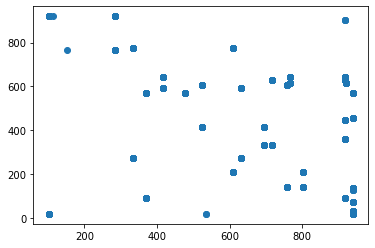

t+1 vs t-687


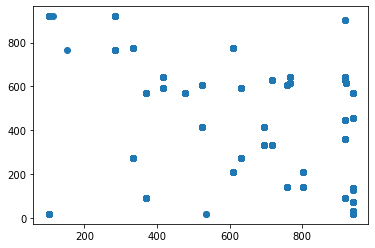

t+1 vs t-688


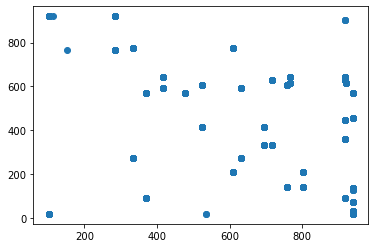

t+1 vs t-689


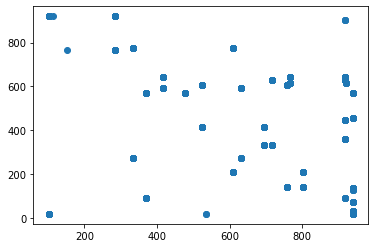

t+1 vs t-690


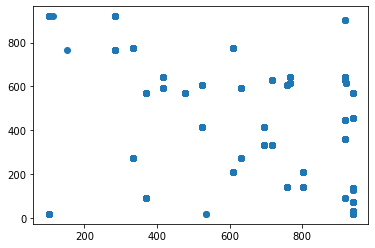

t+1 vs t-691


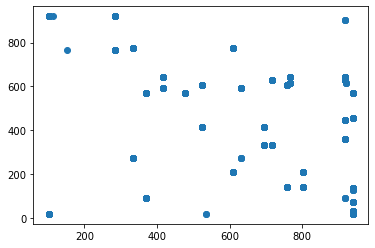

t+1 vs t-692


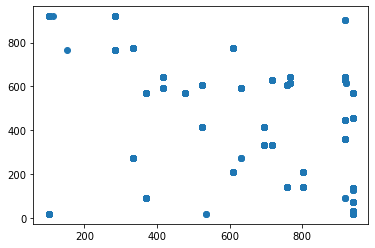

t+1 vs t-693


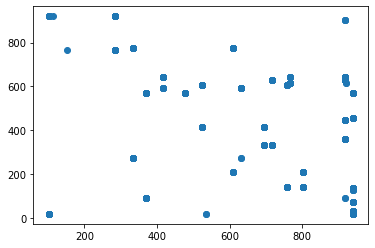

t+1 vs t-694


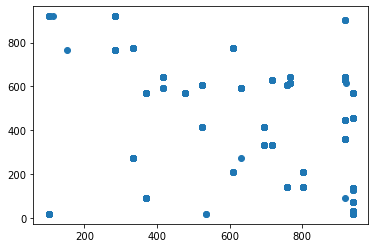

t+1 vs t-695


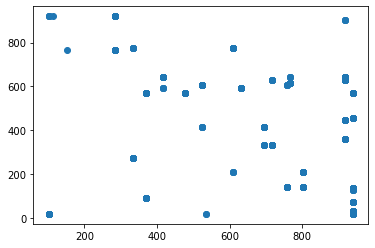

t+1 vs t-696


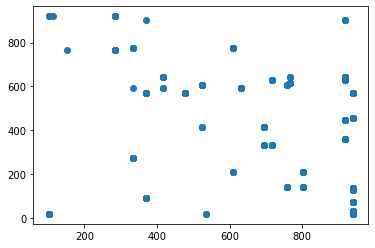

t+1 vs t-697


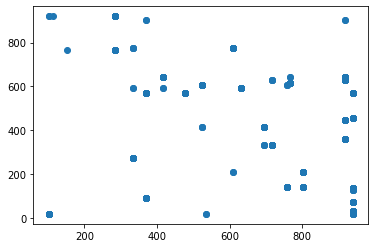

t+1 vs t-698


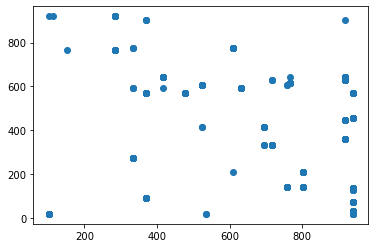

t+1 vs t-699


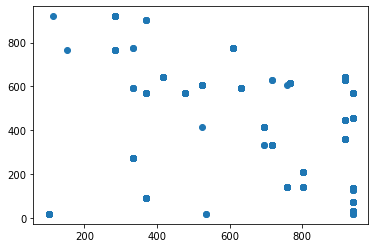

t+1 vs t-700


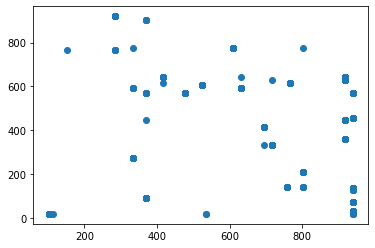

t+1 vs t-701


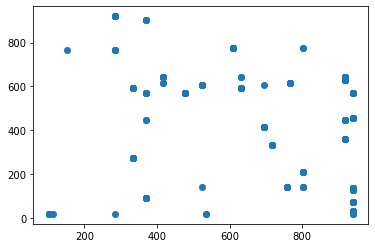

t+1 vs t-702


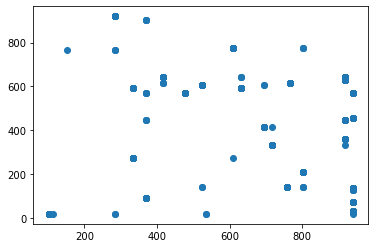

t+1 vs t-703


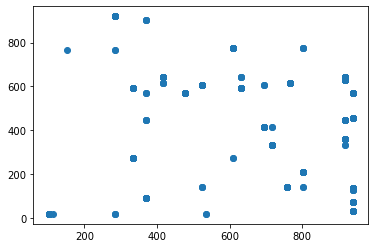

t+1 vs t-704


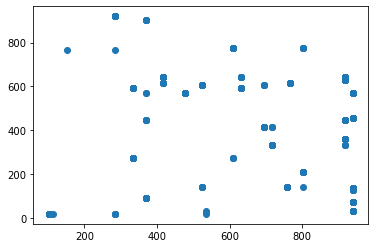

t+1 vs t-705


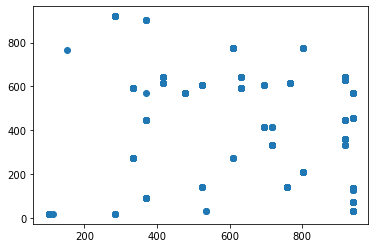

t+1 vs t-706


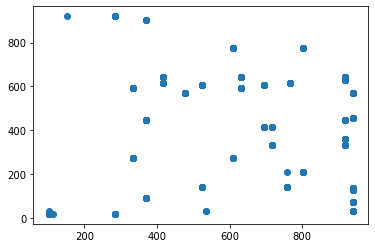

t+1 vs t-707


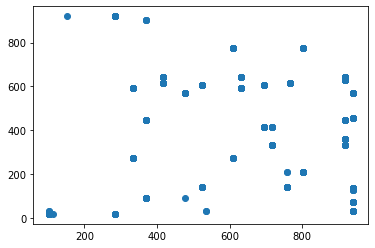

t+1 vs t-708


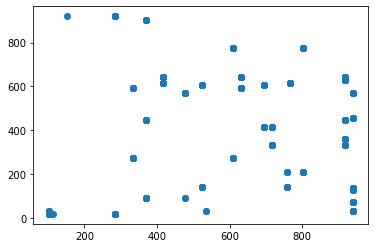

t+1 vs t-709


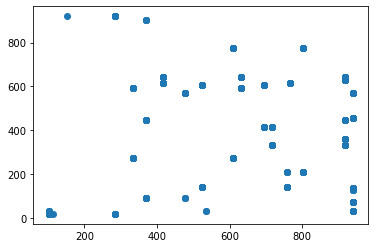

t+1 vs t-710


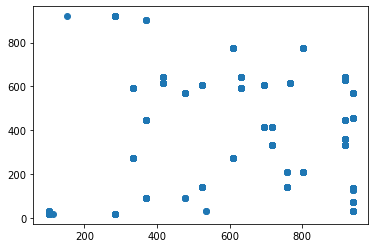

t+1 vs t-711


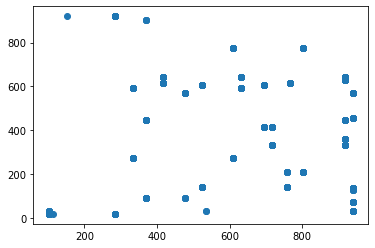

t+1 vs t-712


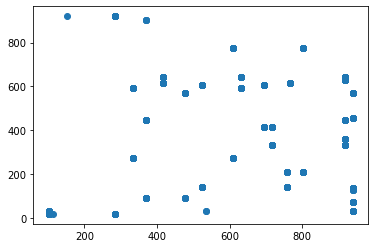

t+1 vs t-713


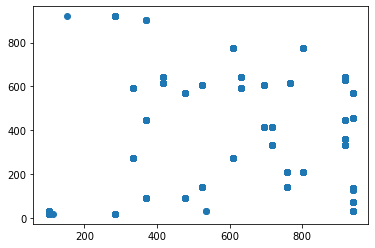

t+1 vs t-714


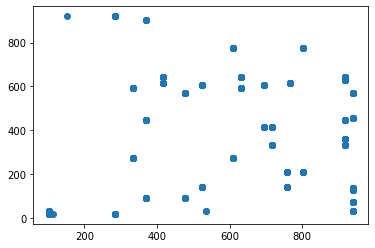

t+1 vs t-715


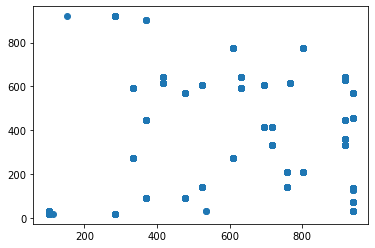

t+1 vs t-716


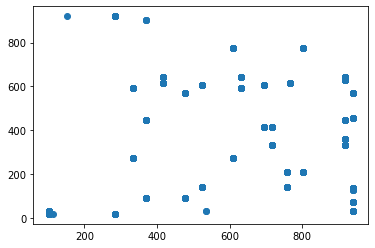

t+1 vs t-717


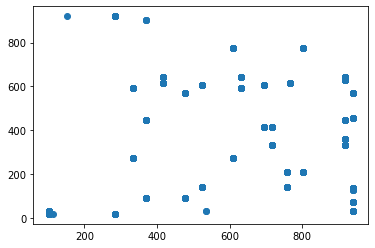

t+1 vs t-718


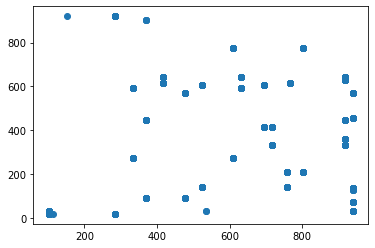

t+1 vs t-719


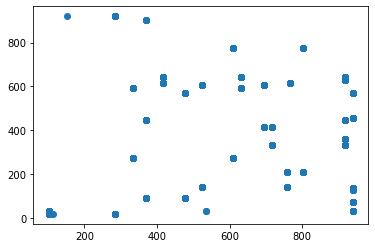

t+1 vs t-720


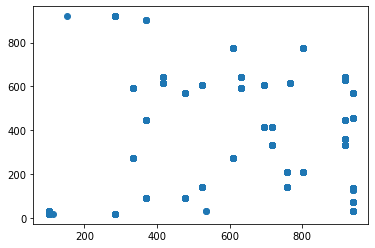

t+1 vs t-721


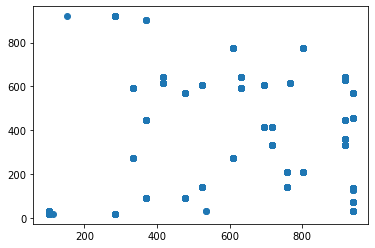

t+1 vs t-722


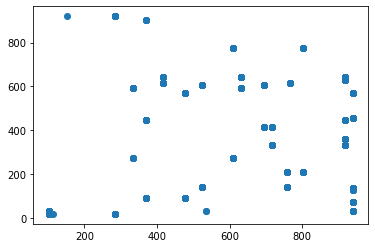

t+1 vs t-723


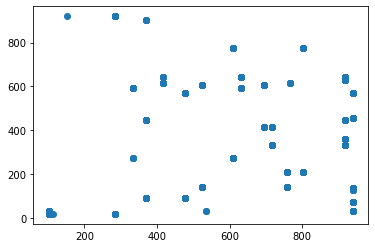

t+1 vs t-724


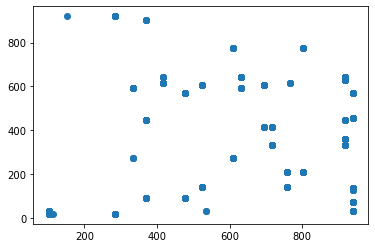

t+1 vs t-725


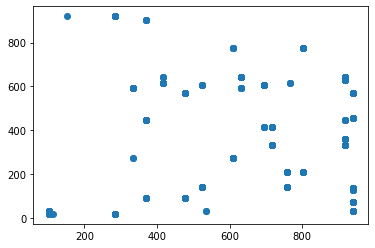

t+1 vs t-726


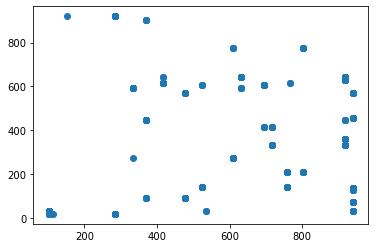

t+1 vs t-727


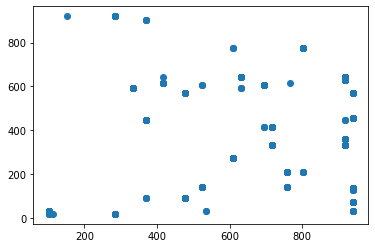

t+1 vs t-728


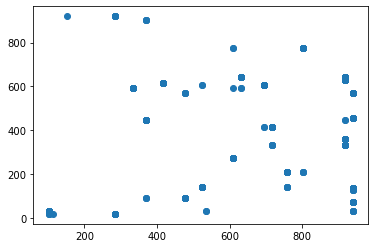

t+1 vs t-729


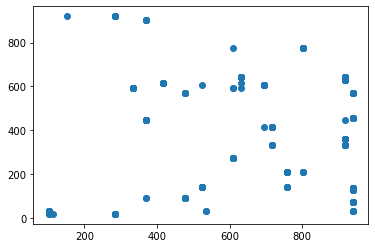

t+1 vs t-730


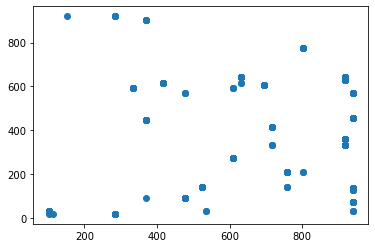

t+1 vs t-731


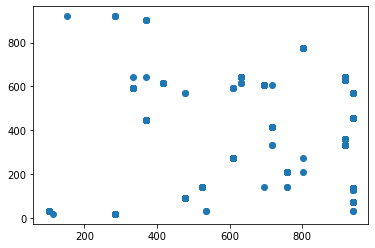

t+1 vs t-732


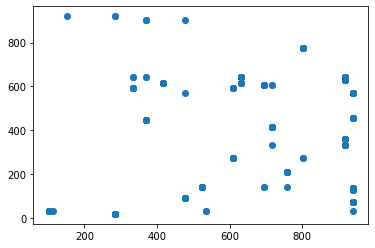

t+1 vs t-733


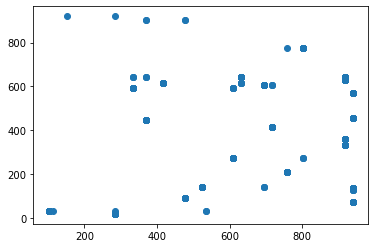

t+1 vs t-734


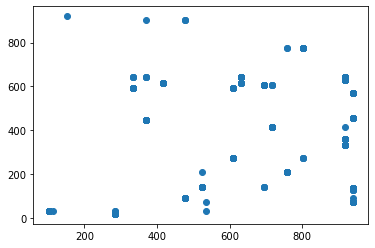

t+1 vs t-735


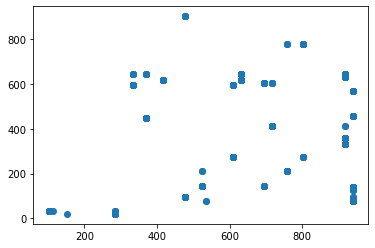

t+1 vs t-736


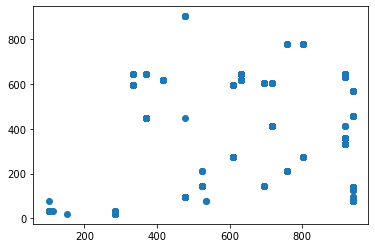

t+1 vs t-737


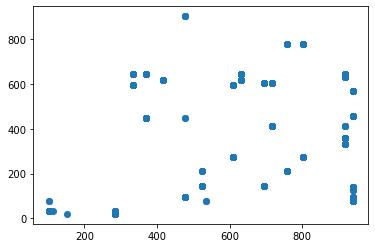

t+1 vs t-738


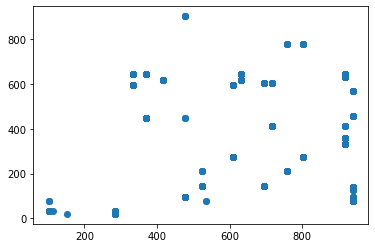

t+1 vs t-739


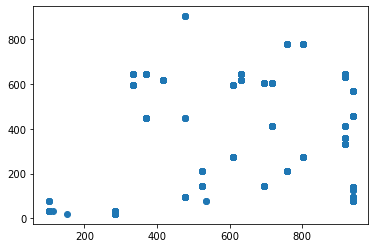

t+1 vs t-740


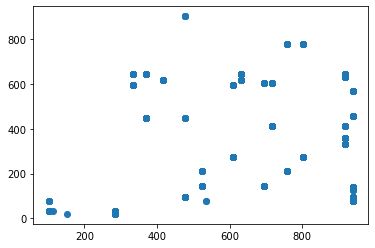

t+1 vs t-741


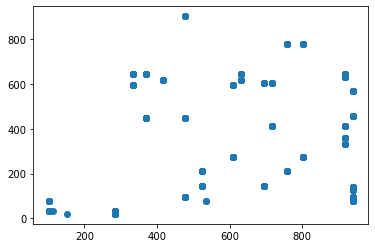

t+1 vs t-742


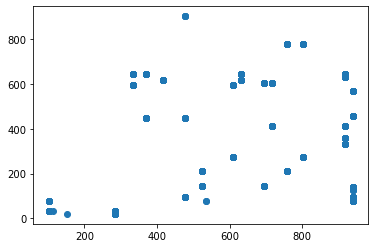

t+1 vs t-743


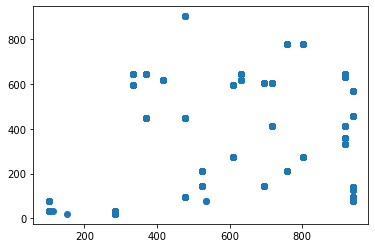

t+1 vs t-744


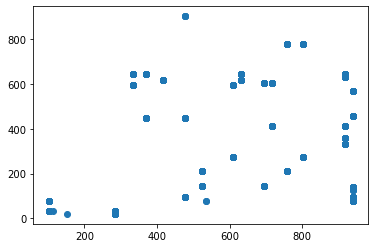

t+1 vs t-745


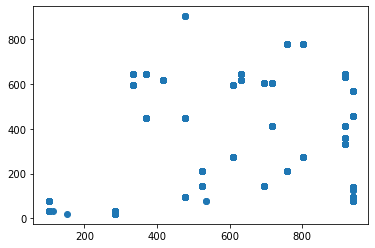

t+1 vs t-746


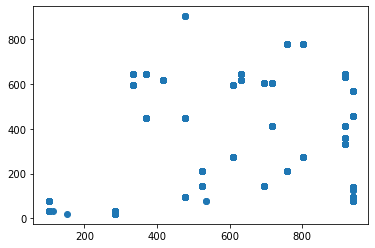

t+1 vs t-747


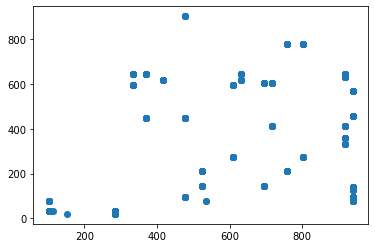

t+1 vs t-748


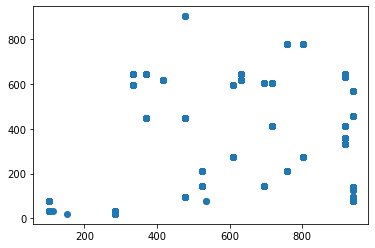

t+1 vs t-749


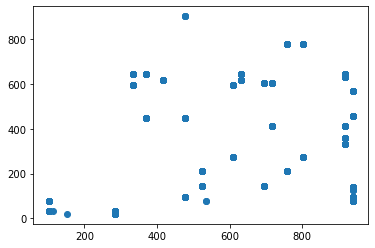

t+1 vs t-750


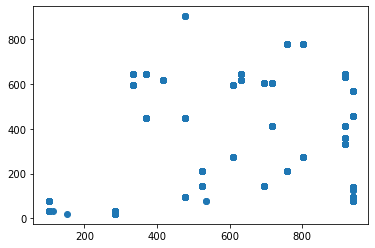

t+1 vs t-751


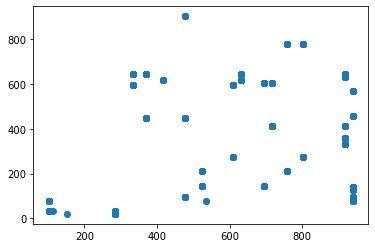

t+1 vs t-752


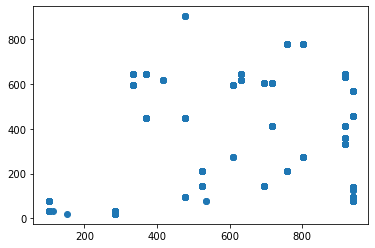

t+1 vs t-753


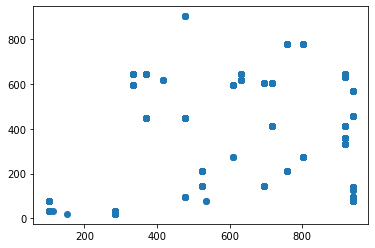

t+1 vs t-754


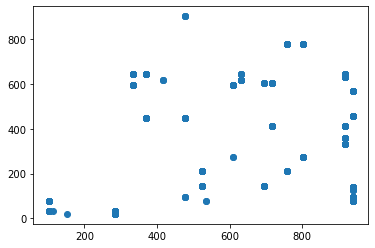

t+1 vs t-755


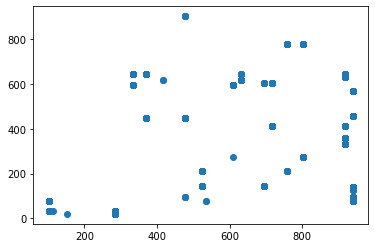

t+1 vs t-756


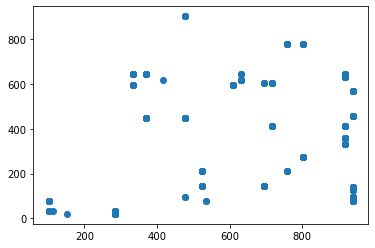

t+1 vs t-757


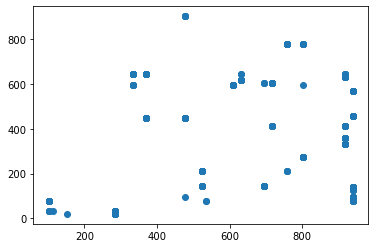

t+1 vs t-758


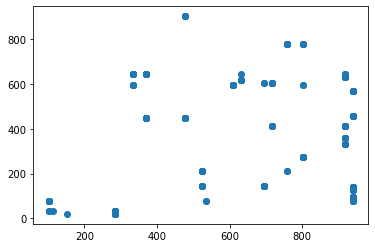

t+1 vs t-759


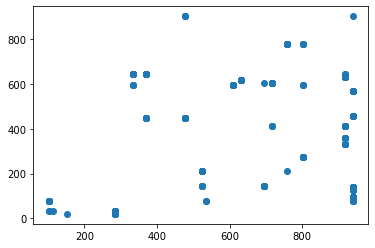

t+1 vs t-760


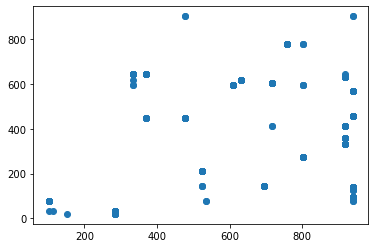

t+1 vs t-761


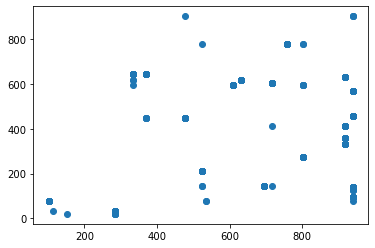

t+1 vs t-762


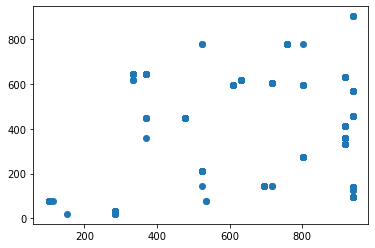

t+1 vs t-763


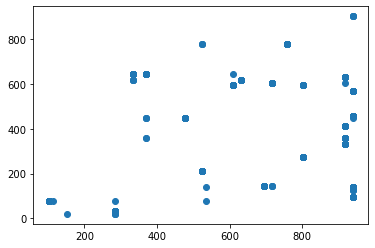

t+1 vs t-764


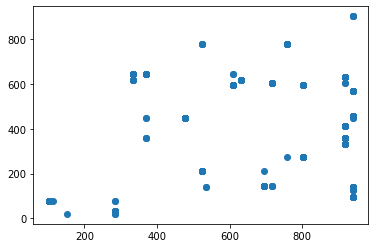

t+1 vs t-765


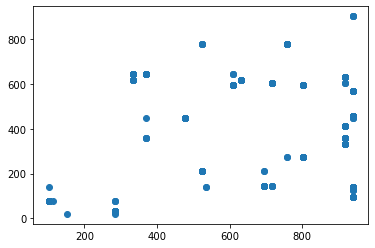

t+1 vs t-766


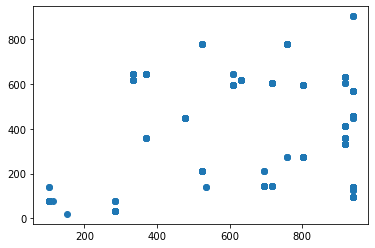

t+1 vs t-767


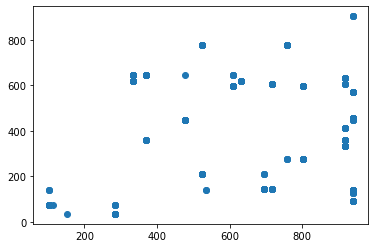

t+1 vs t-768


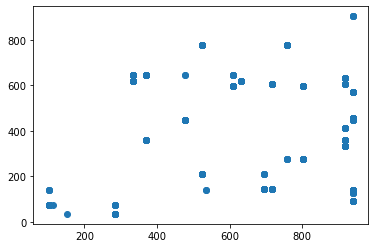

t+1 vs t-769


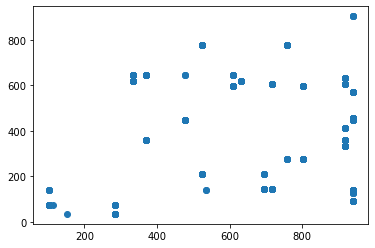

t+1 vs t-770


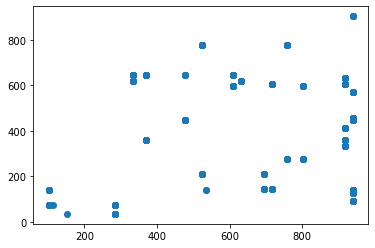

t+1 vs t-771


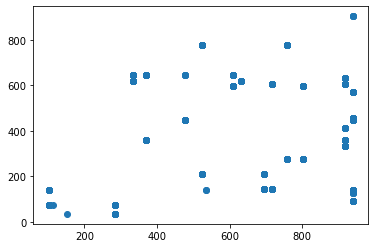

t+1 vs t-772


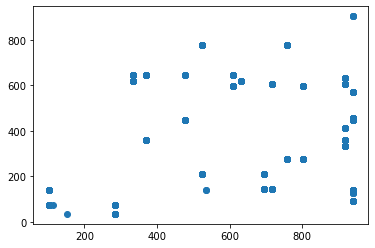

t+1 vs t-773


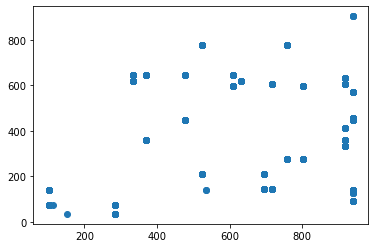

t+1 vs t-774


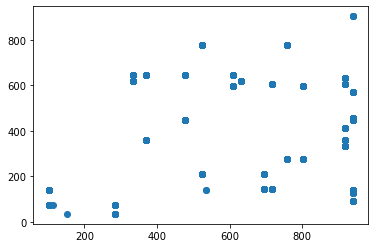

t+1 vs t-775


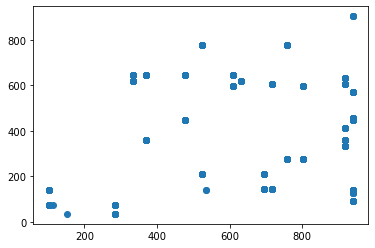

t+1 vs t-776


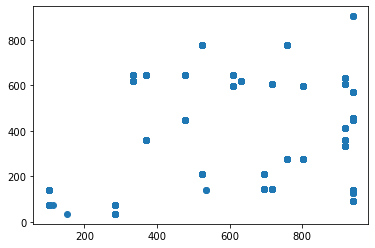

t+1 vs t-777


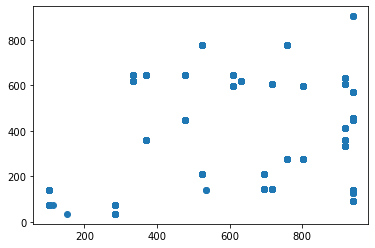

t+1 vs t-778


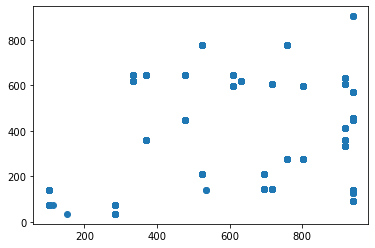

t+1 vs t-779


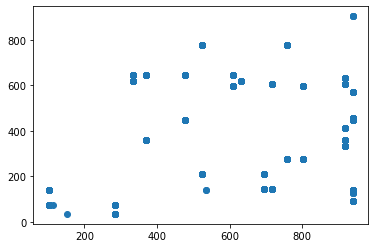

t+1 vs t-780


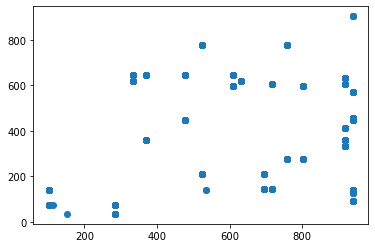

t+1 vs t-781


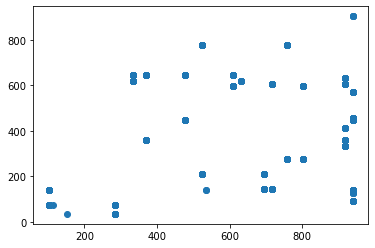

t+1 vs t-782


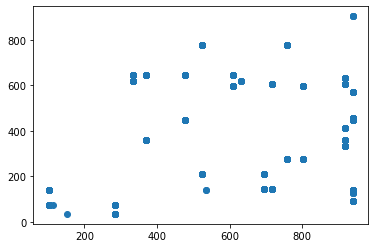

t+1 vs t-783


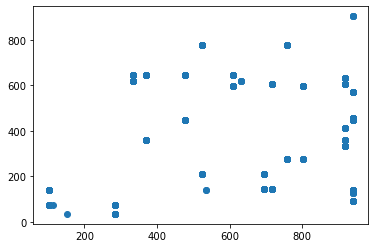

t+1 vs t-784


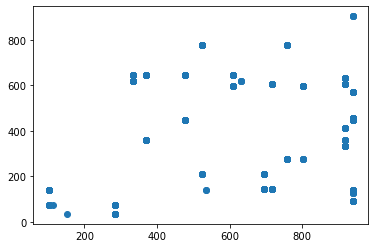

t+1 vs t-785


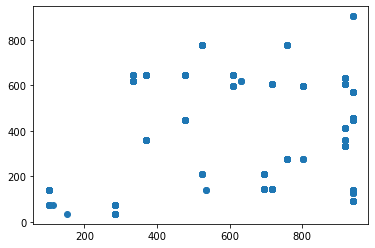

t+1 vs t-786


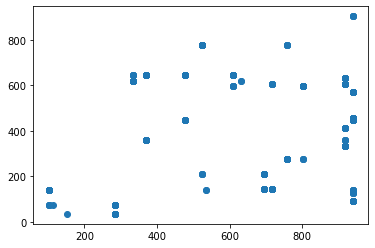

t+1 vs t-787


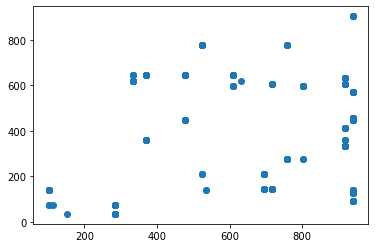

t+1 vs t-788


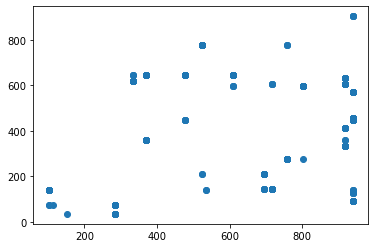

t+1 vs t-789


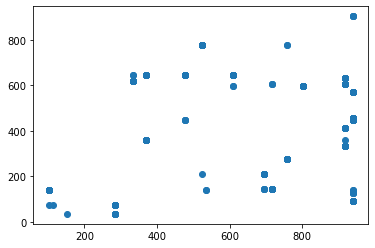

t+1 vs t-790


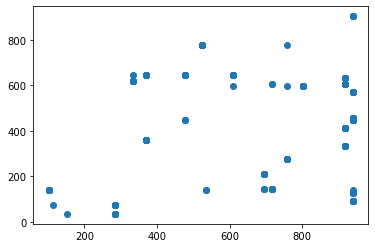

t+1 vs t-791


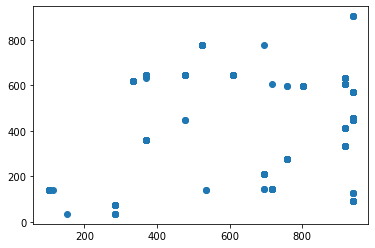

t+1 vs t-792


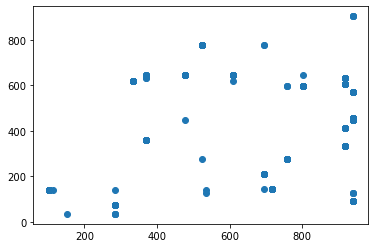

t+1 vs t-793


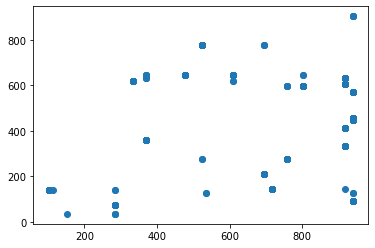

t+1 vs t-794


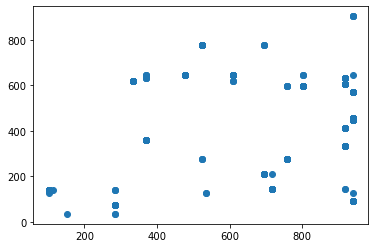

t+1 vs t-795


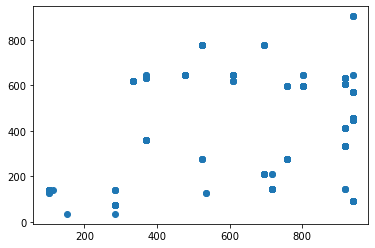

t+1 vs t-796


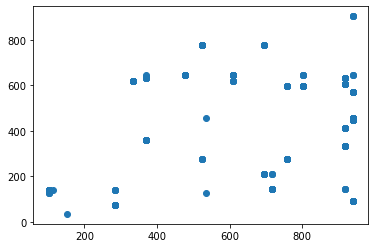

t+1 vs t-797


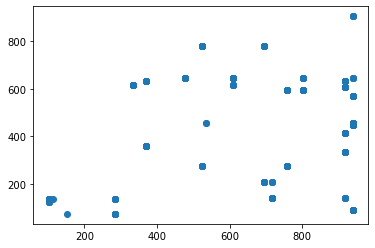

t+1 vs t-798


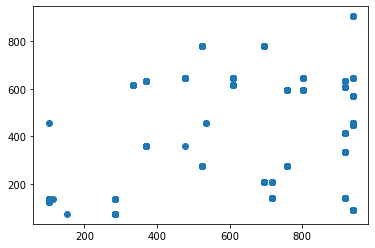

t+1 vs t-799


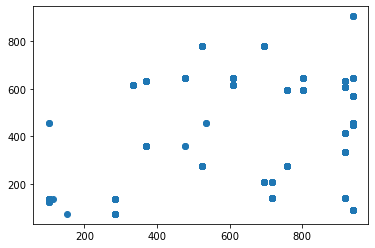

t+1 vs t-800


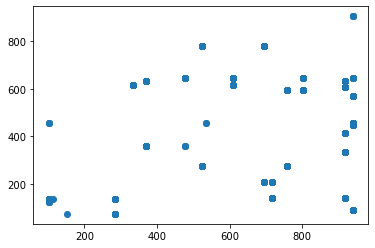

t+1 vs t-801


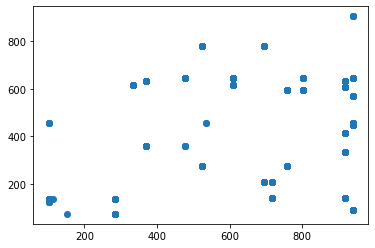

t+1 vs t-802


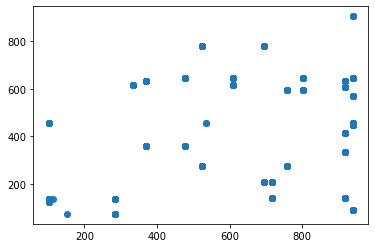

t+1 vs t-803


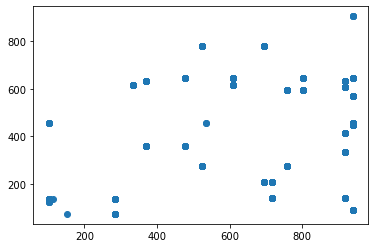

t+1 vs t-804


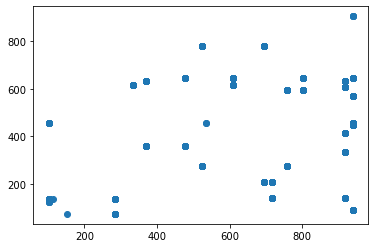

t+1 vs t-805


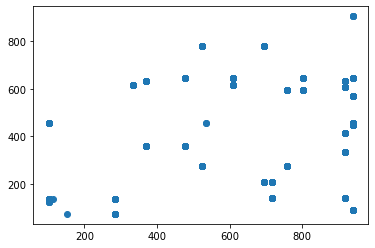

t+1 vs t-806


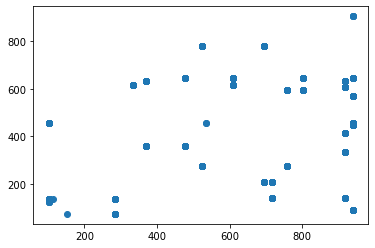

t+1 vs t-807


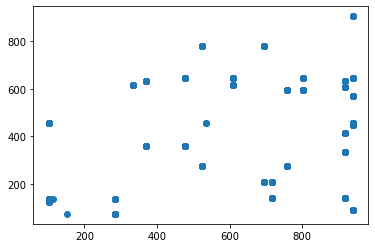

t+1 vs t-808


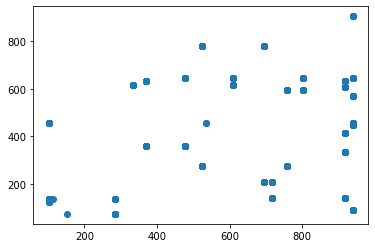

t+1 vs t-809


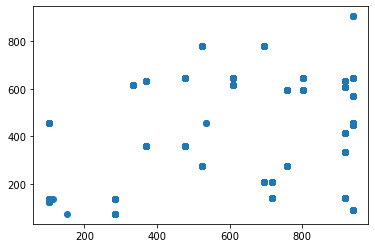

t+1 vs t-810


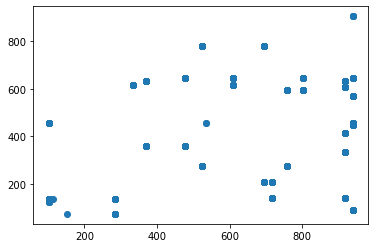

t+1 vs t-811


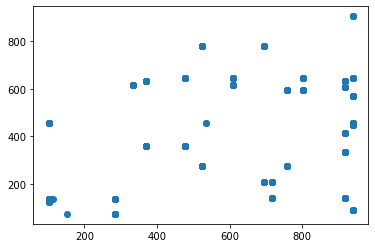

t+1 vs t-812


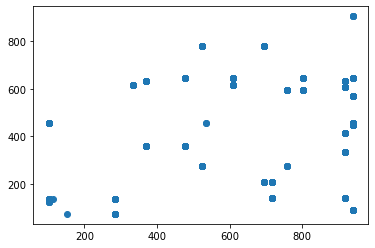

t+1 vs t-813


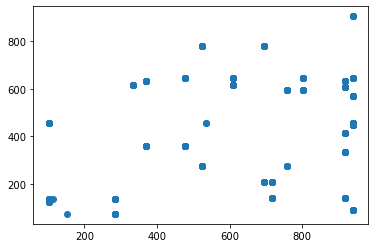

t+1 vs t-814


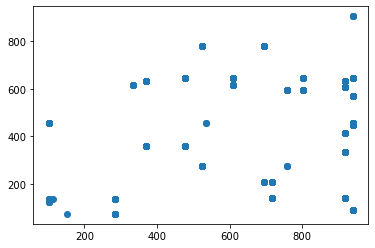

t+1 vs t-815


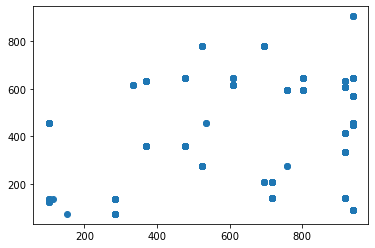

t+1 vs t-816


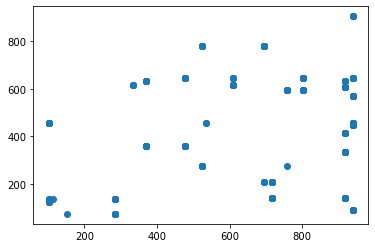

t+1 vs t-817


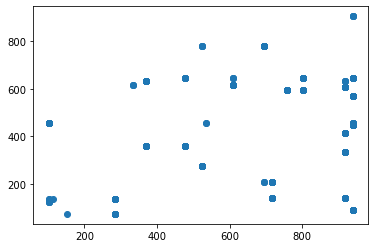

t+1 vs t-818


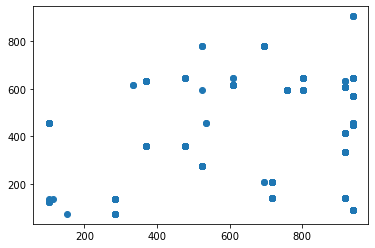

t+1 vs t-819


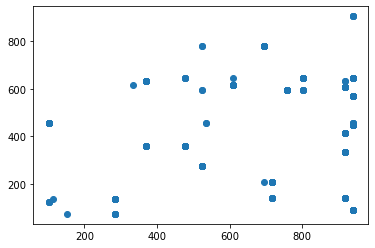

t+1 vs t-820


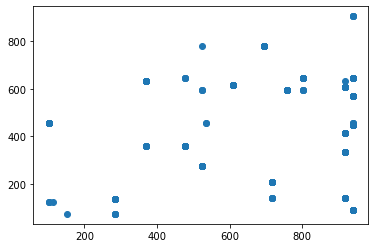

t+1 vs t-821


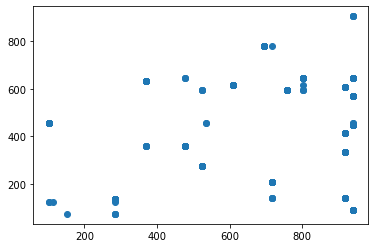

t+1 vs t-822


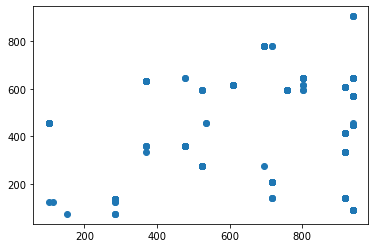

t+1 vs t-823


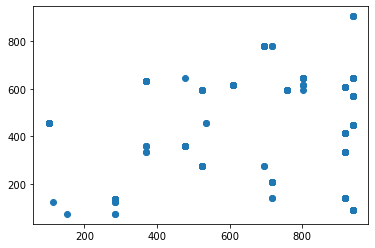

t+1 vs t-824


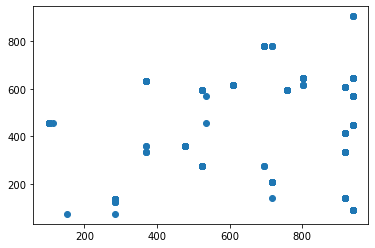

t+1 vs t-825


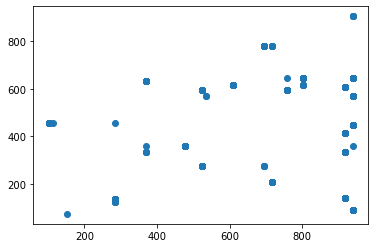

t+1 vs t-826


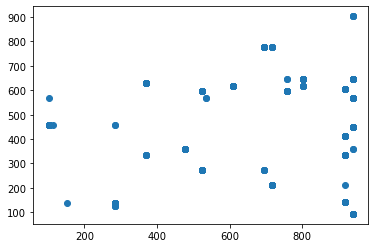

t+1 vs t-827


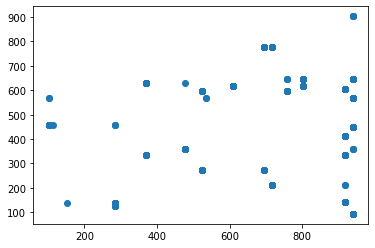

t+1 vs t-828


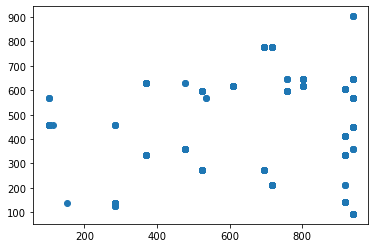

t+1 vs t-829


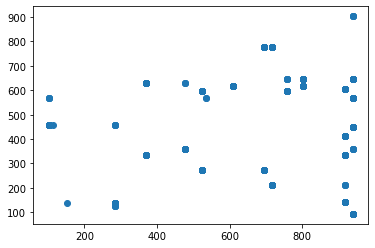

t+1 vs t-830


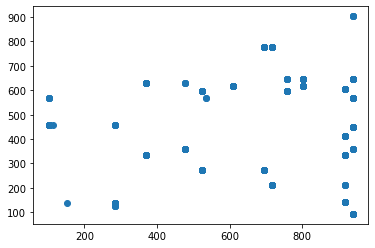

t+1 vs t-831


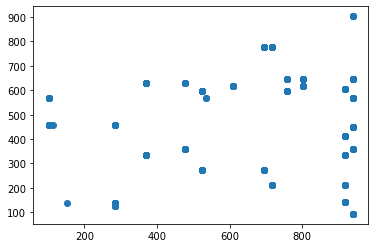

t+1 vs t-832


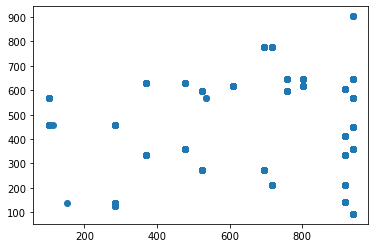

t+1 vs t-833


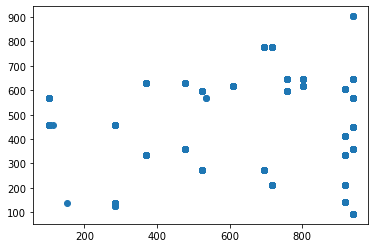

t+1 vs t-834


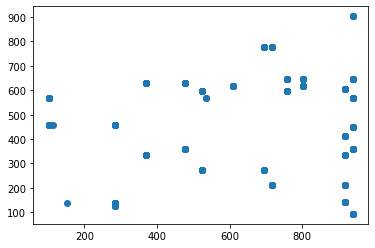

t+1 vs t-835


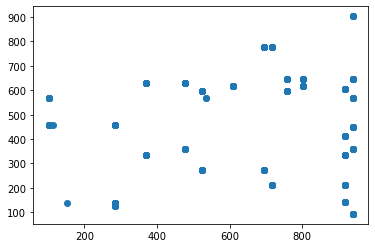

t+1 vs t-836


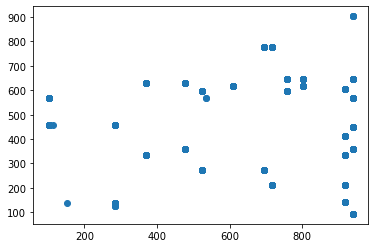

t+1 vs t-837


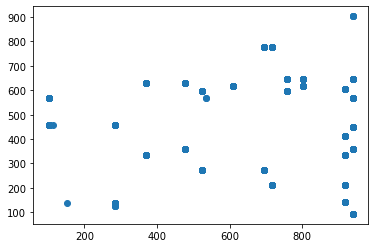

t+1 vs t-838


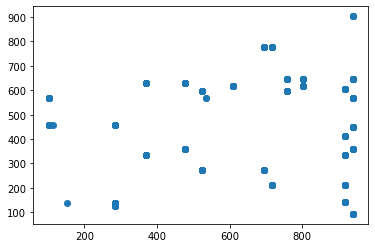

t+1 vs t-839


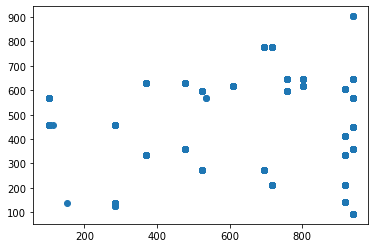

t+1 vs t-840


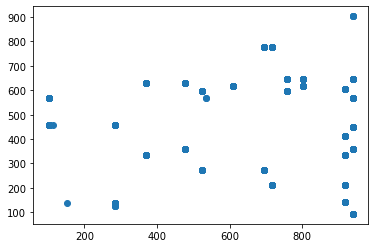

t+1 vs t-841


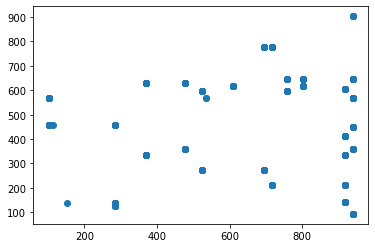

t+1 vs t-842


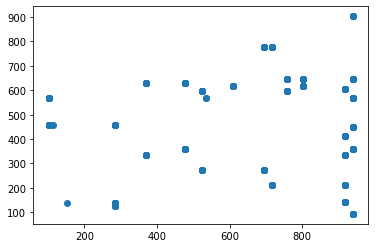

t+1 vs t-843


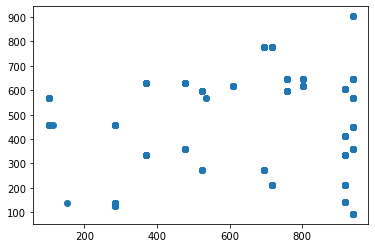

t+1 vs t-844


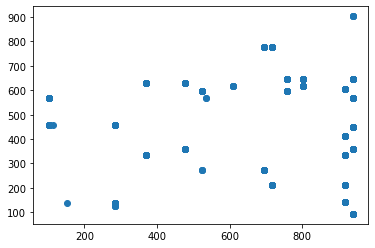

t+1 vs t-845


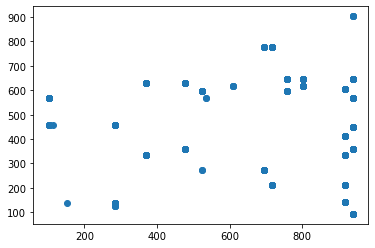

t+1 vs t-846


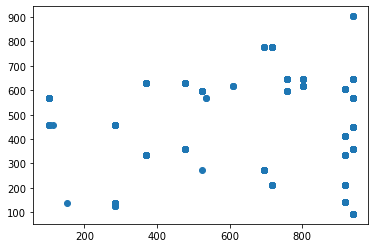

t+1 vs t-847


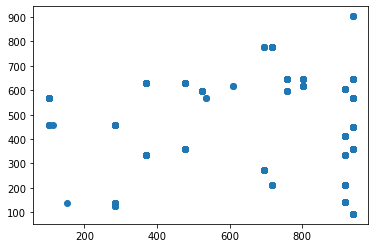

t+1 vs t-848


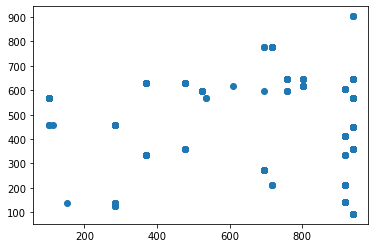

t+1 vs t-849


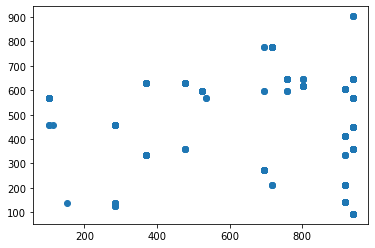

t+1 vs t-850


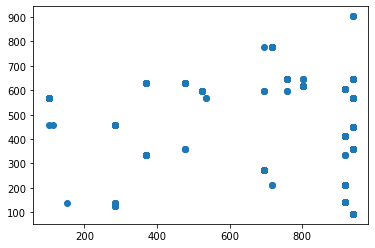

t+1 vs t-851


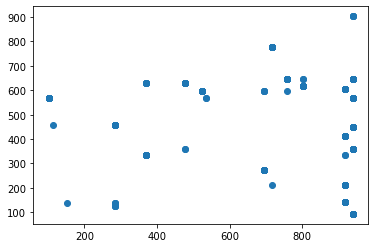

t+1 vs t-852


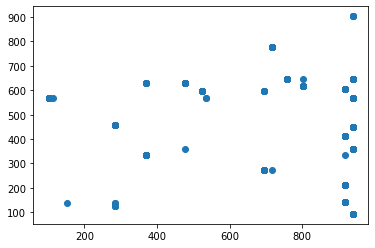

t+1 vs t-853


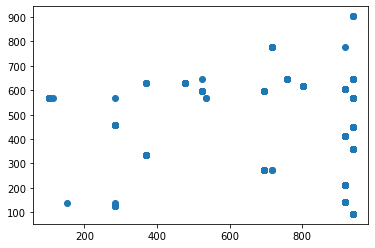

t+1 vs t-854


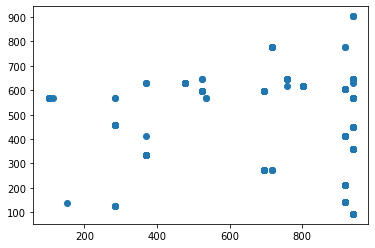

t+1 vs t-855


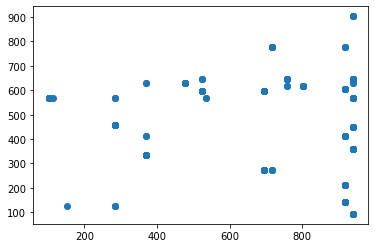

t+1 vs t-856


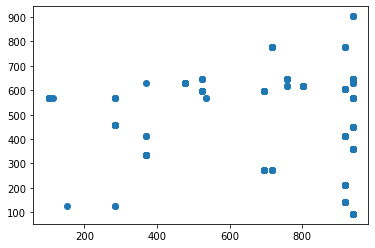

t+1 vs t-857


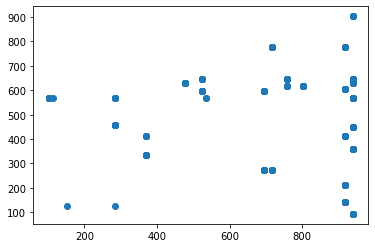

t+1 vs t-858


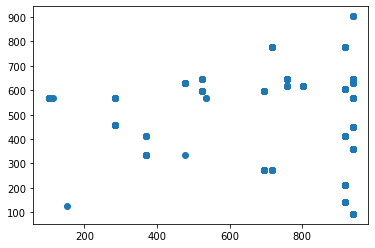

t+1 vs t-859


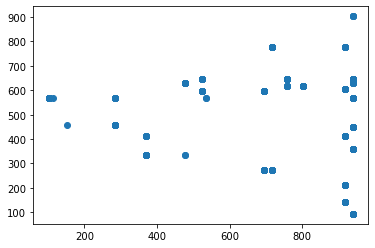

t+1 vs t-860


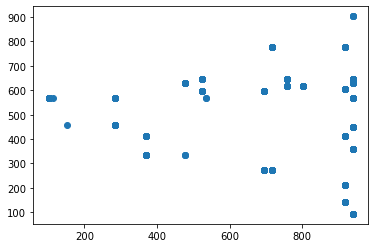

t+1 vs t-861


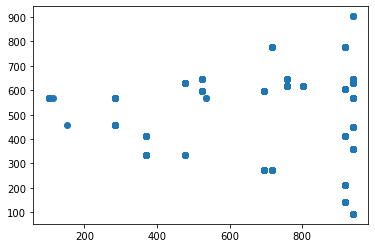

t+1 vs t-862


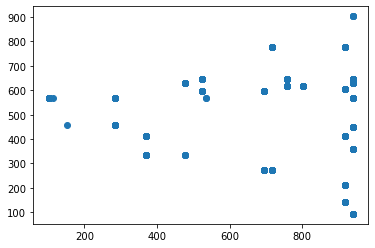

t+1 vs t-863


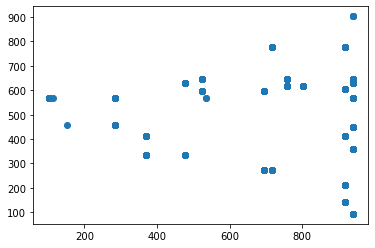

t+1 vs t-864


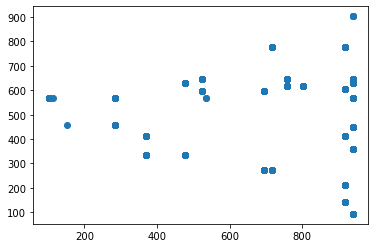

t+1 vs t-865


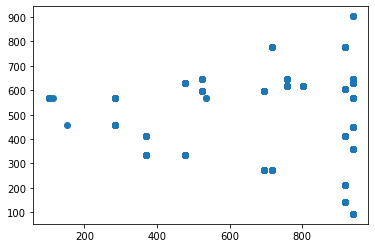

t+1 vs t-866


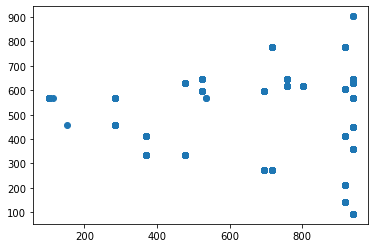

t+1 vs t-867


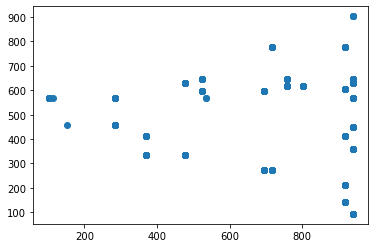

t+1 vs t-868


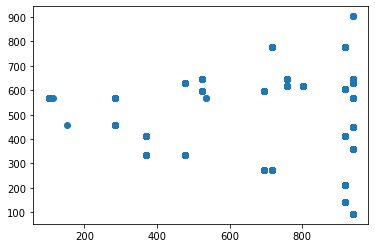

t+1 vs t-869


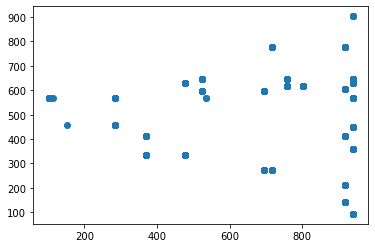

t+1 vs t-870


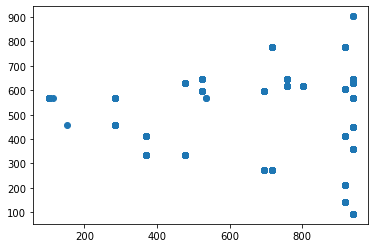

t+1 vs t-871


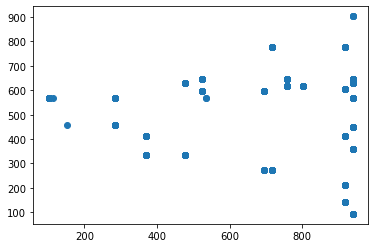

t+1 vs t-872


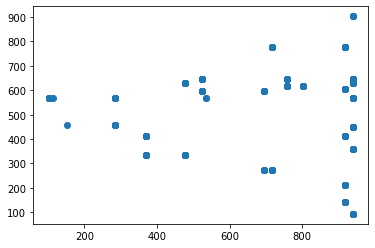

t+1 vs t-873


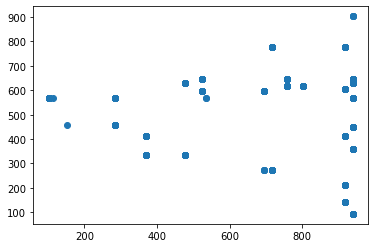

t+1 vs t-874


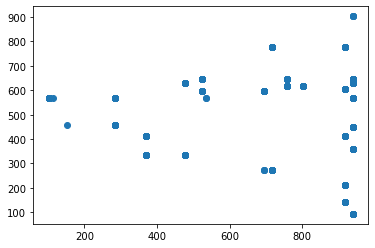

t+1 vs t-875


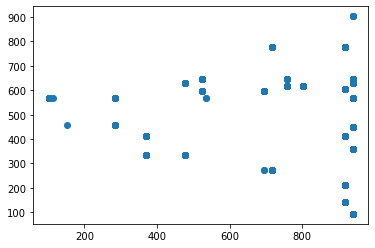

t+1 vs t-876


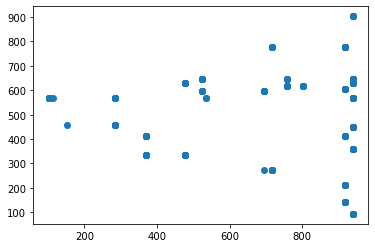

t+1 vs t-877


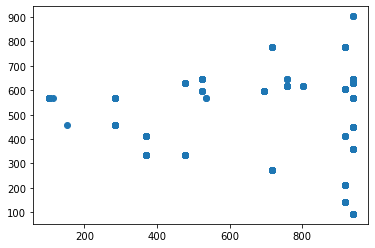

t+1 vs t-878


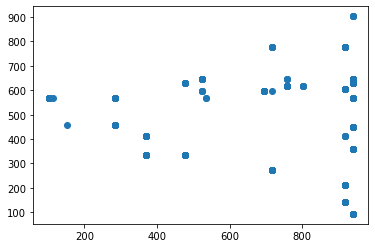

t+1 vs t-879


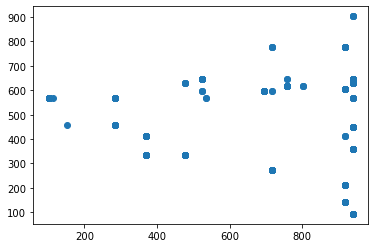

t+1 vs t-880


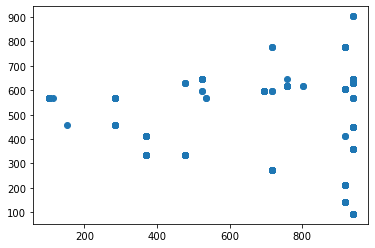

t+1 vs t-881


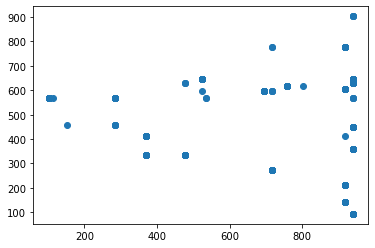

t+1 vs t-882


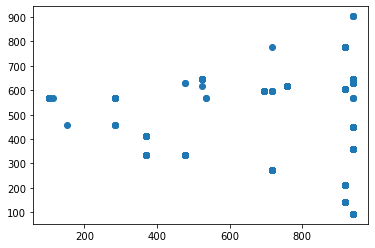

t+1 vs t-883


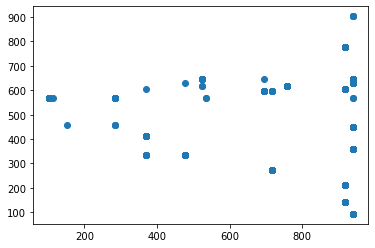

t+1 vs t-884


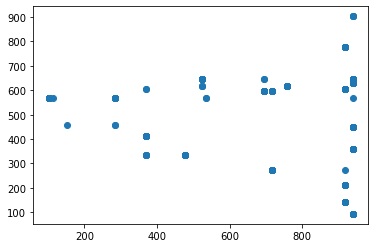

t+1 vs t-885


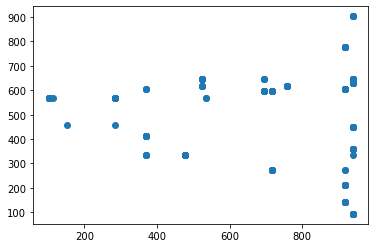

t+1 vs t-886


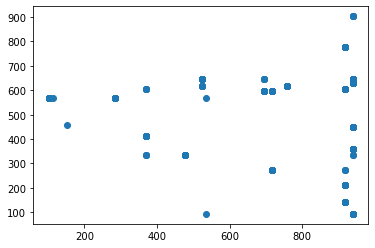

t+1 vs t-887


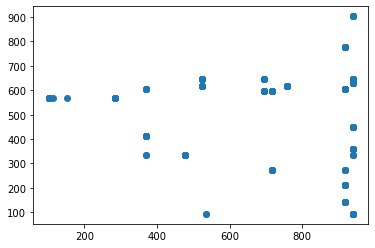

t+1 vs t-888


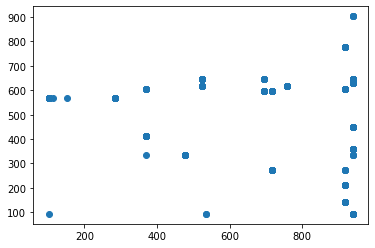

t+1 vs t-889


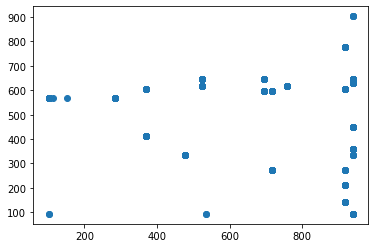

t+1 vs t-890


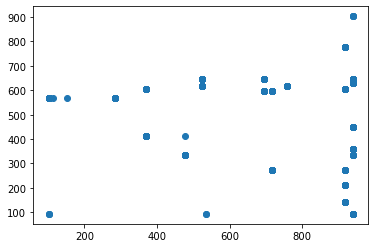

t+1 vs t-891


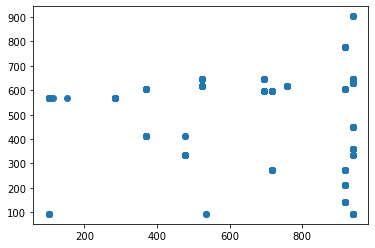

t+1 vs t-892


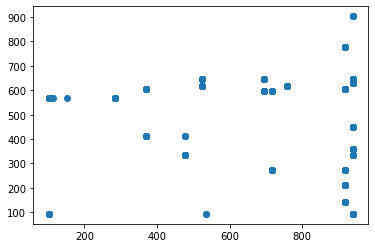

t+1 vs t-893


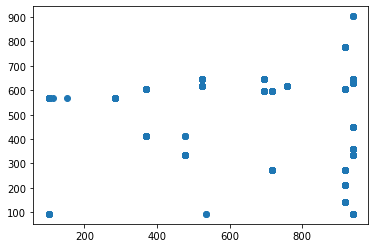

t+1 vs t-894


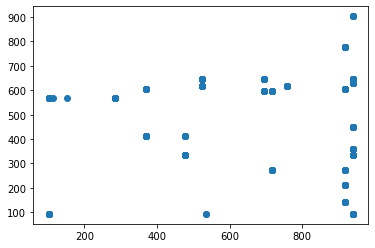

t+1 vs t-895


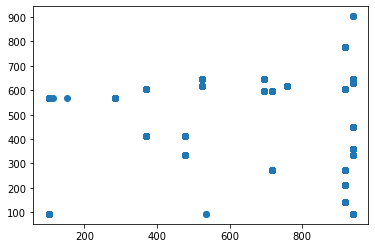

t+1 vs t-896


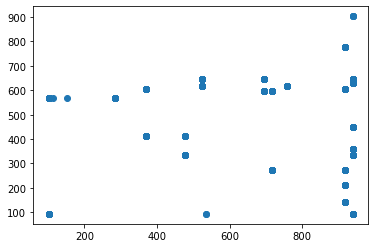

t+1 vs t-897


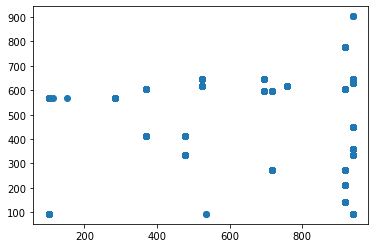

t+1 vs t-898


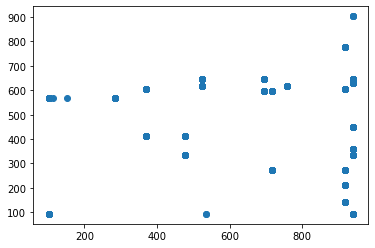

t+1 vs t-899


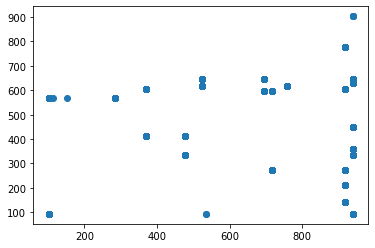

t+1 vs t-900


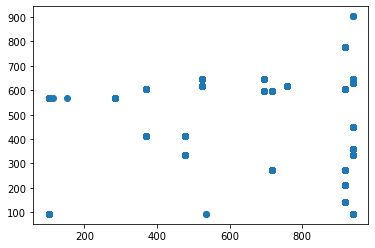

t+1 vs t-901


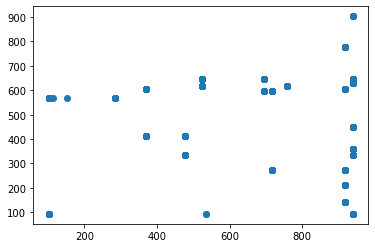

t+1 vs t-902


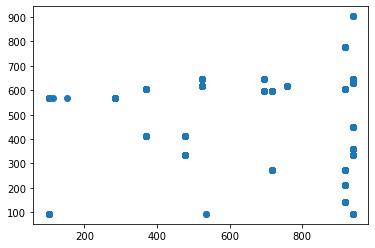

t+1 vs t-903


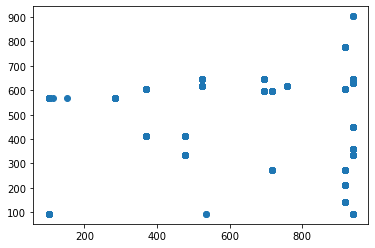

t+1 vs t-904


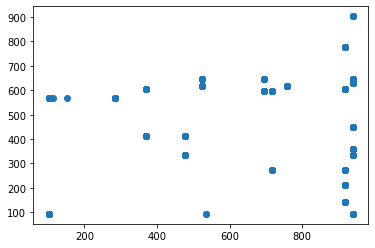

t+1 vs t-905


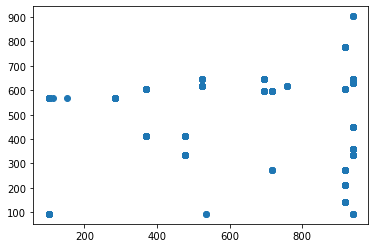

t+1 vs t-906


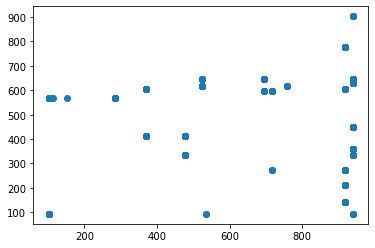

t+1 vs t-907


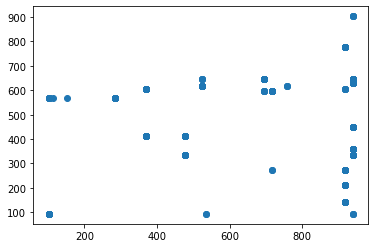

t+1 vs t-908


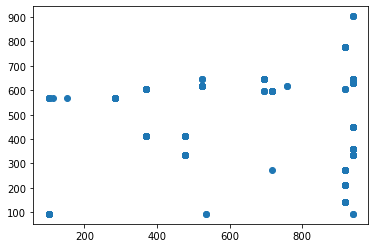

t+1 vs t-909


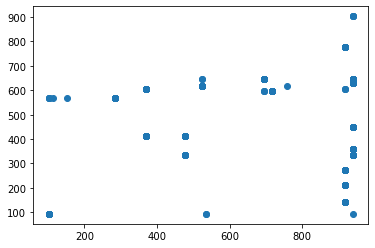

t+1 vs t-910


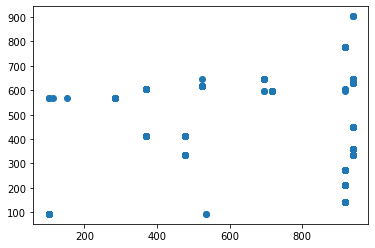

t+1 vs t-911


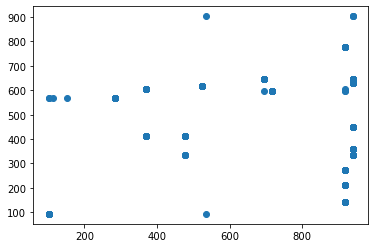

t+1 vs t-912


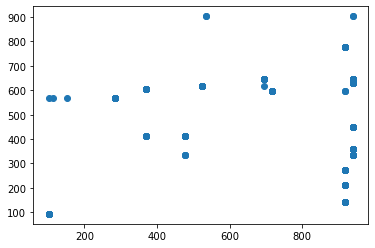

t+1 vs t-913


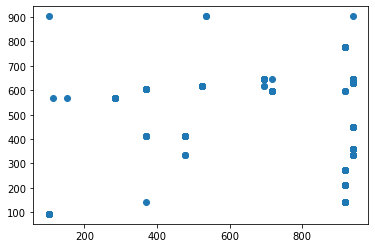

t+1 vs t-914


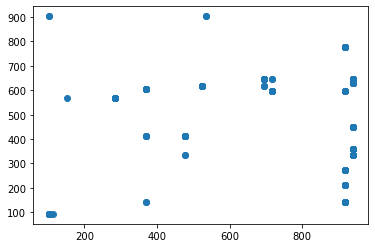

t+1 vs t-915


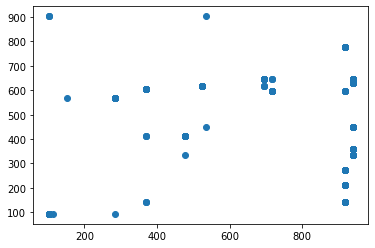

t+1 vs t-916


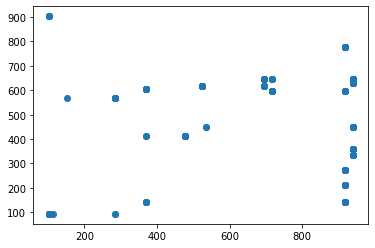

t+1 vs t-917


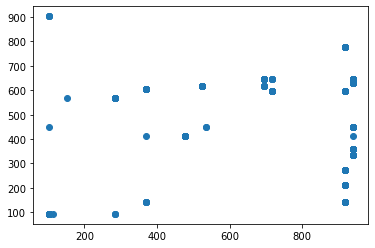

t+1 vs t-918


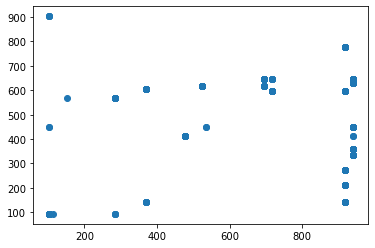

t+1 vs t-919


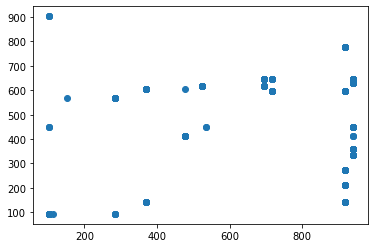

t+1 vs t-920


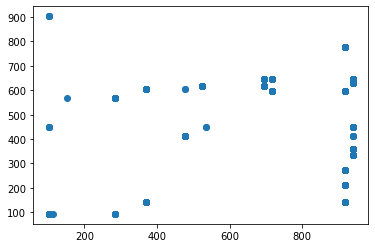

t+1 vs t-921


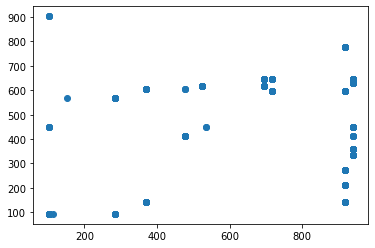

t+1 vs t-922


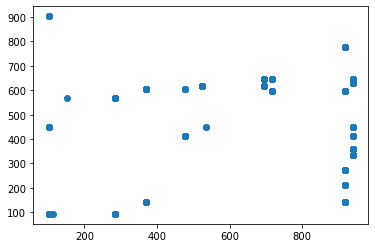

t+1 vs t-923


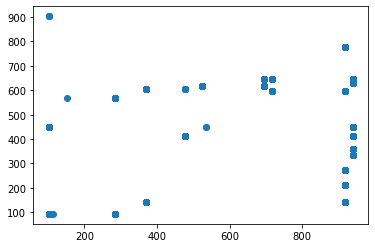

t+1 vs t-924


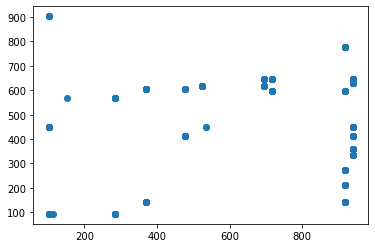

t+1 vs t-925


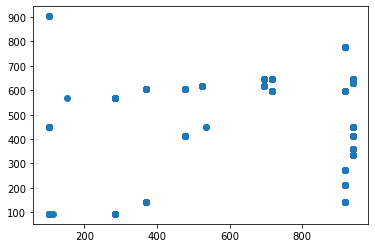

t+1 vs t-926


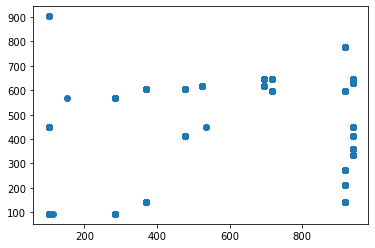

t+1 vs t-927


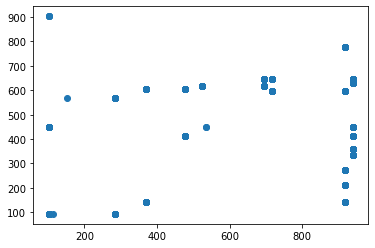

t+1 vs t-928


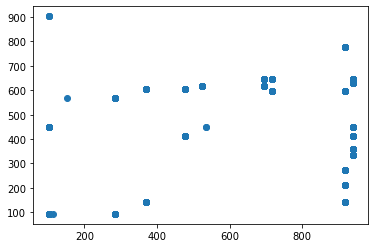

t+1 vs t-929


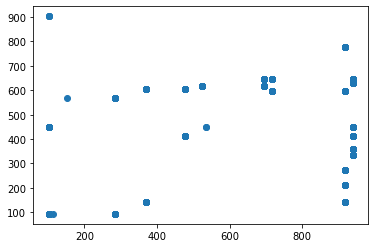

t+1 vs t-930


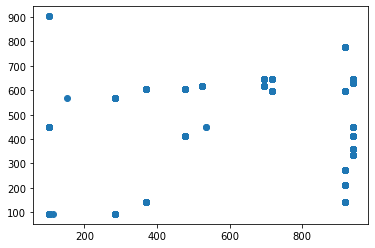

t+1 vs t-931


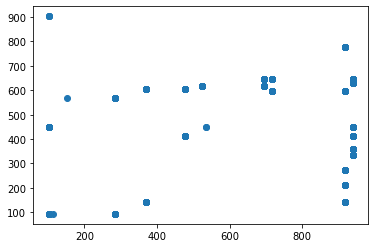

t+1 vs t-932


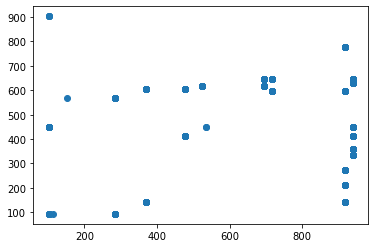

t+1 vs t-933


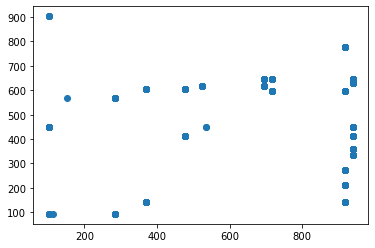

t+1 vs t-934


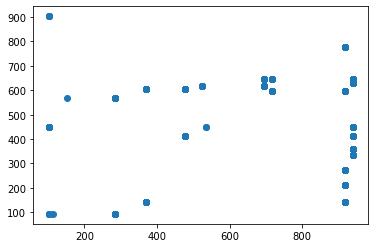

t+1 vs t-935


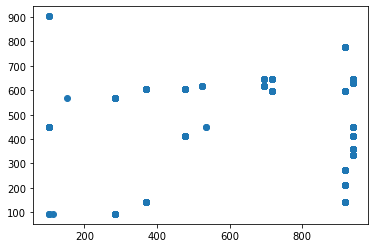

t+1 vs t-936


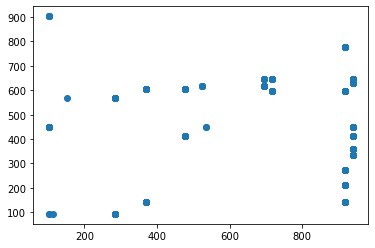

t+1 vs t-937


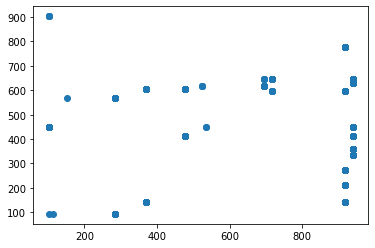

t+1 vs t-938


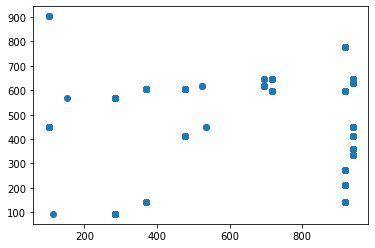

t+1 vs t-939


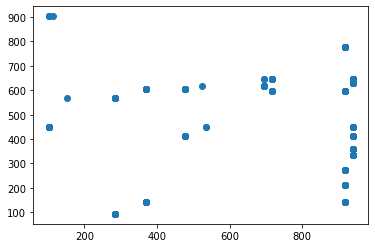

t+1 vs t-940


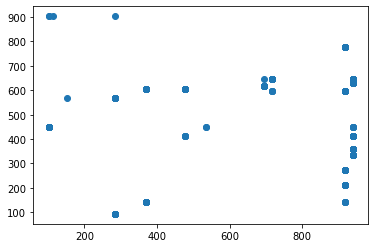

t+1 vs t-941


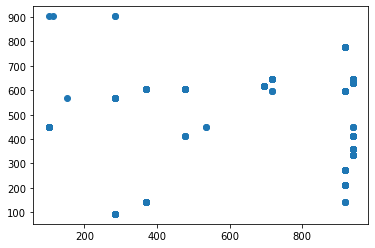

t+1 vs t-942


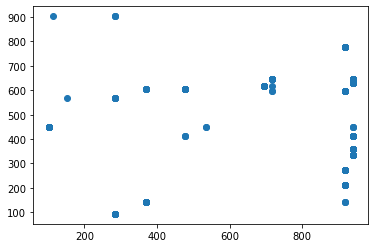

t+1 vs t-943


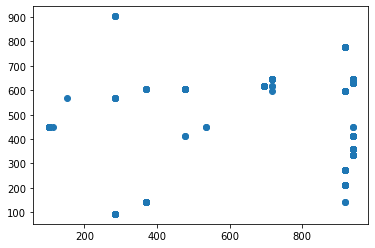

t+1 vs t-944


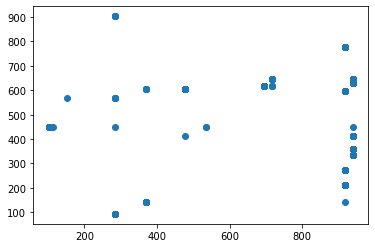

t+1 vs t-945


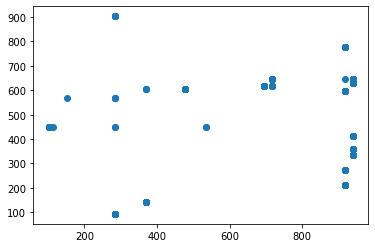

t+1 vs t-946


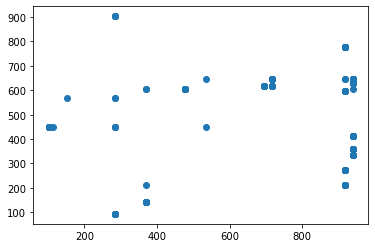

t+1 vs t-947


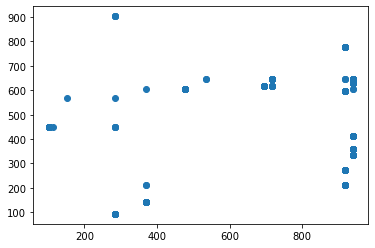

t+1 vs t-948


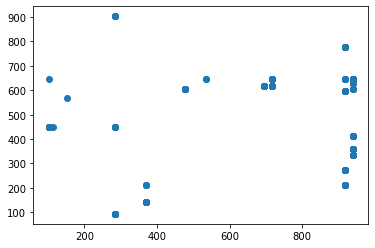

t+1 vs t-949


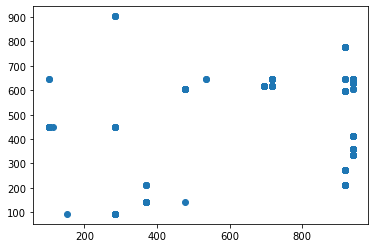

t+1 vs t-950


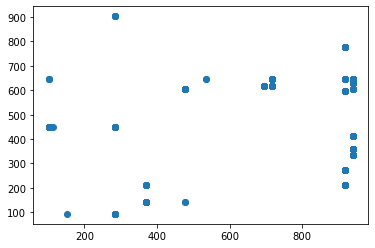

t+1 vs t-951


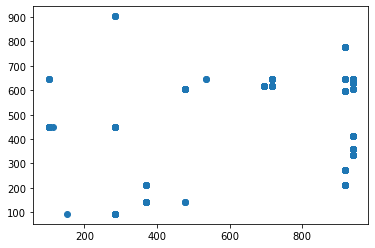

t+1 vs t-952


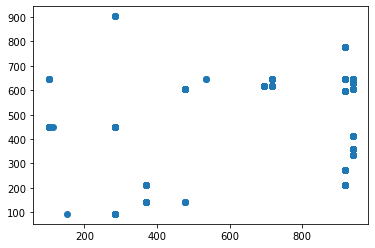

t+1 vs t-953


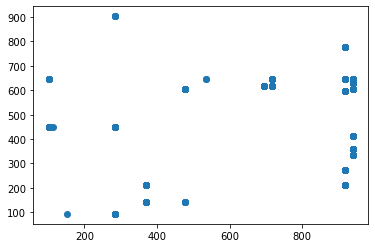

t+1 vs t-954


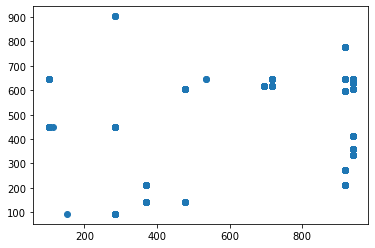

t+1 vs t-955


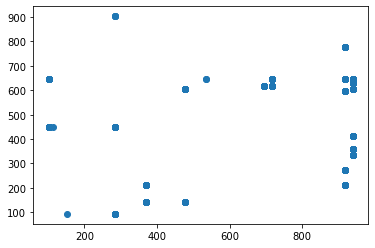

t+1 vs t-956


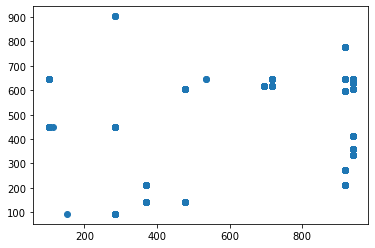

t+1 vs t-957


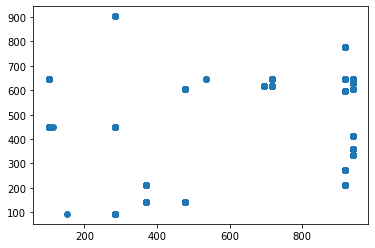

t+1 vs t-958


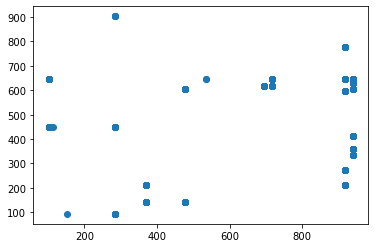

t+1 vs t-959


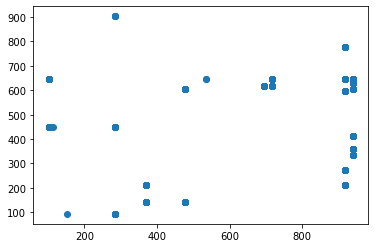

t+1 vs t-960


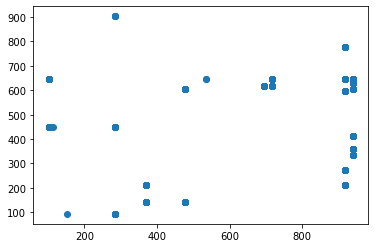

t+1 vs t-961


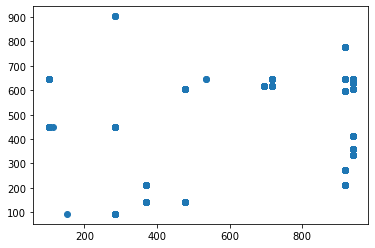

t+1 vs t-962


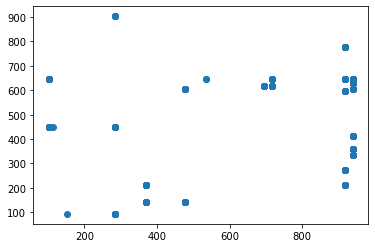

t+1 vs t-963


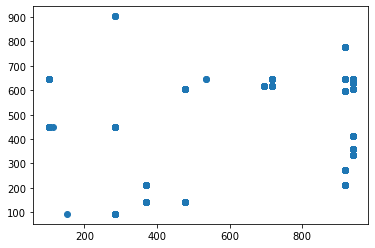

t+1 vs t-964


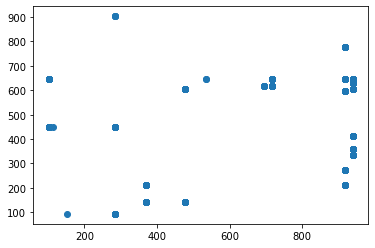

t+1 vs t-965


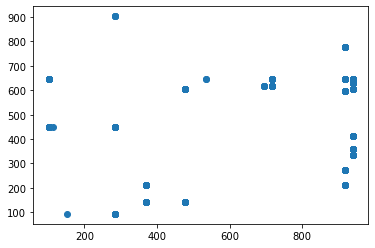

t+1 vs t-966


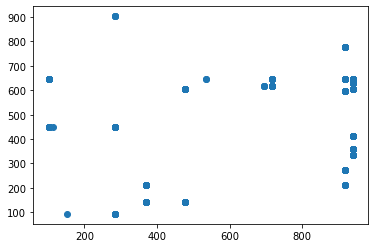

t+1 vs t-967


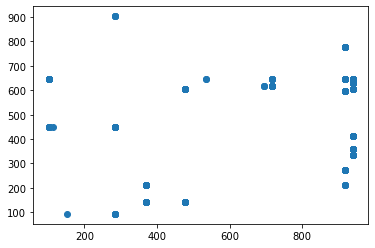

t+1 vs t-968


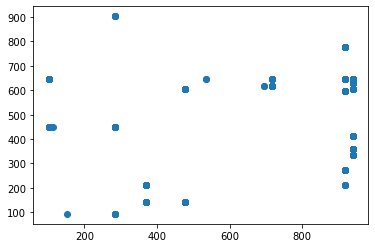

t+1 vs t-969


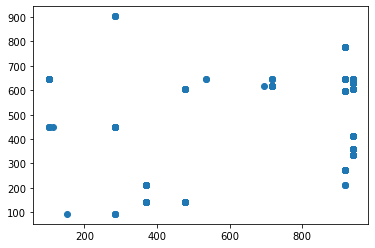

t+1 vs t-970


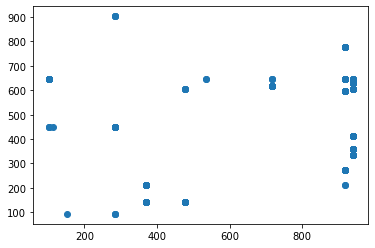

t+1 vs t-971


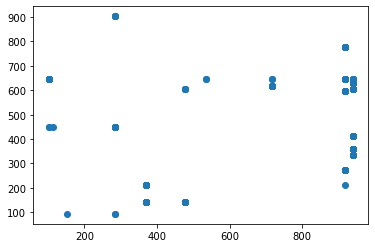

t+1 vs t-972


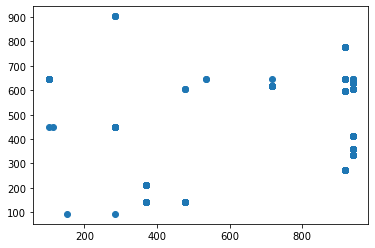

t+1 vs t-973


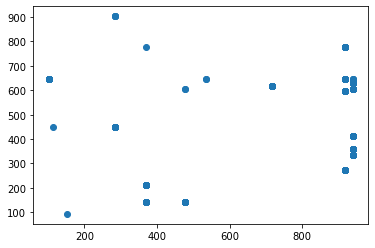

t+1 vs t-974


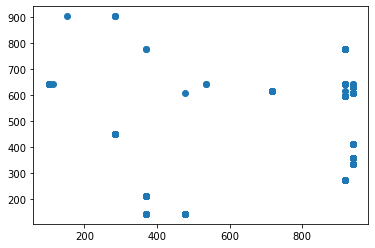

t+1 vs t-975


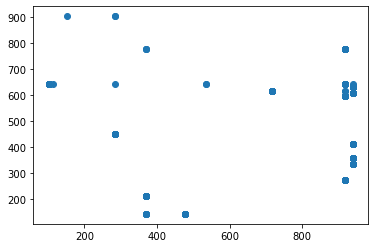

t+1 vs t-976


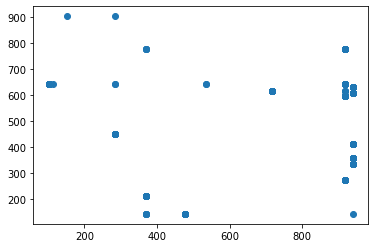

t+1 vs t-977


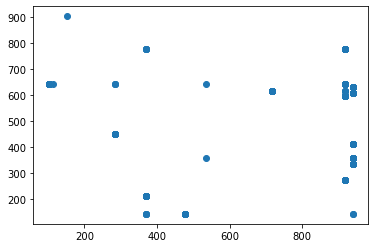

t+1 vs t-978


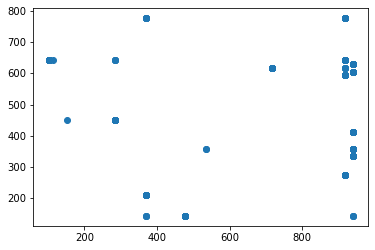

t+1 vs t-979


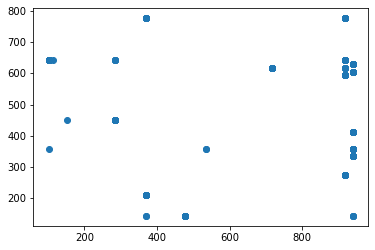

t+1 vs t-980


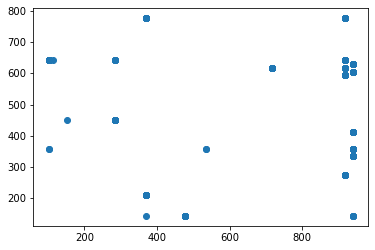

t+1 vs t-981


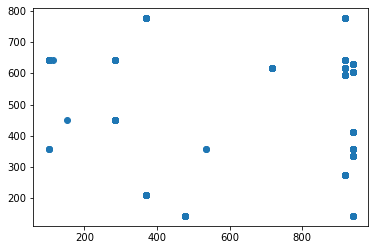

t+1 vs t-982


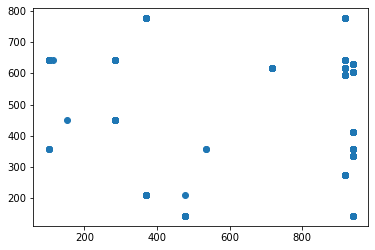

t+1 vs t-983


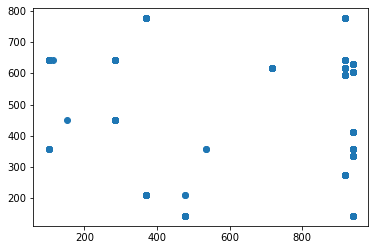

t+1 vs t-984


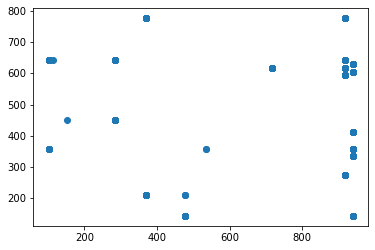

t+1 vs t-985


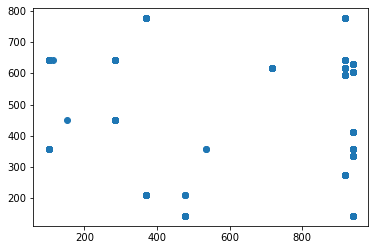

t+1 vs t-986


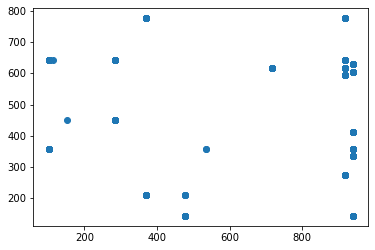

t+1 vs t-987


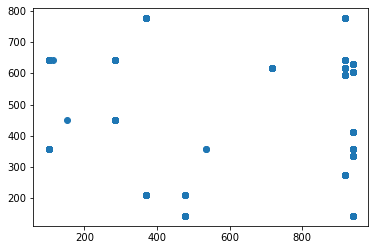

t+1 vs t-988


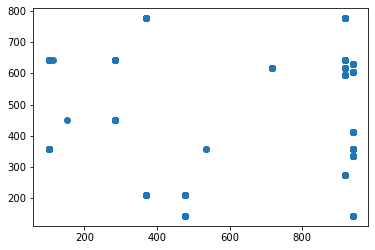

t+1 vs t-989


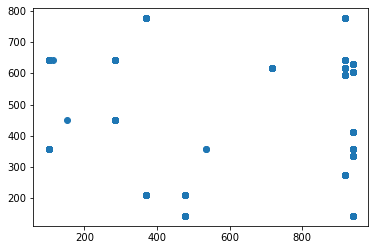

t+1 vs t-990


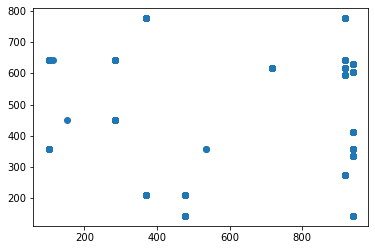

t+1 vs t-991


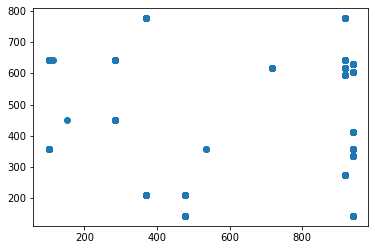

t+1 vs t-992


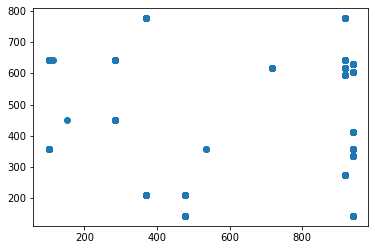

t+1 vs t-993


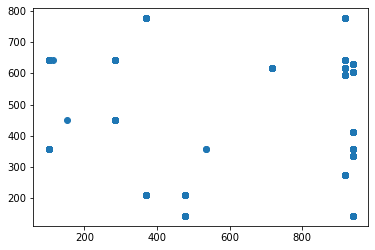

t+1 vs t-994


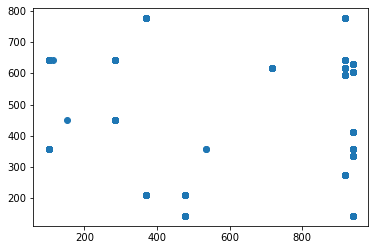

t+1 vs t-995


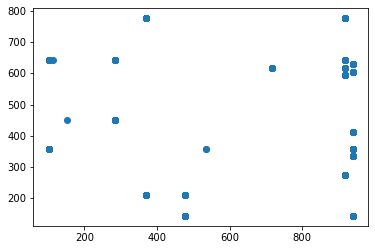

t+1 vs t-996


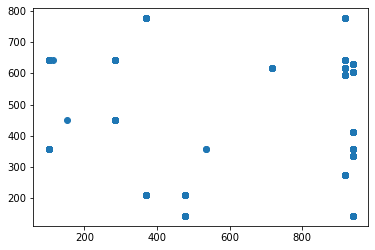

t+1 vs t-997


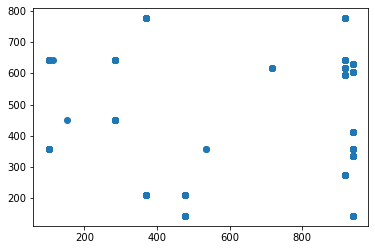

t+1 vs t-998


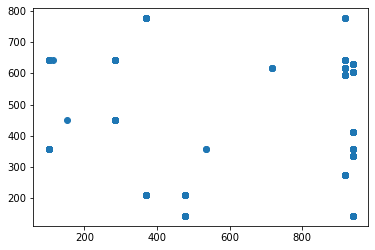

t+1 vs t-999


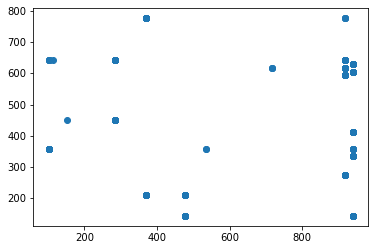

t+1 vs t-1000


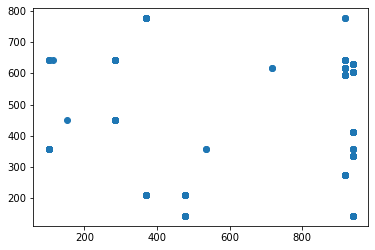

t+1 vs t-1001


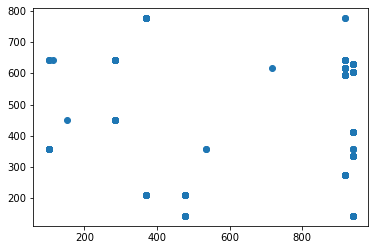

t+1 vs t-1002


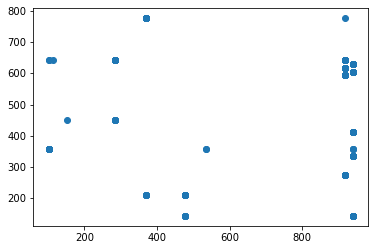

t+1 vs t-1003


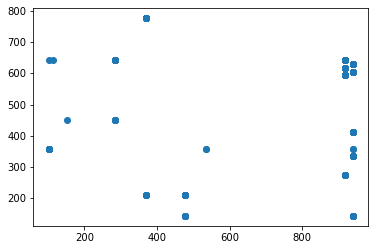

t+1 vs t-1004


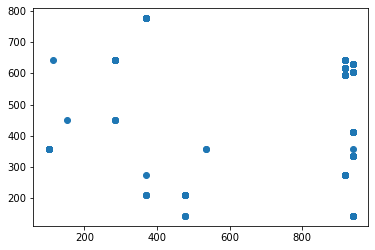

t+1 vs t-1005


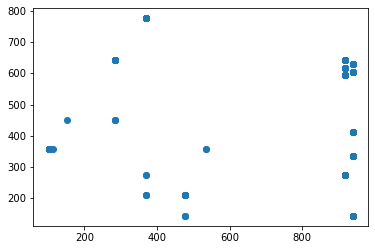

t+1 vs t-1006


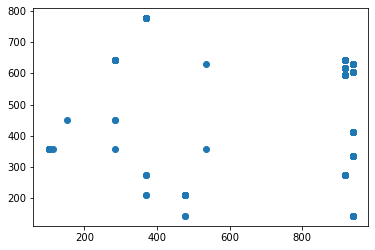

t+1 vs t-1007


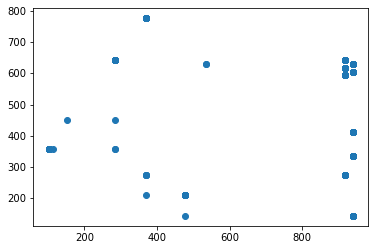

t+1 vs t-1008


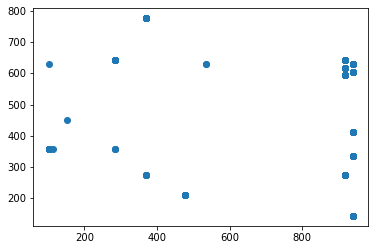

t+1 vs t-1009


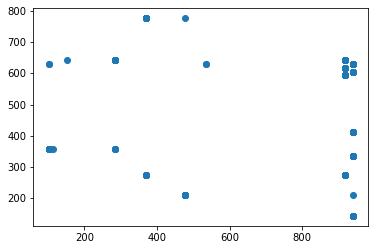

t+1 vs t-1010


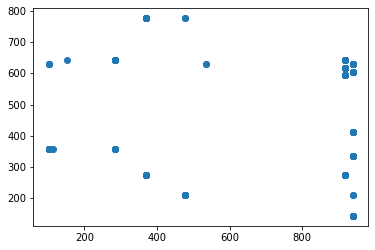

t+1 vs t-1011


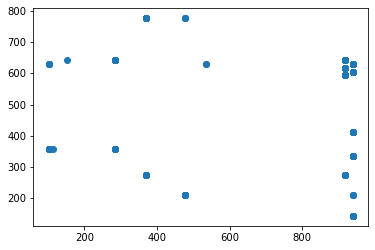

t+1 vs t-1012


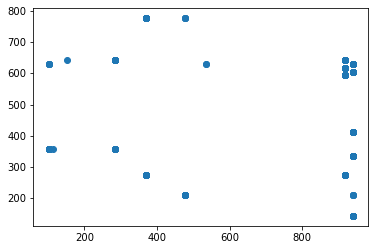

t+1 vs t-1013


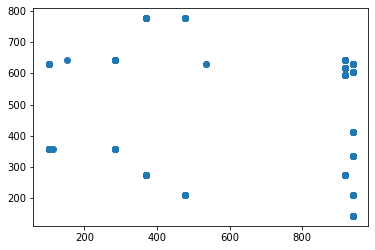

t+1 vs t-1014


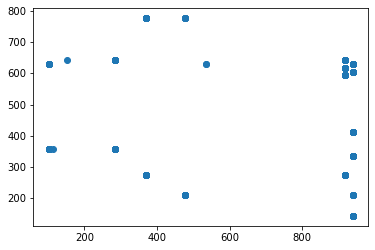

t+1 vs t-1015


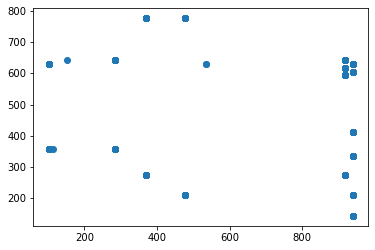

t+1 vs t-1016


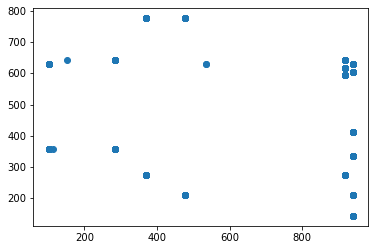

t+1 vs t-1017


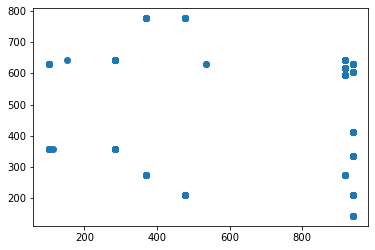

t+1 vs t-1018


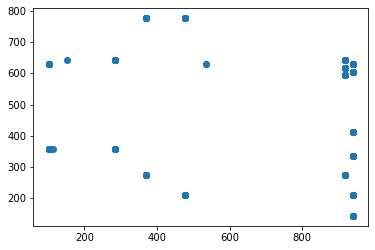

t+1 vs t-1019


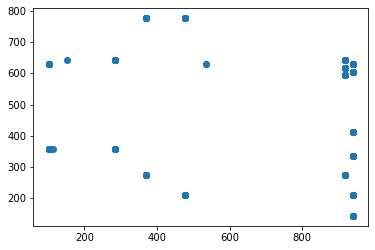

t+1 vs t-1020


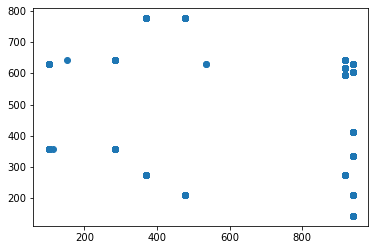

t+1 vs t-1021


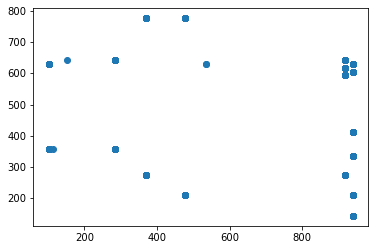

t+1 vs t-1022


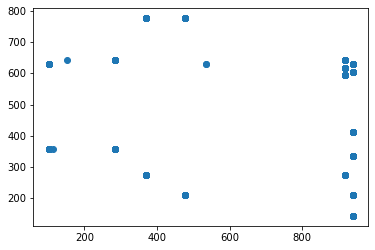

t+1 vs t-1023


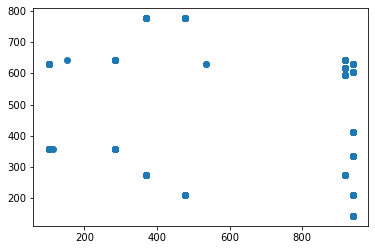

t+1 vs t-1024


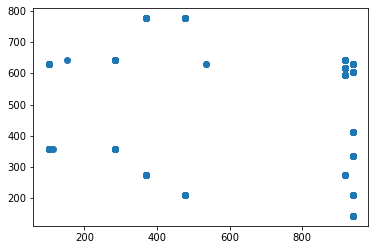

t+1 vs t-1025


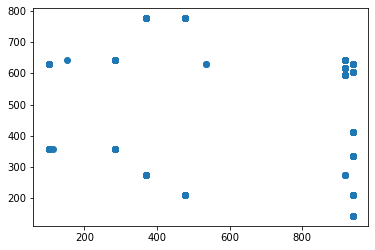

t+1 vs t-1026


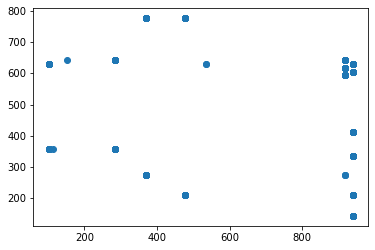

t+1 vs t-1027


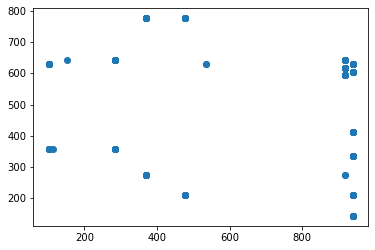

t+1 vs t-1028


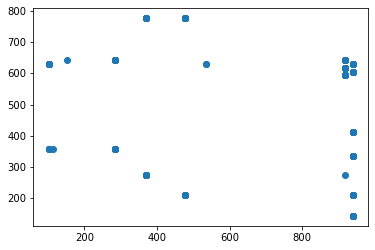

t+1 vs t-1029


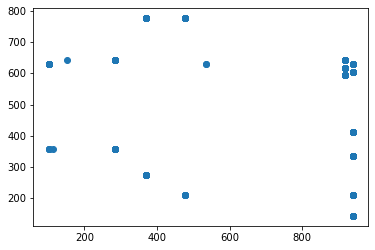

t+1 vs t-1030


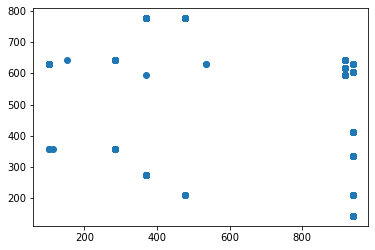

t+1 vs t-1031


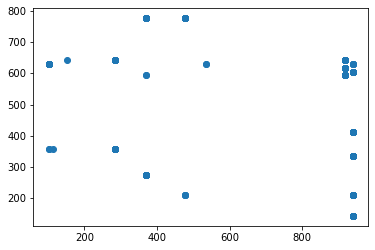

t+1 vs t-1032


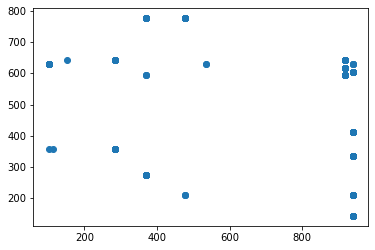

t+1 vs t-1033


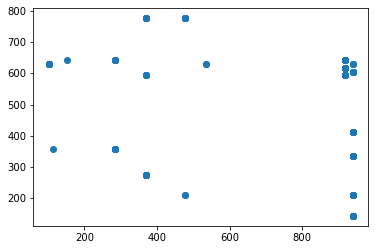

t+1 vs t-1034


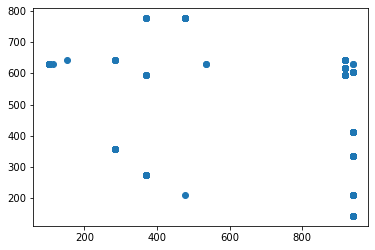

t+1 vs t-1035


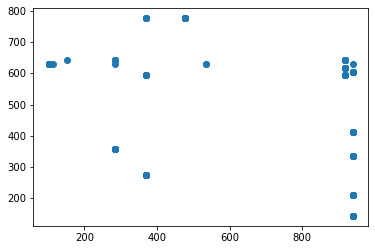

t+1 vs t-1036


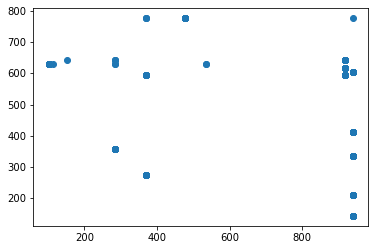

t+1 vs t-1037


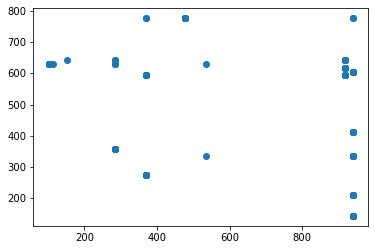

t+1 vs t-1038


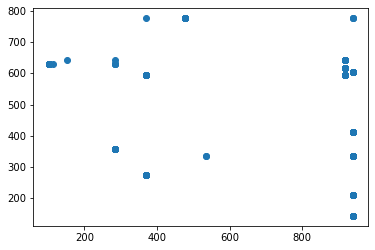

t+1 vs t-1039


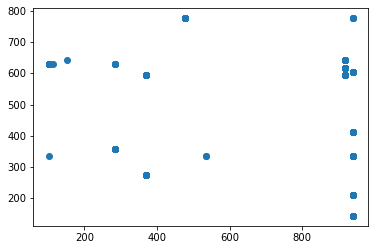

t+1 vs t-1040


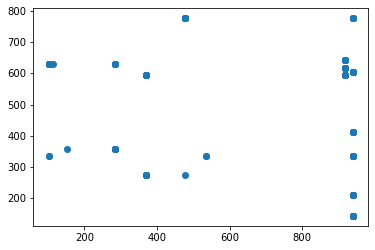

t+1 vs t-1041


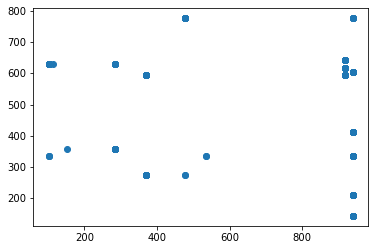

t+1 vs t-1042


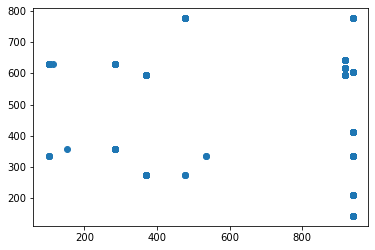

t+1 vs t-1043


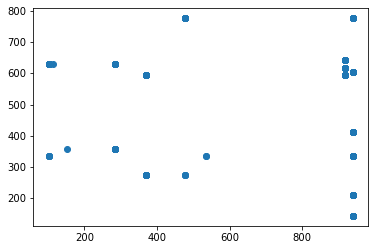

t+1 vs t-1044


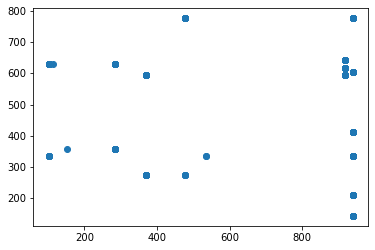

t+1 vs t-1045


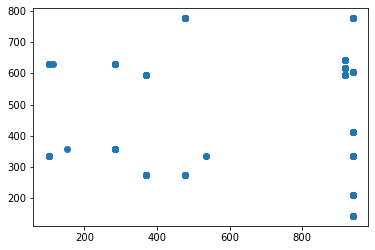

t+1 vs t-1046


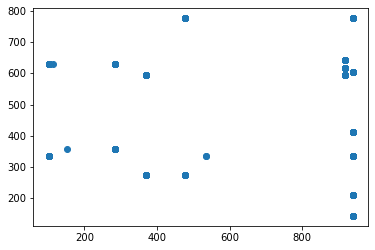

t+1 vs t-1047


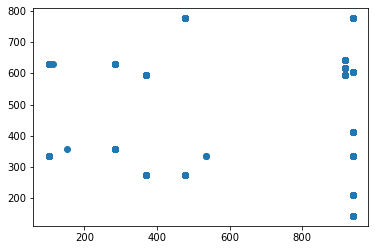

t+1 vs t-1048


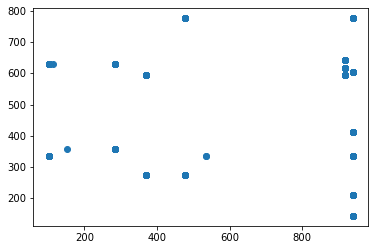

t+1 vs t-1049


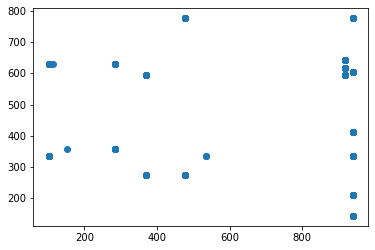

t+1 vs t-1050


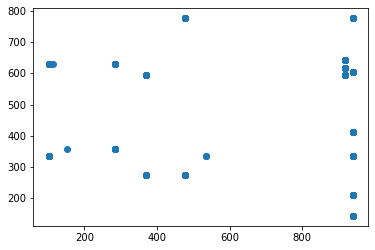

t+1 vs t-1051


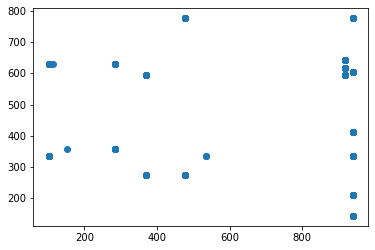

t+1 vs t-1052


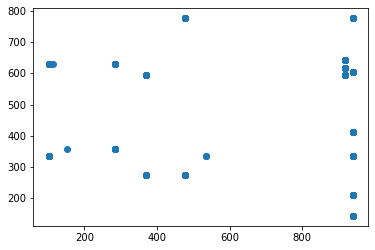

t+1 vs t-1053


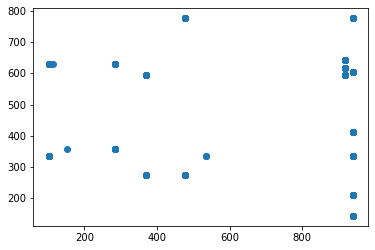

t+1 vs t-1054


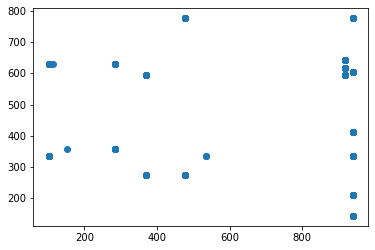

t+1 vs t-1055


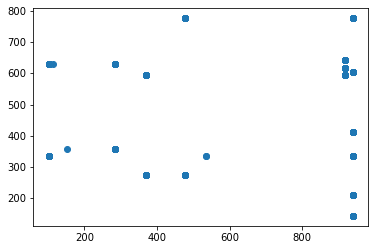

t+1 vs t-1056


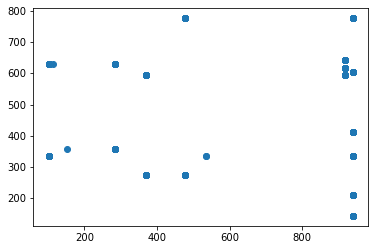

t+1 vs t-1057


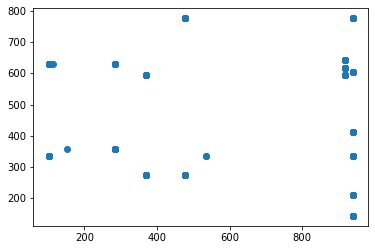

t+1 vs t-1058


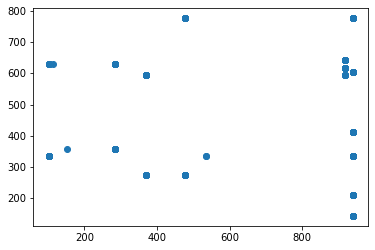

t+1 vs t-1059


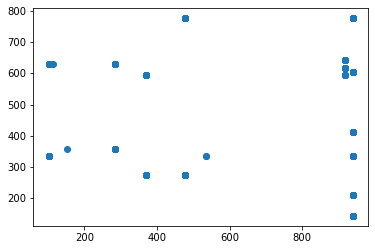

t+1 vs t-1060


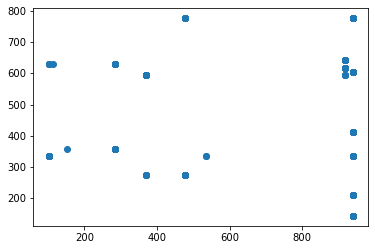

t+1 vs t-1061


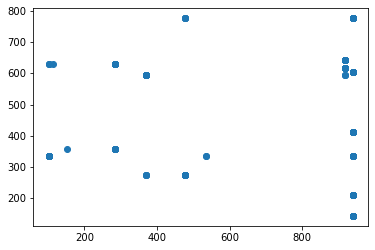

t+1 vs t-1062


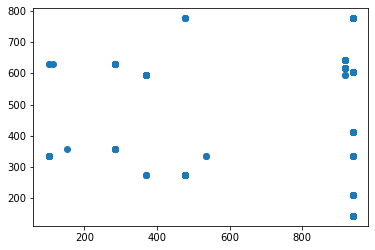

t+1 vs t-1063


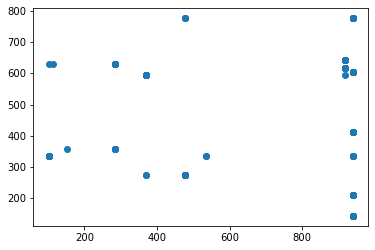

t+1 vs t-1064


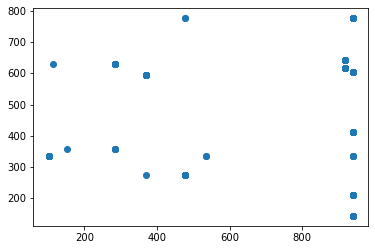

t+1 vs t-1065


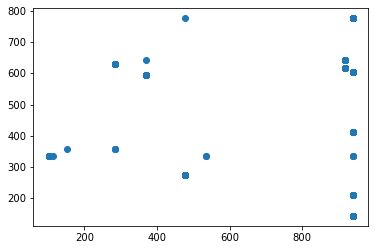

t+1 vs t-1066


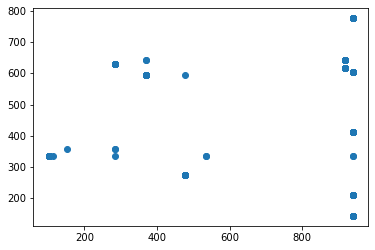

t+1 vs t-1067


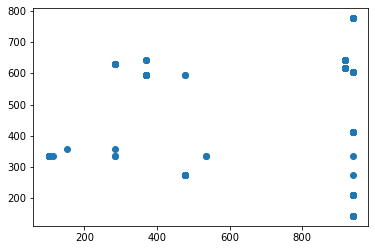

t+1 vs t-1068


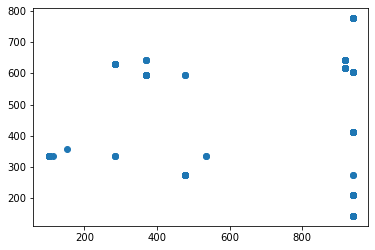

t+1 vs t-1069


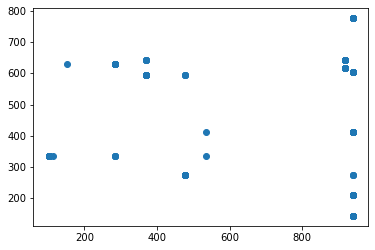

t+1 vs t-1070


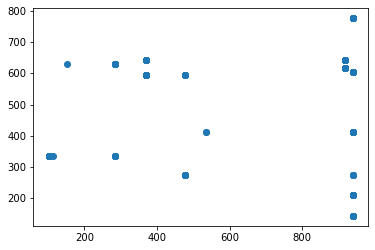

t+1 vs t-1071


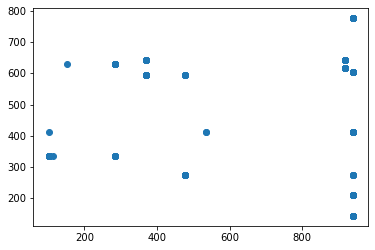

t+1 vs t-1072


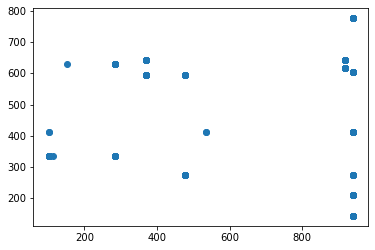

t+1 vs t-1073


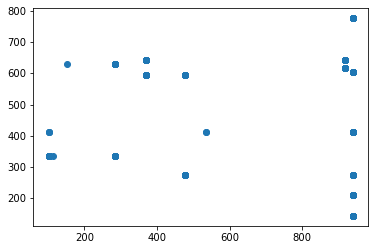

t+1 vs t-1074


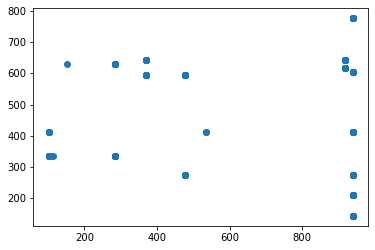

t+1 vs t-1075


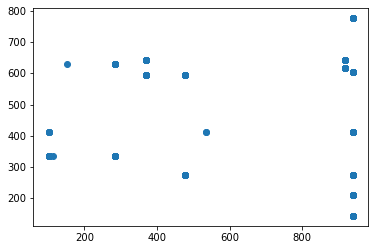

t+1 vs t-1076


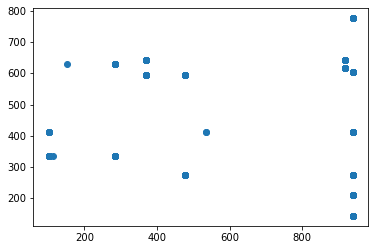

t+1 vs t-1077


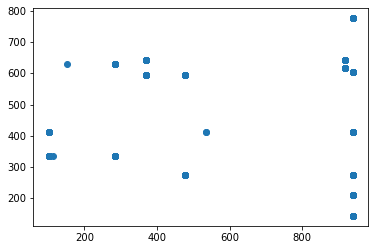

t+1 vs t-1078


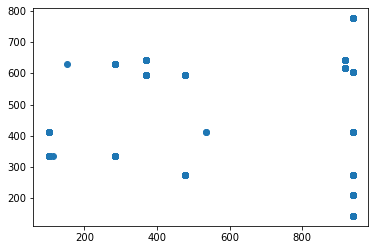

t+1 vs t-1079


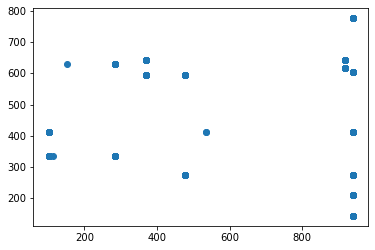

t+1 vs t-1080


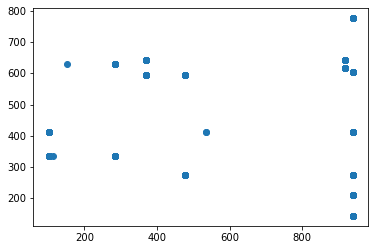

t+1 vs t-1081


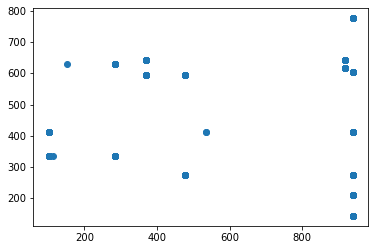

t+1 vs t-1082


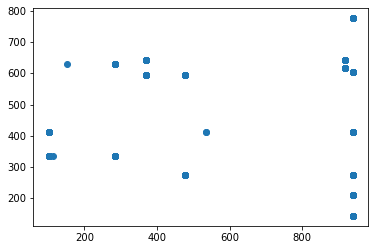

t+1 vs t-1083


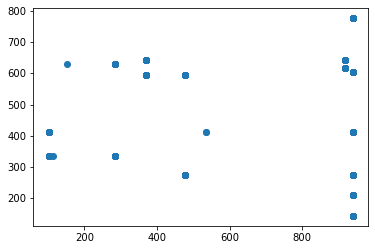

t+1 vs t-1084


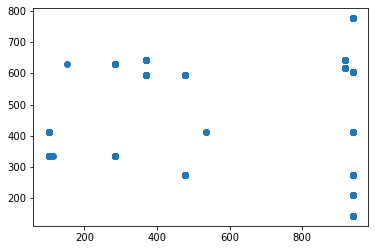

t+1 vs t-1085


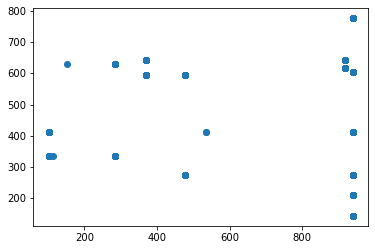

t+1 vs t-1086


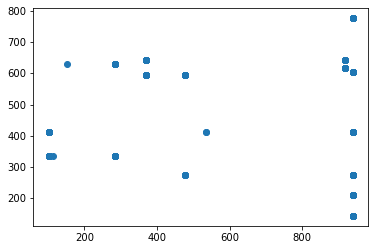

t+1 vs t-1087


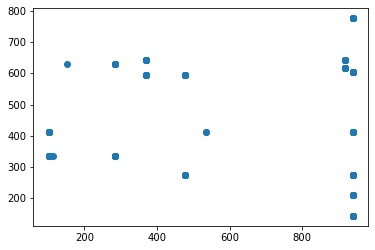

t+1 vs t-1088


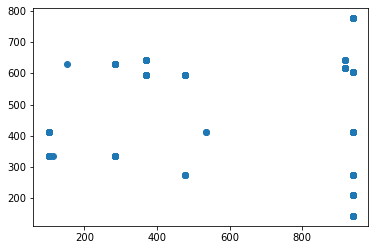

t+1 vs t-1089


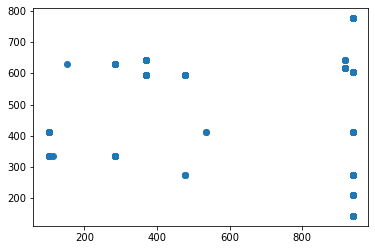

t+1 vs t-1090


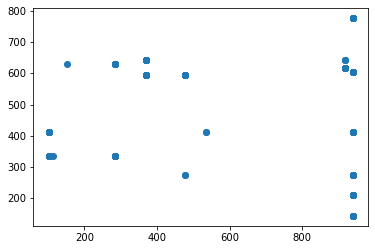

t+1 vs t-1091


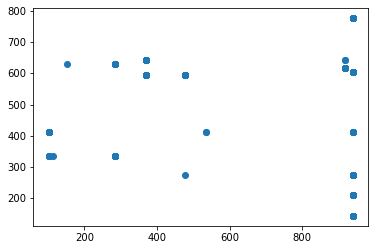

t+1 vs t-1092


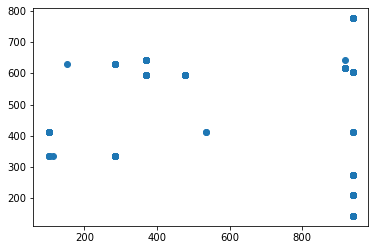

t+1 vs t-1093


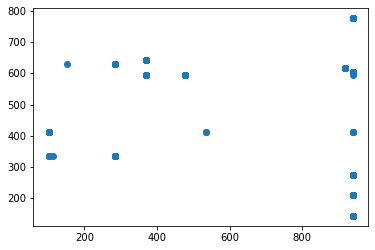

t+1 vs t-1094


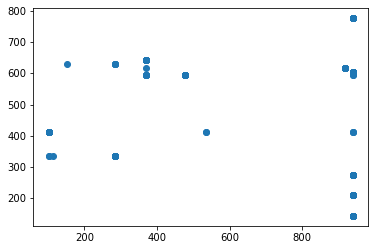

t+1 vs t-1095


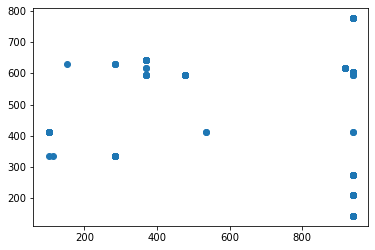

t+1 vs t-1096


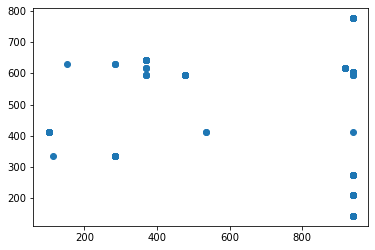

t+1 vs t-1097


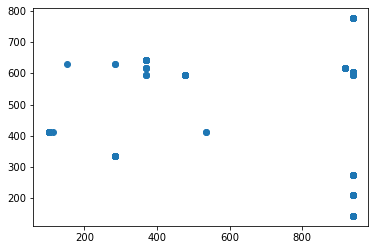

t+1 vs t-1098


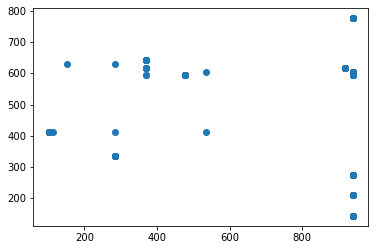

t+1 vs t-1099


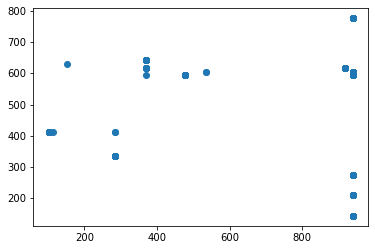

t+1 vs t-1100


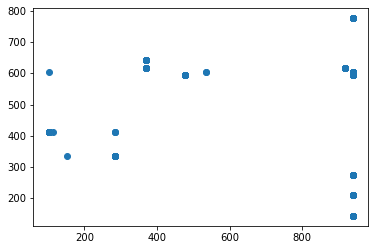

t+1 vs t-1101


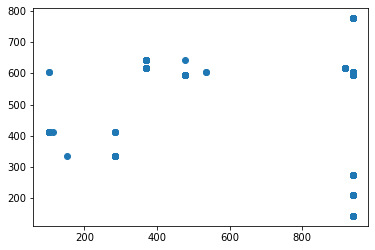

t+1 vs t-1102


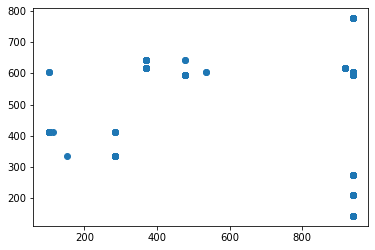

t+1 vs t-1103


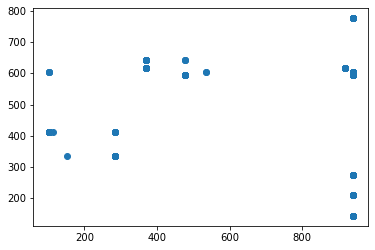

t+1 vs t-1104


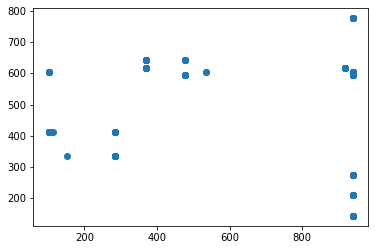

t+1 vs t-1105


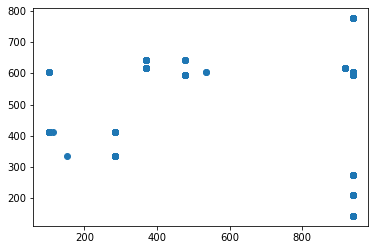

t+1 vs t-1106


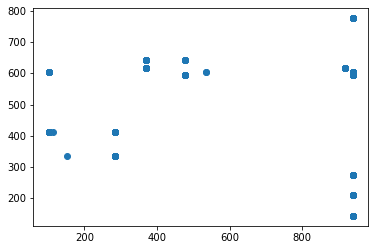

t+1 vs t-1107


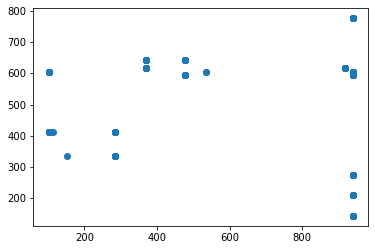

t+1 vs t-1108


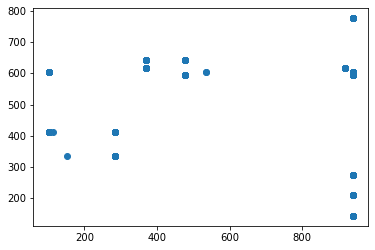

t+1 vs t-1109


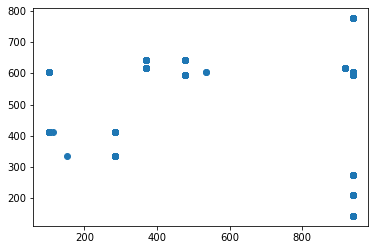

t+1 vs t-1110


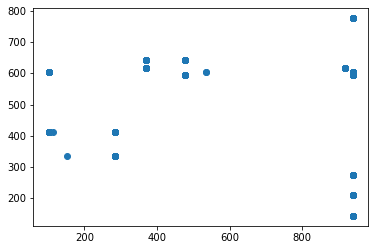

t+1 vs t-1111


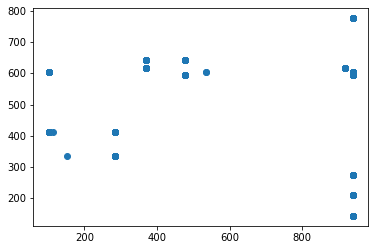

t+1 vs t-1112


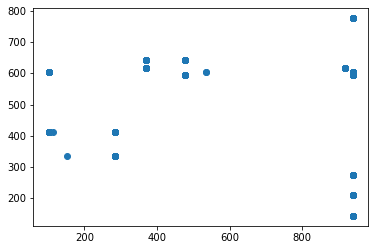

t+1 vs t-1113


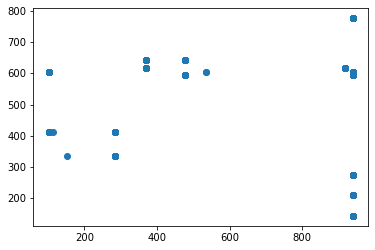

t+1 vs t-1114


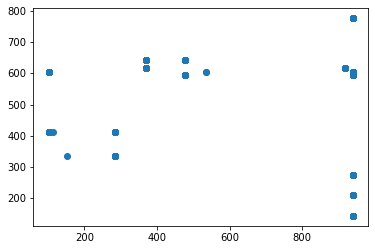

t+1 vs t-1115


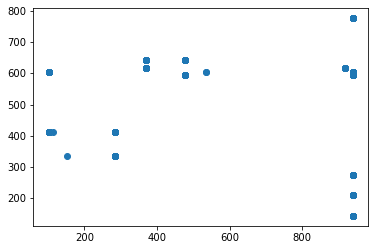

t+1 vs t-1116


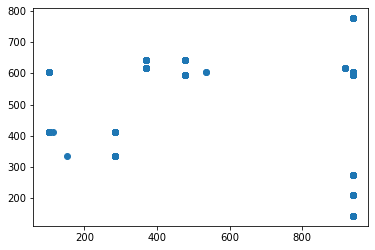

t+1 vs t-1117


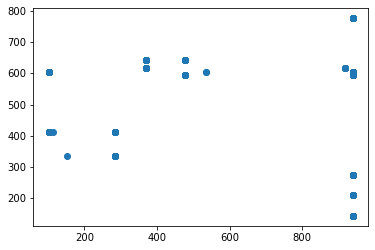

t+1 vs t-1118


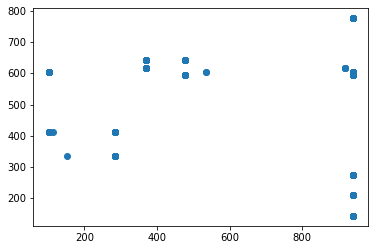

t+1 vs t-1119


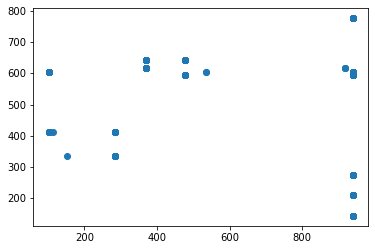

t+1 vs t-1120


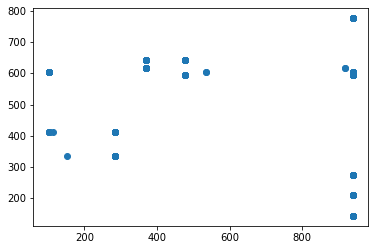

t+1 vs t-1121


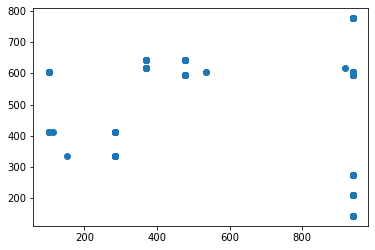

t+1 vs t-1122


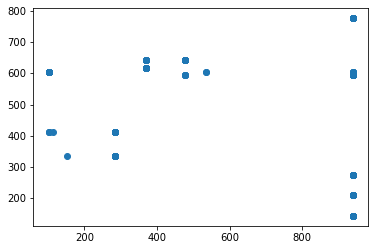

t+1 vs t-1123


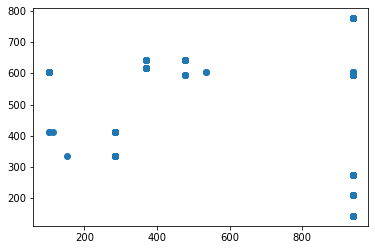

t+1 vs t-1124


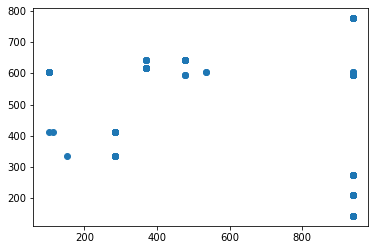

t+1 vs t-1125


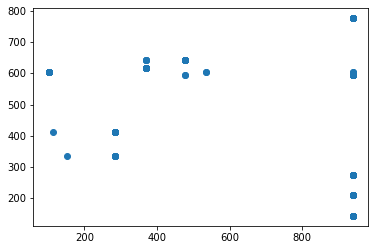

t+1 vs t-1126


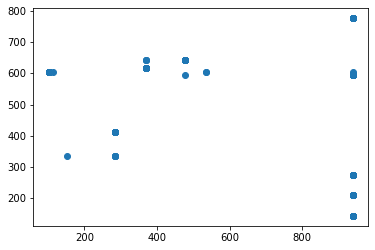

t+1 vs t-1127


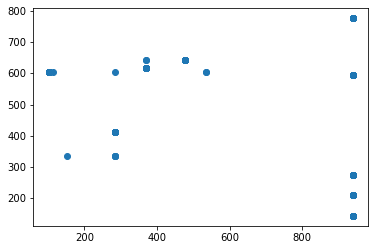

t+1 vs t-1128


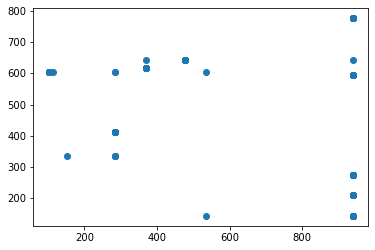

t+1 vs t-1129


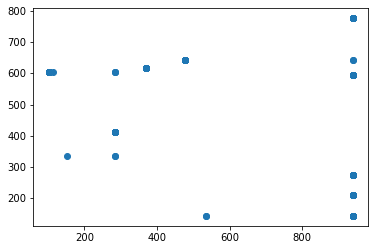

t+1 vs t-1130


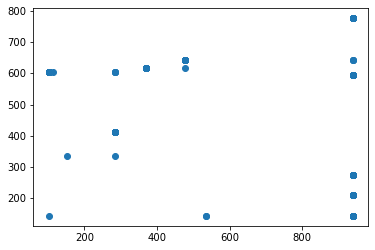

t+1 vs t-1131


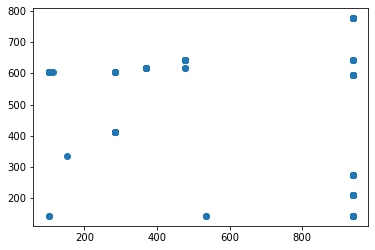

t+1 vs t-1132


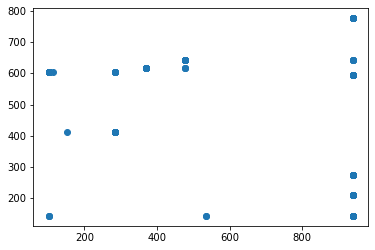

t+1 vs t-1133


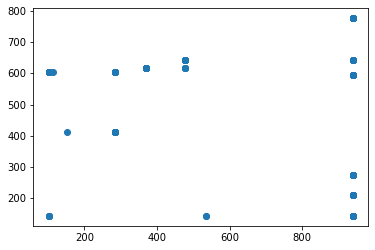

t+1 vs t-1134


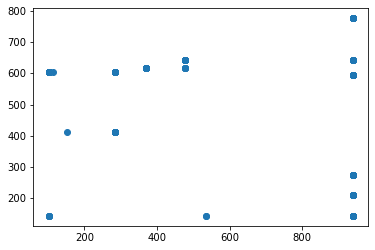

t+1 vs t-1135


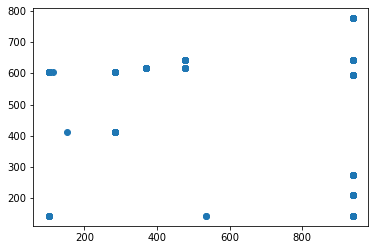

t+1 vs t-1136


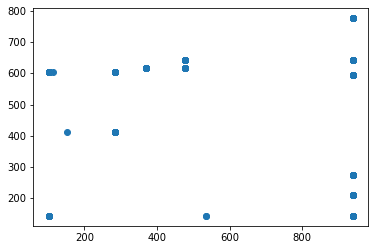

t+1 vs t-1137


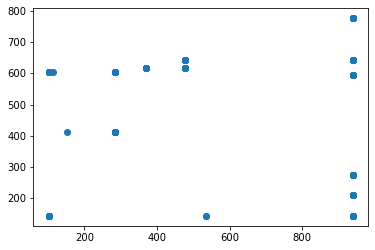

t+1 vs t-1138


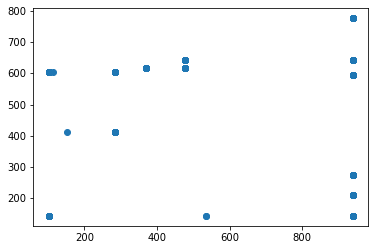

t+1 vs t-1139


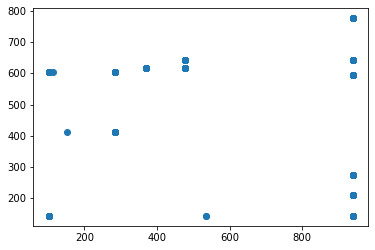

t+1 vs t-1140


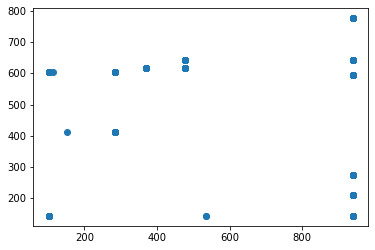

t+1 vs t-1141


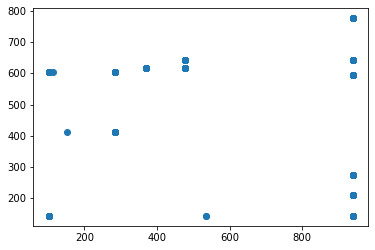

t+1 vs t-1142


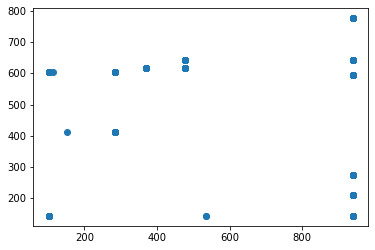

t+1 vs t-1143


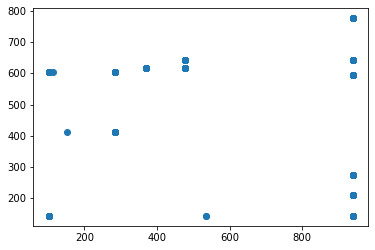

t+1 vs t-1144


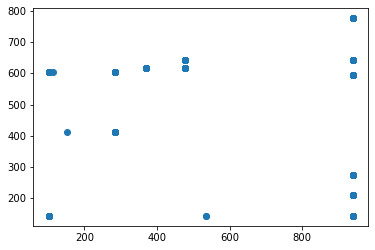

t+1 vs t-1145


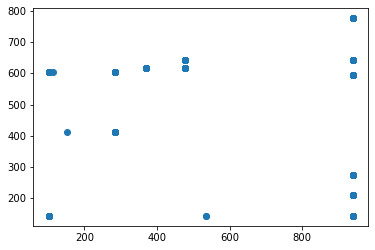

t+1 vs t-1146


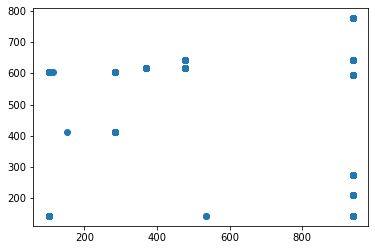

t+1 vs t-1147


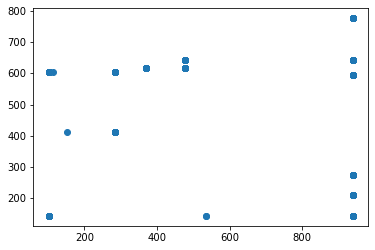

t+1 vs t-1148


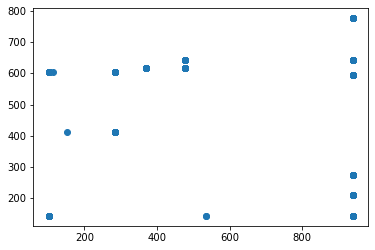

t+1 vs t-1149


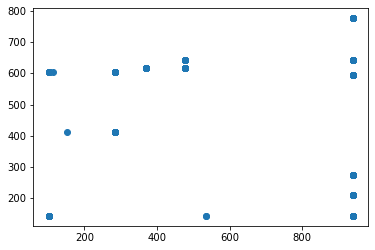

t+1 vs t-1150


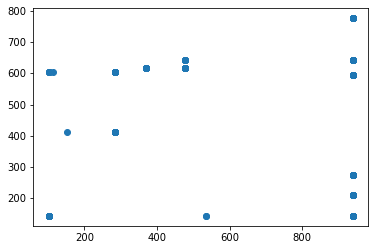

t+1 vs t-1151


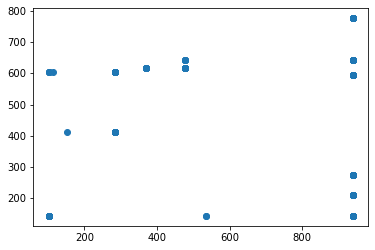

t+1 vs t-1152


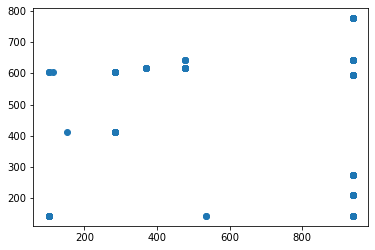

t+1 vs t-1153


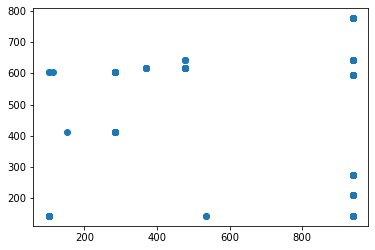

t+1 vs t-1154


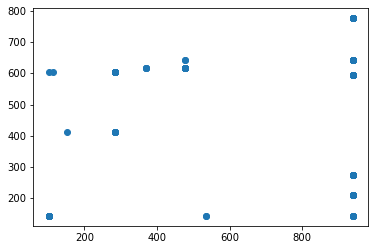

t+1 vs t-1155


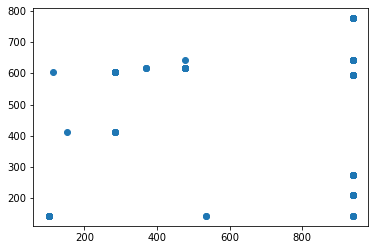

t+1 vs t-1156


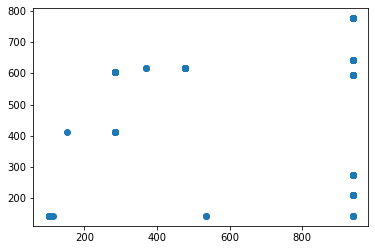

t+1 vs t-1157


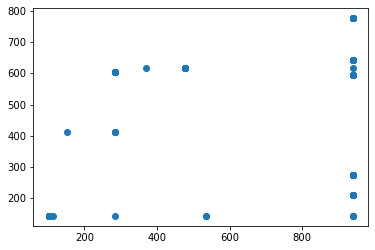

t+1 vs t-1158


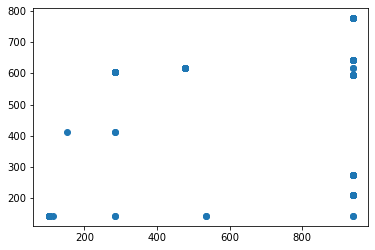

t+1 vs t-1159


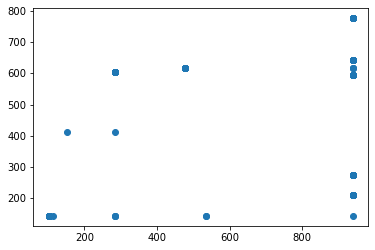

t+1 vs t-1160


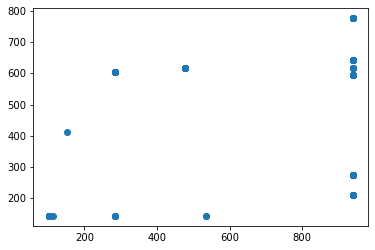

t+1 vs t-1161


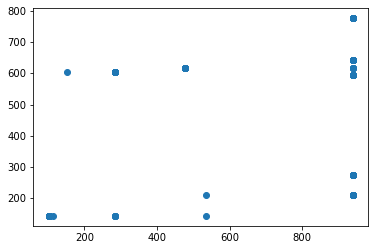

t+1 vs t-1162


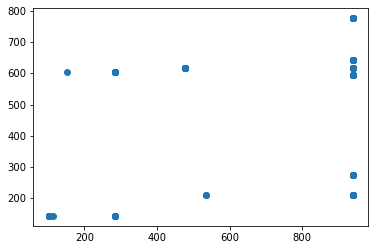

t+1 vs t-1163


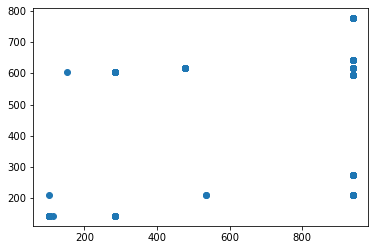

t+1 vs t-1164


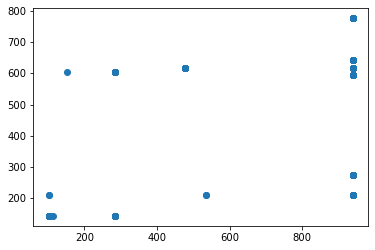

t+1 vs t-1165


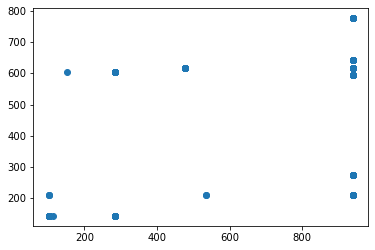

t+1 vs t-1166


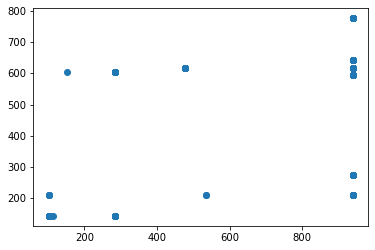

t+1 vs t-1167


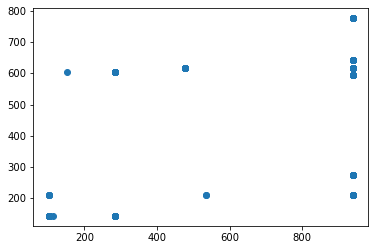

t+1 vs t-1168


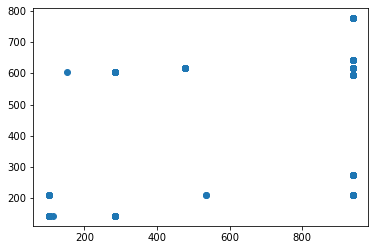

t+1 vs t-1169


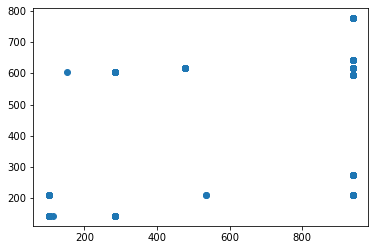

t+1 vs t-1170


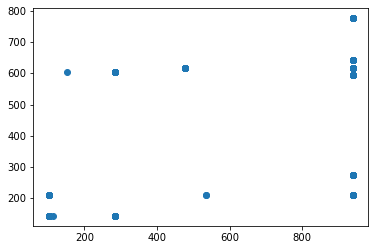

t+1 vs t-1171


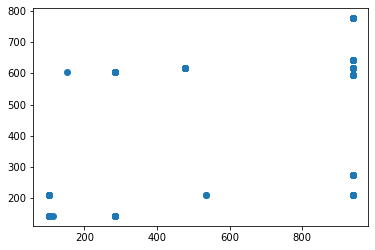

t+1 vs t-1172


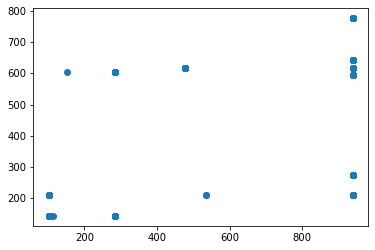

t+1 vs t-1173


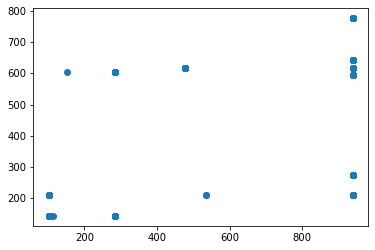

t+1 vs t-1174


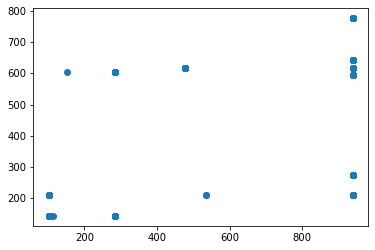

t+1 vs t-1175


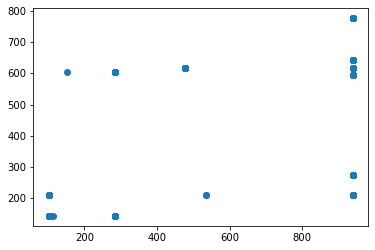

t+1 vs t-1176


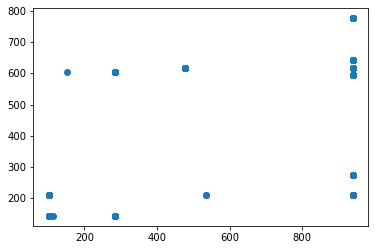

t+1 vs t-1177


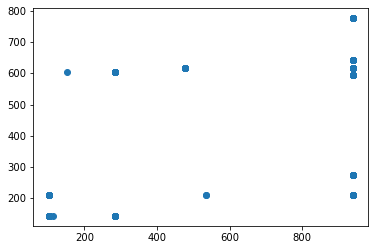

t+1 vs t-1178


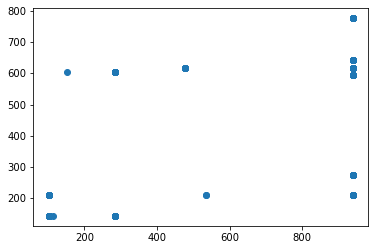

t+1 vs t-1179


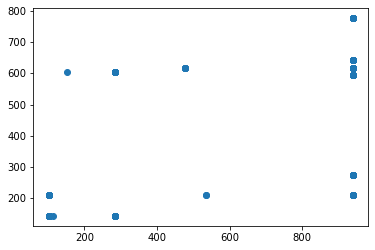

t+1 vs t-1180


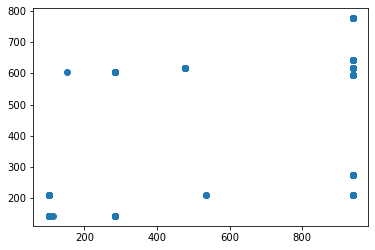

t+1 vs t-1181


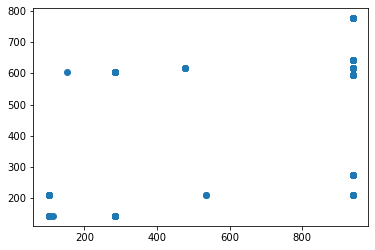

t+1 vs t-1182


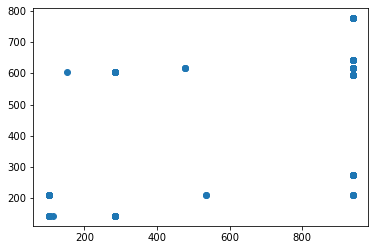

t+1 vs t-1183


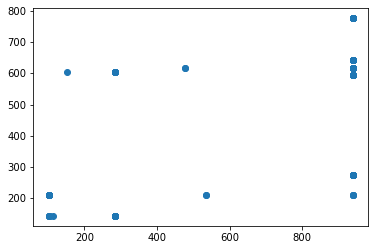

t+1 vs t-1184


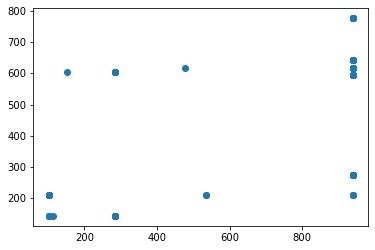

t+1 vs t-1185


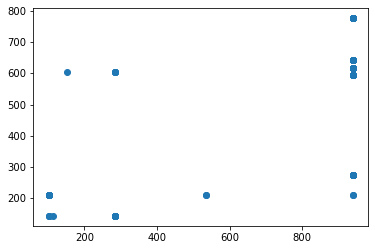

t+1 vs t-1186


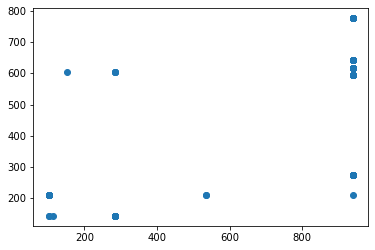

t+1 vs t-1187


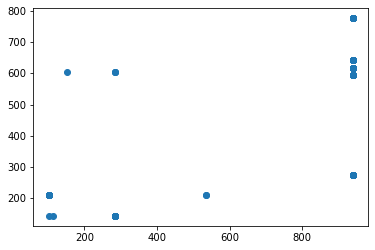

t+1 vs t-1188


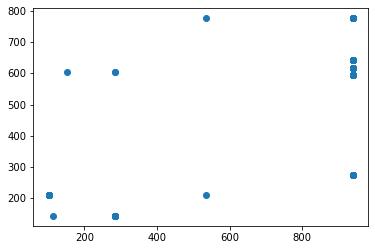

t+1 vs t-1189


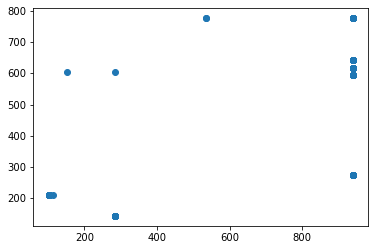

t+1 vs t-1190


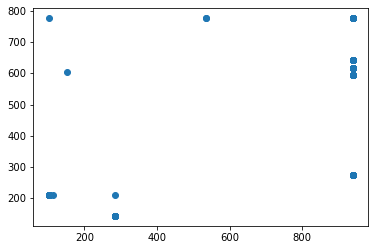

t+1 vs t-1191


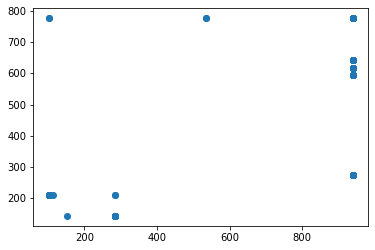

t+1 vs t-1192


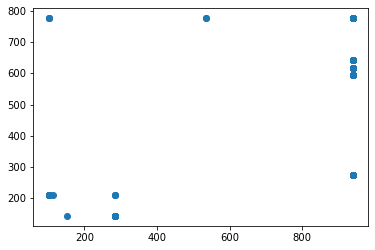

t+1 vs t-1193


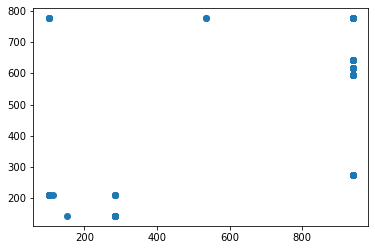

t+1 vs t-1194


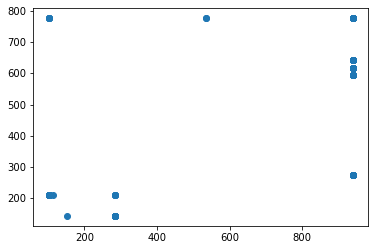

t+1 vs t-1195


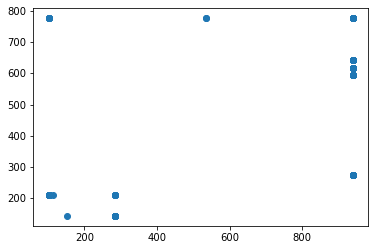

t+1 vs t-1196


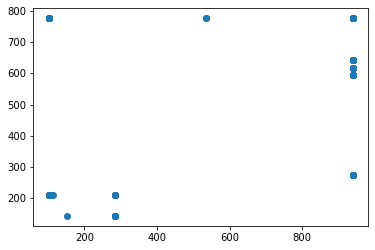

t+1 vs t-1197


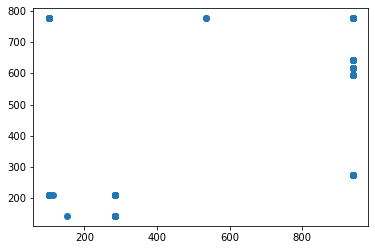

t+1 vs t-1198


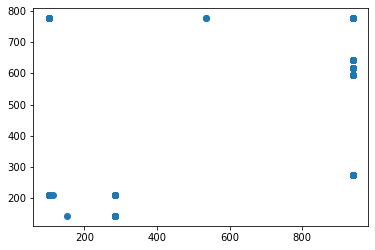

t+1 vs t-1199


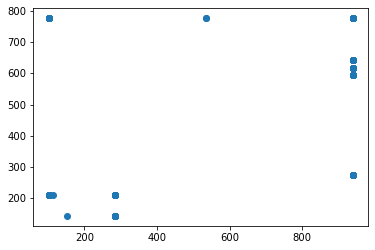

t+1 vs t-1200


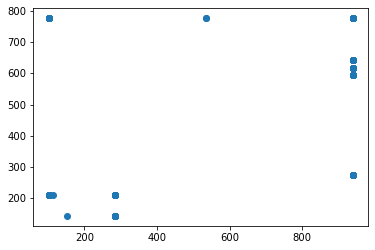

t+1 vs t-1201


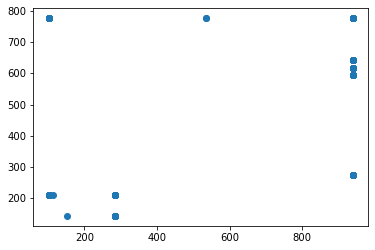

t+1 vs t-1202


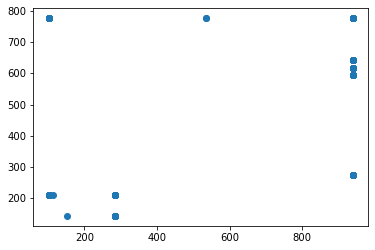

t+1 vs t-1203


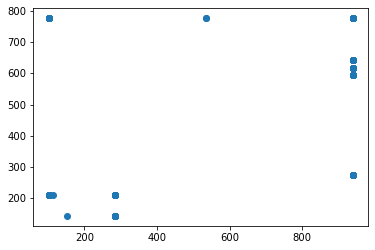

t+1 vs t-1204


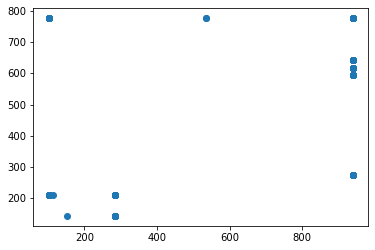

t+1 vs t-1205


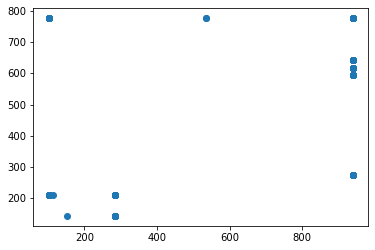

t+1 vs t-1206


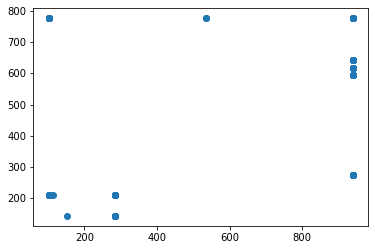

t+1 vs t-1207


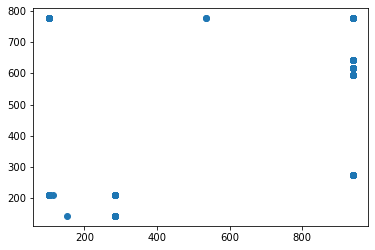

t+1 vs t-1208


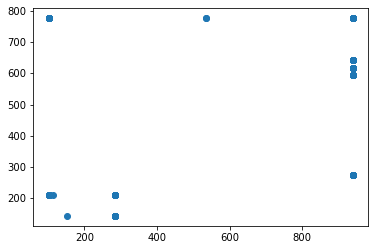

t+1 vs t-1209


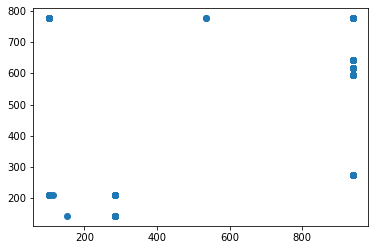

t+1 vs t-1210


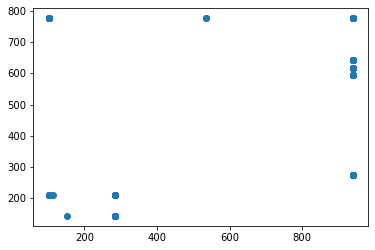

t+1 vs t-1211


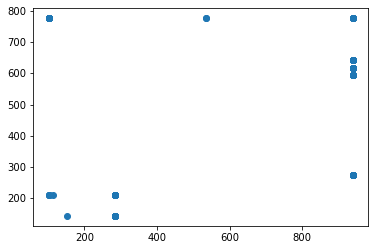

t+1 vs t-1212


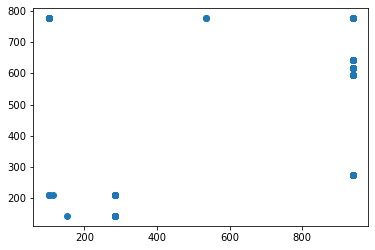

t+1 vs t-1213


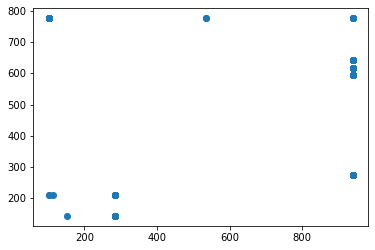

t+1 vs t-1214


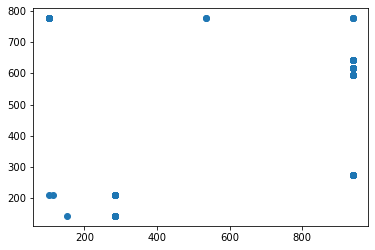

t+1 vs t-1215


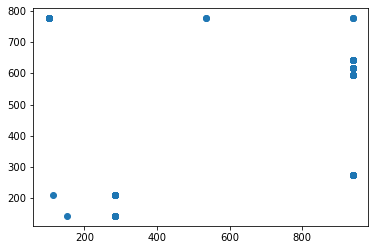

t+1 vs t-1216


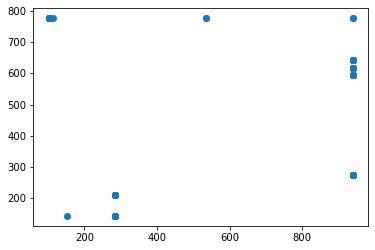

t+1 vs t-1217


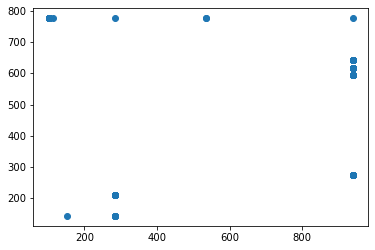

t+1 vs t-1218


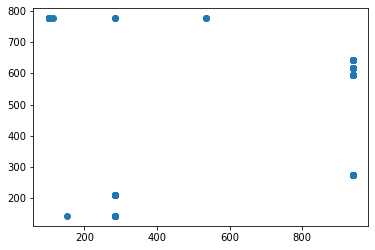

t+1 vs t-1219


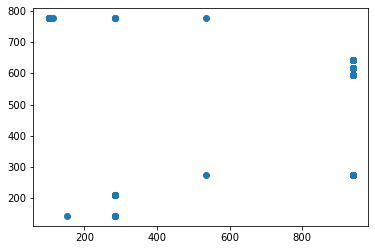

t+1 vs t-1220


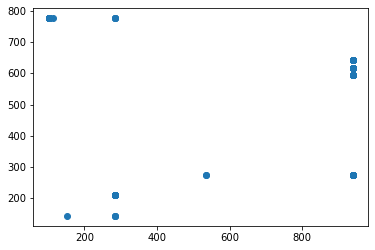

t+1 vs t-1221


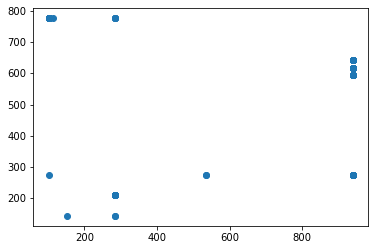

t+1 vs t-1222


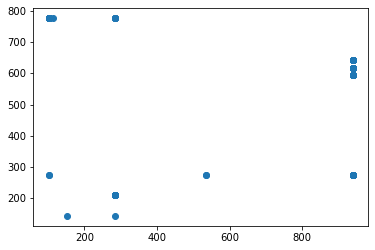

t+1 vs t-1223


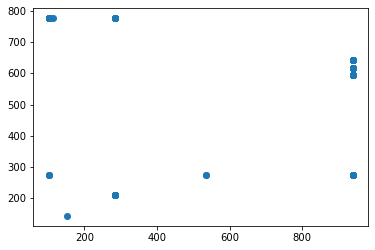

t+1 vs t-1224


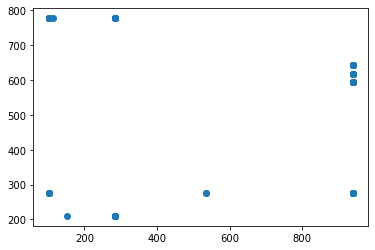

t+1 vs t-1225


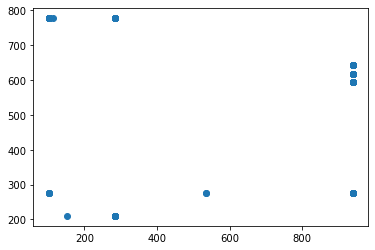

t+1 vs t-1226


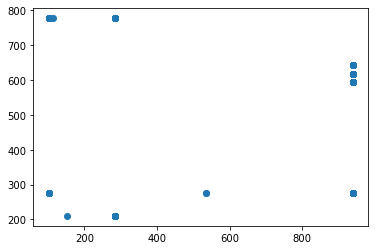

t+1 vs t-1227


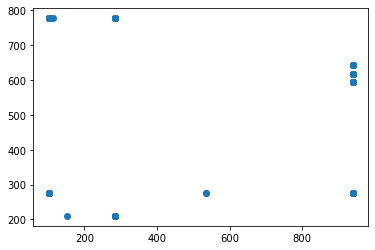

t+1 vs t-1228


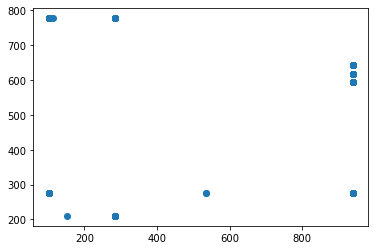

t+1 vs t-1229


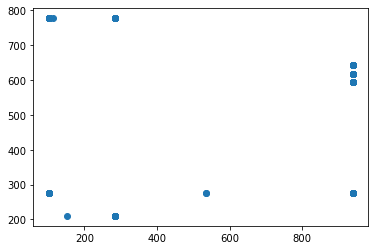

t+1 vs t-1230


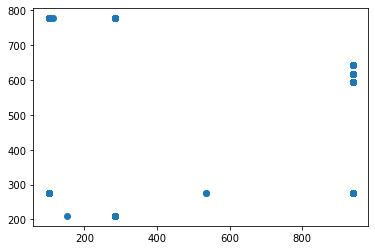

t+1 vs t-1231


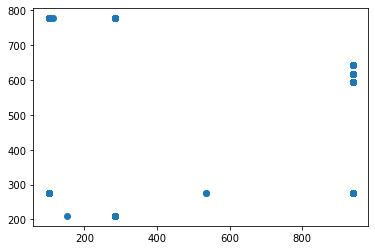

t+1 vs t-1232


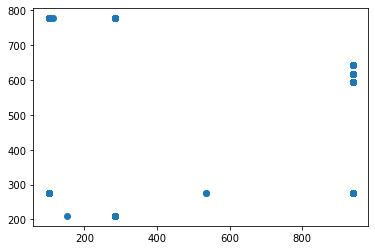

t+1 vs t-1233


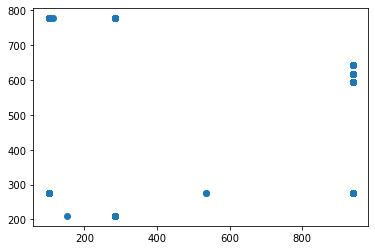

t+1 vs t-1234


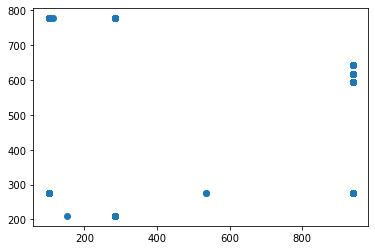

t+1 vs t-1235


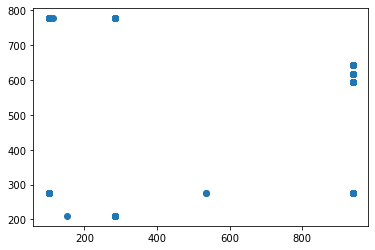

t+1 vs t-1236


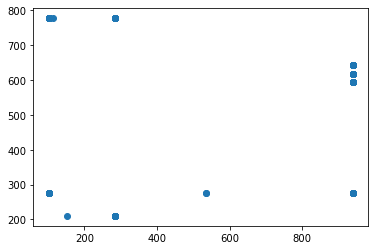

t+1 vs t-1237


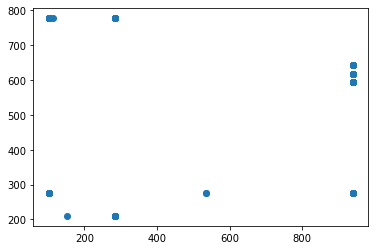

t+1 vs t-1238


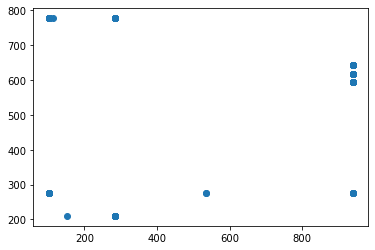

t+1 vs t-1239


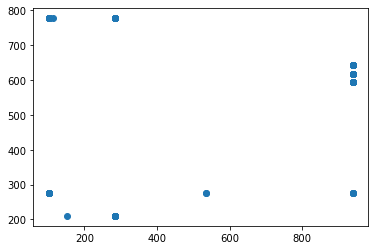

t+1 vs t-1240


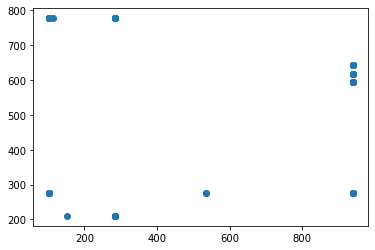

t+1 vs t-1241


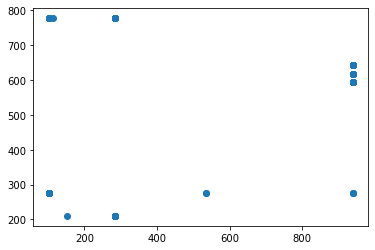

t+1 vs t-1242


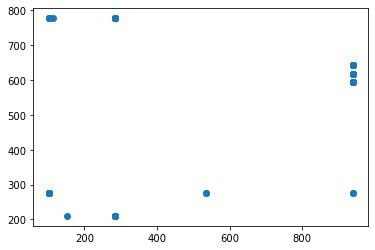

t+1 vs t-1243


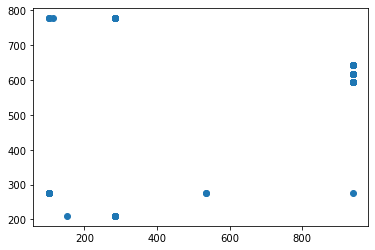

t+1 vs t-1244


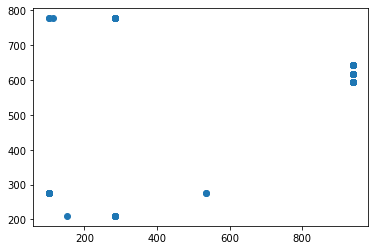

t+1 vs t-1245


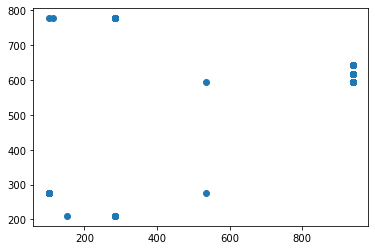

t+1 vs t-1246


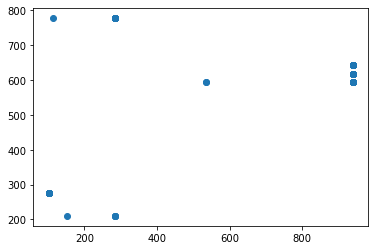

t+1 vs t-1247


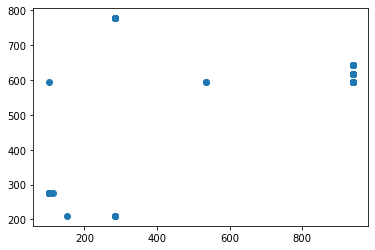

t+1 vs t-1248


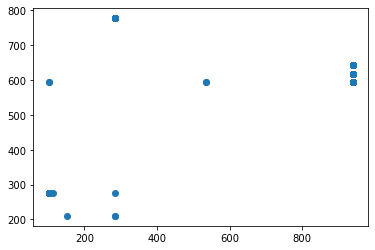

t+1 vs t-1249


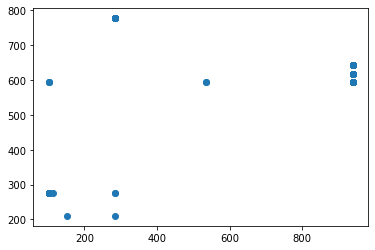

t+1 vs t-1250


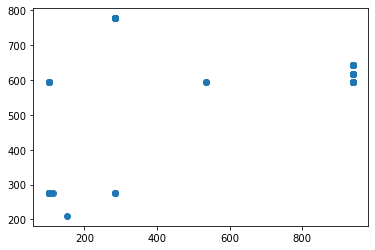

t+1 vs t-1251


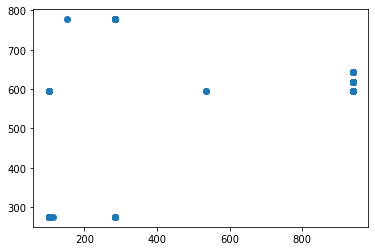

t+1 vs t-1252


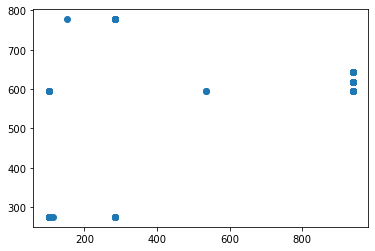

t+1 vs t-1253


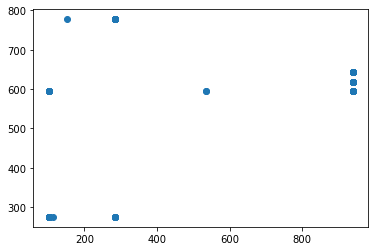

t+1 vs t-1254


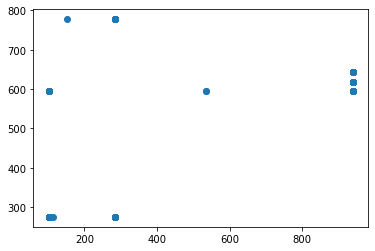

t+1 vs t-1255


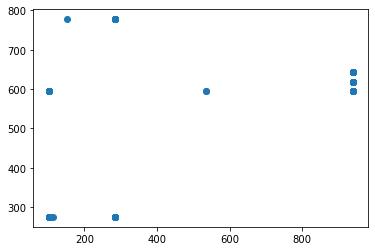

t+1 vs t-1256


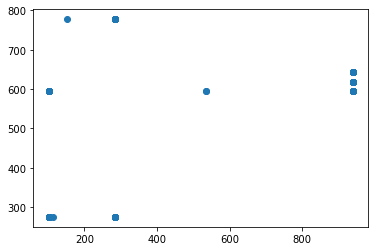

t+1 vs t-1257


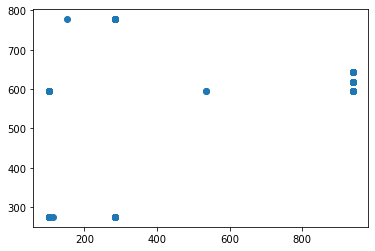

t+1 vs t-1258


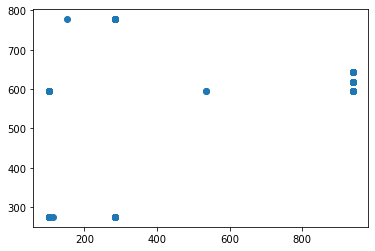

t+1 vs t-1259


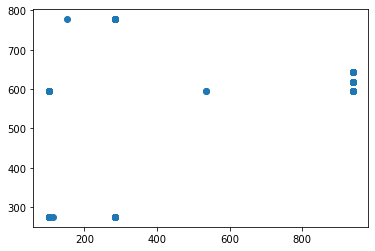

t+1 vs t-1260


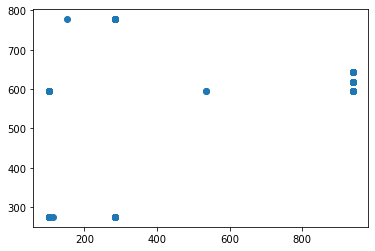

t+1 vs t-1261


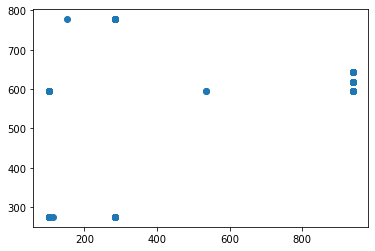

t+1 vs t-1262


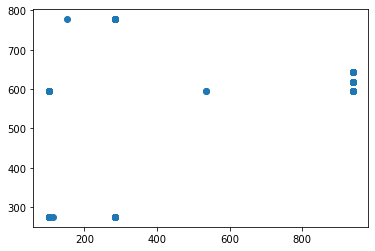

t+1 vs t-1263


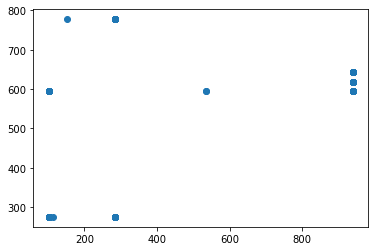

t+1 vs t-1264


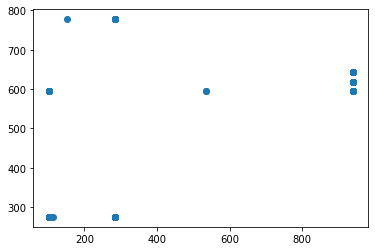

t+1 vs t-1265


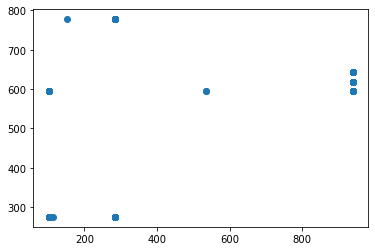

t+1 vs t-1266


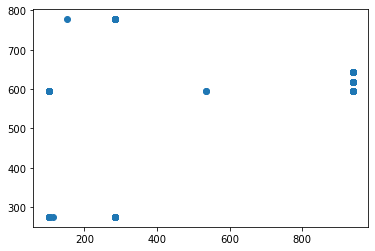

t+1 vs t-1267


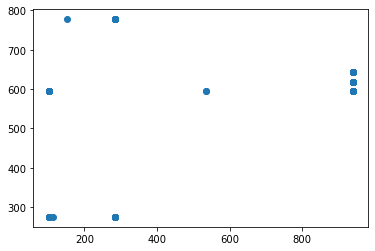

t+1 vs t-1268


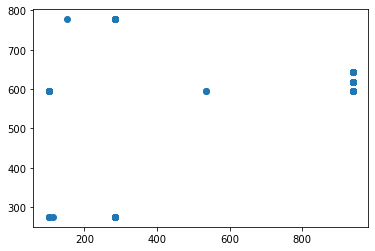

t+1 vs t-1269


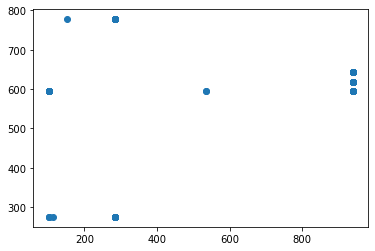

t+1 vs t-1270


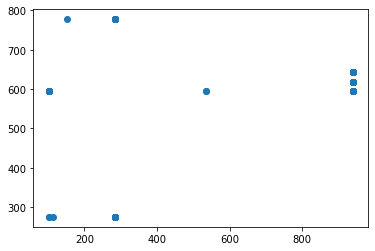

t+1 vs t-1271


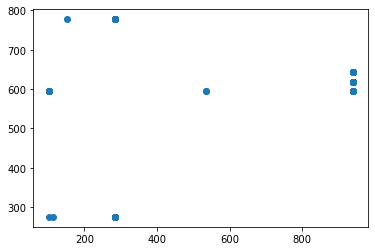

t+1 vs t-1272


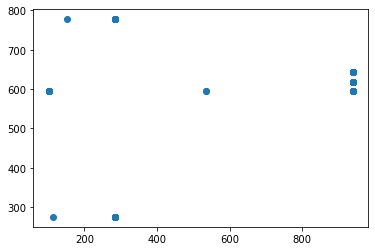

t+1 vs t-1273


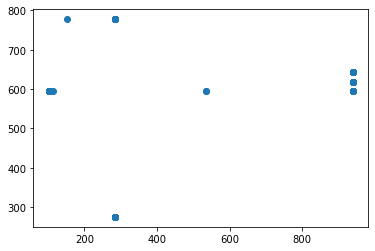

t+1 vs t-1274


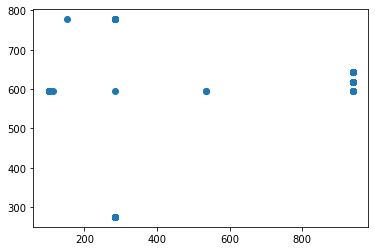

t+1 vs t-1275


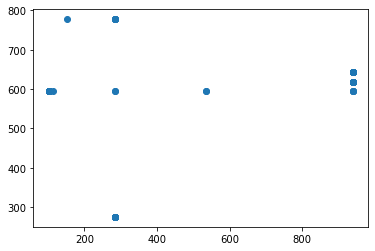

t+1 vs t-1276


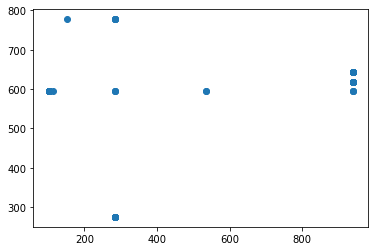

t+1 vs t-1277


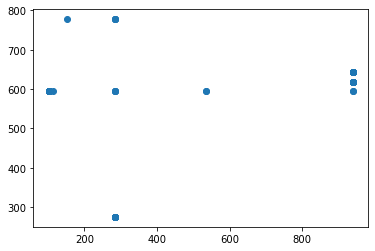

t+1 vs t-1278


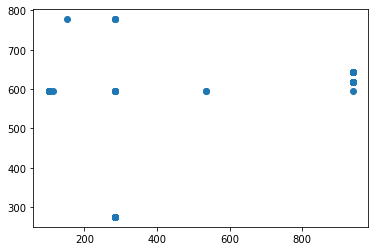

t+1 vs t-1279


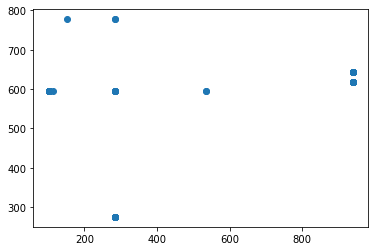

t+1 vs t-1280


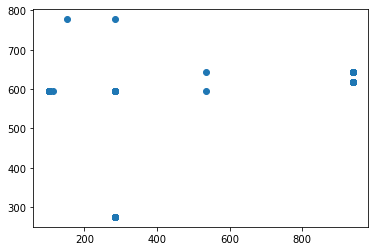

t+1 vs t-1281


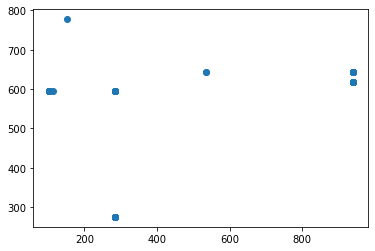

t+1 vs t-1282


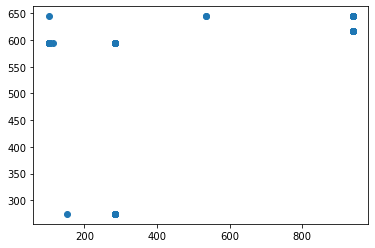

t+1 vs t-1283


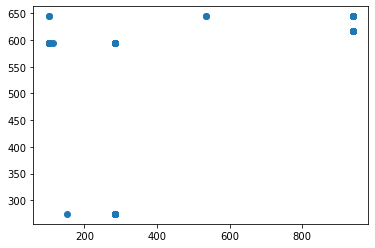

t+1 vs t-1284


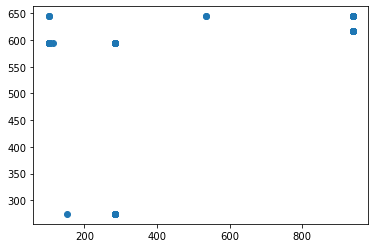

t+1 vs t-1285


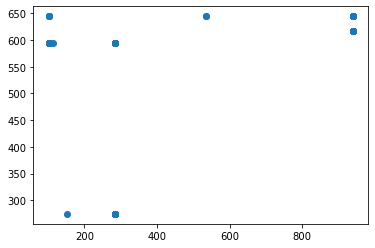

t+1 vs t-1286


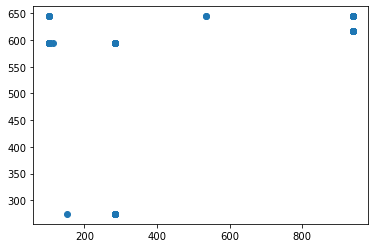

t+1 vs t-1287


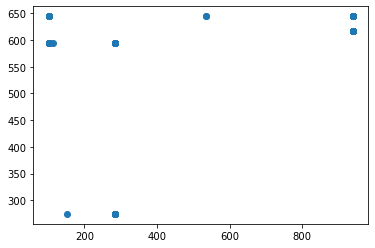

t+1 vs t-1288


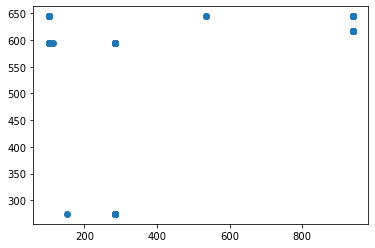

t+1 vs t-1289


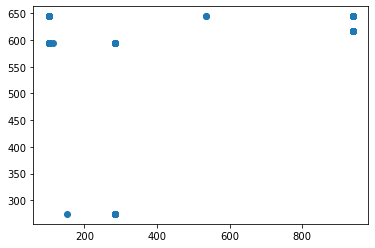

t+1 vs t-1290


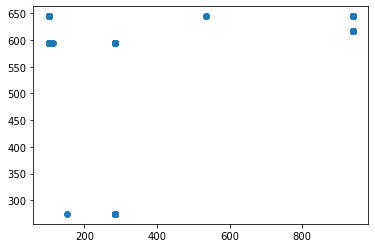

t+1 vs t-1291


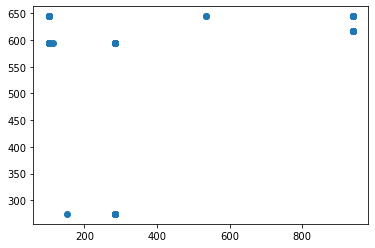

t+1 vs t-1292


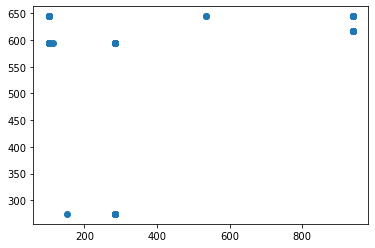

t+1 vs t-1293


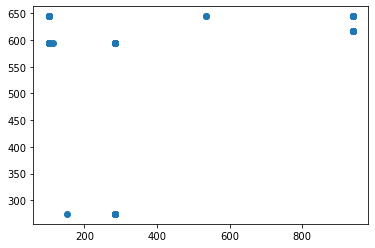

t+1 vs t-1294


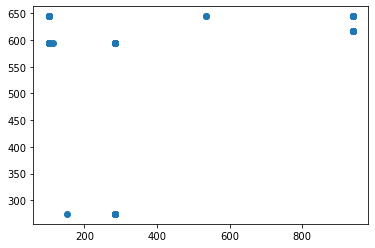

t+1 vs t-1295


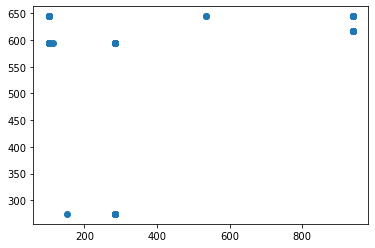

t+1 vs t-1296


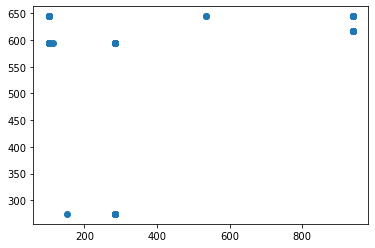

t+1 vs t-1297


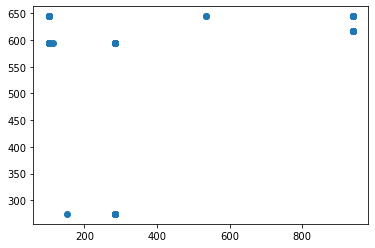

t+1 vs t-1298


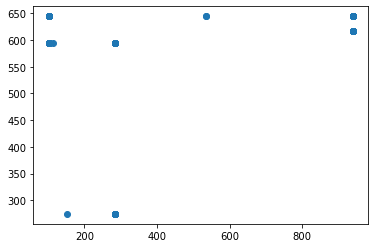

t+1 vs t-1299


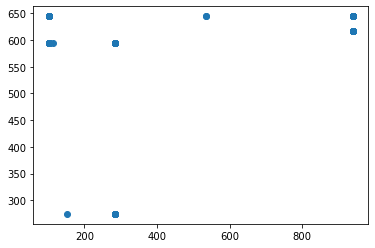

t+1 vs t-1300


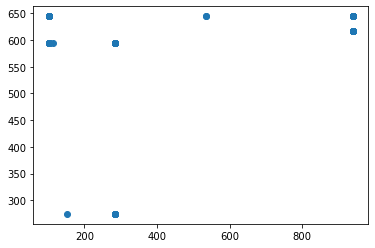

t+1 vs t-1301


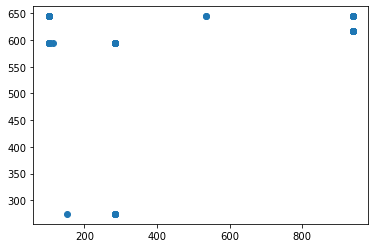

t+1 vs t-1302


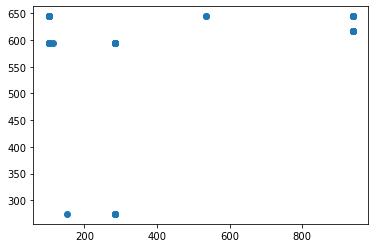

t+1 vs t-1303


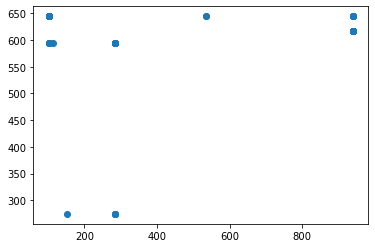

t+1 vs t-1304


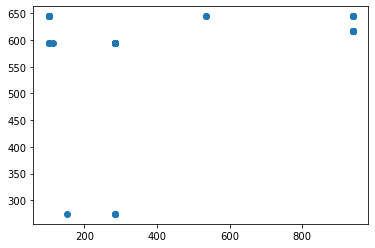

t+1 vs t-1305


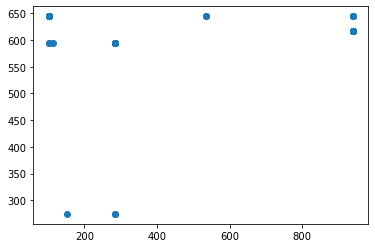

t+1 vs t-1306


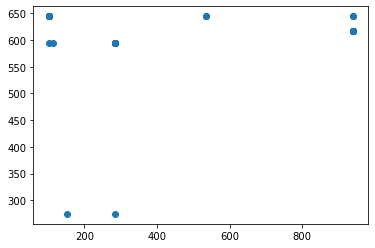

t+1 vs t-1307


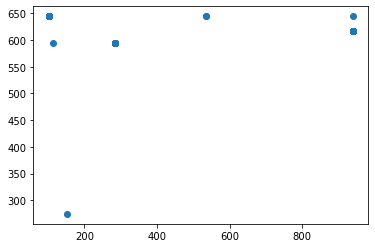

t+1 vs t-1308


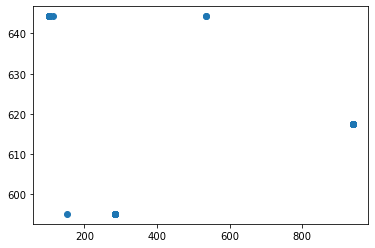

t+1 vs t-1309


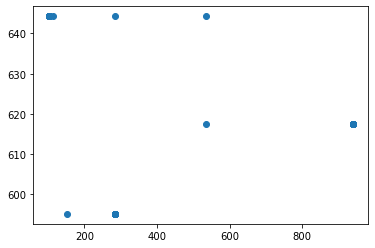

t+1 vs t-1310


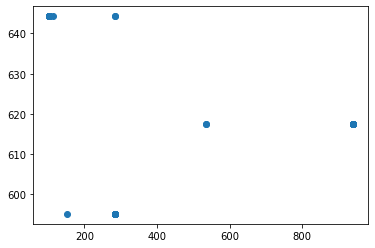

t+1 vs t-1311


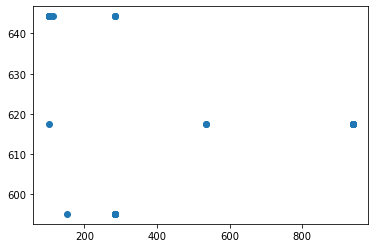

t+1 vs t-1312


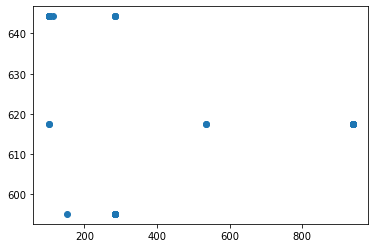

t+1 vs t-1313


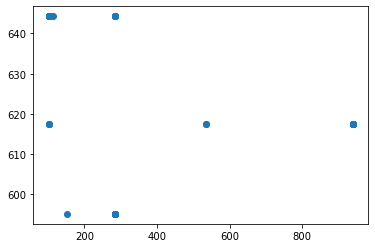

t+1 vs t-1314


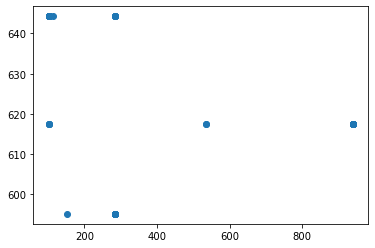

t+1 vs t-1315


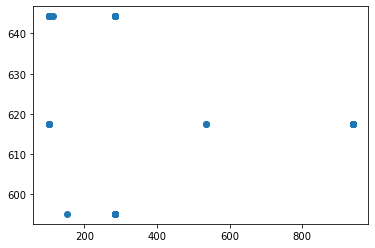

t+1 vs t-1316


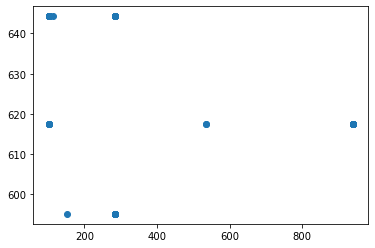

t+1 vs t-1317


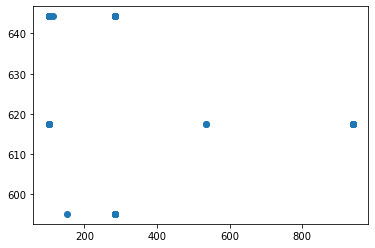

t+1 vs t-1318


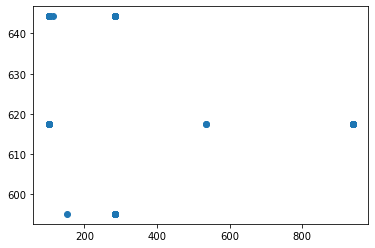

t+1 vs t-1319


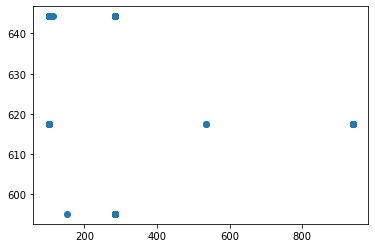

t+1 vs t-1320


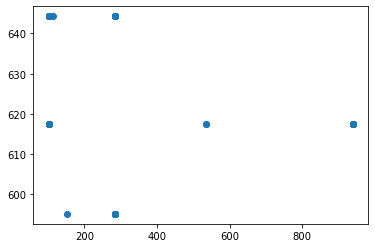

t+1 vs t-1321


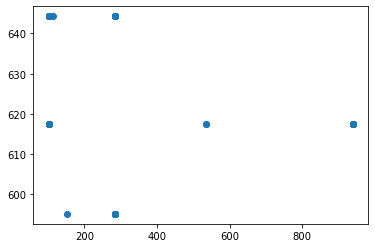

t+1 vs t-1322


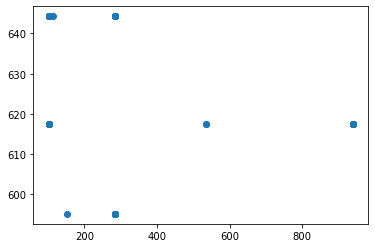

t+1 vs t-1323


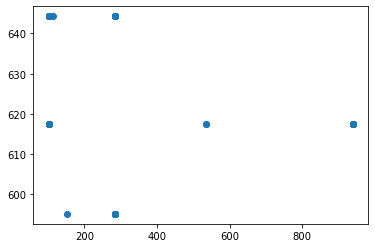

t+1 vs t-1324


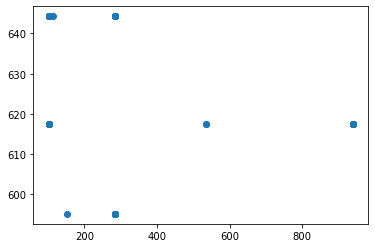

t+1 vs t-1325


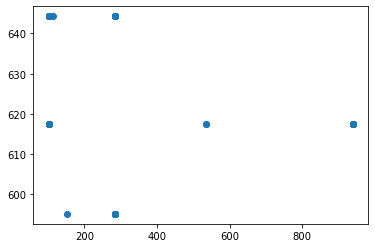

t+1 vs t-1326


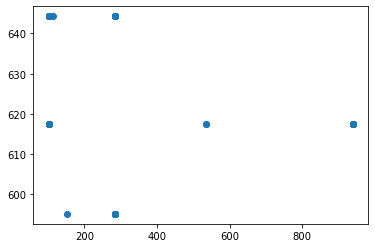

t+1 vs t-1327


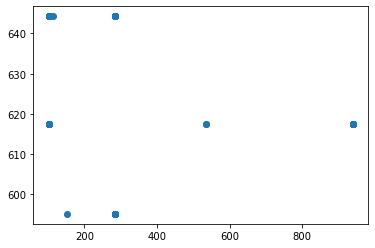

t+1 vs t-1328


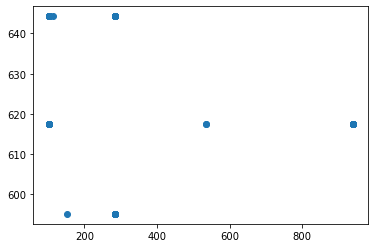

t+1 vs t-1329


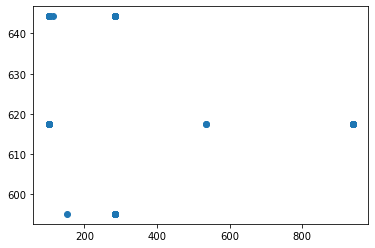

t+1 vs t-1330


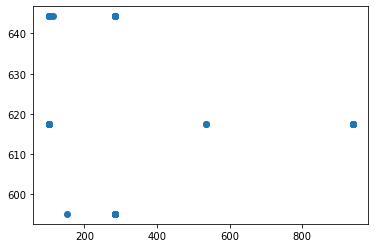

t+1 vs t-1331


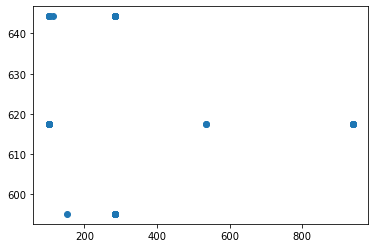

t+1 vs t-1332


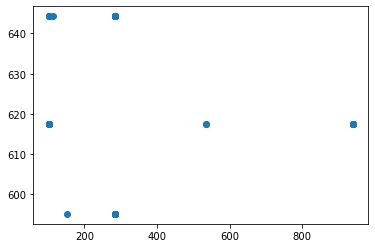

t+1 vs t-1333


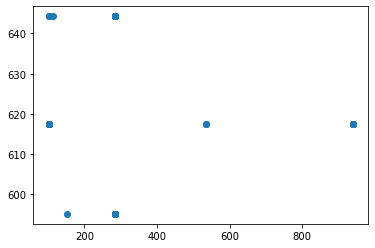

t+1 vs t-1334


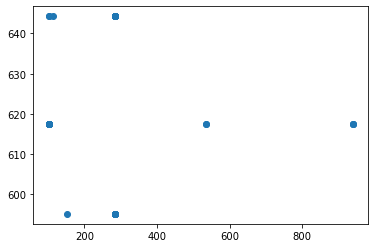

t+1 vs t-1335


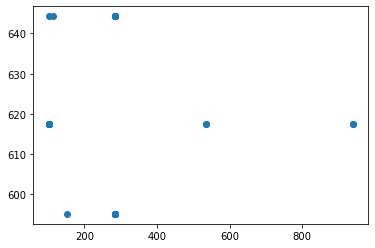

t+1 vs t-1336


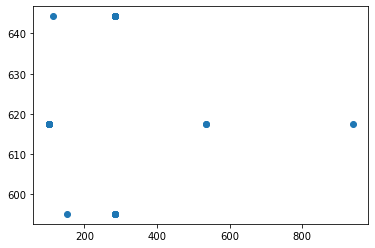

t+1 vs t-1337


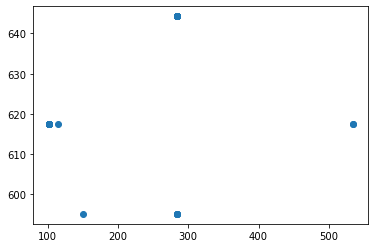

t+1 vs t-1338


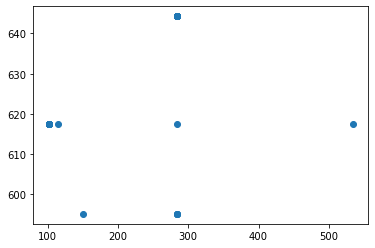

t+1 vs t-1339


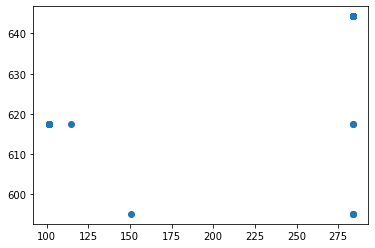

t+1 vs t-1340


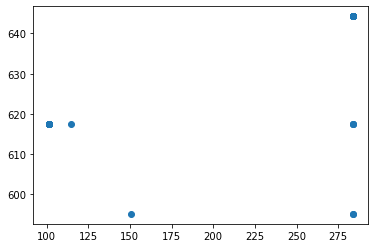

t+1 vs t-1341


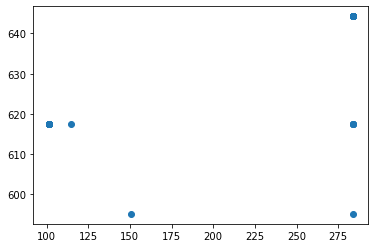

t+1 vs t-1342


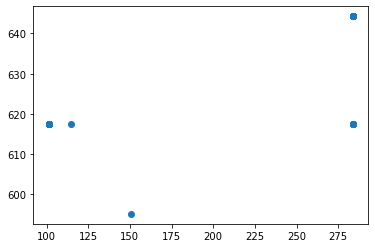

t+1 vs t-1343


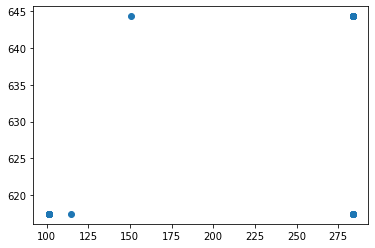

t+1 vs t-1344


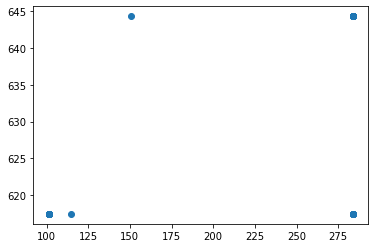

t+1 vs t-1345


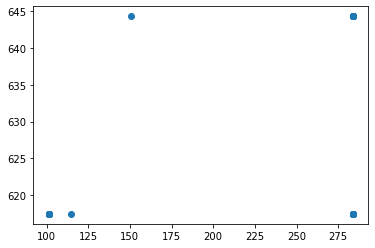

t+1 vs t-1346


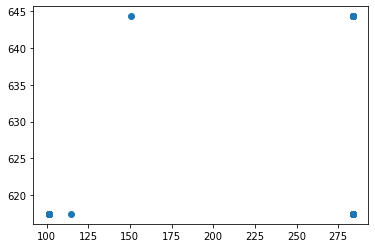

t+1 vs t-1347


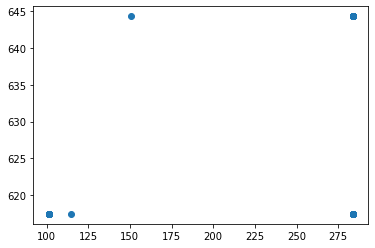

t+1 vs t-1348


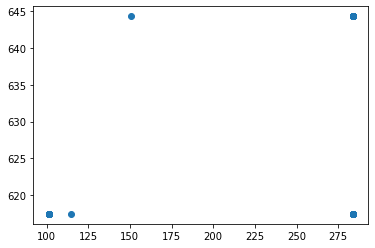

t+1 vs t-1349


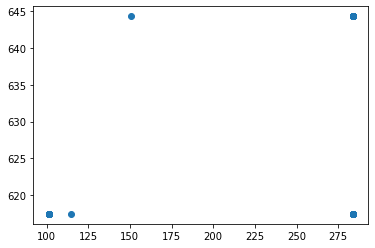

t+1 vs t-1350


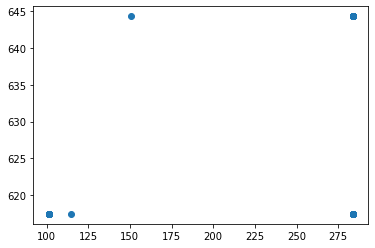

t+1 vs t-1351


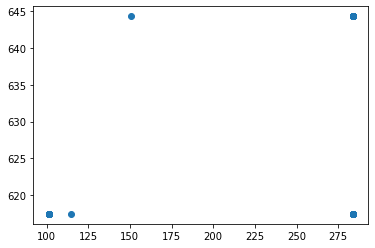

t+1 vs t-1352


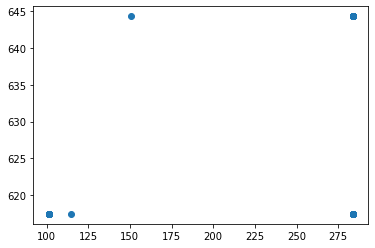

t+1 vs t-1353


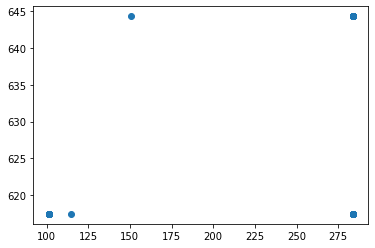

t+1 vs t-1354


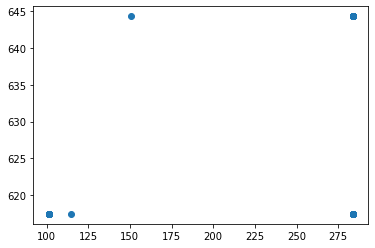

t+1 vs t-1355


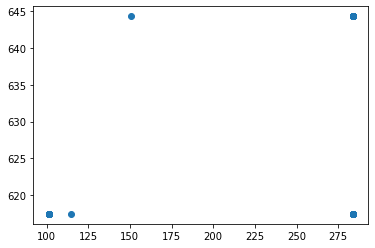

t+1 vs t-1356


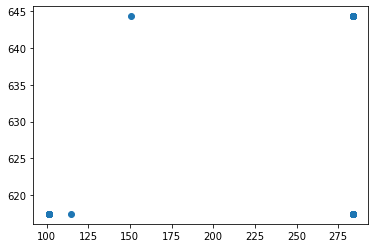

t+1 vs t-1357


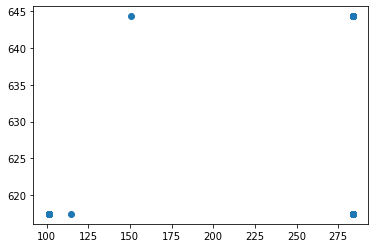

t+1 vs t-1358


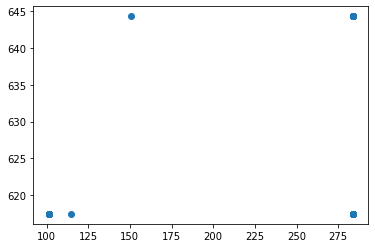

t+1 vs t-1359


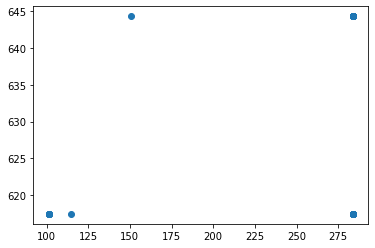

t+1 vs t-1360


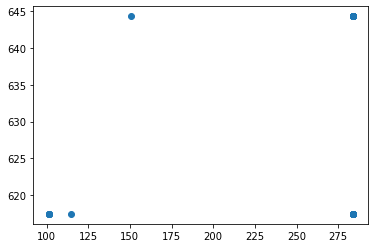

t+1 vs t-1361


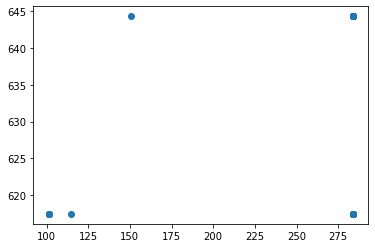

t+1 vs t-1362


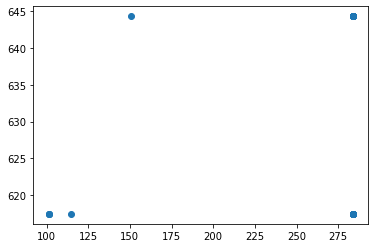

t+1 vs t-1363


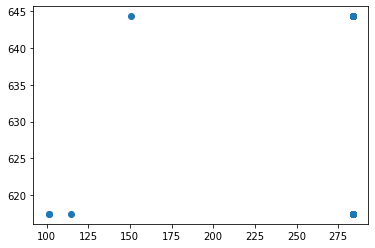

t+1 vs t-1364


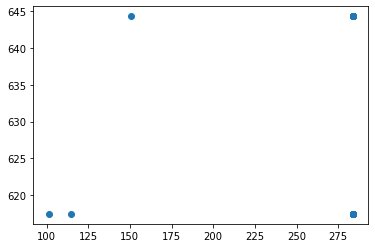

t+1 vs t-1365


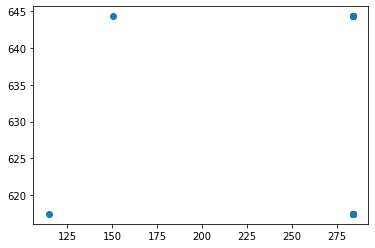

t+1 vs t-1366


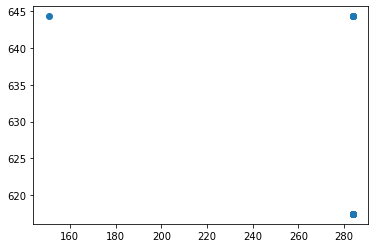

t+1 vs t-1367


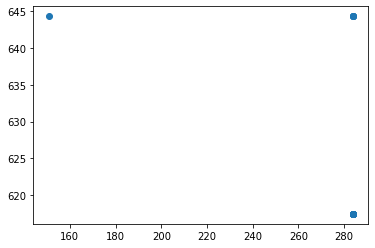

t+1 vs t-1368


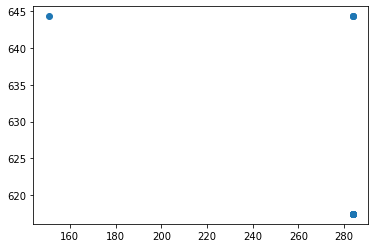

t+1 vs t-1369


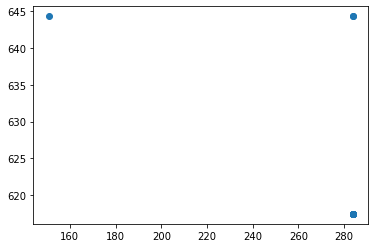

t+1 vs t-1370


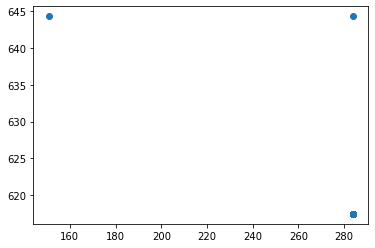

t+1 vs t-1371


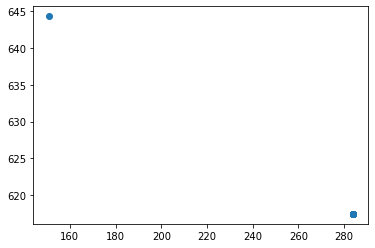

t+1 vs t-1372


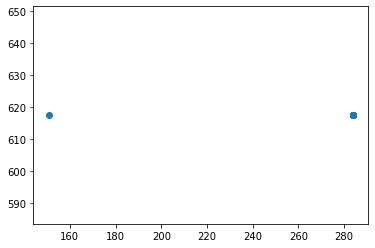

t+1 vs t-1373


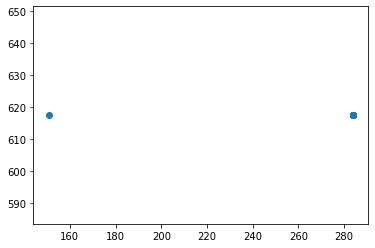

t+1 vs t-1374


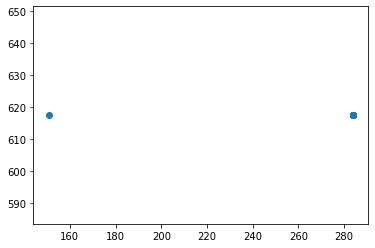

t+1 vs t-1375


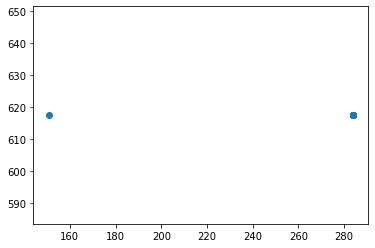

t+1 vs t-1376


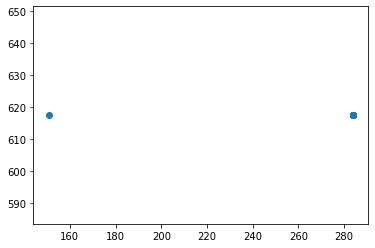

t+1 vs t-1377


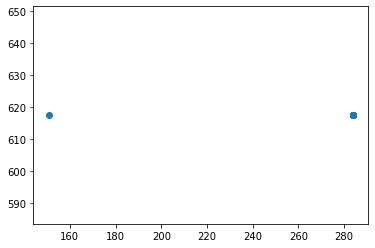

t+1 vs t-1378


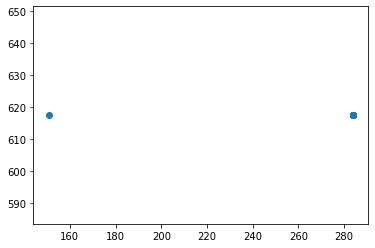

t+1 vs t-1379


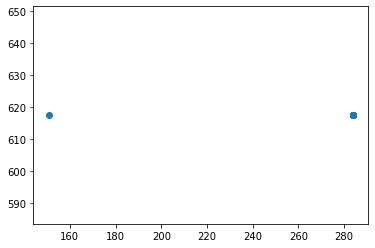

t+1 vs t-1380


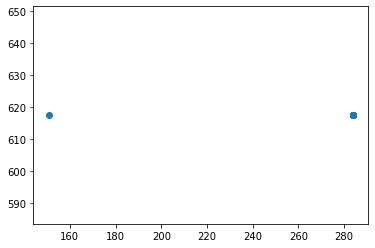

t+1 vs t-1381


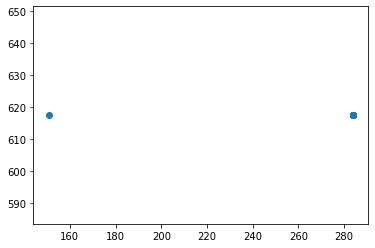

t+1 vs t-1382


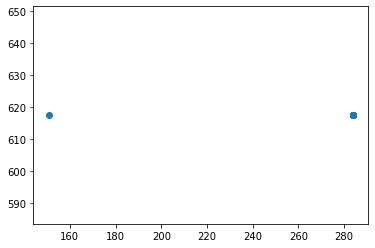

t+1 vs t-1383


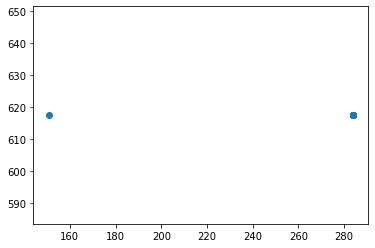

t+1 vs t-1384


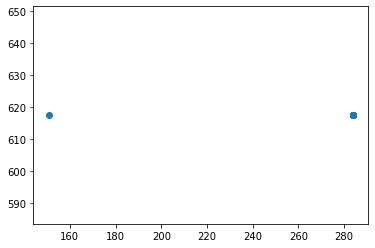

t+1 vs t-1385


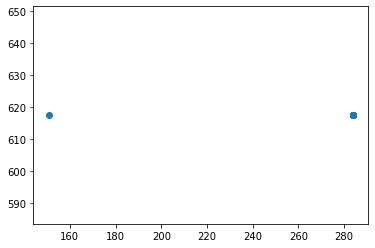

t+1 vs t-1386


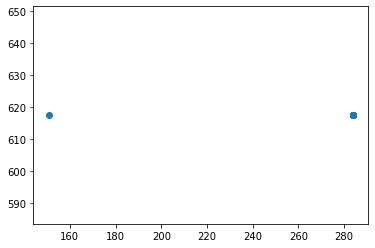

t+1 vs t-1387


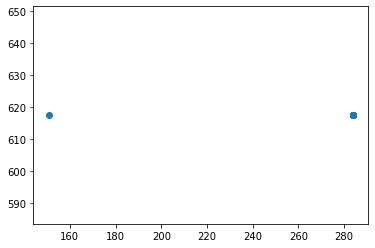

t+1 vs t-1388


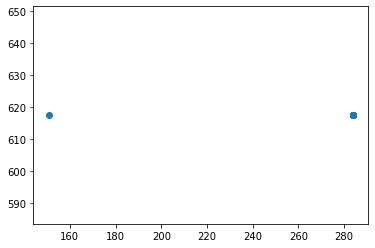

t+1 vs t-1389


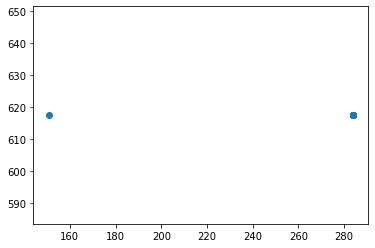

t+1 vs t-1390


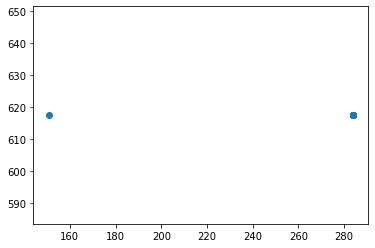

t+1 vs t-1391


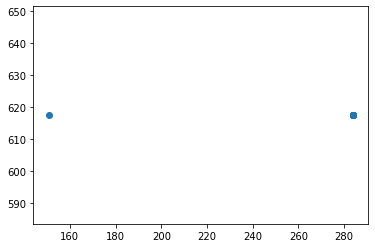

t+1 vs t-1392


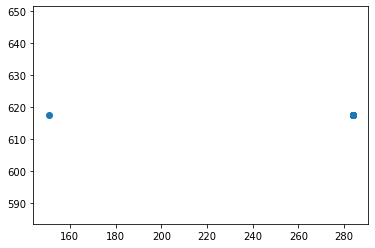

t+1 vs t-1393


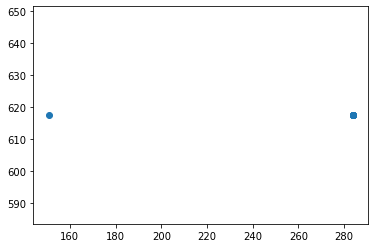

t+1 vs t-1394


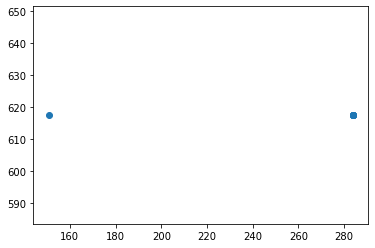

t+1 vs t-1395


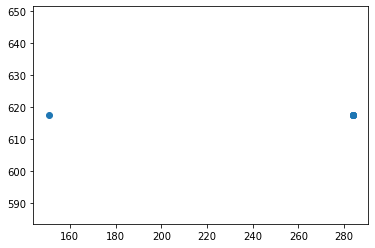

t+1 vs t-1396


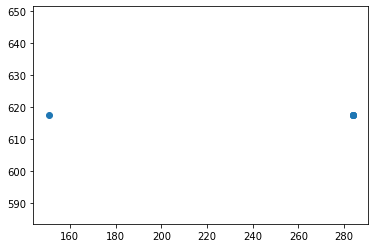

t+1 vs t-1397


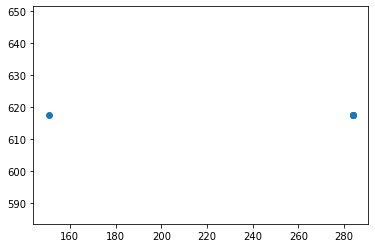

t+1 vs t-1398


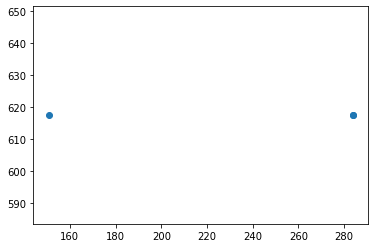

t+1 vs t-1399


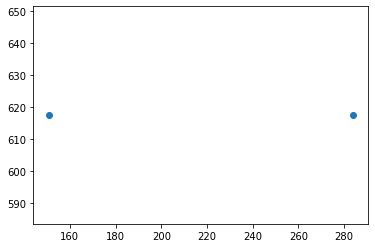

t+1 vs t-1400


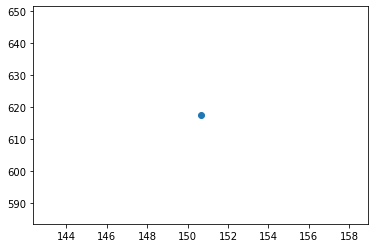

t+1 vs t-1401


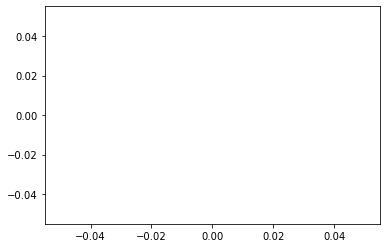

In [238]:
values = DataFrame(transacciones_126_importe_df.values)
lags = transacciones_126_importe_df.size
columns = [values]
for i in range(1,(lags + 1)):
	columns.append(values.shift(i))
dataframe = concat(columns, axis=1)
columns = ['t+1']
for i in range(1,(lags + 1)):
	columns.append('t-' + str(i))
dataframe.columns = columns
for i in range(1,(lags + 1)):
	print('t+1 vs t-' + str(i))
	pyplot.scatter(x=dataframe['t+1'].values, y=dataframe['t-'+str(i)].values)
	pyplot.show()

In [239]:
"""
se aprecia una correlacion aceptable entre y(t+1) e y(t-31)
"""

'\nse aprecia una correlacion aceptable entre y(t+1) e y(t-31)\n'

In [240]:
# 6. Time Series Autocorrelation Plots

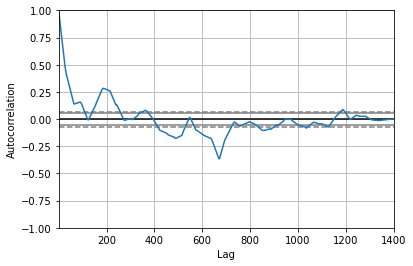

In [241]:
autocorrelation_plot(transacciones_126_importe_df)
pyplot.show()

In [242]:
"""
Como habiamos visto en los scatter plots anteriores. hay una fuerte correlacion (corr > 0.5) entre y(t+1) e y(t-31).

Pero ademas vemos que hay correlacion estadisticamente significativa con los lags 50 y 150 aprox. 400 y 550, y 575 y 700.

Es probable que esta serie temporal se pueda modelizar dignamente.
"""

'\nComo habiamos visto en los scatter plots anteriores. hay una fuerte correlacion (corr > 0.5) entre y(t+1) e y(t-31).\n\nPero ademas vemos que hay correlacion estadisticamente significativa con los lags 50 y 150 aprox. 400 y 550, y 575 y 700.\n\nEs probable que esta serie temporal se pueda modelizar dignamente.\n'

In [243]:
# procedemos a estimar la predicción de la serie temporal

In [244]:
# Forecast IMPORTE With Prophet

In [245]:
# Fit Prophet Model

In [246]:
df = transacciones_126_importe_df.copy()
df

,IMPORTE
2016-09-05,617.47
2016-09-06,617.47
2016-09-07,617.47
2016-09-08,617.47
2016-09-09,617.47
...,...
2020-07-02,283.81
2020-07-03,283.81
2020-07-04,283.81
2020-07-05,283.81


In [247]:
df['FECHA'] = df.index
df

,IMPORTE,FECHA
2016-09-05,617.47,2016-09-05
2016-09-06,617.47,2016-09-06
2016-09-07,617.47,2016-09-07
2016-09-08,617.47,2016-09-08
2016-09-09,617.47,2016-09-09
...,...,...
2020-07-02,283.81,2020-07-02
2020-07-03,283.81,2020-07-03
2020-07-04,283.81,2020-07-04
2020-07-05,283.81,2020-07-05


In [248]:
df = df[['FECHA', 'IMPORTE']]
df

,FECHA,IMPORTE
2016-09-05,2016-09-05,617.47
2016-09-06,2016-09-06,617.47
2016-09-07,2016-09-07,617.47
2016-09-08,2016-09-08,617.47
2016-09-09,2016-09-09,617.47
...,...,...
2020-07-02,2020-07-02,283.81
2020-07-03,2020-07-03,283.81
2020-07-04,2020-07-04,283.81
2020-07-05,2020-07-05,283.81


In [249]:
df.reset_index(drop=True, inplace=True)
df

,FECHA,IMPORTE
0,2016-09-05,617.47
1,2016-09-06,617.47
2,2016-09-07,617.47
3,2016-09-08,617.47
4,2016-09-09,617.47
...,...,...
1396,2020-07-02,283.81
1397,2020-07-03,283.81
1398,2020-07-04,283.81
1399,2020-07-05,283.81


In [250]:
# prepare expected column names
df.columns = ['ds', 'y']
df['ds'] = to_datetime(df['ds'])
df

,ds,y
0,2016-09-05,617.47
1,2016-09-06,617.47
2,2016-09-07,617.47
3,2016-09-08,617.47
4,2016-09-09,617.47
...,...,...
1396,2020-07-02,283.81
1397,2020-07-03,283.81
1398,2020-07-04,283.81
1399,2020-07-05,283.81


In [251]:
# A continuacion vamos a obtener un dataframe de train desde el 1er dia en que tenemos datos hasta el dia anterior
# a # 'current_date_str'
# y un dataframe de test desde 'current_date_str' hasta el ultimo dia en que tenemos datos.

In [252]:
limite_superior_train, = (df.index[df['ds'] == current_date_str])
limite_superior_train

1212

In [253]:
prophet_train_df = df.iloc[:limite_superior_train, :]
prophet_train_df

,ds,y
0,2016-09-05,617.47
1,2016-09-06,617.47
2,2016-09-07,617.47
3,2016-09-08,617.47
4,2016-09-09,617.47
...,...,...
1207,2019-12-26,939.62
1208,2019-12-27,939.62
1209,2019-12-28,939.62
1210,2019-12-29,939.62


In [254]:
prophet_test_df = df.iloc[limite_superior_train:,:]
prophet_test_df

,ds,y
1212,2019-12-31,939.62
1213,2020-01-01,939.62
1214,2020-01-02,939.62
1215,2020-01-03,939.62
1216,2020-01-04,939.62
...,...,...
1396,2020-07-02,283.81
1397,2020-07-03,283.81
1398,2020-07-04,283.81
1399,2020-07-05,283.81


In [255]:
# define the model
model = Prophet()
# fit the model
model.fit(prophet_train_df)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [256]:
# Make an In-Sample Forecast

In [287]:
# Make an In-Sample Forecast Vamos a hacer una predicción desde el 1er dia en que tenemos datos hasta el ultimo dia 
# del mes siguiente a current_date_str 

In [261]:
# esto no se ejecuta en produccion
current_date_obj

datetime.datetime(2019, 12, 31, 0, 0)

In [263]:
lim_sup_pred_obj = current_date_obj + dateutil.relativedelta.relativedelta(months=1)
lim_sup_pred_obj

datetime.datetime(2020, 1, 31, 0, 0)

In [264]:
# calculo el ultimo dia del mes obj para hacer la predicción del mes entero posterior a la fecha de petición
lim_sup_pred_str = str(lim_sup_pred_obj.year) + '-' + str(lim_sup_pred_obj.month) + '-' + \
                   str(calendar.monthrange(lim_sup_pred_obj.year, lim_sup_pred_obj.month)[1])

lim_sup_pred_str

'2020-1-31'

In [266]:
lim_sup_pred_obj = datetime.strptime(lim_sup_pred_str, '%Y-%m-%d')
lim_sup_pred_obj

datetime.datetime(2020, 1, 31, 0, 0)

In [268]:
idx = date_range(start=transacciones_126_importe_df.index.min(), end=lim_sup_pred_obj)
idx

DatetimeIndex(['2016-09-05', '2016-09-06', '2016-09-07', '2016-09-08',
               '2016-09-09', '2016-09-10', '2016-09-11', '2016-09-12',
               '2016-09-13', '2016-09-14',
               ...
               '2020-01-22', '2020-01-23', '2020-01-24', '2020-01-25',
               '2020-01-26', '2020-01-27', '2020-01-28', '2020-01-29',
               '2020-01-30', '2020-01-31'],
              dtype='datetime64[ns]', length=1244, freq='D')

In [269]:
prophet_pred_df = DataFrame(idx)
prophet_pred_df

,0
0,2016-09-05
1,2016-09-06
2,2016-09-07
3,2016-09-08
4,2016-09-09
...,...
1239,2020-01-27
1240,2020-01-28
1241,2020-01-29
1242,2020-01-30


In [270]:
prophet_pred_df.columns = ['ds']
prophet_pred_df

,ds
0,2016-09-05
1,2016-09-06
2,2016-09-07
3,2016-09-08
4,2016-09-09
...,...
1239,2020-01-27
1240,2020-01-28
1241,2020-01-29
1242,2020-01-30


In [271]:
# esto no ira en produccion
prophet_pred_df.dtypes

ds    datetime64[ns]
dtype: object

In [272]:
# esto no ira en produccion
# por si acaso convierto la columna ds a tipo datetime aunque ya lo era como vimos en celda anterior y veremos en celda
# siguiente
prophet_pred_df['ds'] = to_datetime(prophet_pred_df['ds'])
prophet_pred_df

,ds
0,2016-09-05
1,2016-09-06
2,2016-09-07
3,2016-09-08
4,2016-09-09
...,...
1239,2020-01-27
1240,2020-01-28
1241,2020-01-29
1242,2020-01-30


In [273]:
# esto no ira en produccion
prophet_pred_df.dtypes

ds    datetime64[ns]
dtype: object

In [274]:
# use the model to make a forecast
forecast_df = model.predict(prophet_pred_df)

In [275]:
# esto no ira en produccion
forecast_df.shape

(1244, 19)

In [276]:
# esto no ira en produccion
# summarize the forecast
print(forecast_df[['ds', 'yhat', 'yhat_lower', 'yhat_upper']])

             ds        yhat  yhat_lower   yhat_upper
0    2016-09-05  676.941212  475.157310   869.452940
1    2016-09-06  682.375777  470.039418   886.481085
2    2016-09-07  677.068540  477.038049   872.446547
3    2016-09-08  670.661948  477.457926   878.154826
4    2016-09-09  671.939777  462.829560   874.413736
...         ...         ...         ...          ...
1239 2020-01-27  862.735571  659.330125  1061.773008
1240 2020-01-28  854.020958  648.762685  1048.360195
1241 2020-01-29  833.907171  623.260307  1033.940099
1242 2020-01-30  812.304050  602.628742  1014.767546
1243 2020-01-31  798.269116  593.492944   996.162328

[1244 rows x 4 columns]


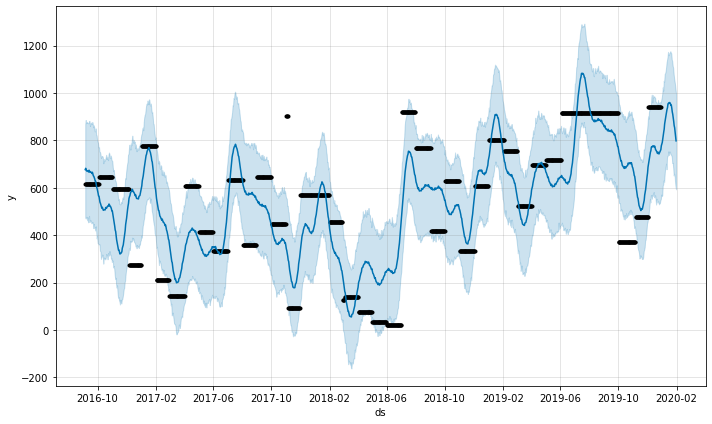

In [277]:
# esto no ira en produccion
# plot forecast
model.plot(forecast_df)
pyplot.show()

In [279]:
prediccion_recibo, = forecast_df.loc[forecast_df['ds'] == stat_mode_obj]['yhat']
prediccion_recibo

791.4453801767372

In [281]:
# if para decidir si genero aviso utilizando la prediccion de prophet
aviso = False

if num_recibos > 0:
    print("Te van a pasar el próximo recibo de la liquidación de la tarjeta aproximadamente el: " + stat_mode_str)
    print("El valor estimado del importe del recibo es de: " + str(5*round(prediccion_recibo/5)) + ' eur')
    aviso = True
else:
    aviso = False

print('Aviso: ' + str(aviso))

Te van a pasar el próximo recibo de la liquidación de la tarjeta aproximadamente el: 2020-1-2
El valor estimado del importe del recibo es de: 790 eur
Aviso: True


In [282]:
!python -V

Python 3.8.10


In [283]:
!pip3 list

Package                            Version
---------------------------------- -------------------
absl-py                            0.12.0
aiohttp                            3.7.4
alabaster                          0.7.12
anaconda-client                    1.7.2
anaconda-navigator                 2.0.3
anaconda-project                   0.10.0
anyio                              2.2.0
AnyQt                              0.0.13
argh                               0.26.2
argon2-cffi                        20.1.0
arviz                              0.11.2
asn1crypto                         1.4.0
astor                              0.8.1
astroid                            2.5
astropy                            4.2.1
astunparse                         1.6.3
async-generator                    1.10
async-timeout                      3.0.1
atomicwrites                       1.4.0
attrs                              21.2.0
autopep8                           1.5.6
Babel                              2

tensorboard                        2.5.0
tensorboard-data-server            0.6.1
tensorboard-plugin-wit             1.6.0
tensorflow                         2.3.0
tensorflow-estimator               2.5.0
tensorflow-gpu                     2.5.0
termcolor                          1.1.0
terminado                          0.9.4
testpath                           0.4.4
Theano                             1.0.4
threadpoolctl                      2.1.0
tifffile                           2021.4.8
toml                               0.10.2
toolz                              0.11.1
tornado                            6.1
tqdm                               4.59.0
traitlets                          5.0.5
typing-extensions                  3.7.4.3
ujson                              4.0.2
unicodecsv                         0.14.1
urllib3                            1.26.4
vispy                              0.6.6
watchdog                           2.1.1
wcwidth                            0.2.5
webencod

In [284]:
!pip3 freeze

absl-py @ file:///C:/ci/absl-py_1615411229697/work
aiohttp @ file:///C:/ci/aiohttp_1614361024229/work
alabaster @ file:///home/ktietz/src/ci/alabaster_1611921544520/work
anaconda-client==1.7.2
anaconda-navigator==2.0.3
anaconda-project @ file:///tmp/build/80754af9/anaconda-project_1621348054992/work
anyio @ file:///C:/ci/anyio_1620153418380/work/dist
AnyQt @ file:///home/conda/feedstock_root/build_artifacts/anyqt_1620306236038/work
argh==0.26.2
argon2-cffi @ file:///C:/ci/argon2-cffi_1613037959010/work
arviz @ file:///tmp/build/80754af9/arviz_1614019183254/work
asn1crypto @ file:///tmp/build/80754af9/asn1crypto_1596577642040/work
astor==0.8.1
astroid @ file:///C:/ci/astroid_1613501047216/work
astropy @ file:///C:/ci/astropy_1617745647203/work
astunparse==1.6.3
async-generator @ file:///home/ktietz/src/ci/async_generator_1611927993394/work
async-timeout==3.0.1
atomicwrites==1.4.0
attrs @ file:///tmp/build/80754af9/attrs_1620827162558/work
autopep8 @ file:///tmp/build/80754af9/autopep8_1

In [285]:
!pip3 freeze > requirements_20210616_126_liquidacion_tarjeta_prophet_ide.txt